### Importing Dependencies

In [1]:
import spacy
import nltk
import pandas as pd

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
import re, string
from nltk.corpus import stopwords
import numpy as np
from math import floor

# Import plotting libraries
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
#nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
import contractions

from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')
vader = SentimentIntensityAnalyzer()
nltk.download('averaged_perceptron_tagger')
from textblob import TextBlob
import numpy as np
from plotnine import *

%matplotlib inline
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\s_sad\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\s_sad\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\s_sad\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\s_sad\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\s_sad\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [2]:
# Reading Dataset
df = pd.read_csv(r"C:\Users\s_sad\Final Project\3_months_twitter_data.csv")

### Data Exploration

In [3]:
df.info() # check number and type of variables

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45500 entries, 0 to 45499
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   _type             45500 non-null  object 
 1   url               45500 non-null  object 
 2   date              45500 non-null  object 
 3   rawContent        45500 non-null  object 
 4   renderedContent   45500 non-null  object 
 5   id                45500 non-null  int64  
 6   user              45500 non-null  object 
 7   replyCount        45500 non-null  int64  
 8   retweetCount      45500 non-null  int64  
 9   likeCount         45500 non-null  int64  
 10  quoteCount        45500 non-null  int64  
 11  conversationId    45500 non-null  int64  
 12  lang              45500 non-null  object 
 13  source            45500 non-null  object 
 14  sourceUrl         45500 non-null  object 
 15  sourceLabel       45500 non-null  object 
 16  links             7560 non-null   object

In [4]:
# removing useless columns
df = df.drop(['_type','links', 'media','retweetedTweet','quotedTweet','inReplyToTweetId','inReplyToUser','mentionedUsers','coordinates',
             'place','hashtags','cashtags','card','sourceUrl'], axis=1)

In [5]:
# changing format of date column
df['date'] = pd.to_datetime(df['date'])
df['date'] = (df['date']).dt.date

In [6]:
#creating new dataset in order to do sentiment analysis
renderedContent = df.loc[:, "renderedContent"].values
date = df.loc[: , "date"].values
renderedContent

array(["@Eviltrkeyslice @thetimes Either way, I think you're *vastly* overestimating Tesla's ability to deliver.\n\nI mean, they can't seem to make *cars* that work reliably or that don't break under weirdly common circumstances.\n\nSo I think we're gonna be alright.",
       '@Tesla @elonmusk @nadyariot do you find this problematic?',
       '@TrungTPhan Not sure if this or the Tesla AI robot is less of a let down by the end of the video.',
       ...,
       "Barron's Top Weekend Stock Picks: Tesla, Bed Bath &amp; Beyond, Six Flags And Signs Bitcoin Whales Are Buying The Dip ... - Benzinga dlvr.it/SgCHTx",
       '@cb_doge @elonmusk @mayemusk @Tesla @SpaceX It certainly seems that way. I certainly respect Musk a lot more for how he puts his money where his mouth is than someone like Joe Biden who sells out the U.S. and American citizens or Elizabeth Warren and Santos who lie about their heritage for personal gain.',
       'Does every Audi with duct tape on it have a loud muffler?'],

In [7]:
df['date'] = pd.to_datetime(df['date']) # changing data type of date to datetime

In [8]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Line(x=df['date'], y=df['quoteCount']),
    row=1, col=1
)

fig.add_trace(
    go.Line(x=df['date'], y=df['retweetCount']),
    row=1, col=2
)

fig.update_layout(height=800, width=1000, title_text="Quote Count & Retweet Count")
fig.show()


C:\ProgramData\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




As we can see there are two outliers, one tweet that has been retweeted and liked exceptionally on 06-10-22 and 12-11-2022. They are tweets by Elon musk, one about production of Tesla Semi Truck and second about Home office policy.

In [9]:
text_df = pd.DataFrame({'tweet': renderedContent, 'date': date})
text_df.head(5)

,tweet,date
0,"@Eviltrkeyslice @thetimes Either way, I think ...",2022-10-01
1,@Tesla @elonmusk @nadyariot do you find this p...,2022-10-01
2,@TrungTPhan Not sure if this or the Tesla AI r...,2022-10-01
3,@TraderNatty @NokianTyresNA @teslaownersmi @PJ...,2022-10-01
4,"Elon Musk claims Tesla Cybertruck is both, tru...",2022-10-01


### Word Cloud

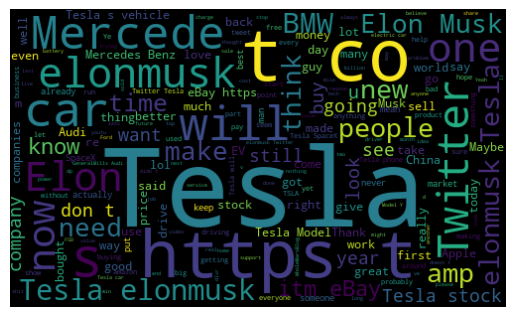

In [11]:
# Word cloud visualization (raw visulization)
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt

allWords = ' '.join([twts for twts in text_df['tweet']])
wordCloud = WordCloud(width=500, height=300, random_state=21, max_font_size=110).generate(allWords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

its visible from Cloud that our datapoints are mostly about Tesla(big and thick name of Tesla), secondly there are a lot of irrelavant words, we will try to remove them

In [80]:
# Creating new column Namely brand in order to do deep analysis
text_df.loc[text_df['tweet'].str.contains("mercedes"),'brand'] = 'mercedes'
text_df.loc[text_df['tweet'].str.contains("bmw"),'brand'] = 'bmw'
text_df.loc[text_df['tweet'].str.contains("audi"),'brand'] = 'audi'
text_df.loc[text_df['tweet'].str.contains("tesl"),'brand'] = 'tesla'
text_df.loc[text_df['tweet'].str.contains("elon"),'brand'] = 'tesla'
text_df.loc[text_df['tweet'].str.contains("musk"),'brand'] = 'tesla'
text_df

,tweet,date,brand,sentiment_score,sentiment,quote_count,like_count,retweet_count,month
0,either way think youre vastly overestimate tes...,2022-10-01,tesla,0.6355,Positive,0,8,0,10
1,find problematic,2022-10-01,tesla,-0.4404,Negative,0,0,0,10
2,sure tesla ai robot less let end video,2022-10-01,tesla,0.3182,Positive,1,13,0,10
3,may well youd hard press see consequence base ...,2022-10-01,tesla,0.1779,Positive,0,1,0,10
4,claim tesla cybertruck truck boat heres hemean...,2022-10-01,tesla,0.0000,Neutral,0,0,0,10
...,...,...,...,...,...,...,...,...,...
45495,totally agree though dont think amount marketi...,2022-12-31,bmw,0.6697,Positive,0,1,0,12
45496,thedr tesla lose billion market capitalization...,2022-12-31,tesla,-0.4019,Negative,0,1,0,12
45497,barrons top weekend stock pick tesla bed bath ...,2022-12-31,tesla,0.2023,Positive,0,0,0,12
45498,doge certainly seem way certainly respect lot ...,2022-12-31,tesla,0.9153,Positive,0,0,0,12


### Data Cleaning and Preprocessing

In [13]:
# function for removing emojis
def remove_emojis(data):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', data)

# function for removing URLs
def remove_urls (vTEXT):
    vTEXT = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', vTEXT, flags=re.MULTILINE)

def clean(text):
    text = text.replace('RT', ' ') #get rid of RTs
    text = re.sub('(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)','',text)
    text = text.lower().strip() #removes upper case and leading and trailing whitespaces
    text = re.compile('<.*?>').sub('', text) #removing inside of tags <>
    text = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', text) #strip punctuation from string
    text = re.compile('https?://S+|www.S+').sub('', text) #removing URLs
    text = re.sub('\s+', ' ', text) #replacing double space with single space
    text = re.sub(r'\[[0-9]*\]',' ', text)  #replacing any number by a single space
    text = re.sub(r'\d',' ', text) #get rid of decimal digits
    text = re.sub(r'\s+',' ', text) #get rid of duplicate whitespaces
    return text

# function for spelling correction
def correct_spelling(text):
    text = str(TextBlob(text))
    return text

def get_wordnet_pos(treebank_tag):

    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    
def lemmatization(text):
    tokens = word_tokenize(text) #tokenizing
    word_and_tag = nltk.pos_tag(tokens)
    lemmatizer = WordNetLemmatizer()
    lemmatized = [lemmatizer.lemmatize(pair[0], pos=get_wordnet_pos(pair[1])) for pair in word_and_tag]
    return ' '.join(lemmatized)
    

In [14]:
text_df['tweet'] = text_df['tweet'].apply(lambda x:remove_emojis (x))

In [15]:
text_df['tweet'] = text_df['tweet'].apply(lambda x: clean(x))

In [16]:
text_df['tweet'] = text_df['tweet'].apply(lambda x: correct_spelling(x))

In [17]:
stop = stopwords.words('english')
text_df['tweet'] = text_df['tweet'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [18]:
text_df['tweet'] = text_df['tweet'].apply(lambda x: lemmatization(x))

In [19]:
text_df.tweet # checing clean data

0        either way think youre vastly overestimate tes...
1                                         find problematic
2                   sure tesla ai robot less let end video
3        may well youd hard press see consequence base ...
4        elon musk claim tesla cybertruck truck boat he...
                               ...                        
45495    totally agree though dont think amount marketi...
45496    thedr tesla lose billion market capitalization...
45497    barrons top weekend stock pick tesla bed bath ...
45498    doge certainly seem way certainly respect musk...
45499                    every audi duct tape loud muffler
Name: tweet, Length: 45500, dtype: object

### Vadar Polarity Scores 

In [20]:
# Apply lambda function to get compound scores.
function = lambda title: vader.polarity_scores(title)['compound']
text_df['sentiment_score'] = text_df['tweet'].apply(function)

In [21]:
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

text_df['sentiment'] = text_df['sentiment_score'].apply(getAnalysis)

In [22]:
text_df['sentiment'].value_counts() # distribution of sentiments

Positive    20846
Neutral     13328
Negative    11326
Name: sentiment, dtype: int64

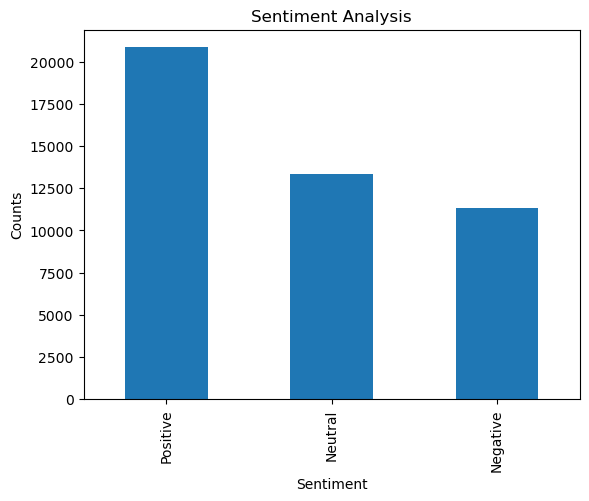

In [23]:
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
text_df['sentiment'].value_counts().plot(kind = 'bar')
plt.show()

Text(0, 0.5, 'Automobile Sentiment Analysis')

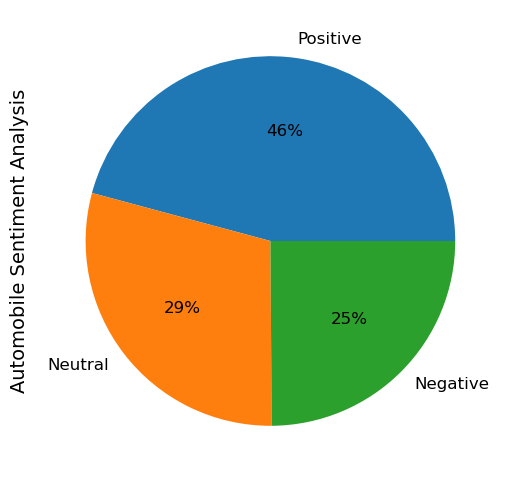

In [24]:
text_df.sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%',  fontsize=12, figsize=(9,6)) #, colors=["blue", "red", "yellow"])
plt.ylabel("Automobile Sentiment Analysis", size=14)

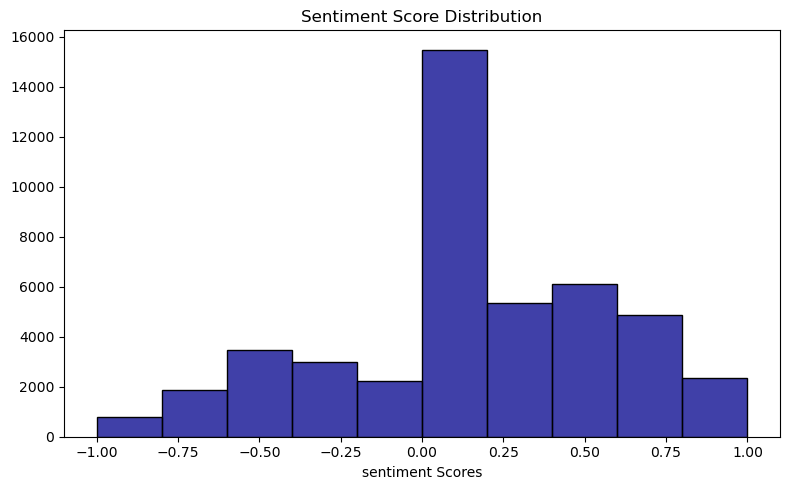

In [25]:
#Visualize sentiments distribution based on compound scores.
plt.figure(figsize=(8, 5))
sns.histplot(text_df, x='sentiment_score', color="darkblue", bins=10, binrange=(-1, 1))
plt.title("Sentiment Score Distribution")
plt.xlabel("sentiment Scores")
plt.ylabel("")
plt.tight_layout()

In [26]:
text_df

,tweet,date,brand,sentiment_score,sentiment
0,either way think youre vastly overestimate tes...,2022-10-01,NaN,0.6355,Positive
1,find problematic,2022-10-01,tesla,-0.4404,Negative
2,sure tesla ai robot less let end video,2022-10-01,NaN,0.3182,Positive
3,may well youd hard press see consequence base ...,2022-10-01,tesla,0.1779,Positive
4,elon musk claim tesla cybertruck truck boat he...,2022-10-01,tesla,0.0000,Neutral
...,...,...,...,...,...
45495,totally agree though dont think amount marketi...,2022-12-31,NaN,0.6697,Positive
45496,thedr tesla lose billion market capitalization...,2022-12-31,NaN,-0.4019,Negative
45497,barrons top weekend stock pick tesla bed bath ...,2022-12-31,NaN,0.2023,Positive
45498,doge certainly seem way certainly respect musk...,2022-12-31,tesla,0.9153,Positive


In [27]:
# removing useless words that were found after Trigram Anaylsis
def multiple_word_remove_func(text, words_2_remove_list): 
    words_to_remove_list = words_2_remove_list
    
    words = word_tokenize(text)
    text = ' '.join([word for word in words if word not in words_to_remove_list])
    return text

In [28]:
text_df['tweet'] = text_df.apply(lambda x: multiple_word_remove_func(x['tweet'], ["ebay","ebaycomitm","itm", "http", "https","co", "the adventures of ford fairlane", "com", 
                                                                                  "dp","d","elon","musk"]), axis = 1)

In [29]:
# There were some NAN values in colum Brand, therefore after cleaning trying again to re-create column brand
text_df.loc[text_df['tweet'].str.contains("mercedes"),'brand'] = 'mercedes'
text_df.loc[text_df['tweet'].str.contains("bmw"),'brand'] = 'bmw'
text_df.loc[text_df['tweet'].str.contains("audi"),'brand'] = 'audi'
text_df.loc[text_df['tweet'].str.contains("tesl"),'brand'] = 'tesla'

text_df

,tweet,date,brand,sentiment_score,sentiment
0,either way think youre vastly overestimate tes...,2022-10-01,tesla,0.6355,Positive
1,find problematic,2022-10-01,tesla,-0.4404,Negative
2,sure tesla ai robot less let end video,2022-10-01,tesla,0.3182,Positive
3,may well youd hard press see consequence base ...,2022-10-01,tesla,0.1779,Positive
4,claim tesla cybertruck truck boat heres hemean...,2022-10-01,tesla,0.0000,Neutral
...,...,...,...,...,...
45495,totally agree though dont think amount marketi...,2022-12-31,bmw,0.6697,Positive
45496,thedr tesla lose billion market capitalization...,2022-12-31,tesla,-0.4019,Negative
45497,barrons top weekend stock pick tesla bed bath ...,2022-12-31,tesla,0.2023,Positive
45498,doge certainly seem way certainly respect lot ...,2022-12-31,tesla,0.9153,Positive


In [30]:
text_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45500 entries, 0 to 45499
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tweet            45500 non-null  object 
 1   date             45500 non-null  object 
 2   brand            41742 non-null  object 
 3   sentiment_score  45500 non-null  float64
 4   sentiment        45500 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.7+ MB


In [31]:
text_df['quote_count'] = df.loc[: , "quoteCount"].values
text_df['like_count'] = df.loc[:, "likeCount"]
text_df['retweet_count'] = df.loc[: , "retweetCount"]
#text_df['month'] = text_df['date'].dt.month

In [32]:
# dropping rows that have missing brands
text_df = text_df.dropna()
text_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41742 entries, 0 to 45499
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tweet            41742 non-null  object 
 1   date             41742 non-null  object 
 2   brand            41742 non-null  object 
 3   sentiment_score  41742 non-null  float64
 4   sentiment        41742 non-null  object 
 5   quote_count      41742 non-null  int64  
 6   like_count       41742 non-null  int64  
 7   retweet_count    41742 non-null  int64  
dtypes: float64(1), int64(3), object(4)
memory usage: 2.9+ MB


In [33]:
#for further analysis of Different Brands
mercedes = text_df[text_df['brand'] == 'mercedes']
bmw = text_df[text_df['brand'] == 'bmw']
audi = text_df[text_df['brand'] == 'audi']

In [34]:
frames = [mercedes,bmw,audi]
data_frame = pd.concat(frames)
data_frame

,tweet,date,brand,sentiment_score,sentiment,quote_count,like_count,retweet_count
10,prof red bull year far dominant mercedes doesnt,2022-10-01,mercedes,0.0000,Neutral,0,2,0
12,woman technology pleased announce woodruff sch...,2022-10-01,mercedes,0.8720,Positive,0,0,0
19,schnitt say interview make guardian mercedes s...,2022-10-01,mercedes,0.0000,Neutral,0,6,0
24,mercedes plan ev wsjcomarticles,2022-10-01,mercedes,0.0000,Neutral,0,3,0
44,get mercedes chestyoutubecomwatchvja ch,2022-10-01,mercedes,0.0000,Neutral,0,19,1
...,...,...,...,...,...,...,...,...
45469,audi aim f win z dailynews zdailynewscomsports...,2022-12-31,audi,0.5859,Positive,0,0,0
45471,aint get saudi cup yet unlike harry kane hell ...,2022-12-31,audi,-0.6808,Negative,0,1,0
45486,document weird shenanigan get vehicle second n...,2022-12-31,audi,-0.5423,Negative,0,1,0
45490,try employ german driver audi make f plan clea...,2022-12-31,audi,0.3818,Positive,0,0,0


In [35]:
data_frame['tweet'] = data_frame.apply(lambda x: multiple_word_remove_func(x['tweet'], ['mercede','mercedes','bmw','audi']), axis = 1)

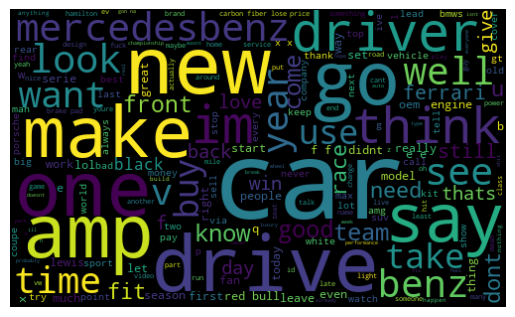

In [36]:
allWords = ' '.join([twts for twts in data_frame['tweet']])
wordCloud = WordCloud(width=500, height=300, random_state=21, max_font_size=110).generate(allWords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

text_df.to_csv("twitter_sentiment2.csv", index = False) # dataset has been moved in order to apply models

In [37]:
text_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41742 entries, 0 to 45499
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tweet            41742 non-null  object 
 1   date             41742 non-null  object 
 2   brand            41742 non-null  object 
 3   sentiment_score  41742 non-null  float64
 4   sentiment        41742 non-null  object 
 5   quote_count      41742 non-null  int64  
 6   like_count       41742 non-null  int64  
 7   retweet_count    41742 non-null  int64  
dtypes: float64(1), int64(3), object(4)
memory usage: 2.9+ MB


### Frequency of Sentiments for each brand 

In [38]:
def prop_per_x(x, count):
    """
    Compute the proportion of the counts for each value of x
    """
    df = pd.DataFrame({
        'x': x,
        'count': count
    })
    prop = df['count']/df.groupby('x')['count'].transform('sum')
    return prop

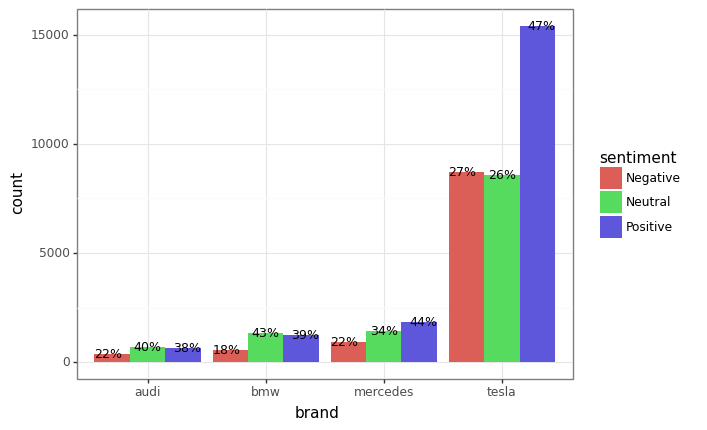

<ggplot: (109310562407)>

In [39]:
(ggplot(text_df, aes('brand', fill='sentiment'))
 + geom_bar(position='dodge')
 + geom_text(
     aes(
         label=after_stat('prop_per_x(x, count) * 100'),
         y=stage(after_stat='count', after_scale='y+.50')
     ),
     stat='count',
     position=position_dodge(width=1),
     format_string='{:.0f}%',
     size=9,
 ) + theme_bw()
)

In [40]:
#!pip install joypy
text_df['month'] = pd.to_datetime(text_df['date']).dt.month

In [41]:
import pandas as pd
from joypy import joyplot
import matplotlib.pyplot as plt

In [42]:
text_df['date'] = pd.to_datetime(text_df['date'])

In [43]:
text_df['month'] = (text_df['date']).dt.month

In [44]:
df['month'] = df['date'].dt.month

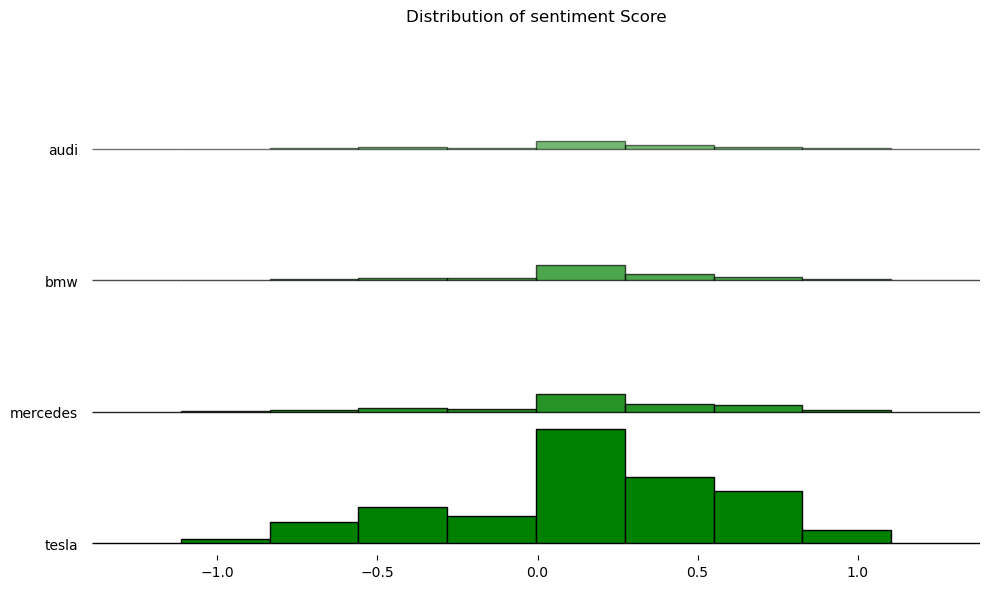

In [45]:
joyplot(text_df, by = 'brand', column = 'sentiment_score',color = 'green', fade = True, 
                range_style='own', figsize = (10,6), hist = True, overlap = 0,
                   title = 'Distribution of sentiment Score')
plt.show()

In [46]:
text_df.brand.value_counts()

tesla       32658
mercedes     4203
bmw          3164
audi         1717
Name: brand, dtype: int64

In [47]:
text_df.sentiment.value_counts()

Positive    19106
Neutral     12044
Negative    10592
Name: sentiment, dtype: int64

In [48]:
text_df['date'] = pd.to_datetime(text_df['date'])

In [49]:
text_df

,tweet,date,brand,sentiment_score,sentiment,quote_count,like_count,retweet_count,month
0,either way think youre vastly overestimate tes...,2022-10-01,tesla,0.6355,Positive,0,8,0,10
1,find problematic,2022-10-01,tesla,-0.4404,Negative,0,0,0,10
2,sure tesla ai robot less let end video,2022-10-01,tesla,0.3182,Positive,1,13,0,10
3,may well youd hard press see consequence base ...,2022-10-01,tesla,0.1779,Positive,0,1,0,10
4,claim tesla cybertruck truck boat heres hemean...,2022-10-01,tesla,0.0000,Neutral,0,0,0,10
...,...,...,...,...,...,...,...,...,...
45495,totally agree though dont think amount marketi...,2022-12-31,bmw,0.6697,Positive,0,1,0,12
45496,thedr tesla lose billion market capitalization...,2022-12-31,tesla,-0.4019,Negative,0,1,0,12
45497,barrons top weekend stock pick tesla bed bath ...,2022-12-31,tesla,0.2023,Positive,0,0,0,12
45498,doge certainly seem way certainly respect lot ...,2022-12-31,tesla,0.9153,Positive,0,0,0,12


In [50]:
text_df['date'] = pd.to_datetime(text_df['date'])

In [51]:
text_df['month'] = (text_df['date']).dt.month

### Sentiment Scores over Time

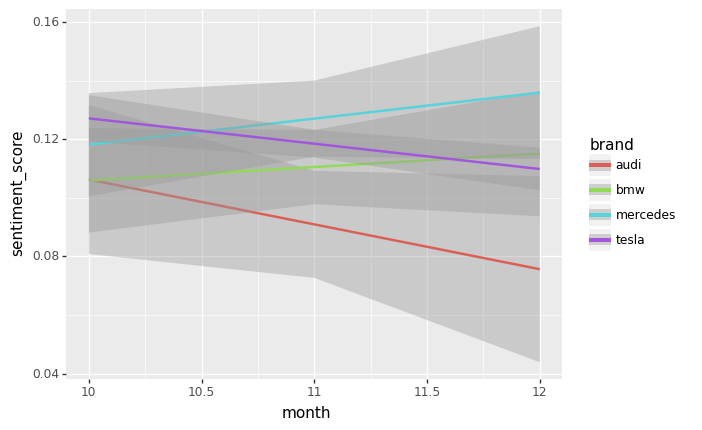

<ggplot: (109319560641)>

In [52]:
ggplot(text_df, aes(x = 'month', y = 'sentiment_score')) + geom_smooth(aes(colour = 'brand'))

Over time positive sentiment for bmw and mercedes have increased, while positive sentiment for rest of brands has decreased

In [53]:
from sklearn.model_selection import train_test_split

In [54]:
text_df_copy = text_df.copy()
text_df_copy.head()

,tweet,date,brand,sentiment_score,sentiment,quote_count,like_count,retweet_count,month
0,either way think youre vastly overestimate tes...,2022-10-01,tesla,0.6355,Positive,0,8,0,10
1,find problematic,2022-10-01,tesla,-0.4404,Negative,0,0,0,10
2,sure tesla ai robot less let end video,2022-10-01,tesla,0.3182,Positive,1,13,0,10
3,may well youd hard press see consequence base ...,2022-10-01,tesla,0.1779,Positive,0,1,0,10
4,claim tesla cybertruck truck boat heres hemean...,2022-10-01,tesla,0.0000,Neutral,0,0,0,10


In [55]:
text_df_copy['tweet'] = text_df_copy.apply(lambda x: multiple_word_remove_func(x['tweet'], ["ebaycomitm", "com", "dp","d","elon","musk", "ebaycomitm", 
                                                                                 "raincitynewscomp"]), axis = 1)
text_df.isna().sum()

tweet              0
date               0
brand              0
sentiment_score    0
sentiment          0
quote_count        0
like_count         0
retweet_count      0
month              0
dtype: int64

In [56]:
y=text_df_copy['sentiment'].values
y.shape

x=text_df_copy['tweet'].values
x.shape


(41742,)

In [81]:
(x_train,x_test,y_train,y_test)=train_test_split(x,y,test_size=0.2)
x_train.shape
y_train.shape
x_test.shape
y_test.shape

(8349,)

In [58]:
df1=pd.DataFrame(x_train)
df1=df1.rename(columns={0:'tweet'})

df2=pd.DataFrame(y_train)
df2=df2.rename(columns={0:'sentiment'})
df_train=pd.concat([df1,df2],axis=1)

In [59]:
df_train.head()

,tweet,sentiment
0,rear disc ceramic brake pad mercedes benz c cl...,Positive
1,live bat auction mercedesbenz sl bringatrailer...,Neutral
2,tesla chinese rival set newrecords hedgedmedia...,Neutral
3,literally bring sketch partnership tesla givea...,Negative
4,tucker ohhh rupert murdoch celebrate autonomou...,Positive


In [60]:
def generate_N_grams(text,ngram=2):
    words=[word for word in text.split(" ") if word not in set(stopwords.words('english'))]  
    print("Sentence after removing stopwords:",words)
    temp=zip(*[words[i:] for i in range(0,ngram)])
    ans=[' '.join(ngram) for ngram in temp]
    return ans

In [61]:
from collections import defaultdict

In [62]:
positiveValues=defaultdict(int)
negativeValues=defaultdict(int)
neutralValues=defaultdict(int)
#get the count of every word in both the columns of df_train and df_test dataframes


In [63]:
#get the count of every word in both the columns of df_train and df_test dataframes where sentiment="positive"
for text in df_train[df_train.sentiment=="Positive"].tweet:
    for word in generate_N_grams(text,3):
        positiveValues[word]+=1

Sentence after removing stopwords: ['rear', 'disc', 'ceramic', 'brake', 'pad', 'mercedes', 'benz', 'c', 'class', 'gla', 'glc']
Sentence after removing stopwords: ['tucker', 'ohhh', 'rupert', 'murdoch', 'celebrate', 'autonomous', 'tesla', 'drive', 'excessive', 'speed', 'wind', 'mountain', 'road']
Sentence after removing stopwords: ['wheeler', 'word', 'already', 'tesla', 'smart', 'phone', 'would', 'save', 'ton', 'money', 'smart', 'phone', 'would', 'boast', 'twitter', 'default', 'app', 'starlink', 'internet', 'one', 'would', 'pay', 'dime', 'roaming', 'charge', 'even', 'monthly', 'data', 'bill']
Sentence after removing stopwords: ['front', 'disc', 'ceramic', 'brake', 'pad', 'bmw', 'gt', 'x', 'x', 'x', 'x', 'x']
Sentence after removing stopwords: ['ive', 'assure', 'tesla', 'totally', 'continue', 'rule', 'ev', 'market', 'know', 'like', 'ford', 'never', 'lose', 'market', 'share', 'back', 'day']
Sentence after removing stopwords: ['today', 'get', 'mercedes', 'sign', 'driver', 'card', 'merch', 

Sentence after removing stopwords: ['glenn', 'well', 'acquire', 'tesla', 'technology', 'someone', 'else', 'used', 'government', 'green', 'welfaresubsidies', 'grow', 'company']
Sentence after removing stopwords: ['wow', 'e', 'warren', 'accuse', 'criminal', 'theft', 'pull', 'tesla', 'employee', 'include', 'key', 'staff', 'use', 'tesla', 'employee', 'raise', 'question', 'whether', 'mr', 'appropriate', 'resource', 'publicly', 'trade', 'firm', 'benefit', 'private', 'company']
Sentence after removing stopwords: ['hi', 'yes', 'hi', 'hello', 'lean', 'tesla']
Sentence after removing stopwords: ['would', 'try', 'tesla', 'phone', 'might', 'work', 'well', 'lol']
Sentence after removing stopwords: ['would', 'want', 'penelope', 'win', 'amp', 'maybe', 'challenge', 'mercedes', 'roh', 'woman', 'title', 'first', 'time', 'ever']
Sentence after removing stopwords: ['everyone', 'jump', 'verification', 'good', 'ol', 'tesla', 'thread', 'think', 'tsla', 'insane', 'buying', 'opportunity', 'right', 'nfa', 'x']


Sentence after removing stopwords: ['enough', 'driver', 'main', 'concern', 'prevent', 'trailer', 'slide', 'around', 'cause', 'jackknife']
Sentence after removing stopwords: ['nice', 'cant', 'wait', 'see', 'roll', 'p', 'teslaspacex', 'nerdy', 'stuff', 'less', 'politics', 'please']
Sentence after removing stopwords: ['perform', 'well', 'shiba', 'inu', 'v', 'dogecoin', 'v', 'tesla', 'report', 'edgrefwse']
Sentence after removing stopwords: ['south', 'africa', 'could', 'really', 'use', 'tesla', 'sustainable', 'energy', 'solution', 'apply', 'counter', 'loadshedding', 'entrepreneurial', 'solution', 'world', 'transition', 'climate', 'change']
Sentence after removing stopwords: ['tesla', 'great', 'great', 'car']
Sentence after removing stopwords: ['love', 'mother', 'mercedes']
Sentence after removing stopwords: ['go', 'back', 'catch', 'race', 'love', 'see', 'bmw', 'bsturner', 'colour', 'seem', 'odd', 'see', 'porsche', 'b', 'turner', 'split', 'livery']
Sentence after removing stopwords: ['tesla

Sentence after removing stopwords: ['btw', 'listen', 'talk', 'many', 'space', 'thank', 'tremendous', 'contribution', 'community', 'happy', 'new', 'year']
Sentence after removing stopwords: ['tsla', 'waymo', 'use', 'hyperlocal', 'weather', 'data', 'improve', 'selfdriving', 'vehicle', 'capability', 'futurecar', 'newsgooglecomirssrdart', 'elonmusk', 'tesla', 'spacex']
Sentence after removing stopwords: ['teen', 'speed', 'buffalo', 'wild', 'wing', 'employee', 'top', 'car', 'molima', 'via', 'dineanddash', 'teenager', 'speed', 'buffalo', 'wild', 'wing', 'staff', 'member', 'cling', 'onto', 'hood', 'bmw', 'well', 'take', 'highway']
Sentence after removing stopwords: ['get', 'freezing', 'raincold', 'weather', 'option', 'tesla', 'app', 'set', 'put', 'wiper', 'service', 'mode', 'fold', 'mirror', 'motor', 'dont', 'get', 'damage', 'also', 'able', 'set', 'multiple', 'precondition', 'schedule', 'would', 'beneficial', 'leave', 'time', 'workhome', 'etc']
Sentence after removing stopwords: ['need', 'tes

Sentence after removing stopwords: ['state', 'fact', 'agree', 'twitter', 'hang', 'pretty', 'obvious', 'buy', 'twitter', 'fact', 'comment', 'sell', 'tesla', 'stock', 'therefore', 'obvious', 'sell', 'probably', 'sell', 'earnings', 'call']
Sentence after removing stopwords: ['tesla', 'would', 'clean', 'compact']
Sentence after removing stopwords: ['always', 'fun', 'watch', 'wake', 'tax', 'funded', 'public', 'broadcaster', 'dw', 'get', 'crazy', 'symbolism', 'switch', 'led', 'christmas', 'market', 'big', 'news', 'meanwhile', 'plenty', 'electricity', 'wake', 'tesla', 'elite', 'posh', 'energy', 'guzzle', 'vehicle']
Sentence after removing stopwords: ['raj', 'make', 'spotify', 'way', 'well', 'apple', 'music', 'lossless', 'spatial', 'way', 'well', 'integrate', 'rest', 'apple', 'device', 'mention', 'already', 'pay', 'apple', 'one', 'subscription']
Sentence after removing stopwords: ['bit', 'starlink', 'mixed', 'twitter', 'mixed', 'tesla', 'phone', 'mixed', 'switzerland', 'censor', 'free', 'commu

Sentence after removing stopwords: ['definitely', 'possible', 'way', 'talk', 'video']
Sentence after removing stopwords: ['tesla', 'fsd', 'beta', 'ready', 'worldwide', 'rollout', 'end', 'year', 'artificialintelligence', 'robotics', 'aisummarycomsummarytesla']
Sentence after removing stopwords: ['gt', 'manufacturer', 'seasonaston', 'martin', 'start', 'dominate', 'since', 'join', 'gt', 'season', 'help', 'expand', 'car', 'team', 'season', 'mercedes', 'ferrari', 'also', 'hold', 'record']
Sentence after removing stopwords: ['enough', 'coverage', 'evgo', 'along', 'route', 'case', 'find', 'plugshare', 'score', 'good', 'predictor', 'nice', 'nice', 'time', 'ea', 'evgo', 'chargepoint', 'extensive', 'kw', 'speed', 'could', 'maintain', 'reliable', 'software', 'tesla']
Sentence after removing stopwords: ['wow', 'miand', 'nail', 'spot', 'tesla', 'model', 'standard', 'stockholm', 'sweden', 'first', 'player', 'teslaradar', 'tesla', 'sweden', 'model']
Sentence after removing stopwords: ['good', 'riddan

Sentence after removing stopwords: ['whale', 'finally', 'step', 'tesla', 'start', 'speak', 'truth', 'climatescam', 'lt']
Sentence after removing stopwords: ['could', 'easily', 'implement', 'invention', 'ocean', 'become', 'real', 'tesla', 'big', 'fan', 'god', 'bless', 'merry', 'christmas']
Sentence after removing stopwords: ['milano', 'get', 'money', 'buy', 'tesla', 'give', 'dont', 'worry', 'mr', 'keep', 'right']
Sentence after removing stopwords: ['love', 'apple', 'music', 'tesla', 'far']
Sentence after removing stopwords: ['use', 'one', 'sure', 'tesla', 'right', 'ad']
Sentence after removing stopwords: ['thats', 'true', 'rich', 'enough', 'afford', 'tesla', 'doesnt', 'mean', 'rich', 'enough', 'get', 'rid', 'people', 'waste', 'money', 'car']
Sentence after removing stopwords: ['typo', 'sorry', 'whats', 'tesla', 'thank', 'gail', 'check', 'newsletter', 'box']
Sentence after removing stopwords: ['becker', 'didnt', 'supreme', 'court', 'rule', 'corporation', 'many', 'right', 'human', 'includ

Sentence after removing stopwords: ['yep', 'ive', 'hold', 'onto', 'current', 'car', 'manufacturer', 'bring', 'car', 'online', 'next', 'one', 'definitely', 'ev', 'definitely', 'tesla']
Sentence after removing stopwords: ['istrex', 'didnt', 'use', 'one', 'probably', 'helpful']
Sentence after removing stopwords: ['istrex', 'enjoy', 'every', 'moment', 'every', 'wave']
Sentence after removing stopwords: ['wish', 'tesla', 'bankrupt', 'go', 'mullen', 'buy', 'tesla', 'new', 'bff', 'putin', 'putler', 'also', 'know', 'modern', 'hitler']
Sentence after removing stopwords: ['thing', 'happen', 'warn', 'instant', 'strikeout', 'even', 'though', 'im', 'hold', 'wheel', 'like', 'year', 'without', 'instance', 'ap', 'jail', 'majorly', 'flaw', 'system', 'get', 'act', 'together']
Sentence after removing stopwords: ['even', 'aside', 'easy', 'make', 'arg', 'behavior', 'detrimental', 'brand', 'value', 'cant', 'pillage', 'resource', 'property', 'intellectual', 'public', 'benefit', 'private', 'one', 'first', 'so

Sentence after removing stopwords: ['insideevs', 'one', 'big', 'tesla', 'cheerlead', 'site', 'nearly', 'writer', 'tesla', 'shareholder']
Sentence after removing stopwords: ['fit', 'mercedesbenz', 'w', 'sedan', 'glossy', 'carbon', 'fiber', 'rear', 'spoiler']
Sentence after removing stopwords: ['future', 'climate', 'impact', 'design', 'amp', 'performance', 'nearly', 'zero', 'energy', 'building', 'nzebs', 'iftttmlyw', 'z', 'tesla', 'ev', 'climatechange', 'renewables', 'renewableenergy']
Sentence after removing stopwords: ['hood', 'bonnet', 'black', 'paint', 'code', 'fit', 'bmw']
Sentence after removing stopwords: ['notice', 'well', 'back', 'summer']
Sentence after removing stopwords: ['nbacom', 'tech', 'stock', 'analysis', 'amazon', 'tesla', 'google', 'meta', 'youtube', 'chili', 'apple', 'technology', 'applepay', 'applewatch', 'youtubecomjamaalaldintv', 'spicy', 'nikecomwnba', 'vofi', 'spicy', 'nba', 'mix', 'microsoft', 'youtubecomwatchv', 'zfexw', 'kcom']
Sentence after removing stopword

Sentence after removing stopwords: ['delighted', 'george', 'russell', 'get', 'first', 'f', 'win', 'today', 'f', 'f', 'sprint', 'kingslynn', 'saopaulogp', 'mercedes', 'sao', 'paulo', 'grand', 'prix', 'george', 'russell', 'beat', 'lewis', 'hamilton', 'first', 'full', 'formula', 'win', 'bbccouksportformula']
Sentence after removing stopwords: ['lol', 'paypal', 'tank', 'tesla']
Sentence after removing stopwords: ['want', 'bmw', 'next', 'year']
Sentence after removing stopwords: ['time', 'public', 'remember', 'save', 'freedom', 'attach', 'tesla', 'shareholder', 'benefit', 'form', 'elons', 'good', 'willzoom', 'understand', 'nwo', 'go', 'fail', 'elontrumpye', 'etc', 'thats', 'good', 'peopleye', 'black', 'spend', 'tap']
Sentence after removing stopwords: ['femb', 'wonder', 'driver', 'drive', 'get', 'ticket', 'amp', 'go', 'insurance', 'tesla', 'hook', 'probably', 'something', 'fine', 'print', 'clear', 'responsibility']
Sentence after removing stopwords: ['clean', 'draft', 'wouldnt', 'allow', 's

Sentence after removing stopwords: ['chief', 'twit', 'support', 'party', 'um', 'bright', 'light', 'really', 'make', 'doubt', 'motivation', 'acceleration', 'sustainable', 'energy', 'autonomy', 'fundamental', 'humanity', 'behind', 'tesla']
Sentence after removing stopwords: ['opinion', 'base', 'word', 'tweet', 'ceo', 'company', 'express', 'social', 'amp', 'political', 'view', 'effect', 'consumer', 'opinion', 'im', 'longer', 'interested', 'tesla', 'car', 'thats']
Sentence after removing stopwords: ['bmw', 'bloomfield', 'proud', 'sponsor', 'year', 'toy', 'tots', 'drive', 'november', 'th', 'december', 'thlearn', 'bitly', 'emuopzholidayspirit', 'toysfortots', 'giftofgiving', 'christmasspirit', 'merrychristmas']
Sentence after removing stopwords: ['true', 'smartphone', 'device', 'design', 'option', 'connect', 'internet', 'starlink', 'include']
Sentence after removing stopwords: ['know', 'busy', 'save', 'free', 'speech', 'super', 'happy', 'regular', 'tesla', 'question', 'way', 'get', 'market',

Sentence after removing stopwords: ['pavement', 'princess', 'truck', 'part', 'issue', 'tesla', 'owner', 'virtue', 'signal', 'opposite', 'spectrum']
Sentence after removing stopwords: ['many', 'people', 'think', 'tesla', 'easy', 'legacy', 'well', 'cheap', 'hows', 'work', 'year', 'ago', 'tesla', 'first', 'ota', 'sw', 'update', 'mb', 'chrysler', 'plan', 'thing', 'beating', 'tesla', 'isnt', 'easy']
Sentence after removing stopwords: ['fun', 'magic', 'money', 'tree', 'game', 'mr', 'investor', 'dude', 'think', 'adult', 'shovel', 'coin', 'like', 'leprechaun']
Sentence after removing stopwords: ['ai', 'legacy', 'mfgs', 'recall', 'mfg', 'sell', 'lot', 'car', 'tesla', 'important', 'ratio', 'tesla', 'mfgd', 'sell', 'number', 'recall', 'since', 'give', 'year', 'since', 'legacy', 'mfgs', 'arent', 'ramp', 'fully', 'yet', 'cant', 'contrast', 'fully']
Sentence after removing stopwords: ['change', 'vote', 'realize', 'would', 'better', 'tsla', 'short', 'position', 'cone', 'think', 'though', 'present', '

Sentence after removing stopwords: ['trunk', 'light', 'tesla', 'legit', 'show', 'cover', 'everything', 'yes', 'costco', 'run', 'tesla']
Sentence after removing stopwords: ['elons', 'lane', 'stock', 'go', 'like', 'rocket', 'launch', 'mostly', 'know', 'guy', 'spent', 'b', 'make', 'fake', 'friend', 'cant', 'hype', 'tesla', 'anymore', 'like', 'hope', 'remembers', 'felt', 'like', 'almost', 'bankrupt', 'change', 'course']
Sentence after removing stopwords: ['tesla', 'plaid', 'mph', 'second', 'tesla', 'india', 'car', 'love', 'youtube', 'youtube', 'wcmm', 'xi', 'gk', 'via']
Sentence after removing stopwords: ['new', 'list', 'model', 'apr', 'dark', 'satin', 'grey', 'enhance', 'autopilot', 'full', 'self', 'drive', 'ludicrous', 'driven', 'mile', 'locate', 'tx', 'ask', 'price', 'tesla', 'model', 'sellmyusedtesla', 'sellmyusedteslacom']
Sentence after removing stopwords: ['omwal', 'abu', 'dabi', 'finali', 'clusterfuck', 'yes', 'hamilton', 'pit', 'could', 'well', 'avoid', 'hamilton', 'benefit', 'rul

Sentence after removing stopwords: ['fauci', 'lie', 'million', 'diedhe', 'also', 'illegally', 'fund', 'research', 'create', 'covid', 'virus', 'gain', 'function', 'virology', 'research', 'outlaw', 'congress', 'decade', 'ago', 'specifically', 'prevent', 'exact', 'scenario', 'occur']
Sentence after removing stopwords: ['glenn', 'get', 'bunch', 'people', 'community', 'lose', 'lot', 'money', 'kwon', 'terra', 'crash', 'come', 'standup', 'dude', 'help', 'u', 'get', 'money', 'back', 'endorse', 'luna', 'classic', 'please', 'power']
Sentence after removing stopwords: ['troll', 'kind', 'invent', 'troll', 'rather', 'serve', 'pep', 'discussion', 'bevs', 'climate', 'saviour', 'also', 'politics', 'behind', 'transfer', 'money', 'poor', 'rich', 'tesla', 'house', 'owner']
Sentence after removing stopwords: ['enjoy', 'breakwell', 'earn', 'nice', 'road', 'trip', 'new', 'caror', 'call', 'tesla']
Sentence after removing stopwords: ['sorry', 'colin', 'good', 'model', 'bmw', 'even', 'mercedesbenz', 'influence

Sentence after removing stopwords: ['wait', 'someone', 'explain', 'volvo', 'fh', 'semi', 'kwh', 'battery', 'mile', 'range', 'load', 'tonne', 'gvw', 'cost', 'kbut', 'tesla', 'semi', 'promise', 'mile', 'range', 'tonne', 'gvw', 'cost', 'k', 'almost', 'like', 'tsemi', 'spec', 'overstate']
Sentence after removing stopwords: ['feel', 'like', 'tesla', 'actually', 'sync', 'performance', 'burst', 'flame']
Sentence after removing stopwords: ['people', 'love', 'talk', 'shit', 'electric', 'vehicle', 'physic', 'mindset', 'brushless', 'motor', 'tesla', 'much', 'efficient', 'gas', 'motorhaving', 'gas', 'generator', 'trunk', 'would', 'likely', 'lead', 'extremely', 'high', 'mile', 'per', 'gallon']
Sentence after removing stopwords: ['nbacom', 'tech', 'stock', 'analysis', 'amazon', 'tesla', 'google', 'meta', 'youtube', 'chili', 'apple', 'technology', 'applepay', 'applewatch', 'youtubecomjamaalaldintv', 'spicy', 'nikecomwnba', 'vofi', 'spicy', 'nba', 'mix', 'microsoft', 'youtubecomwatchv', 'zfexw', 'kcom

Sentence after removing stopwords: ['top', 'story', 'laidoff', 'twitter', 'worker', 'sue', 'make', 'sure', 'theyre', 'treat', 'way', 'laidoff', 'tesla', 'worker', 'allegedly', 'mashable', 'mashablecomarticleelont', 'see', 'tweetedtimescomsudipdasinst']
Sentence after removing stopwords: ['get', 'uncle', 'play', 'stardew', 'valley', 'new', 'tesla']
Sentence after removing stopwords: ['psa', 'youre', 'california', 'safety', 'score', 'doesnt', 'impact', 'premium', 'tesla', 'tsla', 'ifttthrq', 'oyi']
Sentence after removing stopwords: ['please', 'careful', 'say', 'sake', 'teslas', 'stock', 'price']
Sentence after removing stopwords: ['youve', 'lose', 'gm', 'already', 'big', 'brain', 'genius', 'boy', 'hope', 'nword', 'twitter', 'worth', 'guess', 'youll', 'let', 'client', 'state', 'run', 'amok', 'dont', 'tank', 'tesla']
Sentence after removing stopwords: ['im', 'sure', 'people', 'like', 'work', 'tesla', 'personally', 'know', 'people', 'exact', 'experience', 'work', 'lack', 'worklife', 'balan

Sentence after removing stopwords: ['love', 'allnew', 'bmw', 'curve', 'display', 'need', 'digital', 'display', 'format', 'option', 'iconic', 'orange', 'analog', 'dial', 'signature', 'bmw']
Sentence after removing stopwords: ['think', 'see', 'lot', 'company', 'test', 'blockchain', 'technology', 'help', 'business', 'im', 'super', 'excitedso', 'thailand', 'take', 'step', 'detail', 'articleweb', 'nftcommunity', 'cointelegraphcomnewsbmwtaps']
Sentence after removing stopwords: ['tesla', 'thats', 'like']
Sentence after removing stopwords: ['youre', 'actually', 'right', 'think', 'point', 'tesla', 'well', 'wait', 'till', 'supply', 'need', 'make', 'sort', 'definitive', 'statement', 'release', 'date', 'release', 'date', 'change', 'numerous', 'time', 'vehicle']
Sentence after removing stopwords: ['lmao']
Sentence after removing stopwords: ['w', 'car', 'floor', 'mat', 'row', 'bmw', 'x', 'blackcustom', 'fit', 'tpe', 'weather']
Sentence after removing stopwords: ['difference', 'u', 'smart', 'enough'

Sentence after removing stopwords: ['cook', 'youre', 'buying', 'time', 'definitely', 'want', 'remove', 'twitter', 'app', 'store', 'work', 'chinese', 'come', 'tesla', 'phone', 'anyways', 'include', 'app', 'store']
Sentence after removing stopwords: ['jordan', 'champion', 'team', 'mercedes']
Sentence after removing stopwords: ['tesla', 'really', 'like', 'sometimes', 'somewhere', 'spacex']
Sentence after removing stopwords: ['please', 'let', 'tesla', 'owner', 'get', 'one']
Sentence after removing stopwords: ['thats', 'fair', 'kane', 'sure', 'audi', 'cup']
Sentence after removing stopwords: ['thing', 'like', 'boomerang', 'lol', 'e', 'dinan', 'back', 'even', 'share', 'space', 'son', 'fistbmw', 'e', 'dinan', 'xi', 'colorado', 'ford', 'fiestast']
Sentence after removing stopwords: ['yeah', 'thats', 'great', 'solution']
Sentence after removing stopwords: ['tesla', 'far', 'best', 'hard', 'time', 'believe', 'rivian', 'much', 'competition', 'tesla']
Sentence after removing stopwords: ['roundup', 

Sentence after removing stopwords: ['need', 'know', 'overall', 'height', 'truck', 'adjustment', 'ride', 'height', 'curb', 'height', 'please', 'thank', 'teamtesla']
Sentence after removing stopwords: ['ive', 'driven', 'every', 'tesla', 'model', 'include', 'plaid', 'quality', 'issue', 'less', 'range', 'tesla', 'every', 'lucid', 'model', 'use', 'work', 'lucid', 'know', 'great', 'fitfinish', 'tesla', 'really', 'bad', 'lucids', 'drive', 'pure', 'sapphire']
Sentence after removing stopwords: ['first', 'ive', 'heard', 'fascinatingyet', 'horrific', 'storyohhow', 'id', 'love', 'jury', 'onegreat', 'courtesy', 'car', 'audi', 'tt', 'tracker', 'record', 'speedsplaces', 'timeswhat', 'chance', 'eh']
Sentence after removing stopwords: ['bring', 'fruition', 'yay', 'tesla']
Sentence after removing stopwords: ['hip', 'hip', 'hooray', 'someone', 'nail', 'spot', 'yet', 'unrecognizable', 'tesla', 'vehicle', 'new', 'south', 'wale', 'australia', 'first', 'player', 'teslaradar', 'tesla', 'australia']
Sentence 

Sentence after removing stopwords: ['show', 'share', 'value', 'dilluted', 'increase', 'shareholding', 'piece', 'may', 'gild', 'lilly', 'bit', 'hostile', 'set', 'underlie', 'monetary', 'fact']
Sentence after removing stopwords: ['congrats', 'buddy']
Sentence after removing stopwords: ['thanksgiving', 'free', 'charge', 'az', 'matter', 'entire', 'tesla', 'network', 'big', 'please']
Sentence after removing stopwords: ['great', 'idea', 'pamela', 'get', 'yerself', 'tesla', 'instead', 'gm', 'truck', 'youve', 'eye', 'youre', 'really', 'u', 'libs', 'power', 'move']
Sentence after removing stopwords: ['anyone', 'would', 'sell', 'tesla', 'stock', 'buy', 'twitter', 'stock', 'would', 'laugh', 'genius', 'pay', 'x', 'trash', 'twitter']
Sentence after removing stopwords: ['lot', 'good', 'question', 'newstesla', 'say', 'turn', 'shanghai', 'china', 'world', 'large', 'vehicle', 'export', 'hub', 'new', 'factory', 'may', 'electrekco', 'te']
Sentence after removing stopwords: ['pepsico', 'proud', 'owner', '

Sentence after removing stopwords: ['oh', 'god', 'u', 'government', 'give', 'b', 'build', 'network', 'charger', 'last', 'year', 'see', 'ive', 'tesla', 'since', 'best', 'car', 'ever', 'rocket', 'landing', 'barge', 'nasa', 'outsource', 'spacex', 'bore', 'fascinate', 'solar', 'home', 'generator', 'yeah', 'comparable']
Sentence after removing stopwords: ['ppl', 'care', 'material', 'come', 'want', 'drive', 'tesla']
Sentence after removing stopwords: ['drive', 'audi', 'get', 'starbucks', 'coworkers', 'literally', 'love', 'w', 'job']
Sentence after removing stopwords: ['b', 'bostonc', 'counting', 'crow', 'def', 'leppard', 'e', 'electric', 'light', 'orchestra', 'f', 'fleetwood', 'macg', 'genesis', 'h', 'hearti', 'inxsj', 'journey', 'k', 'kansasl', 'loverboy', 'motley', 'cruen', 'nickelback', 'ozzyp', 'princeq', 'queen', 'r', 'reo', 'speedwagon', 'styxt', 'teslau', 'u', 'v', 'van', 'halenw', 'whitesnakex', 'yamptz', 'zz', 'top']
Sentence after removing stopwords: ['flamethrowerngl', 'thing', 'b

Sentence after removing stopwords: ['season', 'run', 'im', 'still', 'og', 'continentals', 'pro', 'contact', 'prefer', 'grip', 'im', 'wait', 'say', 'ok', 'since', 'run', 'xice', 'year', 'round', 'get', 'k', 'mile', 'usual', 'rule', 'thanksgiving', 'easter', 'week']
Sentence after removing stopwords: ['browse', 'twitter', 'tesla', 'phone', 'like']
Sentence after removing stopwords: ['youre', 'certain', 'long', 'term', 'tesla', 'investor', 'whine', 'board', 'ceo', 'deliver', 'currently', 'deliver', 'best', 'quarter', 'ever', 'suck', 'isnt', 'aum', 'collect', 'rid', 'ceo', 'embrace', 'suck']
Sentence after removing stopwords: ['theyre', 'hardly', 'luxury', 'year', 'old', 'bmw', 'nicer', 'tesla']
Sentence after removing stopwords: ['im', 'blow', 'away', 'left', 'turn', 'still', 'wish', 'tesla', 'would', 'consider', 'roll', 'robo', 'taxi', 'city', 'hit', 'hard', 'like', 'left', 'turn', 'get', 'thing', 'startedall', 'nothing', 'approach', 'right', 'approach']
Sentence after removing stopwords

Sentence after removing stopwords: ['rare', 'person', 'understand', 'tesla', 'bitcoin', 'believe', 'bot', 'greatly', 'increase', 'tam', 'store', 'value', 'ie', 'bitcoin', 'result', 'greatly', 'increase', 'world', 'gdp', 'several', 'decade', 'significantly', 'add', 'terminal', 'value', 'bitcoin']
Sentence after removing stopwords: ['really', 'anyone', 'think', 'tesla', 'stock', 'take', 'dive', 'comment', 'funny']
Sentence after removing stopwords: ['q', 'tech', 'piece', 'front', 'bumper', 'lip', 'fit', 'compatible', 'mercedesbenz', 'cclass', 'w', 'sport', 'front', 'bumper', 'lip', 'spoile', 'ihju', 'amazoncomdpb', 'zr', 'ff']
Sentence after removing stopwords: ['give', 'shitlike', 'platform', 'matter']
Sentence after removing stopwords: ['look', 'like', 'overgrown', 'drone', 'car', 'also', 'cell', 'coverage', 'act', 'like', 'drone', 'wellif', 'go', 'far', 'range', 'drone', 'dropswe', 'need', 'tesla', 'type', 'motor', 'thing', 'charge', 'get', 'mile', 'per', 'flight']
Sentence after remo

Sentence after removing stopwords: ['sskeptic', 'tesla', 'cgi', 'render', 'team', 'big', 'asset']
Sentence after removing stopwords: ['want', 'work', 'much', 'want', 'tesla', 'stock', 'use', 'credit', 'score', 'certifed', 'honda', 'toyota', 'want', 'good', 'job', 'hope', 'ya', 'tacoless', 'every', 'tuesday']
Sentence after removing stopwords: ['miss', 'mercedes', 'sasha', 'try', 'find', 'funko', 'pop', 'also', 'funko', 'make', 'mandalorian', 'funko', 'pop', 'love', 'larry', 'colorado', 'spring']
Sentence after removing stopwords: ['im', 'think', 'get', 'new', 'car', 'love', 'subaru', 'im', 'think', 'get', 'legacy', 'guy', 'one', 'likedislike', 'want', 'tesla', 'realize', 'ill', 'way', 'plug', 'since', 'live', 'apartment']
Sentence after removing stopwords: ['bernie', 'note', 'date', 'patent', 'sell', 'invented', 'kind', 'like', 'difference', 'tesla', 'motor', 'create', 'v', 'come', 'buy', 'control', 'share']
Sentence after removing stopwords: ['teslaservicecenter', 'tesla', 'service', 

Sentence after removing stopwords: ['believe', 'long', 'twitter', 'drama', 'continue', 'stock', 'go', 'go', 'remember', 'investor', 'bail', 'go', 'need', 'sell', 'tesla', 'share', 'get', 'cash']
Sentence after removing stopwords: ['much', 'tesla', 'give', 'russia', 'china', 'people', 'stuff', 'like', 'give', 'away']
Sentence after removing stopwords: ['mick', 'schumacher', 'win', 'f', 'wdc', 'audi', 'hear', 'first']
Sentence after removing stopwords: ['could', 'bring', 'real', 'good', 'change', 'yet', 'choose', 'predict', 'hell', 'plummet', 'wealth', 'hope', 'near', 'future', 'scientist', 'learn', 'perfect', 'nuclear', 'fusion', 'run', 'car', 'tesla', 'cheap', 'box', 'car']
Sentence after removing stopwords: ['kkaayyttllyynn', 'tesla', 'incredibly', 'mean', 'tofu', 'week', 'chill', 'enough', 'let', 'meet', 'thru', 'close', 'door', 'take', 'two', 'day', 'top', 'get']
Sentence after removing stopwords: ['imagine', 'world', 'news', 'well', 'world', 'broadcast', 'universal', 'connector', '

Sentence after removing stopwords: ['power', 'steer', 'proportion', 'valve', 'fit', 'mercedes', 'benz', 'w', 'w', 'w', 'c', 'x', 'pf', 'rizeamazoncomdpb', 'fnndw']
Sentence after removing stopwords: ['sure', 'look', 'comment', 'tesla', 'owner', 'dont', 'problem', 'maybe', 'batt', 'lemon', 'usable', 'life', 'almost']
Sentence after removing stopwords: ['engine', 'cold', 'air', 'intake', 'fit', 'bmw', 'x', 'f', 'x', 'f', 'v', 'l', 'tt']
Sentence after removing stopwords: ['twittercomemployee', 'yeah', 'soyeah', 'game', 'make', 'unappealing', 'tesla', 'board', 'fire', 'claim', 'theyre', 'wake', 'libruls', 'dont', 'get', 'forever', 'devote', 'time', 'world', 'best', 'free', 'speech', 'warrior']
Sentence after removing stopwords: ['hyper', 'loop', 'goingor', 'mar', 'coloniesor', 'fantasy', 'projectshe', 'good', 'tesla', 'spacexand']
Sentence after removing stopwords: ['realize', 'automaker', 'offer', 'plugandcharge', 'right', 'yeah', 'ea', 'often', 'dogshit', 'like', 'supercharger', 'unit',

Sentence after removing stopwords: ['haas', 'pole', 'mercedes', 'win', 'race', 'love', 'see', 'anything', 'mercedes', 'unusual', 'hard', 'believe', 'entire', 'season', 'could', 'pass', 'basically', 'two', 'thing', 'true']
Sentence after removing stopwords: ['didnt', 'think', 'virtue', 'signal', 'buy', 'tesla', 'support', 'brandi', 'think', 'save', 'universe', 'virtuesignalling', 'hypocrite', 'liberalismisamentaldisease', 'twitterfiles', 'selfish']
Sentence after removing stopwords: ['interest', 'reading', 'nowbanned', 'reportertesla', 'archive']
Sentence after removing stopwords: ['please', 'follow', 'buy', 'return', 'tesla']
Sentence after removing stopwords: ['tesla', 'phone', 'cant', 'go', 'bore', 'smartphone']
Sentence after removing stopwords: ['say', 'forever', 'hope', 'people', 'pay', 'attention', 'people', 'drive', 'tesla', 'support', 'behavior', 'whether', 'want', 'good', 'luck']
Sentence after removing stopwords: ['liberal', 'make', 'wealthy', 'people', 'want', 'invest', 'alt

Sentence after removing stopwords: ['tesla', 'truly', 'self', 'drive', 'car', 'company', 'would', 'sell', 'tech', 'corporation', 'especially', 'youre', 'one', 'sell', 'electric', 'semi']
Sentence after removing stopwords: ['mercedes', 'fan', 'still', 'alive', 'like', 'niki', 'lauda', 'lot']
Sentence after removing stopwords: ['stock', 'short', 'purpose', 'bring', 'bad', 'actor', 'perfect', 'cover', 'spread', 'false', 'narrative']
Sentence after removing stopwords: ['buy', 'tesla', 'save', 'environment', 'ride', 'fuckin', 'bus']
Sentence after removing stopwords: ['even', 'though', 'tesla', 'engineer', 'dont', 'work', 'coding', 'languages', 'project', 'anything', 'like', 'backend', 'twitter', 'conduct', 'code', 'review', 'sfistcom', 'elo']
Sentence after removing stopwords: ['sure', 'bet', 'though', 'give', 'year', 'company', 'try', 'catch', 'like', 'theyre', 'tesla', 'electric', 'car']
Sentence after removing stopwords: ['successful', 'entrepreneur', 'ceo', 'know', 'cofounding', 'paypa

Sentence after removing stopwords: ['accord', 'tesla', 'credit', 'decline']
Sentence after removing stopwords: ['fit', 'bmw', 'series', 'sedan', 'rear', 'bumper', 'cover', 'kx']
Sentence after removing stopwords: ['like', 'tesla', 'early', 'year', 'inicial', 'plan', 'go', 'idea', 'next', 'really', 'make', 'good', 'money', 'stay', 'spacex', 'thats', 'profit', 'clever', 'brain', 'team', 'make', 'money']
Sentence after removing stopwords: ['expect', 'pay', 'k', 'replacement', 'battery', 'kwh', 'vehicle', 'bmw', 'amp', 'mini', 'cooper', 'se', 'upwards', 'longrange', 'prestige', 'vehicle', 'like', 'porsche', 'taycan', 'tesla', 'model', 'mercedesbenz', 'eqc', 'audi', 'etron', 'twittercomannemar']
Sentence after removing stopwords: ['message', 'clearif', 'youre', 'plan', 'buy', 'tesla', 'dont', 'negotiate', 'salesman', 'haggle', 'directly', 'best', 'deal']
Sentence after removing stopwords: ['yeah', 'tax', 'dollar', 'go', 'give', 'tesla', 'spacex', 'reason', 'even', 'make', 'profit', 'theyre'

Sentence after removing stopwords: ['real', 'love', 'slaughterdo', 'ya', 'love', 'kisshot', 'love', 'twist', 'sisterlove', 'song', 'teslathe', 'thing', 'love', 'cclove', 'keep', 'u', 'alive', 'eaglesi', 'would', 'anything', 'love', 'wont', 'meat', 'loafwhen', 'come', 'love', 'foreigner']
Sentence after removing stopwords: ['buffetts', 'berkshire', 'chase', 'tesla', 'market', 'value', 'barrons', 'barronscomarticleswarre']
Sentence after removing stopwords: ['even', 'tesla', 'amp', 'space', 'x', 'might', 'tech', 'chop', 'much', 'make', 'thing', 'work', 'ability', 'inspire', 'people', 'bust', 'get', 'shit', 'build', 'invented', 'guess', 'well', 'see', 'though', 'eh']
Sentence after removing stopwords: ['give', 'patent', 'tesla', 'away', 'another', 'word', 'anyone', 'use', 'lindy', 'many', 'employ', 'thousand', 'like', 'hat', 'accomplish']
Sentence after removing stopwords: ['whale', 'totally', 'trust', 'million', 'tesla', 'robotaxi', 'street', 'year', 'ago']
Sentence after removing stopwo

Sentence after removing stopwords: ['think', 'poll', 'wasnt', 'right', 'poll', 'true', 'run', 'poll', 'begin', 'tesla', 'spacex', 'poll', 'result', 'would', 'suggest', 'quit', 'bot', 'user', 'without', 'identification', 'serious', 'question', 'need', 'reliable', 'answer', 'people', 'say', 'yes', 'without', 'read']
Sentence after removing stopwords: ['twin', 'powerwalls', 'wiringpanel', 'installation', 'etc', 'well', 'afford', 'install', 'setup', 'k', 'u', 'minimumit', 'would', 'take', 'year', 'get', 'roi', 'outlay']
Sentence after removing stopwords: ['hbd', 'bro', 'bmw', 'wish', 'u', 'allah', 'blessing', 'guidance', 'keep', 'ushing']
Sentence after removing stopwords: ['sskeptic', 'toyota', 'take', 'balanced', 'approach', 'towards', 'reach', 'carbon', 'neutrality', 'instead', 'company', 'drive', 'choice', 'let', 'public', 'imo', 'interesting', 'video', 'show', 'toyota', 'think', 'thing', 'unlike', 'teslayoutubecomwatchvnhb']
Sentence after removing stopwords: ['thanks', 'let', 'u', 'k

Sentence after removing stopwords: ['automotive', 'touch', 'paint', 'audi', 'car', 'truck', 'glacier', 'white', 'metallic', 'l', 'r', 'base', 'coat', 'via', 'amazon', 'amazoncomdpb', 'psrvt']
Sentence after removing stopwords: ['well', 'also', 'cool', 'cartesla']
Sentence after removing stopwords: ['still', 'many', 'good', 'one', 'tesla', 'spacex', 'choose', 'work', 'well', 'similar', 'personality', 'like']
Sentence after removing stopwords: ['glad', 'didnt', 'buy', 'tesla']
Sentence after removing stopwords: ['radek', 'keep', 'ask', 'twitter', 'doesnt', 'tech', 'problem', 'never', 'issue']
Sentence after removing stopwords: ['three', 'old', 'sure']
Sentence after removing stopwords: ['actually', 'useful', 'work', 'tesla', 'space', 'x', 'instead', 'twitter']
Sentence after removing stopwords: ['tesla', 'win', 'strategy', 'would', 'invest', 'level', 'every']
Sentence after removing stopwords: ['pump', 'gas', 'ghetto', 'lmao', 'tesla', 'come']
Sentence after removing stopwords: ['spcx', 

Sentence after removing stopwords: ['nygh', 'high', 'sensible', 'group', 'hospital', 'canada', 'vancouver', 'explore', 'news', 'toronto', 'tesla', 'canada', 'ferratri', 'love', 'shoe', 'sun']
Sentence after removing stopwords: ['onz', 'want', 'starbuck', 'frappocino']
Sentence after removing stopwords: ['wonder', 'tesla', 'phone', 'well', 'og', 'motorola', 'razr', 'v', 'guarantee', 'could', 'get']
Sentence after removing stopwords: ['ok', 'maybe', 'wasnt', 'automatic', 'sheesh']
Sentence after removing stopwords: ['doge', 'ha', 'care', 'profit', 'hence', 'billionaire', 'many', 'time']
Sentence after removing stopwords: ['would', 'uber', 'driver', 'want', 'rent', 'tesla', 'spend', 'less', 'week', 'gas']
Sentence after removing stopwords: ['worth', 'thousand', 'million', 'think', 'pull', 'billion', 'twitter', 'check', 'acct', 'spacex', 'tesla', 'know', 'money', 'value', 'unless', 'spent', 'spent']
Sentence after removing stopwords: ['audi', 'sensor', 'compare', 'expect', 'actual', 'wheel

Sentence after removing stopwords: ['weve', 'get', 'great', 'autonewsnow', 'w', 'today', 'future', 'franchise', 'system', 'entail', 'plus', 'late', 'headline', 'like', 'october', 'u', 'sale', 'toyota', 'price', 'increase', 'trial', 'fatal', 'tesla', 'crashautonewscomvideoautonews']
Sentence after removing stopwords: ['vashly', 'pc', 'rearview', 'mirror', 'cover', 'cap', 'tesla', 'model', 'side', 'mirror', 'cover', 'car', 'replacement', 'carbon', 'fiber', 'mirror', 'cover', 'car', 'open', 'pry', 'tool', 'accessory', 'via', 'amazon', 'amazoncadpb', 'klms', 'kd']
Sentence after removing stopwords: ['break', 'identify', 'potential', 'successor', 'tesla', 'ceo', 'board', 'member', 'say', 'buffly', 'tcwjnd']
Sentence after removing stopwords: ['think', 'youre', 'good', 'man', 'deep', 'nowhere', 'close', 'true', 'genius', 'like', 'bloodline', 'nikola', 'tesla', 'real', 'deal', 'friend']
Sentence after removing stopwords: ['anyone', 'need', 'hear', 'thistesla', 'world', 'safest', 'carsource', 

Sentence after removing stopwords: ['carrier', 'type', 'front', 'e', 'fit', 'mercedes', 'eclass']
Sentence after removing stopwords: ['every', 'month', 'youll', 'get', 'benefit', 'discount', 'buy', 'tesla']
Sentence after removing stopwords: ['focus', 'tesla', 'please']
Sentence after removing stopwords: ['tesla', 'ceo', 'takeover', 'twitter', 'promise', 'new', 'shakeup', 'social', 'medium', 'platformfirst', 'list', 'major', 'job', 'cut', 'accord', 'new', 'washington', 'post', 'report', 'join', 'discuss', 'future', 'company']
Sentence after removing stopwords: ['bmwe', 'yummy']
Sentence after removing stopwords: ['hi', 'tesla', 'car', 'pls']
Sentence after removing stopwords: ['everyone', 'afford', 'tesla', 'also', 'u', 'dont', 'want', 'die', 'spontaneous', 'car', 'explosion', 'affordable', 'less', 'cheaply', 'build', 'ev', 'charge', 'charge', 'station', 'preferable', 'tesla']
Sentence after removing stopwords: ['esteban', 'tuero', 'fire', 'renault', 'theyve', 'join', 'marussia', 'bmw'

Sentence after removing stopwords: ['mercedes', 'one', 'new', 'wing', 'anyway', 'think', 'bring', 'see', 'satisfied', 'fia', 'amp', 'pass', 'scrutineering', 'amp', 'use', 'enough', 'run', 'car', 'mexico']
Sentence after removing stopwords: ['tesla', 'expand', 'hire', 'recruiter', 'support', 'team', 'highvolume', 'hire', 'effort', 'quebec', 'amid', 'rumor', 'potential', 'factory', 'come', 'regionelectrekco', 'te']
Sentence after removing stopwords: ['price', 'oil', 'change', 'teslas', 'plus', 'tesla', 'winter', 'tune', 'special', 'include', 'plugs', 'point', 'condenser']
Sentence after removing stopwords: ['want', 'apple', 'music', 'get', 'tesla', 'day', 'ago', 'fine', 'stream', 'phone']
Sentence after removing stopwords: ['oh', 'cool', 'im', 'sure', 'everyone', 'twitter', 'cool', 'wait', 'year', 'develop', 'entirely', 'new', 'phone', 'lmao', 'imagine', 'phone', 'thats', 'combustible', 'tesla']
Sentence after removing stopwords: ['please', 'hold', 'word', 'delivery', 'time']
Sentence af

Sentence after removing stopwords: ['dont', 'want', 'ford', 'want', 'dodge', 'care', 'dont', 'want', 'tesla']
Sentence after removing stopwords: ['wanted', 'support', 'developer']
Sentence after removing stopwords: ['twitter', 'gliching', 'like', 'tesla', 'soon', 'catch', 'fire']
Sentence after removing stopwords: ['imagine', 'example', 'e', 'nice', 'go', 'price', 'auction', 'bargain', 'buy', 'like', 'happen', 'time', 'auction', 'one', 'weekend', 'day', 'bargain', 'find', 'first', 'daysweekdays', 'bmw', 'bmwmotorsport', 'bmwm']
Sentence after removing stopwords: ['saw', 'rich', 'lady', 'tesla', 'wait', 'sysco', 'teamster', 'finish', 'delivery', 'could', 'get', 'double', 'park', 'spot']
Sentence after removing stopwords: ['mercedes', 'sasha', 'bank', 'lol']
Sentence after removing stopwords: ['relevance', 'decline', 'buy', 'good', 'car', 'comparable', 'technology', 'legacy', 'auto', 'maker', 'good', 'service', 'less', 'alienating', 'majority', 'ev', 'buyer', 'probably', 'isnt', 'help', 

Sentence after removing stopwords: ['hsbc', 'world', 'elite', 'mastercard', 'evaluate', 'vancouver', 'explore', 'news', 'toronto', 'tesla', 'canada', 'ferratri', 'love', 'shoe', 'sun']
Sentence after removing stopwords: ['tesla', 'like', 'brand', 'new', 'company', 'car', 'manufacturing', 'slightly', 'mature', 'chance', 'apart', 'segment', 'story', 'begin', 'optimus', 'particularly', 'fsd']
Sentence after removing stopwords: ['zipper', 'miss', 'meat', 'move', 'however', 'agree', 'tesla', 'go', 'another', 'maybe']
Sentence after removing stopwords: ['tesla', 'make', 'best', 'btw', 'mr', 'uniter', 'lie']
Sentence after removing stopwords: ['spark', 'mercedes', 'gp', 'f', 'w', 'eq', 'power', 'australian', 'gp', 'vbottas']
Sentence after removing stopwords: ['tesla', 'well', 'mercedes', 'youtubecomshortsb', 'hvgcj', 'via']
Sentence after removing stopwords: ['yeah', 'dems', 'loved', 'tesla', 'rocket', 'business', 'couldnt', 'give', 'enough', 'tax', 'incentive']
Sentence after removing stopw

Sentence after removing stopwords: ['introduce', 'many', 'artistsjudy', 'tzuke', 'song', 'mercedes', 'sosa', 'gracias', 'la', 'vida', 'bim', 'also', 'know', 'roy', 'forbes', 'right', 'heart', 'shirley', 'horne', 'heres', 'life', 'course', 'say', 'grace', 'migrant', 'wave', 'anything']
Sentence after removing stopwords: ['would', 'love', 'interview', 'get', 'prospective', 'tesla']
Sentence after removing stopwords: ['bitcoin', 'want', 'suggest', 'type', 'bitcoin', 'value', 'link', 'gtgtindicators', 'healthltlt', 'rise', 'include', 'work', 'eco', 'amp', 'specie', 'health']
Sentence after removing stopwords: ['key', 'success', 'tesla', 'year', 'theyve', 'demand', 'thats', 'company', 'successful']
Sentence after removing stopwords: ['wheland', 'go', 'check', 'much', 'tesla', 'pay', 'tax', 'believe', 'investigate', 'check', 'amazon', 'youre']
Sentence after removing stopwords: ['inspire', 'mind', 'really', 'drive', 'like', 'tesla']
Sentence after removing stopwords: ['attn', 'whats', 'per',

Sentence after removing stopwords: ['new', 'chapter', 'physical', 'retail', 'barnes', 'amp', 'noble', 'grow', 'include', 'former', 'amazon', 'book', 'spot', 'hows', 'epilogue', 'barnes', 'amp', 'noble', 'chain', 'bookseller', 'struggle', 'year', 'compete', 'amazon', 'online', 'dlvritsfpl', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['tada', 'someone', 'first', 'spot', 'tesla', 'model', 'performance', 'colorado', 'united', 'state', 'teslaradar', 'tesla', 'unitedstates', 'model', 'performance']
Sentence after removing stopwords: ['since', 'day', 'take', 'twitter', 'october', 'th', 'tesla', 'sampp', 'green', 'pretend', 'like', 'macro', 'massive', 'cope']
Sentence after removing stopwords: ['im', 'like', 'open', 'legs', 'ct', 'huge', 'opportunity', 'buy', 'tesla', 'price', 'sure', 'get', 'surely', 'start', 'buy']
Sentence after removing stopwords: ['im', 'ready', 'experience', 'joy', 'see', 'good', 'world', 'right', 'want', 'see', 'good', 'world', 'allelectric', 'bmw']
S

Sentence after removing stopwords: ['foreign', 'use', 'audi', 'original', 'custom', 'duty', 'go', 'n', 'mlocation', 'kano', 'please', 'like', 'retweet']
Sentence after removing stopwords: ['bmw', 'owner', 'lol']
Sentence after removing stopwords: ['love', 'next', 'car', 'tesla']
Sentence after removing stopwords: ['give', 'property', 'order', 'get', 'peace', 'thats', 'worksokay', 'give', 'away', 'tesla', 'share', 'critic', 'theyll', 'never', 'another', 'bad', 'word', 'say', 'settle', 'right']
Sentence after removing stopwords: ['finally', 'admit', 'tesla', 'bot', 'thing', 'obviously', 'bs', 'good']
Sentence after removing stopwords: ['actually', 'layoffs', 'help', 'lot', 'company', 'liquidity', 'profitability', 'think', 'twitter', 'great', 'like', 'tesla', 'spacex']
Sentence after removing stopwords: ['dont', 'trade', 'tesla', 'block', 'troll', 'messagestwittercomtroyteslikest']
Sentence after removing stopwords: ['think', 'almost', 'drive', 'ibm', 'ground', 'think', 'hotshot', 'comput

Sentence after removing stopwords: ['buy', 'new', 'repeater', 'cam', 'model', 'mine', 'prevent', 'normal', 'feature', 'dont', 'think', 'buy', 'one', 'didnt', 'break', 'functionality', 'pay', 'thousand', 'dollar', 'im', 'happy', 'car', 'regret', 'early', 'adopt', 'fsd', 'need', 'fix']
Sentence after removing stopwords: ['havent', 'watch', 'video', 'recall', 'quite', 'confused', 'calculate', 'energy', 'requirement', 'per', 'mile', 'mph', 'saw', 'tesla', 'claim', 'gt', 'efficiency']
Sentence after removing stopwords: ['wowso', 'someone', 'stand', 'life', 'deems', 'consider', 'truthsome', 'great', 'people', 'come', 'humble', 'beginning', 'gandhi', 'einstein', 'tesla', 'come', 'disadvantaged', 'background', 'change', 'worldnow', 'imagine', 'didnt', 'listen', 'standing']
Sentence after removing stopwords: ['hope', 'bidens', 'kgb', 'didnt', 'weld', 'tesla']
Sentence after removing stopwords: ['hey', 'quick', 'question', 'truck', 'company', 'pay', 'mega', 'charge', 'station', 'tesla', 'semi', 

Sentence after removing stopwords: ['graham', 'give', 'away', 'crypto', 'trip', 'mar', 'receive', 'communion', 'tomorrow', 'morning', 'buy', 'tesla', 'companys', 'new', 'pride', 'pink', 'regalia', 'include', 'pinkacdcshootme', 'marz', 'chance', 'bid']
Sentence after removing stopwords: ['owner', 'share', 'videos', 'frozen', 'tesla', 'show', 'cant', 'open', 'door', 'businessinsidercomownersharesv']
Sentence after removing stopwords: ['fair', 'value', 'tesla', 'like', 'share', 'lol']
Sentence after removing stopwords: ['economy', 'ready', 'tesla', 'semi', 'cyber', 'truck', 'probably', 'good', 'time', 'rematchtwittercomelonmuskstatu']
Sentence after removing stopwords: ['one', 'call', 'tesla', 'motor', 'tesla', 'motor', 'respect', 'original', 'inventor', 'nikola', 'tesla']
Sentence after removing stopwords: ['edison', 'lol', 'tesla', 'would', 'like', 'word']
Sentence after removing stopwords: ['throw', 'gene', 'electrophorus', 'electricus', 'charge', 'tesla', 'rottgeckos', 'rectum', 'exci

Sentence after removing stopwords: ['another', 'example', 'gyroscope', 'think', 'outside', 'box', 'find', 'make', 'glass', 'ball', 'fly', 'without', 'motor', 'food', 'think', 'smart', 'man', 'tesla', 'floaty', 'atmosphere', 'already', 'electrify']
Sentence after removing stopwords: ['ready']
Sentence after removing stopwords: ['fremont', 'job', 'hire', 'opportunity', 'tesla', 'fremont', 'ca', 'mrb', 'technician', 'part', 'quality', 'rework', 'mrb', 'fremont', 'ca', 'day', 'shift', 'workfrontendlaifremontcam']
Sentence after removing stopwords: ['coffee', 'breath', 'full', 'pilot', 'episode', 'youtubeq', 'njw', 'wzg', 'via', 'extra', 'didnt', 'make', 'episode', 'coffee', 'doc', 'tesla', 'reflection', 'legit', 'tho', 'love', 'coffee', 'please', 'watch', 'show', 'local', 'cafe', 'feature', 'go', 'yr']
Sentence after removing stopwords: ['joke', 'elons', 'retort', 'safe', 'say', 'one', 'lying', 'lol']
Sentence after removing stopwords: ['muse', 'value', 'tesla', 'ever', 'ceo', 'didnt', 'ma

Sentence after removing stopwords: ['get', 'couple', 'huge', 'tesla', 'plant', 'germany', 'whose', 'manufacturing', 'depend', 'cheap', 'russian', 'resource', 'cheap', 'highskilled', 'often', 'polish', 'worker']
Sentence after removing stopwords: ['best', 'look', 'vehicle', 'roadthis', 'really', 'change', 'living', 'quality', 'truck', 'driver', 'time', 'get', 'something', 'fantastic', 'hand', 'great', 'job', 'tesla', 'another', 'number', 'one', 'vehicle', 'road']
Sentence after removing stopwords: ['literally', 'every', 'safety', 'person', 'work', 'human', 'interface', 'design', 'safety', 'look', 'tablet', 'tesla', 'go']
Sentence after removing stopwords: ['nope', 'im', 'read', 'supportive', 'attempt', 'restore', 'free', 'speech', 'even', 'motive', 'preserve', 'advertising', 'tesla', 'ever', 'tweeting']
Sentence after removing stopwords: ['look', 'like', 'charred', 'tesla', 'display', 'butter']
Sentence after removing stopwords: ['convertible', 'soft', 'top', 'compatible', 'bmw', 'z', '

Sentence after removing stopwords: ['save', 'stop', 'listen', 'feed', 'isnt', 'listen', 'wont', 'stop', 'crap', 'buy', 'sell', 'tesla', 'go', 'zero']
Sentence after removing stopwords: ['sen', 'warren', 'warn', 'tesla', 'board', 'may', 'conflict', 'interest', 'twittercnbccom', 'sen']
Sentence after removing stopwords: ['buy', 'new', 'yes', 'never', 'buy', 'used', 'bmw']
Sentence after removing stopwords: ['conversation', 'friend', 'research', 'stage', 'buy', 'new', 'car', 'u', 'say', 'tesla', 'become', 'maga', 'hat', 'im', 'guess', 'thousand', 'like', 'grotesque', 'antic', 'hes', 'cost', 'tesla']
Sentence after removing stopwords: ['true', 'hold', 'ev', 'summit', 'invite', 'amp', 'raisin', 'congratulate', 'gm', 'amp', 'ford', 'lead', 'ev', 'revolution', 'bias', 'much', 'also', 'create', 'evflyingcar', 'america', 'usa']
Sentence after removing stopwords: ['talk', 'tesla', 'get', 'weird', 'chick', 'fillet', 'hobby', 'lobby', 'reason', 'topic', 'though', 'would', 'like', 'praise', 'faith'

Sentence after removing stopwords: ['right', 'question', 'would', 'free', 'energytesla', 'di']
Sentence after removing stopwords: ['fun', 'reminder', 'timeelon', 'spoil', 'brat', 'con', 'man', 'kick', 'paypal', 'corrupt', 'force', 'true', 'creator', 'tesla', 'sign', 'ndas', 'never', 'say', 'isnt', 'thing', 'excels', 'cut', 'corner', 'one', 'ever']
Sentence after removing stopwords: ['like', 'lewis', 'mercedes', 'last', 'season']
Sentence after removing stopwords: ['progressive', 'drive', 'production', 'audi', 'q', 'etron', 'model', 'sustainability', 'consider', 'every', 'step', 'processbe', 'part', 'sustainable', 'progress', 'progressaudiprogressensufutureisanattitude', 'audi', 'greentechfestival', 'emobility', 'celebratechange']
Sentence after removing stopwords: ['human', 'sir', 'u', 'many', 'student', 'frm', 'country', 'r', 'also', 'passionate', 'u', 'people', 'dont', 'gv', 'chance']
Sentence after removing stopwords: ['im', 'really', 'excite', 'day', 'someone', 'present', 'statisti

Sentence after removing stopwords: ['efdf', 'bc', 'bfdcbf', 'b', 'ffa', 'ee', 'ac', 'fb', 'c', 'fdf', 'cec', 'e', 'dthis', 'wallet', 'still', 'doge', 'dogecoin', 'well', 'many', 'others', 'pretend', 'sponsor', 'tesla', 'host', 'site', 'look', 'would', 'great', 'blockchaircomdogecointrans']
Sentence after removing stopwords: ['tesla', 'seat', 'ventilation', 'important', 'summer']
Sentence after removing stopwords: ['yes', 'live', 'germany', 'terrify', 'get', 'autobahn', 'first', 'one', 'night', 'alternate', 'route', 'close', 'choice', 'first', 'felt', 'like', 'schoolbusses', 'amp', 'nuns', 'pass', 'brand', 'new', 'bmw', 'take', 'breath', 'hit', 'gas', 'amp', 'never', 'look', 'back']
Sentence after removing stopwords: ['one', 'designer', 'save', 'tesla', 'bankruptcy', 'twice', 'youtube', 'eyfkdgul', 'via']
Sentence after removing stopwords: ['idea', 'isnt', 'real', 'thing', 'say', 'time', 'fact', 'might', 'conjure', 'idea', 'tesla', 'model', 'pork', 'chop', 'doesnt', 'make', 'either', 'a

Sentence after removing stopwords: ['walmart', 'clear', 'stock', 'fourthampgeneration', 'ipad', 'air', 'gb', 'gb', 'model', 'fourthgen', 'ipad', 'air', 'available', 'low', 'price', 'ever', 'walmart', 'photo', 'vjeran', 'pavic', 'verge', 'ipad', 'air', 'dlvritsc', 'j', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['patriot', 'try', 'tesla', 'model', 'plaid', 'gas', 'car', 'till', 'june', 'every', 'german', 'caryou', 'name', 'get', 'plaid', 'mile', 'range', 'supercharger', 'everywhere', 'include', 'garage', 'tesla', 'best', 'car', 'ever']
Sentence after removing stopwords: ['jalopnik', 'history', 'poorly', 'inform', 'autonomy', 'article', 'severe', 'antitesla', 'slant', 'write', 'surprise', 'gizau', 'responsible', 'republish', 'apparently', 'accountable', 'reader', 'anymore', 'comment', 'section']
Sentence after removing stopwords: ['forgot', 'neighbour', 'tesla', 'like', 'back', 'spaceship', 'sound']
Sentence after removing stopwords: ['oh', 'someone', 'fox', 'entertain

Sentence after removing stopwords: ['oh', 'well', 'saw', 'tesla', 'license', 'plate', 'amp', 'u', 'drive', 'p', 'area']
Sentence after removing stopwords: ['tesla', 'stock', 'tank', 'seem', 'focus', 'play', 'new', 'toy']
Sentence after removing stopwords: ['think', 'dress', 'like', 'make', 'people', 'respect', 'tesla', 'obgyn', 'office']
Sentence after removing stopwords: ['estas', 'escuchando', 'la', 'que', 'tiene', 'power', 'hit', 'mas', 'play', 'dj', 'herman', 'radio', 'bad', 'love', 'ludvigsson', 'robbie', 'rosen', 'mercedes', 'tune', 'sigueme', 'en', 'instagram', 'instagramcomdjhermanpr']
Sentence after removing stopwords: ['california', 'jury', 'could', 'decide', 'teslas', 'autopilot', 'claim', 'false', 'advertising', 'judge', 'allow', 'lawsuit', 'proceed', 'plaintiff', 'say', 'car', 'company', 'promise', 'model', 'would', 'eventually', 'fully', 'selfdriving', 'granthshalacomcaliforniajur']
Sentence after removing stopwords: ['celebrate', 'mine', 'august', 'st', 'year']
Sentence 

Sentence after removing stopwords: ['generation', 'einstein', 'thank', 'essentially', 'save', 'many', 'specie', 'single', 'planet', 'destroy', 'forever', 'remember']
Sentence after removing stopwords: ['still', 'twitter', 'ill', 'always', 'love', 'tesla']
Sentence after removing stopwords: ['good', 'well', 'want', 'fight', 'good', 'fight', 'hopefully', 'turn', 'profit', 'tesla', 'want', 'sell', 'car', 'thats']
Sentence after removing stopwords: ['artsncrafts', 'fast', 'much', 'health', 'weight', 'reason', 'post', 'recently', 'maybe', 'help', 'youtwittercom', 'kjweedstatus']
Sentence after removing stopwords: ['funny', 'anymore', 'many', 'people', 'invest', 'give', 'money', 'develop', 'tesla', 'play', 'silly', 'app', 'please', 'man', 'mean', 'man', 'become']
Sentence after removing stopwords: ['congratulation', 'tesla', 'team']
Sentence after removing stopwords: ['finally', 'take', 'control', 'twitter', 'get', 'free', 'tesla', 'vehicle', 'compensation', 'put', 'year', 'censor', 'garbage

Sentence after removing stopwords: ['awww', 'buddy', 'thank', 'ill', 'still', 'proactive', 'tesla', 'stuff', 'people', 'must', 'join', 'babygirl', 'tesla', 'agenda']
Sentence after removing stopwords: ['young', 'mother', 'audi', 'hold', 'bags', 'good', 'spill', 'onto', 'concrete', 'driveway', 'hair', 'gleam', 'hazy', 'sky', 'many', 'child', 'walk', 'run', 'look', 'circle', 'follow', 'grownup', 'charge', 'lead', 'way']
Sentence after removing stopwords: ['first', 'tesla', 'experience', 'good', 'hilarious', 'time']
Sentence after removing stopwords: ['take', 'twitter', 'legal', 'battlederektoluene', 'twitter', 'elonmusktwitter', 'tesla', 'spacex', 'elonmusktakestwitter']
Sentence after removing stopwords: ['go', 'house', 'k', 'worth', 'item', 'make', 'europe', 'wonder', 'youtube', 'twitter', 'user', 'would', 'like', 'see', 'yearold', 'exparatrooper', 'one', 'regiment', 'parachute', 'normandy', 'back', 'day', 'swing', 'sledge', 'hammer']
Sentence after removing stopwords: ['appreciate', '

Sentence after removing stopwords: ['agree', 'extent', 'yes', 'theyre', 'disrupt', 'major', 'player', 'doesnt', 'account', 'decline', 'month', 'execute', 'front']
Sentence after removing stopwords: ['dems', 'virtue', 'signal', 'buying', 'tesla', 'yal', 'really', 'love', 'vote']
Sentence after removing stopwords: ['matter', 'time', 'active', 'dynamo', 'tech', 'electric', 'vehicle', 'tesla', 'ev', 'future']
Sentence after removing stopwords: ['rsr', 'trip', 'radio', 'play', 'tesla', 'modern', 'day', 'cowboy', 'listener', 'cpugodsynchronet']
Sentence after removing stopwords: ['tesla', 'lol']
Sentence after removing stopwords: ['time', 'company', 'struggle', 'investor', 'love', 'think', 'ceo', 'work', 'hard', 'grow', 'company', 'create', 'value', 'shareholder', 'put', 'money', 'stake', 'help', 'pursue', 'company', 'goal', 'tesla', 'ceo', 'hasnt', 'talk', 'tesla']
Sentence after removing stopwords: ['would', 'never', 'buy', 'tesla', 'make', 'rich', 'gig']
Sentence after removing stopwords:

Sentence after removing stopwords: ['cant', 'believe', 'stay', 'watch', 'joke', 'mercedes', 'qualify', 'th', 'th']
Sentence after removing stopwords: ['ellion', 'didnt', 'build', 'tesla', 'tremendous', 'amount', 'governmental', 'help', 'build', 'house', 'raw', 'land', 'close', 'reason', 'jesus', 'carpenter', 'need', 'think', 'current', 'ahead']
Sentence after removing stopwords: ['youre', 'familiar', 'lgbtq', 'community', 'youre', 'familiar', 'human', 'right', 'campaign', 'year', 'award', 'tesla', 'one', 'best', 'place', 'work', 'lgbtq', 'people', 'hrcorgresourcesbuye']
Sentence after removing stopwords: ['love', 'bmws', 'build', 'quality', 'redefine', 'comfortable', 'interior', 'easy', 'use', 'great', 'build', 'quality', 'comfortable']
Sentence after removing stopwords: ['think', 'im', 'gon', 'na', 'fire', 'tesla', 'employee', 'much', 'connection', 'tesla', 'twitter', 'right', 'unless', 'still', 'try', 'renegotiate', 'bc', 'still', 'come', 'term', 'buy', 'way', 'overprice', 'dog', 'un

Sentence after removing stopwords: ['hollywood', 'hill', 'mulholland', 'drive', 'mercedes', 'coupe', 'roll', 'next', 'look', 'thought', 'look', 'adult', 'kid', 'toy', 'car', 'baller', 'size', 'make', 'sport', 'car', 'look', 'super', 'tiny', 'life', 'size', 'ken', 'barbie', 'car']
Sentence after removing stopwords: ['government', 'doesnt', 'make', 'anything', 'tesla', 'thoughsuppose', 'joe', 'might', 'notice', 'elons', 'immediately', 'wild', 'success', 'twitter', 'saw', 'need', 'virtue', 'signal']
Sentence after removing stopwords: ['tesla', 'inc', 'tsla', 'surprise', 'market', 'q', 'result', 'jp', 'morgan', 'chase', 'change', 'rating', 'hold', 'tesla', 'inc', 'tsla', 'reflect', 'limited', 'eps', 'core', 'operation']
Sentence after removing stopwords: ['cryptok', 'say', 'thing', 'get', 'carried', 'people', 'boston', 'dynamic', 'theyre', 'robot', 'flip', 'lol']
Sentence after removing stopwords: ['mercedesbenz', 'sprinter', 'first', 'drive', 'review', 'wd', 'awd', 'dlvritsd', 'z', 'x']
S

Sentence after removing stopwords: ['tax', 'break', 'applies', 'long', 'list', 'domestically', 'make', 'ev', 'amp', 'announce', 'current', 'legislative', 'conf', 'tesla', 'model', 'list', 'rd', 'market', 'share', 'even', 'w', 'record', 'sept', 'sale', 'leader', 'bydso', 'dog', 'wag', 'tail', 'way', 'consider', 'source']
Sentence after removing stopwords: ['important', 'tesla', 'grow']
Sentence after removing stopwords: ['great', 'write', 'something', 'tesla', 'hallelujah']
Sentence after removing stopwords: ['tesla', 'need', 'price', 'like', 'car', 'company', 'weve', 'front', 'row', 'seat', 'month', 'prowess', 'software', 'ceo', 'worth', 'premium', 'tesla', 'stock', 'value']
Sentence after removing stopwords: ['seem', 'like', 'twinkie', 'think', 'tesla', 'stock', 'better', 'cash', 'would', 'immune', 'economic', 'fluctuation']
Sentence after removing stopwords: ['im', 'plain', 'word', 'rich', 'get', 'cleared', 'company', 'control', 'market', 'thats', 'tesla', 'since', 'itll', 'come', 'b

Sentence after removing stopwords: ['case', 'anyone', 'need', 'reminder', 'tesla', 'darling', 'leave', 'showed', 'think', 'still', 'hide', 'hillary', 'little', 'guy']
Sentence after removing stopwords: ['ice', 'truck', 'driver', 'need', 'special', 'training', 'drive', 'tesla', 'semi']
Sentence after removing stopwords: ['yay', 'miand', 'first', 'spot', 'tesla', 'model', 'performance', 'stockholm', 'sweden', 'teslaradar', 'tesla', 'sweden', 'modely', 'performance']
Sentence after removing stopwords: ['new', 'find', 'love', 'suppose', 'improve', 'twitterthe', 'people', 'benefit', 'antic', 'short', 'seller', 'tesla', 'put', 'pipe', 'smoke']
Sentence after removing stopwords: ['thanks', 'gorilla', 'sparkle', 'pay', 'tesla', 'appreciate', 'extreme', 'gratitude']
Sentence after removing stopwords: ['senator', 'since', 'government', 'charge', 'private', 'enterprise', 'id', 'really', 'like', 'see', 'dont', 'put', 'money', 'mouth', 'buy', 'tesla', 'till', 'zip']
Sentence after removing stopword

Sentence after removing stopwords: ['nice']
Sentence after removing stopwords: ['alex', 'stone', 'abc', 'news', 'correspondent', 'join', 'drivekmj', 'discus', 'mercedes', 'find', 'bury', 'backyard', 'mansion', 'silicon', 'valley', 'ktvucomnewslandscape']
Sentence after removing stopwords: ['bmw', 'x', 'e', 'qty', 'rear', 'leave', 'liftgate', 'tailgate', 'lift', 'support', 'strut']
Sentence after removing stopwords: ['appreciate', 'decide', 'pre', 'approve']
Sentence after removing stopwords: ['best', 'cord', 'guitar', 'x', 'cordthe', 'space', 'x', 'cordtwitter', 'blue', 'accept', 'payment', 'paypal', 'verify', 'teslaand', 'stock', 'space', 'x', 'somethingthat', 'could', 'meta', 'though']
Sentence after removing stopwords: ['hi', 'everybody', 'production', 'estimate', 'q', 'nov', 'would', 'mean', 'annual', 'growth', 'full', 'year', 'tesla', 'target', 'also', 'however', 'update', 'didnt', 'include', 'potential', 'production', 'reduction', 'china', 'part']
Sentence after removing stopword

Sentence after removing stopwords: ['go', 'adjustment', 'night', 'time', 'drive', 'tesla', 'insurance', 'wife', 'work', 'amazon', 'go', 'midnight', 'mile', 'away', 'get', 'pm', 'new', 'update', 'go', 'simply', 'night', 'time', 'driving', 'policy']
Sentence after removing stopwords: ['yes', 'tesla', 'sell', 'electric', 'car', 'since', 'biden', 'elect', 'trump', 'change', 'hurricane', 'path', 'magic', 'sharpie']
Sentence after removing stopwords: ['tesla', 'company', 'build', 'nationwide', 'charging', 'infrastructure', 'actually', 'work', 'switch', 'standard', 'would', 'better', 'industry', 'driver', 'someone', 'get', 'serious', 'compete', 'supercharger', 'network']
Sentence after removing stopwords: ['cal', 'tesla', 'engineer', 'constantly', 'help', 'spacex', 'bore', 'company', 'project', 'vice', 'versa', 'clearly', 'idea', 'elons', 'company', 'work', 'constantly', 'innovate', 'faster', 'others']
Sentence after removing stopwords: ['ask', 'help', 'desk', 'isnt', 'helpful']
Sentence afte

Sentence after removing stopwords: ['quick', 'charge', 'podcast', 'tesla', 'fsd', 'update', 'tesla', 'need', 'fill', 'top', 'job', 'tx', 'dodge', 'miss', 'point', 'eu', 'want', 'usa', 'tax', 'creditsfull', 'episode', 'electrekco', 'quielectric']
Sentence after removing stopwords: ['step', 'twitter', 'save', 'tesla', 'corporationyour', 'twitter', 'appeases', 'trumplicans', 'qanons', 'climate', 'denier', 'never', 'buy', 'teslayou', 'never', 'see', 'stupid', 'trump', 'flag', 'fly', 'attach', 'tesla']
Sentence after removing stopwords: ['wan', 'na', 'see', 'something', 'funny', 'million', 'share', 'tesla', 'stock', 'lose', 'buck', 'share', 'last', 'day', 'mean', 'value', 'take', 'billion', 'dollar', 'hit', 'week']
Sentence after removing stopwords: ['someone', 'ask', 'company', 'twitter', 'give', 'access', 'api', 'like', 'bot', 'sentinel', 'go', 'continue', 'allow', 'access', 'label', 'thousand', 'account', 'problematic']
Sentence after removing stopwords: ['derivative', 'really', 'boggles

Sentence after removing stopwords: ['tesla', 'charge', 'garage', 'warm', 'home', 'kid', 'tuck', 'bed', 'early', 'grind', 'start']
Sentence after removing stopwords: ['silly', 'think', 'extra', 'b']
Sentence after removing stopwords: ['hahahahaha', 'copekeep', 'tell', 'whatever', 'want', 'sleep', 'good', 'night', 'justify', 'fact', 'get', 'hand', 'everything', 'life', 'white', 'people', 'nazis', 'hyperconsumerist', 'city', 'slicker', 'time', 'charge', 'tesla', 'sip', 'soy', 'latte', 'starbucks', 'put', 'nike']
Sentence after removing stopwords: ['price', 'best', 'teslais', 'competitionis', 'try', 'remove', 'title']
Sentence after removing stopwords: ['go', 'dozen', 'electric', 'car', 'mfgs', 'tesla', 'bubble', 'pop', 'like', 'everything', 'else', 'run', 'like', 'since']
Sentence after removing stopwords: ['wish', 'responsible', 'ceo', 'run', 'tesla']
Sentence after removing stopwords: ['random', 'concept', 'month', 'liveriesdutsche', 'post', 'bmw', 'gt', 'dtm']
Sentence after removing s

Sentence after removing stopwords: ['brother', 'found', 'zip', 'kick', 'ceo', 'found', 'company', 'later', 'merge', 'another', 'become', 'paypal', 'also', 'kick', 'ceo', 'become', 'teslas', 'ceo', 'year', 'company', 'found', 'later', 'force', 'resign', 'chairman', 'great', 'record']
Sentence after removing stopwords: ['literally', 'sell', 'plain', 'black', 'tee', 'dollar', 'also', 'reason', 'top', 'cost', 'dollar', 'theyre', 'make', 'domestically', 'china', 'also', 'unionised', 'worker', 'unlike', 'tesla']
Sentence after removing stopwords: ['matter', 'much', 'impediment', 'judge', 'aileen', 'mercedes', 'cannon', 'nothing', 'say', 'trump', 'obstruct', 'justice', 'real', 'time', 'cant', 'make', 'go', 'away', 'rule']
Sentence after removing stopwords: ['evs', 'im', 'sure', 'love', 'iphone', 'also', 'dont', 'want', 'give', 'twitter', 'would', 'make', 'pretty', 'compelling', 'argument', 'also', 'dont', 'want', 'side', 'track', 'take', 'apple', 'want', 'focus', 'tesla']
Sentence after remov

Sentence after removing stopwords: ['good', 'thread', 'however', 'lack', 'information', 'like', 'tesla', 'stock', 'already', 'highs', 'whil', 'fundamental', 'grow', 'improve', 'rapidly', 'stock', 'unlikely', 'go', 'much', 'huge', 'upside', 'good', 'chance', 'month', 'double', 'net', 'worth']
Sentence after removing stopwords: ['eventually', 'bidens', 'plan', 'invest', 'ev', 'station', 'stiff', 'go', 'hurt', 'long', 'term', 'since', 'tesla', 'use', 'rich', 'could', 'afford', 'example', 'honda', 'toyota', 'come', 'market', 'majority', 'since', 'affordable', 'build', 'reputation']
Sentence after removing stopwords: ['sweet']
Sentence after removing stopwords: ['im', 'sure', 'mine', 'charge', 'replacement', 'carburretor', 'form', 'tesla', 'probably', 'ok']
Sentence after removing stopwords: ['mufc', 'true', 'different', 'industry', 'also', 'make', 'improvement', 'recycle', 'material', 'begin', 'improve', 'situation', 'tesla', 'also', 'build', 'huge', 'battery', 'storage', 'unit', 'get', 'p

Sentence after removing stopwords: ['mercedes', 'gl', 'x', 'l', 'twin', 'turbo', 'engine', 'fuel', 'rail', 'w', 'injector']
Sentence after removing stopwords: ['tesla', 'easy']
Sentence after removing stopwords: ['im', 'personally', 'excite', 'see', 'awaits', 'mercedes', 'varnado', 'amanda', 'saccomanno', 'beyond', 'good', 'cant', 'ignore', 'cream', 'always', 'rise', 'top']
Sentence after removing stopwords: ['tesla', 'ceo', 'say', 'recession', 'intensify', 'federal', 'reserve', 'raise', 'interest', 'rate', 'next', 'week', 'addition', 'also', 'say', 'twitter', 'well', 'job', 'combat', 'false', 'information', 'community', 'note', 'important', 'part']
Sentence after removing stopwords: ['percent', 'tesla', 'shipment', 'involve', 'container', 'ship', 'like']
Sentence after removing stopwords: ['agree', 'many', 'tesla', 'group', 'many', 'fan', 'buy', 'multiple', 'teslas', 'recent', 'year', 'cancel', 'order', 'current', 'future', 'model', 'fan', 'may', 'gain', 'fan', 'buy', 'teslas', 'trade

Sentence after removing stopwords: ['like', 'tweet', 'eva', 'fox', 'claudius', 'neros', 'legion', 'tesla', 'tsla', 'twittercomtwitterstatus']
Sentence after removing stopwords: ['mercedesbenz', 'maticno', 'accident', 'run', 'mile', 'perfect', 'car', 'condition', 'big', 'brother', 'caryou', 'deserve', 'welcome', 'consult']
Sentence after removing stopwords: ['use', 'engine', 'complete', 'assembly', 'fit', 'bmw', 'sdn', 'l', 'xi', 'awd', 'grade']
Sentence after removing stopwords: ['know', 'twit', 'responds', 'soo', 'slowly', 'edit', 'button', 'second', 'post', 'delay', 'brilliant', 'tesla', 'io', 'guy']
Sentence after removing stopwords: ['deadbeat', 'top', 'tesla', 'environmentalfriendly', 'would', 'believe', 'look', 'life', 'cycle', 'assessment', 'report', 'polestar', 'genius', 'seller', 'thing', 'want', 'rather', 'world', 'truly', 'need', 'well', 'public', 'transport', 'much', 'well', 'pursuit']
Sentence after removing stopwords: ['wise', 'word', 'live', 'time', 'return', 'tesla', 't

Sentence after removing stopwords: ['reminds', 'recent', 'debacle', 'bmw', 'announce', 'subscription', 'service', 'heat', 'seatsand', 'yeah', 'thats', 'equivalent', 'month']
Sentence after removing stopwords: ['id', 'pas', 'bmw', 'lol']
Sentence after removing stopwords: ['tesla', 'cyber', 'truck', 'inspire', 'cell', 'phone', 'sound', 'like', 'good', 'idea']
Sentence after removing stopwords: ['car', 'driver', 'clock', 'taycan', 'turbo', 'secs', 'german', 'car', 'always', 'rate', 'hp', 'time', 'real', 'world', 'never', 'able', 'tell', 'difference', 'original', 'point', 'tesla', 'well', 'document', 'construct', 'poorly', 'one', 'attest']
Sentence after removing stopwords: ['tesla', 'extend', 'fsd', 'access', 'anyone', 'north', 'america', 'request', 'techcrunchcom', 'te', 'polyglot', 'googl', 'vbn']
Sentence after removing stopwords: ['radiator', 'type', 'coupe', 'convertible', 'e', 'fit', 'mercedes', 'eclass']
Sentence after removing stopwords: ['comment', 'best', 'tesla', 'custom', 'li

Sentence after removing stopwords: ['know', 'dont', 'visit', 'ct', 'dont', 'tesla', 'dealership', 'like', 'half', 'rich', 'friend', 'lie', 'everyone', 'know', 'half', 'fairfield', 'county', 'know', 'jeffrey', 'epstein', 'alive', 'like', 'literally', 'saw', 'traffic']
Sentence after removing stopwords: ['im', 'thankful', 'able', 'see', 'mercedes', 'live', 'three', 'time']
Sentence after removing stopwords: ['new', 'form', 'insulin', 'modify', 'chemical', 'structure', 'different', 'way', 'improve', 'duration', 'action', 'bind', 'strength', 'absorption', 'blood', 'stream', 'among', 'thing', 'think', 'like', 'budget', 'car', 'v', 'like', 'bmw']
Sentence after removing stopwords: ['lot', 'morebut', 'love', 'tesla']
Sentence after removing stopwords: ['u', 'yeah', 'tesla', 'push', 'industry', 'forward', 'china', 'byd', 'lot']
Sentence after removing stopwords: ['go', 'back', 'tesla', 'please', 'twitter', 'good', 'distraction']
Sentence after removing stopwords: ['thank', 'right', 'thing', 'm

Sentence after removing stopwords: ['keep', 'u', 'many', 'people', 'think', 'u', 'speak', 'st', 'time', 'amp', 'look', 'u', 'rich', 'person', 'earth', 'amp', 'smart', 'person', 'timecould', 'u', 'imagine', 'u', 'born', 'time', 'nikola', 'teslawe', 'would', 'different', 'galaxy']
Sentence after removing stopwords: ['liberal', 'dont', 'want', 'see', 'drive', 'magahatofcars', 'feel', 'free', 'dm', 'ill', 'come', 'haul', 'tesla', 'away', 'free', 'charge', 'fact', 'ill', 'even', 'pay', 'time', 'gon', 'na', 'need', 'sign', 'title', 'though']
Sentence after removing stopwords: ['dont', 'need', 'watch', 'video', 'get', 'say', 'nothing', 'wrong', 'obviously', 'im', 'say', 'order', 'lemon', 'law', 'work', 'proof', 'give', 'chance', 'fix']
Sentence after removing stopwords: ['tesla', 'driver', 'drive', 'like', 'fcking', 'maniacs', 'dont', 'know', 'turn', 'signal', 'lol']
Sentence after removing stopwords: ['max', 'win', 'fast', 'lap', 'win', 'title', 'japan', 'mercedes', 'pit', 'softs', 'lap', 'g

Sentence after removing stopwords: ['feel', 'comfortable', 'control', 'intimate', 'situation', 'come', 'te', 'intrigue', 'nuch', 'tesla', 'like', 'like', 'sit', 'back', 'see', 'tesla', 'give', 'opportunityhe', 'also', 'probably', 'like', 'tesla', 'look', 'w', 'joint']
Sentence after removing stopwords: ['everyone', 'know', 'tesla', 'love']
Sentence after removing stopwords: ['extremely', 'clean', 'mercedes', 'benz', 'gla', 'year', 'dutyprice', 'mlocation', 'kadunakindly', 'retweet', 'please']
Sentence after removing stopwords: ['double', 'bet', 'tesla', 'xy', 'butons', 'free', 'update', 'finally', 'update', 'improve', 'accessibility', 'exist', 'opposite', 'isnt']
Sentence after removing stopwords: ['mercedes', 'r', 'slk', 'slk', 'amg', 'convertible', 'top', 'main', 'lift', 'cylinder', 'oem']
Sentence after removing stopwords: ['love', 'hate', 'people', 'wish', 'instrument', 'display', 'tesla', 'model', 'wish', 'tesla', 'carplay', 'late', 'video', 'install', 'screen', 'check', 'youtubem

Sentence after removing stopwords: ['semi', 'multiple', 'battery', 'pack', 'ice', 'semi', 'multi', 'fuel', 'tank', 'would', 'improve', 'charge', 'time']
Sentence after removing stopwords: ['even', 'tesla', 'bull', 'agree', 'long', 'term', 'yes']
Sentence after removing stopwords: ['time', 'trend', 'market', 'doesnt', 'really', 'suggest', 'think', 'tesla', 'almost', 'take', 'still', 'new', 'couldve', 'put', 'trump', 'helm', 'rode', 'wave', 'well', 'maybe', 'trump', 'certainly', 'ceo', 'type', 'daddy', 'money']
Sentence after removing stopwords: ['thats', 'race', 'tho', 'many', 'race', 'mercedes', 'gain', 'massively', 'others', 'get', 'unlucky', 'safety', 'car', 'monza', 'george', 'probably', 'lose', 'carlos', 'example', 'point', 'sc', 'vsc', 'part', 'race', 'cant', 'look', 'race', 'without', 'take', 'consideration']
Sentence after removing stopwords: ['ive', 'tesla', 'year', 'love', 'almost', 'everything', 'despicable', 'character', 'plan', 'sell', 'tesla', 'buy', 'electric', 'automobil

Sentence after removing stopwords: ['doubt', 'soyoud', 'real', 'picture', 'hereand', 'would', 'know', 'areand', 'one', 'know', 'care', 'youbye', 'bye', 'enjoy', 'awaken', 'right', 'lol']
Sentence after removing stopwords: ['tesla', 'bot', 'capable', 'boston', 'dynamic', 'news', 'high', 'technews', 'techopenioninwhatiselonm']
Sentence after removing stopwords: ['please', 'enable', 'ambient', 'light', 'model', 'rwd', 'driver', 'basic', 'feature', 'model', 'tesla']
Sentence after removing stopwords: ['yea', 'ive', 'heard', 'thati', 'bealive', 'really', 'want', 'go', 'green', 'save', 'planet', 'would', 'use', 'nikola', 'tesla', 'magnetic', 'generator', 'engine', 'non', 'pollutionbut', 'never', 'break', 'without', 'thing', 'break', 'economy']
Sentence after removing stopwords: ['covid', 'assume', 'mean', 'tweet', 'tesla', 'month', 'bankruptcy', 'model', 'production', 'nothing', 'covid', 'production', 'hell', 'tesla', 'overcame', 'company', 'stock', 'boom', 'x', 'making', 'rich']
Sentence af

Sentence after removing stopwords: ['could', 'use', 'excitement', 'tesla', 'min']
Sentence after removing stopwords: ['sir', 'forget', 'new', 'owner', 'good', 'relation', 'india', 'unlike', 'tesla', 'non', 'operation', 'india']
Sentence after removing stopwords: ['yeah', 'rear', 'wheel', 'drive', 'version', 'work', 'ok', 'stay', 'road', 'snow', 'outsell', 'every', 'truck', 'would', 'pretty', 'hard', 'f', 'series', 'ford', 'hold', 'title', 'year', 'tesla', 'sell', 'nearly', 'k', 'car', 'sell', 'k', 'f', 'truck', 'build', 'tool', 'lol']
Sentence after removing stopwords: ['shes', 'back', 'short', 'visit', 'hospital', 'tesla', 'service', 'excellent', 'teslasingapore', 'tesla']
Sentence after removing stopwords: ['course', 'poll', 'fix', 'cant', 'tell', 'would', 'unable', 'skew', 'poll', 'site', 'plzthe', 'k', 'question', 'best', 'theory', 'combination', 'tesla', 'amp', 'twitter', 'investor', 'tell', 'gtfohe', 'toxic', 'amp', 'need', 'leave', 'tsla', 'well', 'save']
Sentence after removing

Sentence after removing stopwords: ['fascinate', 'profile', 'im', 'currently', 'read', 'joe', 'maddon', 'book', 'tom', 'verducci', 'maddon', 'much', 'opposite', 'wolff', 'astound', 'toto', 'wolff', 'compulsive', 'perfectionist', 'behind', 'mercedess', 'formula', 'team', 'newyorkercommagazine', 'via']
Sentence after removing stopwords: ['fine', 'nigga', 'right', 'clean', 'dress', 'smell', 'good', 'af', 'ring', 'rollie', 'allat', 'even', 'car', 'decent', 'lil', 'tesla', 'whatever', 'boom', 'give', 'convo', 'koo', 'text', 'damn', 'near', 'rest', 'day', 'okok', 'tf', 'nigga', 'call', 'something', 'morning', 'say']
Sentence after removing stopwords: ['dweebs', 'boston', 'dynamica', 'bring', 'admittidly', 'sick', 'terminator', 'dog', 'robot', 'every', 'social', 'event', 'impress', 'point', 'guess', 'funny', 'much', 'good', 'tesla', 'bot']
Sentence after removing stopwords: ['bmw', 'bush', 'manual', 'trans', 'shift', 'lever', 'support', 'arm', 'rear', 'genuine']
Sentence after removing stopwo

Sentence after removing stopwords: ['desperately', 'want', 'liked', 'offer', 'per', 'share', 'want', 'dope', 'reference', 'grown', 'fuck', 'man', 'thing', 'threaten', 'take', 'tesla', 'private', 'tip', 'twitter', 'sink', 'like', 'david', 'brent', 'dad', 'diamond', 'mine']
Sentence after removing stopwords: ['winston', 'love']
Sentence after removing stopwords: ['favor', 'get', 'polestar', 'tesla', 'owner', 'say', 'trap', 'tesla', 'model', 'dlvritsfgblr']
Sentence after removing stopwords: ['ive', 'lease', 'tesla', 'love', 'car', 'future', 'go', 'back', 'gasoline', 'car', 'anymore', 'top', 'everything', 'economical', 'car', 'spend', 'less', 'half', 'spend', 'gas', 'car', 'fill', 'tank', 'tesla', 'ilovemytesla']
Sentence after removing stopwords: ['bmw', 'hp', 'manual', 'transmission', 'awesome', 'fenderflares', 'modrenewscom']
Sentence after removing stopwords: ['bmw', 'driver', 'act', 'like']
Sentence after removing stopwords: ['grow', 'watch', 'le', 'man', 'kid', 'always', 'want', 'pe

Sentence after removing stopwords: ['insistence', 'model', 'replace', 'degree', 'polynomial', 'regression', 'say', 'good', 'enough', 'tesla', 'autopilot', 'good', 'enough']
Sentence after removing stopwords: ['give', 'stellar', 'reputation', 'safety', 'tesla', 'already', 'amaze', 'move']
Sentence after removing stopwords: ['hey', 'please', 'add', 'stream', 'remote', 'medium', 'player', 'theater', 'would', 'great', 'stream', 'show', 'dvr', 'watch', 'live', 'tv', 'charge']
Sentence after removing stopwords: ['tesla', 'share', 'rise', 'citi', 'upgrade', 'talk', 'new', 'factory', 'asia', 'cnbccom', 'te']
Sentence after removing stopwords: ['drink', 'much', 'want', 'tesla', 'auto', 'drive', 'babe']
Sentence after removing stopwords: ['apple', 'deal', 'hit', 'amazon', 'canada', 'black', 'friday', 'apple', 'watch', 'macbook', 'air', 'ipad', 'amazon', 'canadas', 'early', 'black', 'friday', 'deal', 'right', 'also', 'include', 'variety', 'apple', 'product', 'part', 'sale', 'include', 'apple', 'w

Sentence after removing stopwords: ['mean', 'tesla', 'keep', 'gain', 'market', 'share', 'dont', 'care', 'implication', 'company', 'much', 'tesla', 'doesnt', 'trade', 'valuation', 'company', 'imo', 'irrelevant']
Sentence after removing stopwords: ['please', 'focus', 'tesla', 'asap']
Sentence after removing stopwords: ['need', 'real', 'world', 'audio', 'nobody', 'want', 'hear', 'promo', 'music']
Sentence after removing stopwords: ['headlight', 'assemblysport', 'utility', 'leave', 'tyc', 'fit', 'audi', 'q']
Sentence after removing stopwords: ['mercedes', 'masi', 'attempt', 'gift', 'lewis', 'championship', 'season', 'fia', 'falsely', 'accuse', 'red', 'bull', 'break', 'cost', 'cap']
Sentence after removing stopwords: ['enough', 'luxury', 'brand', 'u', 'kid', 'lol', 'tesla', 'shit', 'brand', 'like', 'analysis', 'stephenson', 'indicator']
Sentence after removing stopwords: ['couple', 'possible', 'reason', 'tesla', 'virtue', 'signal', 'way', 'virtue', 'signal', 'antimusk', 'investor', 'believe

Sentence after removing stopwords: ['look', 'like', 'twitter', 'deal', 'ondelaware', 'judge', 'kathleen', 'mccormick', 'grant', 'request', 'postpone', 'trialthe', 'tesla', 'ceo', 'oct', 'complete', 'bn', 'acquistion', 'socialmedia', 'firm', 'trial', 'resume', 'novemberbbccouknewsbusiness']
Sentence after removing stopwords: ['lt', 'nail', 'thank']
Sentence after removing stopwords: ['god', 'much', 'money', 'much', 'intellect', 'habitual', 'retweeter', 'russian', 'official', 'state', 'medium', 'post', 'get', 'go', 'upside', 'guess', 'qc', 'process', 'must', 'downright', 'supernatural']
Sentence after removing stopwords: ['live', 'f', 'news', 'gutted', 'lewis', 'hamilton', 'admit', 'cant', 'put', 'word', 'race', 'victory', 'would', 'mean', 'mercedes', 'dailymailcouksportformulao']
Sentence after removing stopwords: ['tesla', 'stay', 'room', 'new', 'yorker', 'hotelthis', 'number', 'equally', 'divisible', 'give', 'number', 'gt', 'gt', 'say', 'teslas', 'favourite', 'number', 'fact', 'favour

Sentence after removing stopwords: ['fsd', 'robotaxis', 'resemble', 'smoke', 'mirror', 'shametesla', 'team', 'put', 'fine', 'product', 'yet', 'felt', 'need', 'double', 'fsd', 'robotaxis', 'fib', 'year', 'year', 'boost', 'sale', 'stock', 'price', 'compensation', 'greed', 'hubris', 'often', 'get', 'even', 'smart', 'one']
Sentence after removing stopwords: ['update', 'bmw', 'seat', 'safe', 'today', 'porcelain', 'home', 'never', 'unshitted']
Sentence after removing stopwords: ['afraid', 'pay', 'interest', 'tweeter', 'debt', 'sell', 'tesla', 'share']
Sentence after removing stopwords: ['tesla', 'owner', 'drive', 'like', 'nissan', 'altima', 'owner']
Sentence after removing stopwords: ['peter', 'gethin', 'fire', 'bmw', 'sauber', 'theyll', 'replace', 'jenson', 'button', 'original', 'driver', 'join', 'lotus']
Sentence after removing stopwords: ['wheeler', 'well', 'start', 'everyone', 'buy', 'tesla', 'phone']
Sentence after removing stopwords: ['make', 'cheap', 'af', 'tesla', 'one', 'anybody', '

Sentence after removing stopwords: ['yeah', 'dumb', 'idea', 'would', 'really', 'welcome', 'new', 'os', 'idea', 'rush', 'perfect', 'insane', 'mean', 'tesla', 'major', 'problem', 'software', 'cant', 'imagine', 'phone']
Sentence after removing stopwords: ['radiator', 'n', 'n', 'engine', 'fit', 'bmw']
Sentence after removing stopwords: ['yt', 'buy', 'tesla', 'wow', 'make', 'smart', 'doesnt']
Sentence after removing stopwords: ['sskeptic', 'think', 'oft', 'cite', 'influence', 'tesla', 'adoption', 'bevs', 'downside', 'clear', 'upside', 'bevs', 'fan', 'point', 'tothe', 'issue', 'tesla', 'roadster', 'wasnt', 'first', 'bev', 'assumes', 'wouldnt', 'happen', 'anyway']
Sentence after removing stopwords: ['seem', 'like']
Sentence after removing stopwords: ['congratulation', 'every', 'tesla', 'inc', 'sho', 'seller']
Sentence after removing stopwords: ['thank', 'one', 'email', 'tesla', 'ir', 'broker']
Sentence after removing stopwords: ['tesla', 'bitcoin', 'dudebro', 'support', 'anime', 'sing', 'boy'

Sentence after removing stopwords: ['john', 'could', 'please', 'show', 'fullscreen', 'fsd', 'beta', 'visualization', 'tesla', 'lcd', 'screen', 'swipe', 'right', 'windoid', 'divider', 'line', 'thanks', 'take', 'time', 'show', 'u', 'experience', 'awesome', 'geeky', 'video', 'youtube']
Sentence after removing stopwords: ['blom', 'help', 'daniel', 'pay', 'teslahelpdanielpayoffteslaletthatsinkinlonger', 'video']
Sentence after removing stopwords: ['toyota', 'brief', 'partnership', 'tesla', 'year', 'ago', 'didnt', 'seem', 'get', 'end', 'toyota', 'sell', 'significant', 'stake', 'tesla', 'pretend', 'evs', 'didnt', 'exist']
Sentence after removing stopwords: ['online', 'jephjacquesevery', 'time', 'see', 'tesla', 'street', 'smile', 'think', 'good', 'chance', 'person', 'go', 'kill', 'car', 'mademastodononline']
Sentence after removing stopwords: ['listen', 'tesla', 'coil', 'new', 'holiday', 'tradition']
Sentence after removing stopwords: ['number', 'tesla', 'recall', 'due', 'software', 'delay', '

Sentence after removing stopwords: ['shafiq', 'luk', 'yeah', 'country', 'choose', 'world', 'large', 'trading', 'partner', 'china', 'africa', 'middle', 'east', 'want', 'cheap', 'chinese', 'good', 'teslas', 'lecture', 'democracy']
Sentence after removing stopwords: ['hey', 'whose', 'bright', 'ux', 'idea', 'get', 'rid', 'time', 'track', 'fast', 'forward', 'option', 'tesla', 'display', 'make', 'hard', 'skip', 'minute', 'ad', 'read']
Sentence after removing stopwords: ['reminder', 'elons', 'teslas', 'best', 'interest', 'bitcoin', 'price', 'go', 'upyes', 'sell', 'position', 'still', 'could', 'come', 'handy', 'make', 'quarter', 'two', 'recession']
Sentence after removing stopwords: ['omg', 'agree', 'least', 'please', 'dont', 'nag', 'middle', 'turn', 'accidentally', 'disengage', 'happen', 'quite', 'frequently']
Sentence after removing stopwords: ['lewis', 'hamilton', 'tell', 'key', 'mercedes', 'element', 'ensure', 'win', 'return', 'lewis', 'hamilton', 'fail', 'register', 'win', 'f', 'season', 

Sentence after removing stopwords: ['sun', 'star', 'scale', 'mercedesbenz', 'pullman', 'black', 'excellent', 'box']
Sentence after removing stopwords: ['hows', 'car', 'love', 'nah']
Sentence after removing stopwords: ['fun', 'fact', 'mercedes', 'one', 'nazi', 'propaganda']
Sentence after removing stopwords: ['look', 'light', 'come', 'upped', 'half', 'kidney', 'grille', 'guess', 'get', 'answer', 'bmw', 'go', 'huge', 'kidney', 'grille', 'call', 'homologation']
Sentence after removing stopwords: ['k', 'number', 'tesla', 'model', 'paint', 'flake', 'like', 'mine', 'issue', 'recall', 'please', 'right', 'thing', 'climate', 'know']
Sentence after removing stopwords: ['btthle', 'starship', 'cant', 'wait', 'video', 'thunderf', 'roll', 'superior', 'technology', 'maybe', 'look', 'like', 'space', 'shuttle']
Sentence after removing stopwords: ['never', 'ppl', 'r', 'awful']
Sentence after removing stopwords: ['winston', 'love']
Sentence after removing stopwords: ['think', 'tesla', 'car', 'really', 'g

Sentence after removing stopwords: ['tesla', 'change', 'insurance', 'incentive', 'scheme', 'china', 'urge', 'purchase', 'reutrs', 'tmku', 'v']
Sentence after removing stopwords: ['want', 'find', 'secret', 'universe', 'think', 'term', 'energy', 'frequency', 'vibration', 'nikola', 'tesla']
Sentence after removing stopwords: ['true', 'irony', 'appropriate', 'tesla', 'amp', 'loudly', 'act', 'like', 'invent', 'electric', 'car', 'front', 'whole', 'world']
Sentence after removing stopwords: ['say', 'tesla', 'reach', 'full', 'autonomy', 'able', 'request', 'robotaxi', 'tweet', 'therefore', 'ensure', 'tesla', 'shareholder', 'benefit', 'twitter', 'longterm', 'close']
Sentence after removing stopwords: ['top', 'invention', 'muskwhich', 'impress', 'subscribe', 'videosyoutubecomelonmusk', 'invention', 'tesla', 'paypal', 'spacex', 'neuralink', 'hyperloop', 'technology', 'usa']
Sentence after removing stopwords: ['scherba', 'love', 'tesla']
Sentence after removing stopwords: ['gm', 'doesnt', 'like', '

Sentence after removing stopwords: ['munro', 'chip', 'top', 'right', 'seem', 'way', 'powerful', 'tesla', 'top', 'maybe', 'high', 'precision', 'maybe', 'efficient', 'cheap', 'dont', 'know', 'expect', 'late', 'production', 'sourceintelcomcontentwwwus']
Sentence after removing stopwords: ['daughter', 'love', 'tesla', 'damn', 'theyre', 'fast']
Sentence after removing stopwords: ['think', 'word', 'look', 'investment', 'rich', 'friend', 'invested', 'start', 'ups', 'last', 'checked', 'paypal', 'tesla', 'whatever', 'charity']
Sentence after removing stopwords: ['perhaps', 'chart', 'accurate', 'tesla', 'share', 'price', 'end']
Sentence after removing stopwords: ['sit', 'barnes', 'amp', 'noble', 'septuagenarian', 'next', 'discuss', 'poll', 'tesla', 'twitter']
Sentence after removing stopwords: ['dear', 'friend', 'resort', 'dming', 'tesla', 'spelling', 'problem']
Sentence after removing stopwords: ['goodnight', 'mercedes', 'rest', 'well']
Sentence after removing stopwords: ['well', 'duhhh', 'driv

Sentence after removing stopwords: ['fit', 'audi', 'sline', 'carbon', 'fiber', 'rear', 'bumper', 'lip', 'diffuser', 'bodykit']
Sentence after removing stopwords: ['might', 'mercedes', 'ferrari', 'red', 'bull', 'good']
Sentence after removing stopwords: ['guy', 'need', 'learn', 'feel', 'business', 'ever', 'see', 'ceo', 'owner', 'consider', 'huge', 'corporation', 'build']
Sentence after removing stopwords: ['tesla', 'owner', 'share', 'tiktok', 'video', 'impact', 'cold', 'weather', 'car', 'show', 'cant', 'open', 'door', 'frunk', 'even', 'charge', 'newsyahoocomteslaownersh', 'via']
Sentence after removing stopwords: ['fairly', 'use', 'mercedesbenz', 'c', 'affordable', 'rate', 'perfectly', 'sound', 'engine', 'system', 'model', 'matic', 'enquiry', 'pls', 'dm']
Sentence after removing stopwords: ['oh', 'look', 'tesla', 'nobody', 'say', 'vip', 'valet', 'parking']
Sentence after removing stopwords: ['confess', 'ive', 'kind', 'troll', 'gordon', 'johnson', 'mean', 'think', 'ive', 'call', 'univers

Sentence after removing stopwords: ['youre', 'drive', 'spacex', 'tesla', 'youre', 'sacrifice', 'kid', 'react', 'family', 'please', 'good', 'dignity', 'resign', 'immediately']
Sentence after removing stopwords: ['well', 'im', 'tesla', 'support', 'white', 'supremacist', 'instead', 'im', 'buy', 'vw']
Sentence after removing stopwords: ['use', 'engine', 'oil', 'pan', 'fit', 'audi', 'q', 'lthru']
Sentence after removing stopwords: ['autopilot', 'fsd', 'teslacomsupportautopi', 'l', 'v', 'l', 'base', 'feature', 'base', 'require', 'level', 'driver', 'attentionengagement', 'require', 'driver', 'always', 'ready', 'take', 'control', 'fsd', 'l', 'autonomysaeorgblogsaej']
Sentence after removing stopwords: ['congestion', 'jam', 'trucker', 'tesla', 'truck', 'gear', 'chip', 'break', 'today', 'top', 'supply', 'chain', 'amp', 'logistics', 'news', 'onwsjcom', 'rj', 'qkyvia']
Sentence after removing stopwords: ['oh', 'youre', 'count', 'audi', 'trophy', 'gosh', 'united', 'fan', 'never', 'fail', 'amuse', '

Sentence after removing stopwords: ['remove', 'tesla', 'employee', 'hire', 'real', 'team', 'stop', 'focus', 'traitor', 'like', 'trump', 'amp', 'move', 'towards', 'peaceful', 'solution', 'world', 'use', 'burn', 'within', 'monetize', 'small', 'account', 'amp', 'decentralize', 'economy', 'enforce', 'rule', 'state']
Sentence after removing stopwords: ['mercedesbenz', 'l', 'luxury', 'motoring', 'could', 'ever', 'want', 'surely', 'auqudachcom', 'mercedes']
Sentence after removing stopwords: ['bmw', 'use', 'qr', 'code', 'phone', 'control', 'casual', 'game', 'big', 'incar', 'screen', 'flipitkasmgk']
Sentence after removing stopwords: ['still', 'find', 'new', 'improvement', 'late', 'tesla', 'update', 'old', 'fan', 'slider', 'one', 'big', 'complaint', 'safety', 'issue', 'glad', 'see', 'addressed', 'fan', 'speed', 'increasedecrease', 'button']
Sentence after removing stopwords: ['commits', 'host', 'tesla', 'tsla', 'next', 'earnings', 'call', 'tesla', 'become', 'third', 'company', 'utilize', 'plat

Sentence after removing stopwords: ['willy', 'paul', 'gift', 'brand', 'new', 'mercedes', 'benz', 'week', 'venture', 'matatu', 'business', 'photo', 'nairobitimescoke', 'wil']
Sentence after removing stopwords: ['bmw', 'kith', 'sell', 'astonish', 'prof', 'add', 'designer', 'name', 'product', 'add', 'serious', 'value', 'auction', 'design', 'electricvehicles', 'luxury', 'specialeditions', 'read', 'carbzsid', 'ff']
Sentence after removing stopwords: ['also', 'allow', 'sell', 'tesla', 'part', 'independent', 'part', 'dealer']
Sentence after removing stopwords: ['time', 'look', 'forward', 'back', 'mercedes', 'mon', 'saraya', 'v', 'dr', 'britt', 'jamie', 'hayter', 'go', 'great', 'la']
Sentence after removing stopwords: ['time', 'buyback', 'worth', 'company', 'deploy', 'available', 'capital', 'grow', 'business', 'tesla', 'deploy', 'capital', 'way', 'effectively', 'many', 'future', 'opportunity', 'keep', 'cash', 'grow', 'business', 'buy', 'back', 'shareholder']
Sentence after removing stopwords: 

Sentence after removing stopwords: ['ought', 'research', 'sometimes', 'tesla', 'profitable', 'car', 'company', 'world', 'stock', 'price', 'market', 'cap', 'best', 'per', 'share', 'rank', 'gm', 'rank', 'top', 'ford', 'rank', 'thcompaniesmarketcapcomautomakerslar']
Sentence after removing stopwords: ['love', 'mercedes']
Sentence after removing stopwords: ['age', 'someday', 'im', 'go', 'ferrariage', 'maybe', 'ill', 'get', 'bmw', 'somedayage', 'hope', 'someone', 'mercedes', 'hit', 'crosswalk']
Sentence after removing stopwords: ['ask', 'know', 'vertical', 'integration', 'leverage', 'twitter', 'great', 'place', 'marketing', 'could', 'tesla', 'video', 'link', 'share', 'twitter', 'go', 'viral', 'course', 'people', 'reason', 'share', 'network']
Sentence after removing stopwords: ['humanoid', 'robot', 'market', 'could', 'reach', 'electric', 'car', 'size', 'tesla', 'teslaacessoriescomblogsnewsthe']
Sentence after removing stopwords: ['tesla', 'smart', 'imagesappgooglc', 'j', 'dqulh', 'vgo']
Sent

Sentence after removing stopwords: ['gary', 'criticism', 'lot', 'think', 'valid', 'still', 'tesla', 'bull', 'resume', 'strong', 'enough', 'board', 'member']
Sentence after removing stopwords: ['hope', 'understand', 'literally', 'violate', 'first', 'amendment', 'right', 'government', 'entityi', 'mean', 'probably', 'understand', 'youd', 'rather', 'pretend', 'tocry', 'etc']
Sentence after removing stopwords: ['please', 'stop', 'instal', 'mud', 'flap', 'model', 'cause', 'paint', 'chip', 'rust', 'issue']
Sentence after removing stopwords: ['little', 'probably', 'take', 'trump', 'university', 'class', 'bankruptcy', 'le', 'month', 'bring', 'twitter', 'b', 'value', 'ground', 'even', 'trump', 'boast', 'fail', 'rate', 'extreme', 'dont', 'forget', 'also', 'reduce', 'value', 'tesla', 'past', 'month']
Sentence after removing stopwords: ['think', 'give', 'credit', 'spacex', 'tesla']
Sentence after removing stopwords: ['theyre', 'play', 'antihero', 'school', 'audi', 'im', 'go', 'pas']
Sentence after 

Sentence after removing stopwords: ['love', 'hd', 'bmw', 'moto', 'guzzi', 'et', 'al']
Sentence after removing stopwords: ['tesla', 'horse', 'walk', 'barcricket', 'sigh']
Sentence after removing stopwords: ['sorry', 'probably', 'realize', 'youre', 'nice', 'lucid', 'day']
Sentence after removing stopwords: ['oh', 'mercedes', 'dont', 'anything', 'wrong']
Sentence after removing stopwords: ['gm', 'well']
Sentence after removing stopwords: ['information', 'technology', 'manager', 'tesla', 'great', 'achievement', 'know', 'youre', 'talk', 'would', 'hide', 'chairyou', 'mouse', 'swim', 'pond', 'think', 'conquer', 'oceanyour', 'success', 'limit', 'arrogance']
Sentence after removing stopwords: ['cold', 'liquidcooled', 'tesla', 'supercharger', 'cable', 'freeze']
Sentence after removing stopwords: ['start', 'production', 'associate', 'contractor', 'get', 'convert', 'tesla', 'employee', 'month', 'month', 'move', 'position', 'security', 'ask', 'supervisor']
Sentence after removing stopwords: ['nope'

Sentence after removing stopwords: ['sure', 'thing', 'pal', 'run', 'back', 'echo', 'chamber', 'whats', 'actually', 'happen', 'real', 'world', 'legacy', 'car', 'maker', 'catch', 'tesla', 'tech', 'make', 'good', 'wait', 'car']
Sentence after removing stopwords: ['mercedes', 'hard', 'tyre', 'lol']
Sentence after removing stopwords: ['ac', 'compressor', 'type', 'e', 'fit', 'mercedes', 'eclass']
Sentence after removing stopwords: ['move', 'crypto', 'movement', 'rest', 'one', 'proven', 'accept', 'btc', 'tesla', 'payment', 'instrument']
Sentence after removing stopwords: ['tesla', 'love', 'song', 'obviously', 'lol']
Sentence after removing stopwords: ['milano', 'fan', 'like', 'forever', 'ok', 'leave', 'full', 'platform', 'air', 'agenda', 'propaganda', 'free', 'speech', 'good', 'ol', 'debate', 'youre', 'certainly', 'smarter', 'dont', 'worry', 'corruption', 'win', 'ill', 'take', 'tesla']
Sentence after removing stopwords: ['sebastian', 'driver', 'fsd', 'extra', 'benefit', 'tesla', 'might', 'dis

Sentence after removing stopwords: ['baseless', 'attack', 'listen', 'b', 'fsd', 'well', 'attentive', 'human', 'driver', 'save', 'lot', 'life']
Sentence after removing stopwords: ['yes', 'bcz', 'illiquid', 'without', 'tesla']
Sentence after removing stopwords: ['ive', 'use', 'smartshift', 'control', 'amp', 'optimise', 'tesla', 'powerwall', 'home', 'battery', 'work', 'really', 'well', 'recomended', 'energy', 'battery', 'ambercomausolarandbatt']
Sentence after removing stopwords: ['shouldnt', 'hard', 'see', 'article', 'every', 'day', 'poorly', 'run', 'company', 'mean', 'unless', 'hit', 'piece', 'tesla', 'actually', 'standard', 'ev', 'market']
Sentence after removing stopwords: ['mb', 'sunseeker', 'emptyi', 'clean', 'ready', 'lemon', 'lawalso', 'appointment', 'replace', 'tomorrowmbs', 'mercedes', 'benz', 'sprinter', 'st', 'classsunseeker', 'poor', 'quality', 'come', 'usaforester']
Sentence after removing stopwords: ['without', 'taxpayer', 'support', 'neither', 'tesla', 'spacex', 'would', '

Sentence after removing stopwords: ['think', 'fav', 'sashamercedes', 'return', 'survivorserieswargames', 'november', 'hometown', 'boston', 'seem', 'like', 'perfect', 'place', 'pal', 'bossglow', 'naomi', 'least', 'end', 'year', 'ask', 'ur', 'view', 'iwastalkmateaboutit']
Sentence after removing stopwords: ['yeah', 'like', 'day', 'say', 'theyd', 'look', 'good', 'aggressive', 'grille', 'bmw', 'still', 'fumble', 'easy', 'bag']
Sentence after removing stopwords: ['lmao', 'slap', 'face', 'elonaface', 'trump', 'come', 'back', 'cant', 'wait', 'see', 'tesla', 'stock', 'tank', 'tomorrow']
Sentence after removing stopwords: ['find', 'man', 'look', 'anything', 'like', 'nikola', 'tesla', 'let', 'thiss']
Sentence after removing stopwords: ['humus', 'like', 'thank', 'apple', 'remove', 'phone', 'jack', 'glass', 'back', 'thank', 'tesla', 'others', 'unfortunately', 'conform', 'try', 'hard', 'cool']
Sentence after removing stopwords: ['hope', 'bit', 'incoherence', 'make', 'feel', 'well']
Sentence after r

Sentence after removing stopwords: ['plan', 'make', 'sense', 'buy', 'rightwing', 'meme', 'blue', 'check', 'elite', 'stuff', 'youre', 'totally', 'right', 'politics', 'need', 'get', 'sake', 'tesla', 'stock', 'put', 'secure', 'loan']
Sentence after removing stopwords: ['org', 'binance', 'god', 'willing', 'core', 'would', 'lead', 'crypto', 'world']
Sentence after removing stopwords: ['dodge', 'first', 'announce', 'move', 'towards', 'ev', 'trippin', 'drive', 'audi', 'remember', 'efficient', 'car', 'still', 'sport', 'car', 'think', 'dodge', 'realize', 'short', 'change', 'people']
Sentence after removing stopwords: ['get', 'similar', 'email', 'tesla', 'recruiter', 'reply', 'interested', 'work', 'volatile', 'ceo', 'like', 'tweet', 'thing', 'cause', 'job', 'security']
Sentence after removing stopwords: ['omgosh', 'nofault', 'group', 'drive', 'mercedes', 'sprinter', 'birthday', 'award', 'year', 'service', 'nofault', 'group', 'five', 'star', 'help', 'community', 'personal', 'injury', 'florida', '

Sentence after removing stopwords: ['tesla', 'mercedes', 'worlds', 'top', 'ev', 'maker', 'double', 'investment', 'thisdecade', 'techsalah', 'comteslatomerce']
Sentence after removing stopwords: ['god', 'saw', 'audi', 'today', 'k', 'beautiful']
Sentence after removing stopwords: ['please', 'dont', 'name', 'car', 'like', 'mercedes', 'ferrari']
Sentence after removing stopwords: ['like', 'ford', 'pinto', 'chevy', 'corvair', 'audi', 'ford', 'edsel', 'tesla', 'fragile', 'company', 'build', 'quality', 'equal', 'mercedes', 'porsche', 'least', 'one']
Sentence after removing stopwords: ['whee', 'someone', 'spot', 'tesla', 'model', 'standard', 'colorado', 'united', 'state', 'anyone', 'else', 'teslaradar', 'tesla', 'unitedstates', 'model']
Sentence after removing stopwords: ['brain', 'fry', 'thee', 'day', 'tesla', 'really', 'make', 'u', 'work', 'brain', 'muscle', 'lol']
Sentence after removing stopwords: ['tesla', 'yesterday', 'lol']
Sentence after removing stopwords: ['wow', 'yeah', 'anyone', 'e

Sentence after removing stopwords: ['dont', 'forget', 'police', 'fine', 'fuckin', 'red', 'light', 'runner', 'tail', 'gaiter', 'non', 'indicate', 'audi', 'driver', 'phone', 'user', 'oblivious', 'ute', 'driver']
Sentence after removing stopwords: ['see', 'lambos', 'ferraris', 'tesla', 'corvette', 'im', 'yawn', 'every', 'time', 'see', 'saw', 'badass', 'celica', 'day', 'im', 'still', 'fanboying', 'badass', 'car', 'ive', 'ever', 'see', 'millionaire', 'id', 'ton', 'sup', 'tuner', 'like']
Sentence after removing stopwords: ['well', 'good', 'thing', 'mercedes', 'ferrari', 'push', 'two', 'different', 'type', 'breach', 'red', 'bull', 'fall', 'minor', 'breach', 'section']
Sentence after removing stopwords: ['chilly', 'outside', 'good', 'thing', 'tesla', 'heat', 'steer', 'wheel', 'pre', 'heat', 'car', 'warm', 'everyones', 'seat', 'tesla', 'amaze', 'vehicle', 'ever', 'chilly', 'day', 'tsla']
Sentence after removing stopwords: ['would', 'awesome', 'work']
Sentence after removing stopwords: ['joke', 

Sentence after removing stopwords: ['except', 'guy', 'mention', 'tesla', 'shop', 'honda', 'tesla', 'reliability', 'ford', 'well', 'gm', 'mercedes', 'benz', 'bad', 'toyota', 'bmw', 'theyre', 'pretty', 'average', 'american', 'car', 'company']
Sentence after removing stopwords: ['black', 'ppl', 'tesla', 'light', 'feel', 'lmao']
Sentence after removing stopwords: ['would', 'buy', 'gold', 'eth', 'couple', 'crypto', 'assetsi', 'would', 'also', 'buy', 'tesla', 'gm', 'couple', 'traditional', 'stock', 'hand', 'fiat']
Sentence after removing stopwords: ['amaze']
Sentence after removing stopwords: ['clear', 'throatstretching', 'arm', 'palm', 'aim', 'soilanimas', 'mortuorumaudi', 'vocem', 'meam', 'et', 'exsurgeoh', 'something', 'arise', 'alrightbut', 'plantuuuuuuhyeah', 'alright', 'thats', 'sort', 'fault', 'reckon']
Sentence after removing stopwords: ['yes', 'literally', 'place', 'find', 'tesla', 'update']
Sentence after removing stopwords: ['good', 'know', 'tesla', 'also', 'cook', 'water', 'train

Sentence after removing stopwords: ['everyones', 'one', 'get', 'ta', 'eat', 'hows', 'gazillionaire', 'get', 'bagel', 'yacht', 'credit', 'mostly', 'wealthy', 'folk', 'borrow', 'bank', 'use', 'stock', 'collateral', 'million', 'tesla', 'share', 'pledge', 'collateral', 'secure', 'personal', 'indebtedness']
Sentence after removing stopwords: ['still', 'best', 'look', 'bmw', 'model', 'existence', 'twittercomautoassstatus']
Sentence after removing stopwords: ['think', 'amp', 'tesla', 'spread', 'thin', 'cause', 'investor', 'community', 'loose', 'faith', 'tesla', 'example', 'new', 'factory', 'cybertruck', 'semi', 'bot', 'fsd', 'megapack', 'solar', 'power', 'wall', 'twitter', 'name', 'project', 'way']
Sentence after removing stopwords: ['yep', 'time', 'trade', 'taycan', 'tesla']
Sentence after removing stopwords: ['u', 'start', 'cheer', 'mercedesalpine', 'victory', 'pls']
Sentence after removing stopwords: ['max', 'let', 'checo', 'sprint', 'race', 'determines', 'tomorrows', 'grid', 'positionmax'

Sentence after removing stopwords: ['nice', 'rebound', 'tsla', 'market', 'today', 'wall', 'street', 'realize', 'tesla', 'deliver', 'twice', 'many', 'vehicle', 'produce', 'earn', 'per', 'share', 'tesela', 'trading', 'time', 'earnings', 'growth', 'rate']
Sentence after removing stopwords: ['clarify', 'many', 'fks', 'dont', 'give', 'share', 'value', 'many', 'fks', 'give', 'keep', 'help', 'tesla', 'deliver', 'fantastic', 'product', 'amp', 'service', 'thanks']
Sentence after removing stopwords: ['need', 'megagraphic', 'show', 'faang', 'vs', 'tesla', 'market', 'cap', 'profit', 'growth', 'rate', 'peg', 'total', 'addressable', 'market', 'enough']
Sentence after removing stopwords: ['impressive']
Sentence after removing stopwords: ['celebrate', 'tesla', 'dealership', 'open', 'lindbergh']
Sentence after removing stopwords: ['spacex', 'buy', 'boeing', 'one', 'investor', 'say', 'yes', 'nyseba', 'boeing', 'dealer', 'tesla', 'amazon', 'roku', 'duncandavidson', 'businessnews', 'personalfinance', 'ent

Sentence after removing stopwords: ['really', 'funny', 'mercedes', 'tell', 'remove', 'air', 'deflect', 'device', 'new', 'front', 'wing', 'nowt', 'say']
Sentence after removing stopwords: ['thing', 'still', 'pretty', 'fxxked', 'ca', 'diesel', 'switched', 'tesla', 'longer', 'care']
Sentence after removing stopwords: ['bmw', 'motorrad', 'vision', 'concept', 'motorcycle', 'add', 'joshua', 'pdi', 'image', 'team']
Sentence after removing stopwords: ['ebaumann', 'use', 'testingtesla', 'take', 'money', 'people', 'full', 'self', 'drive', 'know', 'deliver', 'year', 'threat', 'pay', 'charge', 'work', 'love', 'point', 'criticism']
Sentence after removing stopwords: ['triumphant', 'tuesdayretromotoco', 'fremantle', 'custombike', 'classicmotorcycle', 'mechanic', 'honda', 'suzuki', 'kawasaki', 'yamaha', 'triumph', 'laverda', 'bmw', 'retromoto', 'motorcycle', 'retro', 'classic', 'automotive']
Sentence after removing stopwords: ['im', 'honestly', 'surprise', 'trump', 'go', 'long', 'without', 'tweetingm

Sentence after removing stopwords: ['imma', 'workin', 'new', 'type', 'tesla', 'product', 'kinda', 'like', 'cyborg', 'horse', 'dont', 'fee', 'pussy', 'like', 'grime', 'big', 'horse', 'shakin', 'bootsshould', 'interesting']
Sentence after removing stopwords: ['tesla', 'glass', 'win', 'pic']
Sentence after removing stopwords: ['id', 'like', 'bmw']
Sentence after removing stopwords: ['enter', 'chance', 'win', 'bmw', 'f', 'kiesmotorsports', 'sweepstakes', 'sweepscehhpmhecdxcv']
Sentence after removing stopwords: ['many', 'foreign', 'govs', 'mercy', 'due', 'tesla', 'mention', 'u', 'gov', 'space', 'x']
Sentence after removing stopwords: ['mercedes', 'w', 'e', 'c', 'amg', 'e', 'top', 'sun', 'roof', 'sunroof', 'glass', 'oem']
Sentence after removing stopwords: ['tesla', 'weve', 'always', 'commit', 'continuous', 'improvement', 'friend', 'might', 'ask', 'like', 'buy', 'car', 'im', 'like', 'keep', 'improve', 'car']
Sentence after removing stopwords: ['taz', 'bingo', 'dingo', 'hop', 'merry', 'chris

Sentence after removing stopwords: ['great', 'tesla', 'crash']
Sentence after removing stopwords: ['pop', 'open', 'glove', 'box', 'tesla', 'could', 'pick', 'mound', 'snot', 'rag', 'find', 'every', 'picking', 'napkin', 'ever', 'spill', 'think', 'ontobc', 'celebrity', 'want', 'random', 'people', 'dming', 'ave', 'people', 'dont', 'want', 'random', 'people', 'dming']
Sentence after removing stopwords: ['rmarciello', 'keep', 'fuoco', 'behind', 'gap', 'second', 'mercedesamg', 'score', 'fourth', 'consecutive', 'victory', 'intercontinental', 'gt', 'challenge', 'equal', 'record', 'audi', 'sport', 'set', 'last', 'half', 'first', 'half', 'igtc', 'indy', 'h']
Sentence after removing stopwords: ['gjorup', 'agree', 'audi', 'blah', 'look', 'like', 'many', 'suv']
Sentence after removing stopwords: ['sure', 'make', 'sense', 'believe', 'tesla', 'go', 'rack', 'billion', 'profit', 'actually', 'lose', 'money', 'therefore', 'need', 'stock', 'pile', 'head', 'pay', 'monthly', 'electricity', 'bill', 'see', 'te

Sentence after removing stopwords: ['drive', 'maserati', 'im', 'consider', 'tesla', 'next', 'solely', 'boldly', 'fight', 'freedom', 'decision', 'would', 'make', 'easy', 'tesla', 'sound', 'like', 'maserati', 'thanks', 'consideration']
Sentence after removing stopwords: ['okay', 'happen', 'cross', 'mountain', 'curious']
Sentence after removing stopwords: ['dont', 'like', 'mercedes', 'wwii', 'history', 'would', 'clean', 'factory']
Sentence after removing stopwords: ['overprice', 'wealthy', 'truly', 'cared', 'climate', 'tesla', 'vehicle', 'would', 'affordable', 'invest', 'electric', 'mass', 'transit', 'earth', 'spaceship', 'get', 'fund', 'help', 'die', 'planet', 'suffer', 'living', 'right']
Sentence after removing stopwords: ['tesla', 'bring', 'rabbit', 'chinese', 'auto', 'company', 'seeif', 'fulfilled', 'job', 'misspeaks', 'whatever', 'reason', 'qiang', 'li', 'please', 'utterly', 'destroy', 'another', 'sort', 'example', 'countrymentesla', 'never', 'insider']
Sentence after removing stopwo

Sentence after removing stopwords: ['think', 'simplistic', 'outlook', 'valuable', 'dont', 'believe', 'tesla', 'sell', 'stock', 'faith', 'buy', 'every', 'week']
Sentence after removing stopwords: ['left', 'still', 'support', 'clean', 'energy', 'since', 'expose', 'democrat', 'think', 'one', 'reporting', 'prediction', 'tesla', 'stock', 'drop']
Sentence after removing stopwords: ['ok', 'everyone', 'pls', 'stop', 'tag', 'tesla', 'dude', 'everywhere', 'enough', 'buy', 'half', 'world', 'mention', 'every', 'single', 'tweetand', 'yes', 'obviously', 'know', 'name', 'dont', 'want', 'add', 'trend', 'topic']
Sentence after removing stopwords: ['shane', 'yeah', 'sure', 'pure', 'marketing', 'tesla', 'engineer', 'work', 'ai', 'since', 'one', 'advance', 'ai', 'tech', 'company', 'world']
Sentence after removing stopwords: ['wan', 'na', 'see', 'tk', 'get', 'grubby', 'little', 'hand', 'mercedes', 'press', 'conference', 'like', 'every', 'wrestler', 'sign']
Sentence after removing stopwords: ['twitter', 'se

Sentence after removing stopwords: ['tesla', 'stock', 'split', 'twice', 'last', 'year', 'around', 'split', 'meaning', 'tesla', 'stock', 'worth', 'hundred', 'fifty', 'time', 'year', 'ago', 'thats', 'spell', 'super', 'genius', 'genius']
Sentence after removing stopwords: ['ea', 'take', 'tesla', 'spacex', 'nothing', 'mega', 'profitable', 'truly', 'visionary', 'see', 'thing', 'rest', 'u', 'dont', 'im', 'clut', 'follower', 'truly', 'appreciate', 'accomplish', 'hope', 'twitter']
Sentence after removing stopwords: ['tesla', 'try', 'replicate', 'giga', 'shanghais', 'success', 'u', 'chinese', 'engineer', 'electrek', 'electrekco', 'te']
Sentence after removing stopwords: ['huzza', 'someone', 'spot', 'tesla', 'model', 'performance', 'first', 'time', 'england', 'united', 'kingdom', 'teslaradar', 'tesla', 'unitedkingdom', 'model', 'performance']
Sentence after removing stopwords: ['taz', 'tot', 'man', 'theyve', 'make', 'truck', 'without', 'tool', 'awhile', 'wouldnt', 'think', 'likely', 'tool', 'rea

Sentence after removing stopwords: ['one', 'question', 'friends', 'left', 'chance', 'america', 'reduces', 'transportation', 'emission', 'quickly', 'biden', 'pledge', 'without', 'tesla', 'new', 'battery', 'factory', 'tesla', 'world', 'lead', 'ev', 'manufacturer']
Sentence after removing stopwords: ['r', 'tesla', 'united', 'statesbernard', 'arnault', 'amp', 'family', 'lvmh', 'francejeff', 'bezos', 'amazon', 'unite', 'statesgautam', 'adani', 'amp', 'family', 'infrastructurecommoditiesindiabill', 'gate', 'larry', 'ellison', 'warren', 'buffett']
Sentence after removing stopwords: ['tht', 'mercedesbenz', 'black', 'series', 'sexy', 'asf', 'guy']
Sentence after removing stopwords: ['sweet', 'even', 'sweet', 'tesla', 'service', 'also', 'charge']
Sentence after removing stopwords: ['im', 'wait', 'f', 'season', 'see', 'grid', 'change', 'mercedes', 'get', 'car', 'back', 'top']
Sentence after removing stopwords: ['didnt', 'say', 'patent', 'supercharger', 'use', 'others', 'good', 'faith', 'wouldnt',

Sentence after removing stopwords: ['think', 'late', 'show', 'little', 'impulse', 'control', 'little', 'care', 'effect', 'others', 'advertiser', 'go', 'return', 'twitter', 'would', 'never', 'consider', 'tesla', 'see', 'antic']
Sentence after removing stopwords: ['even', 'non', 'leftist', 'vote', 'yes', 'invest', 'tesla', 'worried', 'stock', 'thats', 'reason', 'result']
Sentence after removing stopwords: ['wish', 'tesla', 'model', 'steam', 'ifttt', 'tbej']
Sentence after removing stopwords: ['say', 'ordered', 'job', 'cut', 'across', 'twitter', 'msncomenusmoneyco', 'rut', 'row', 'bonuses', 'tesla', 'either']
Sentence after removing stopwords: ['ofthis', 'dont', 'think', 'tesla', 'cash', 'cow', 'year', 'like', 'apple']
Sentence after removing stopwords: ['nerd', 'obbs', 'mercedes', 'change', 'livery', 'demo', 'car', 'example', 'demo', 'run', 'miami', 'interestingly', 'floor', 'edge', 'invert', 'brake', 'duct', 'give', 'impression', 'w', 'think', 'mercedes', 'say', 'w', 'honestly', 'look',

Sentence after removing stopwords: ['robotic', 'liberating', 'mankind', 'fatigue', 'lazy', 'politician', 'havent', 'still', 'previded', 'provide', 'create', 'new', 'jobsworld', 'friend']
Sentence after removing stopwords: ['hability', 'stay', 'calm', 'see', 'mercedes', 'th']
Sentence after removing stopwords: ['look', 'like', 'market', 'unlock', 'mercedes']
Sentence after removing stopwords: ['cant', 'afford', 'cyber', 'truck', 'definitely', 'want', 'tesla', 'model', 'next', 'year', 'anything', 'name', 'tesla', 'dont', 'want', 'fund', 'extremist', 'agenda']
Sentence after removing stopwords: ['revamps', 'twitter', 'help', 'tesla', 'staff', 'wsj', 'wsjcomarticleselon']
Sentence after removing stopwords: ['point', 'soon', 'hedge', 'fund', 'investment', 'fund', 'people', 'like', 'buffet', 'go', 'come', 'buy', 'tesla', 'back', 'wake', 'leave', 'isnt', 'achieve', 'think', 'youre', 'create', 'massive', 'buying', 'opportunity', 'billionaires', 'people', 'hate', 'end', 'nothing']
Sentence afte

Sentence after removing stopwords: ['marketing', 'lever', 'book', 'heres', 'free', 'tony', 'seba', 'mention', 'part', 'video', 'fleet', 'sale', 'tesla', 'get', 'fleet', 'business', 'smart', 'fleet', 'buyer', 'add', 'fleet', 'sale', 'manager', 'theyd', 'sell', 'far', 'small', 'expense', 'huge', 'read', 'amznto', 'u', 'cdez']
Sentence after removing stopwords: ['lol', 'liberal', 'buy', 'tesla', 'bite', 'hand', 'feed', 'ever', 'work', 'outpost', 'loss', 'show', 'dominos', 'pizza', 'sign', 'tesla']
Sentence after removing stopwords: ['buy', 'back', 'today', 'feel', 'great', 'short', 'term', 'bounce', 'think', 'divisive', 'troll', 'tesla', 'amaze']
Sentence after removing stopwords: ['blum', 'tesla', 'safe', 'car', 'world', 'also', 'american', 'make', 'quarter', 'quarter', 'break', 'financial', 'record', 'marketshare']
Sentence after removing stopwords: ['wheeler', 'make', 'one', 'anyway', 'tesla', 'best', 'car', 'ever']
Sentence after removing stopwords: ['thing', 'im', 'wonder', 'collater

Sentence after removing stopwords: ['dakilla', 'im', 'big', 'fan', 'monkey', 'island', 'tesla', 'still', 'faith', 'heart', 'right', 'place', 'even', 'say', 'controversial', 'thing', 'reason', 'valid', 'hope', 'great', 'people', 'dont', 'leave', 'make', 'twitter', 'well', 'place', 'thanks']
Sentence after removing stopwords: ['tesla', 'never', 'well', 'consumer', 'report', 'annual', 'reliability', 'survey', 'true', 'manufacturer', 'performance', 'cr', 'release', 'late', 'report', 'rank', 'tesla', 'th', 'position', 'automaker', 'improvement', 'last', 'year']
Sentence after removing stopwords: ['aaah', 'logic', 'russia', 'highjack', 'tesla', 'amp', 'spacex', 'take', 'gunpoint', 'see', 'tesla', 'amp', 'spacex', 'critical', 'national', 'security', 'core', 'part', 'let', 'russia', 'themis', 'right']
Sentence after removing stopwords: ['thats', 'like', 'try', 'get', 'tesla', 'hat', 'mah']
Sentence after removing stopwords: ['literally', 'buy', 'big', 'piece', 'shit', 'make', 'intentionally', 

Sentence after removing stopwords: ['different', 'tire', 'size', 'oe', 'spec', 'plaidi', 'purchase', 'first', 'tesla', 'never', 'poor', 'expereince', 'till', 'seem', 'like', 'guy', 'think', 'one']
Sentence after removing stopwords: ['lord', 'bless', 'thee', 'keep', 'thee', 'lord', 'make', 'face', 'shine', 'upon', 'thee', 'gracious', 'unto', 'thee', 'lord', 'lift', 'countenance', 'upon', 'thee', 'give', 'thee', 'peacenumbers', 'kjvyou', 'forgivensoli', 'deo', 'gloria']
Sentence after removing stopwords: ['happy', 'holiday', 'tesla', 'owner', 'club', 'san', 'diego', 'closing', 'light', 'show', 'sdteslaclub']
Sentence after removing stopwords: ['mercedes', 'big', 'yaya', 'best', 'song', 'ever']
Sentence after removing stopwords: ['eps', 'come', 'im', 'grabbin', 'popcorn', 'watch', 'tslaq', 'trend', 'experience', 'get', 'new', 'plant', 'run', 'company', 'burn', 'get', 'automation', 'line', 'run', 'infinite', 'course', 'tesla', 'doesnt', 'pay', 'vendor', 'anymore', 'find', 'loophole']
Sente

Sentence after removing stopwords: ['sell', 'share', 'like', 'responsible', 'tesla', 'executive', 'get', 'really', 'tire', 'shenanigan', 'cash', 'share', 'get', 'kick', 'board', 'mind', 'company', 'distract', 'positive', 'force']
Sentence after removing stopwords: ['mark', 'calendar', 'friday', 'central', 'lee', 'join', 'discus', 'tesla', 'tesla', 'stock', 'financials', 'q', 'much', 'tsla', 'youtubemcipi', 'cqcc']
Sentence after removing stopwords: ['tesla', 'say', 'document', 'post', 'saturday', 'software', 'glitch', 'make', 'taillight', 'go', 'intermittently', 'increase', 'risk', 'collisionthefloridareportercomteslarecalls']
Sentence after removing stopwords: ['wait', 'model', 'x', 'year', 'get', 'vin', 'deadline', 'schedule', 'pickup', 'pm', 'est', 'miss', 'deadline', 'deal', 'family', 'situation', 'order', 'cancel', 'really', 'tesla', 'fan', 'want', 'take', 'delivery', 'someone', 'help']
Sentence after removing stopwords: ['join', 'tesla']
Sentence after removing stopwords: ['tesla

Sentence after removing stopwords: ['avoigt', 'exactly', 'actually', 'find', 'hilarious', 'tesla', 'almost', 'pe', 'value', 'stock', 'sentiment', 'negative', 'record', 'quarter', 'keep', 'come', 'madness', 'part', 'fun', 'guess']
Sentence after removing stopwords: ['never', 'hesitate', 'buy', 'tesla']
Sentence after removing stopwords: ['great', 'information', 'tesla', 'run', 'full', 'speed', 'china', 'factory', 'maximize', 'profit', 'dollar', 'china', 'factory', 'simply', 'reduce', 'sell', 'price', 'via', 'promotion', 'price', 'cut', 'export', 'u', 'question', 'pending', 'tax', 'credit']
Sentence after removing stopwords: ['however', 'kasparov', 'notably', 'well', 'driver', 'tesla']
Sentence after removing stopwords: ['take', 'back', 'sure', 'tesla', 'change', 'policy', 'tell', 'tesla', 'even', 'exist', 'order', 'get', 'credit']
Sentence after removing stopwords: ['midsize', 'sedan', 'midsize', 'crossover', 'big', 'performance', 'sport', 'car', 'large', 'crossover', 'different', 'car'

Sentence after removing stopwords: ['z', 'toyota', 'fan', 'primarily', 'toyotas', 'lexus', 'sell', 'brand', 'prius', 'great', 'step', 'toward', 'improve', 'emission', 'sustainability', 'way', 'behind', 'non', 'tesla', 'vehicle', 'toyotalexus', 'wish', 'along']
Sentence after removing stopwords: ['dont', 'think', 'thats', 'gon', 'na', 'fit', 'sapnaps', 'tesla']
Sentence after removing stopwords: ['stabilizer', 'bar', 'front', 'wactive', 'drive', 'system', 'fit', 'bmw', 'x']
Sentence after removing stopwords: ['fact', 'check', 'true']
Sentence after removing stopwords: ['stevens', 'yeah', 'tesla', 'preheat', 'since', 'lucid', 'diaper', 'sup']
Sentence after removing stopwords: ['get', 'ready', 'tesla', 'pi', 'model', 'phone', 'use', 'pi', 'coin', 'january', 'use', 'picoins']
Sentence after removing stopwords: ['colmo', 'tesla', 'smart', 'ring', 'tesla', 'key', 'ring', 'accessory', 'key', 'card', 'model', 'key', 'fob', 'replacement', 'ceramic', 'rfid', 'smart', 'ring', 'man', 'wo', 'w', '

Sentence after removing stopwords: ['car', 'relevant', 'mercedes', 'suppose', 'protect', 'something']
Sentence after removing stopwords: ['bmw', 'gt', 'car', 'come', 'gt']
Sentence after removing stopwords: ['mr', 'nikola', 'tesla', 'top', 'game', 'make', 'sure', 'shit', 'happen', 'u', 'could', 'enjoy', 'benificial', 'change', 'would', 'come', 'one', 'person', 'make', 'difference', 'like', 'even', 'though', 'full', 'potental', 'rob', 'u']
Sentence after removing stopwords: ['thanks', 'let', 'borrow', 'bmw', 'competition', 'day', 'ops']
Sentence after removing stopwords: ['gm', 'say', 'advertise', 'twitter', 'protect', 'ad', 'strategy', 'fair', 'mary', 'tesla', 'advertising', 'plan', 'wide', 'open', 'build', 'car', 'people', 'want', 'dont', 'spend', 'money', 'advertising', 'induce', 'people', 'buy', 'junk', 'gm', 'try']
Sentence after removing stopwords: ['aight', 'someone', 'first', 'spot', 'yet', 'unrecognizable', 'tesla', 'vehicle', 'colorado', 'united', 'state', 'teslaradar', 'tesla

Sentence after removing stopwords: ['literally', 'tesla', 'chart', 'addition', 'tesla', 'car', 'torque', 'power', 'akin', 'supercars', 'ice', 'indeed', 'poor', 'vehicle', 'like', 'burn', 'cash', 'heat', 'learn', 'ice', 'back', 'quite', 'amazing', 'heatexplosions', 'turn', 'motion', 'albeit', 'inefficiently']
Sentence after removing stopwords: ['harmonic', 'balancer', 'l', 'cylinder', 'fit', 'bmw']
Sentence after removing stopwords: ['audi', 'r', 'kyalami', 'green', 'sell', 'congrats', 'new', 'owner', 'audi', 'r', 'columbuscars', 'byersauto', 'columbus', 'ohio', 'instagramcompcjt', 'vigongn']
Sentence after removing stopwords: ['yes', 'forward']
Sentence after removing stopwords: ['everyone', 'certain', 'model', 'thanks', 'merry', 'christmas']
Sentence after removing stopwords: ['one', 'two', 'specific', 'factor', 'impact', 'tesla', 'stock', 'overthinking', 'positive']
Sentence after removing stopwords: ['interesting', 'amp', 'good', 'thread', 'would', 'also', 'point', 'since', 'cover',

Sentence after removing stopwords: ['quite', 'possibly', 'perhaps', 'kind', 'royalty', 'license', 'hed', 'pay', 'include', 'tesla']
Sentence after removing stopwords: ['optimistic', 'case', 'decision', 'already', 'make', 'tesla', 'shareholder', 'piss', 'honestly', 'dont', 'know']
Sentence after removing stopwords: ['cook', 'tesla', 'smart', 'home']
Sentence after removing stopwords: ['old', 'fart', 'never', 'want', 'help', 'people', 'wise', 'would', 'spend', 'time', 'money', 'make', 'tesla', 'vision', 'competition', 'since', 'say', 'fsd', 'bad', 'xd']
Sentence after removing stopwords: ['hurry', 'tesla', 'phone', 'battery', 'life', 'amaze']
Sentence after removing stopwords: ['support', 'tesla']
Sentence after removing stopwords: ['bmw', 'wheel', 'clean', 'gel', 'ihpsnwbamazoncomdpb', 'fptmgq']
Sentence after removing stopwords: ['oz', 'tech', 'around', 'since', 'founder', 'electricity', 'discover', 'true', 'nature', 'electricity', 'induction', 'upon', 'timespace', 'light', 'wavenot', 

Sentence after removing stopwords: ['yeah', 'government', 'great', 'manage', 'money', 'efficiently']
Sentence after removing stopwords: ['ever', 'feel', 'like', 'job', 'pointless', 'rememberthere', 'someone', 'currently', 'instal', 'turn', 'signal', 'light', 'bmw']
Sentence after removing stopwords: ['csslyzl', 'pc', 'sequential', 'dynamic', 'lead', 'fender', 'side', 'marker', 'turn', 'signal', 'light', 'smoke', 'lens', 'blinker', 'assembly', 'compatible', 'bmw', 'e', 'agws', 'osamazoncomdpb', 'ptgdywn']
Sentence after removing stopwords: ['tesla', 'model', 'standard', 'performance', 'range', 'use', 'k', 'mile', 'worth', 'buy', 'good', 'stick', 'new', 'ev']
Sentence after removing stopwords: ['aiinvestor', 'tesla', 'energy']
Sentence after removing stopwords: ['antilock', 'brake', 'assembly', 'fit', 'mercedes', 'gleclass', 'id']
Sentence after removing stopwords: ['smb', 'easily', 'must', 'coupe', 'find', 'option', 'rest', 'option', 'good', 'door', 'good', 'crossover', 'good', 'luxury'

Sentence after removing stopwords: ['talk', 'club', 'top', 'league', 'atm', 'club', 'pl', 'title', 'include', 'golden', 'one', 'award', 'win', 'unbeaten', 'talk', 'club', 'fa', 'cup', 'competition', 'history', 'guess', 'talk', 'audi', 'cup', 'winning', 'club']
Sentence after removing stopwords: ['absolutely', 'twitter', 'go', 'even', 'amaze', 'tesla', 'tesla', 'community', 'also', 'enormous', 'attention', 'medium', 'worldwide', 'beneficial', 'tesla', 'brand', 'awareness', 'forget', 'short', 'term', 'stock', 'fluctuation']
Sentence after removing stopwords: ['note', 'self', 'get', 'ws', 'accept', 'tesla', 'part', 'tech', 'consumer', 'discretionary', 'tesla', 'manufacture', 'world', 'lead', 'computer', 'system', 'auto', 'shell', 'energy', 'shell', 'upcoming', 'robot', 'shell', 'beyond', 'appearance', 'technical', 'similarity', 'ice', 'manufacture']
Sentence after removing stopwords: ['believe', 'around', 'quarter', 'current', 'ev', 'use', 'lfp', 'advantage', 'mainly', 'cheap', 'also', 'h

Sentence after removing stopwords: ['car', 'excellent', 'best', 'car', 'ive', 'ever', 'ceo', 'bigoted', 'man', 'baby', 'possible', 'thing', 'true', 'hope', 'tesla', 'bod', 'ousts', 'get', 'work', 'making', 'best', 'car', 'ive', 'ever']
Sentence after removing stopwords: ['something', 'juicy', 'way', 'classic', 'best', 'friend', 'interested', 'person', 'trope', 'intersect', 'mercedesannetteingrid', 'dynamic']
Sentence after removing stopwords: ['personal', 'irk', 'khrushchev', 'mistake', 'reference', 'nice', 'know', 'putin', 'sympathetic', 'nazi', 'south', 'africa', 'run', 'u', 'corporationsi', 'wonder', 'tesla', 'stock', 'go', 'look', 'personal', 'confession']
Sentence after removing stopwords: ['elonspacex', 'amp', 'tesla', 'r', 'different', 'company', 'u', 'say', 'extreme', 'hard', 'core', 'understand', 'amp', 'appreciate', 'concept', 'software', 'employee', 'soft', 'amp', 'different', 'mindset', 'amp', 'cultural', 'work', 'protect', 'integrity', 'twitter', 'platform', 'pl', 'appoint

Sentence after removing stopwords: ['believe', 'everyone', 'need', 'relax', 'give', 'chance', 'find', 'way', 'twitter', 'rise', 'like', 'tesla', 'space', 'x', 'people', 'need', 'chill', 'way', 'fuck', 'worry', 'run', 'life', 'run', 'hisit', 'fine']
Sentence after removing stopwords: ['law', 'assumptiona', 'happy', 'healthy', 'familysuccessful', 'smooth', 'career', 'decent', 'debt', 'free', 'housemechanical', 'sound', 'audi', 'q', 'q', 'quatro', 'attribute', 'embed', 'mention', 'modelsoutback', 'sustainable', 'passive', 'income']
Sentence after removing stopwords: ['chat', 'take', 'split', 'considerationwithout', 'split', 'tesla', 'top']
Sentence after removing stopwords: ['evspecialized', 'loan', 'though', 'shave', 'whatever', 'tesla', 'financing', 'get', 'plus', 'get', 'credit', 'wont', 'get', 'ice', 'incentive', 'likely', 'go', 'keep', 'go', 'direction']
Sentence after removing stopwords: ['driver', 'leave', 'fender', 'fit', 'audi']
Sentence after removing stopwords: ['watch', 'f', '

Sentence after removing stopwords: ['uber', 'driver', 'drive', 'tesla', 'talk', 'love', 'week', 'include', 'insurance', 'also', 'much', 'low', 'fuel', 'expense', 'even', 'though', 'use', 'supercharger', 'charge', 'homeis', 'experience', 'well']
Sentence after removing stopwords: ['rid', 'tesla', 'feeling', 'every', 'bit', 'expensive']
Sentence after removing stopwords: ['didnt', 'answer', 'question', 'daydoes', 'tesla', 'ever', 'use', 'non', 'disclosure', 'agreementsdont', 'think', 'ndas', 'violation', 'one', 'freedom', 'speech']
Sentence after removing stopwords: ['tesla', 'owner', 'quick', 'tip', 'find', 'every', 'podcast', 'station', 'tunein', 'radio', 'owlyt', 'qt', 'la']
Sentence after removing stopwords: ['hey', 'true', 'curious']
Sentence after removing stopwords: ['coolio', 'someone', 'nail', 'spot', 'tesla', 'model', 'dual', 'motor', 'texas', 'united', 'state', 'first', 'player', 'teslaradar', 'tesla', 'unitedstates', 'modely']
Sentence after removing stopwords: ['thank', 'god

Sentence after removing stopwords: ['au', 'graham', 'series', 'ouch', 'exception', 'audi', 'fabulous', 'car', 'still', 'car', 'lover', 'practical', 'go', 'convertible', 'tho', 'ooh', 'yeah']
Sentence after removing stopwords: ['year', 'subscription', 'allow', 'mercedesbenz', 'electric', 'vehicle', 'accelerate', 'mph', 'one', 'second', 'faster', 'fox', 'comnewsmercedes']
Sentence after removing stopwords: ['suspend', 'bidens', 'account', 'would', 'definitely', 'funny', 'maybe', 'send', 'tesla', 'drive', 'self', 'right', 'river', 'great', 'doctor', 'jill']
Sentence after removing stopwords: ['mercedes', 'please', 'dont', 'let', 'invest', 'uu', 'gon', 'na', 'come', 'short', 'like', 'u', 'come']
Sentence after removing stopwords: ['france', 'want', 'prohibit', 'twitter', 'like', 'others', 'alternative', 'platform', 'could', 'crash', 'tesla', 'model', 'president', 'thanks', 'advance']
Sentence after removing stopwords: ['buy', 'bmw', 'rock', 'bottom', 'price', 'near', 'oceanside', 'property

Sentence after removing stopwords: ['im', 'worry', 'bc', 'personally', 'think', 'like', 'half', 'effort', 'liquidate', 'tesla', 'stock', 'without', 'cause', 'market', 'panic', 'therefore', 'current', 'mismanagement', 'come', 'stop', 'point']
Sentence after removing stopwords: ['need', 'able', 'attach', 'online', 'storage', 'tesla', 'account', 'would', 'love', 'schedule', 'certain', 'video', 'clip', 'upload', 'wifi']
Sentence after removing stopwords: ['everyone', 'hat', 'mercedes', 'want', 'driver']
Sentence after removing stopwords: ['mean', 'tesla', 'stock', 'plummet', 'amp', 'young', 'climate', 'activist', 'burn', 'piece', 'criminal', 'scum', 'hard', 'get', 'arrestedwhat', 'thing', 'like', 'keep', 'happen', 'amp', 'finally', 'year', 'doesnt', 'completely', 'suck']
Sentence after removing stopwords: ['delete', 'k', 'youre', 'joke', 'right', 'tesla', 'build', 'evs', 'scale', 'tweeting']
Sentence after removing stopwords: ['jase', 'im', 'super', 'excite', 'ct', 'would', 'also', 'absolu

Sentence after removing stopwords: ['agree', 'relies', 'teslas', 'approach', 'call', 'tesla', 'vision', 'self', 'drive', 'dominant', 'aienabled', 'without', 'ultrasonic', 'sensor', 'weird', 'id', 'think', 'use', 'tech', 'detect', 'thing', 'human', 'driver', 'couldnt', 'create', 'ai', 'copy', 'human', 'vision', 'bcstt']
Sentence after removing stopwords: ['light', 'gt', 'mache', 'gt', 'tesla']
Sentence after removing stopwords: ['tesla', 'stock', 'continue', 'crash', 'brilliant', 'move', 'brilliant']
Sentence after removing stopwords: ['dont', 'forget', 'tesla', 'semi', 'roadster', 'suppose', 'already']
Sentence after removing stopwords: ['love', 'tesla', 'technology', 'excellent', 'car', 'literally', 'plastic', 'see', 'happen', 'easily', 'also', 'cujo', 'wouldve', 'die', 'well', 'get']
Sentence after removing stopwords: ['anyone', 'would', 'come', 'twitter', 'leave', 'platform', 'leave', 'tesla', 'drive', 'gm', 'ford', 'trump', 'right', 'smart', 'politician', 'love', 'trump']
Sentence 

Sentence after removing stopwords: ['make', 'sense', 'move', 'tx', 'tesla']
Sentence after removing stopwords: ['memist', 'spader', 'work', 'yes', 'indeed', 'much', 'docile', 'werewolf']
Sentence after removing stopwords: ['still', 'wait', 'one', 'swivel', 'screen', 'also', 'promise', 'launch', 'aint', 'gon', 'na', 'happen', 'tesla', 'love', 'shaft', 'customer']
Sentence after removing stopwords: ['lookin', 'good', 'ike']
Sentence after removing stopwords: ['ill', 'take', 'phone', 'doesnt', 'use', 'platform', 'join', 'tech', 'oligarchy', 'point', 'make', 'logo', 'laugh', 'cry', 'emoji', 'care', 'definitely', 'prefer', 'tesla', 'name', 'logo', 'still', 'lol']
Sentence after removing stopwords: ['tesla', 'love', 'song', 'youtubel', 'qxn', 'n', 'via']
Sentence after removing stopwords: ['ask', 'someone', 'focus', 'tesla', 'ceo', 'thats', 'help', 'lot']
Sentence after removing stopwords: ['want', 'one']
Sentence after removing stopwords: ['already', 'know', 'thats', 'buy', 'twitter', 'that

Sentence after removing stopwords: ['easy', 'money', 'tesla', 'make']
Sentence after removing stopwords: ['good', 'point', 'tesla', 'sit', 'billion', 'cash', 'big', 'car', 'company', 'sit', 'billion', 'debttesla', 'emerge', 'way', 'strong', 'competitor', 'recession']
Sentence after removing stopwords: ['tesla', 'share', 'still', 'way', 'overhyped', 'overpriced', 'lot', 'drop']
Sentence after removing stopwords: ['elons', 'tesla', 'destroyer', 'drone', 'pop', 'park', 'lot', 'distribute', 'justice']
Sentence after removing stopwords: ['want', 'smell', 'like', 'rocket', 'fuel', 'burnt', 'tesla']
Sentence after removing stopwords: ['great', 'give', 'authority', 'provide', 'good', 'regulation', 'testing', 'technology']
Sentence after removing stopwords: ['racermilestone', 'front', 'row', 'lockout', 'make', 'brazil', 'gp', 'win', 'priority', 'mercedesf', 'georgerussell', 'mercedesamgf', 'formula', 'f', 'newspodiumdbcomf', 'newsshare']
Sentence after removing stopwords: ['dont', 'want', 'see'

Sentence after removing stopwords: ['glad', 'dont', 'tesla', 'stock']
Sentence after removing stopwords: ['partnership', 'amc', 'tesla', 'twitter', 'charger', 'car', 'read', 'twitter', 'watch', 'movie', 'give', 'amc', 'free', 'advertising', 'ape', 'buy', 'tesla', 'bet']
Sentence after removing stopwords: ['look', 'like', 'start', 'roll', 'morning', 'teslascopecomteslapediasof']
Sentence after removing stopwords: ['twitter', 'definitely', 'historically', 'keep', 'amp', 'many', 'fan', 'account', 'far', 'away', 'sight', 'amp', 'wider', 'tesla', 'community', 'close', 'tslaqs']
Sentence after removing stopwords: ['great', 'parking', 'garage', 'spot', 'ill', 'ever', 'score', 'know', 'isjackson', 'approve', 'tesla', 'model']
Sentence after removing stopwords: ['see', 'put', 'tesla', 'pop', 'shop', 'yyj', 'ill', 'bet', 'new', 'dealership', 'slummy', 'best']
Sentence after removing stopwords: ['would', 'think', 'deal', 'tesla', 'ship', 'build', 'would', 'georgia', 'nice', 'really', 'georgia', '

Sentence after removing stopwords: ['well', 'go', 'tesla', 'military', 'industrial', 'complex']
Sentence after removing stopwords: ['big', 'brand', 'evs', 'gon', 'na', 'way', 'well', 'quality', 'tesla', 'tesla', 'get', 'away', 'long', 'alternative']
Sentence after removing stopwords: ['scroll', 'im', 'def', 'follow', 'predicament', 'hope', 'doesnt', 'drop', 'customer', 'service', 'improvement', 'project', 'little', 'twitter', 'deal']
Sentence after removing stopwords: ['tesla', 'retail', 'investor', 'community', 'seek', 'kind', 'clarity', 'whats', 'go', 'tesla', 'sell', 'stock', 'whether']
Sentence after removing stopwords: ['make', 'new', 'tesla', 'suv', 'thats', 'bound', 'favorite', 'progressive', 'call', 'wokeswagon']
Sentence after removing stopwords: ['likely', 'plaid', 'sx', 'maybe', 'new', 'color', 'wouldnt', 'big', 'announcement', 'really', 'price', 'cut', 'unlikely', 'think', 'tesla', 'would', 'probably', 'use', 'hidden', 'mean', 'make', 'product', 'appeal', 'demand', 'seem', 

Sentence after removing stopwords: ['bestinclass', 'infrastructurefully', 'vertically', 'integrated', 'store', 'amp', 'supercharger', 'location', 'seamless', 'process', 'order', 'delivery', 'service', 'charge', 'tsla', 'capture', 'full', 'value', 'chainimagine', 'legacy', 'oems', 'fuel', 'station', 'thats', 'tesla', 'evs', 'mdominance', 'x']
Sentence after removing stopwords: ['gene', 'entire', 'industry', 'sit', 'idle', 'unlikely', 'tesla', 'run', 'kind', 'logistic', 'bottleneck', 'like', 'backlogged', 'port', 'iow', 'excuse', 'transportation', 'challenge', 'bs']
Sentence after removing stopwords: ['sure', 'talk', 'wife', 'buying', 'tesla']
Sentence after removing stopwords: ['reveal', 'tesla', 'cybertruck', 'marble', 'dashboard', 'make', 'paper', 'genius', 'teslaraticomteslacybertru', 'use', 'well', 'insulator', 'door', 'socialgood']
Sentence after removing stopwords: ['begin', 'review', 'actually', 'emblazon', 'many', 'trump', 'card', 'djt', 'speak', 'today', 'youre', 'miss', 'big',

Sentence after removing stopwords: ['ahhh', 'haaa', 'haaaa', 'thats', 'funny', 'happy', 'take', 'tesla', 'share', 'dont', 'want', 'comedian', 'ahhh', 'ha', 'ha']
Sentence after removing stopwords: ['tesla', 'claim', 'lt', 'kwhmi', 'energy', 'consumption', 'semi', 'one', 'would', 'assume', 'megachargers', 'would', 'ample', 'pv', 'array', 'local', 'battery', 'storage', 'thus', 'would', 'cheaper', 'onpeak', 'grid', 'price', 'mpg', 'seem', 'fair', 'modern', 'semisteslaraticomteslasemi']
Sentence after removing stopwords: ['tesla', 'onto', 'something', 'teslabotno', 'dealership', 'gas', 'vertical', 'integration', 'air', 'update', 'fsd', 'strong', 'supply', 'chain', 'part', 'wright', 'law', 'battery', 'tesla', 'team', 'pace', 'innovation', 'giga', 'press', 'safety', 'speed', 'yr']
Sentence after removing stopwords: ['positive', 'catalyst', 'tesla', 'oxymoron', 'stock', 'massively', 'overvalue']
Sentence after removing stopwords: ['someone', 'please', 'save', 'neglect', 'bmw', 'series', 'barn

Sentence after removing stopwords: ['wish', 'tesla', 'model', 'steam', 'iftttot', 'afpq', 'science', 'tech', 'culture', 'review', 'art', 'medium', 'news', 'longform']
Sentence after removing stopwords: ['look', 'riviancom', 'learn', 'someone', 'give', 'tesla', 'town', 'allow', 'charge', 'station']
Sentence after removing stopwords: ['heard', 'fit', 'tesla', 'shifter']
Sentence after removing stopwords: ['sorrybut', 'ingeneering', 'innovation', 'already', 'create', 'many', 'thing', 'dont', 'knowthey', 'create', 'thing', 'dont', 'know', 'eitherfor', 'problembut', 'dont', 'wont', 'knowremember', 'nicola', 'tesla', 'tenis', 'de', 'mil', 'inventos', 'patentados']
Sentence after removing stopwords: ['feed', 'youre', 'reference', 'study', 'sure', 'nhtsa', 'rating', 'put', 'tesla', 'model', 'high', 'rating', 'objectively', 'opinion', 'safest']
Sentence after removing stopwords: ['tesla', 'playbook', 'well']
Sentence after removing stopwords: ['yeah', 'know', 'im', 'person', 'wont', 'trade', 't

Sentence after removing stopwords: ['market', 'need', 'learn', 'stop', 'overreact', 'thing', 'direct', 'impact', 'real', 'world', 'success', 'company', 'spending', 'time', 'twitter', 'tesla', 'operate', 'brilliantly', 'actual', 'real', 'effect', 'company', 'productivity', 'problem', 'virtual']
Sentence after removing stopwords: ['good', 'comparison', 'show', 'grow', 'fast', 'bev', 'volume', 'soon', 'overtake', 'lot', 'legacy', 'automotive', 'total', 'sale', 'icebev', 'example', 'bmw', 'overtook', 'tesla', 'around', 'full', 'bev', 'produce', 'tesla', 'ampbyd', 'could', 'achieve', 'gt', 'car']
Sentence after removing stopwords: ['short', 'tesla', 'like', 'money']
Sentence after removing stopwords: ['fact', 'mclaren', 'would', 'constructors', 'champion', 'didnt', 'win', 'precisely', 'reasonthe', 'champion', 'team', 'mercedes', 'remember']
Sentence after removing stopwords: ['wiper', 'transmission', 'fit', 'bmw']
Sentence after removing stopwords: ['kind', 'agree', 'ylr', 'family', 'love',

Sentence after removing stopwords: ['try', 'buy', 'something', 'lot', 'well', 'sh', 'tesla', 'spacex', 'bore', 'company', 'etc', 'create', 'influence', 'dont', 'need', 'twitter', 'new', 'twitter', 'muskwitter']
Sentence after removing stopwords: ['repeatedly', 'outlandish', 'stuff', 'thats', 'cause', 'massive', 'tesla', 'share', 'value', 'buy', 'heap', 'equity', 'amp', 'stop', 'trigger', 'behaviour', 'share', 'price', 'rebound', 'amp', 'personal', 'wealth', 'amp', 'control', 'company', 'increase', 'follow', 'pattern']
Sentence after removing stopwords: ['mr', 'mercedes', 'older', 'show', 'cant', 'believe', 'didnt', 'watch', 'first', 'come', 'spine', 'tingle', 'psychological', 'great', 'show']
Sentence after removing stopwords: ['doesnt', 'need', 'move', 'tesla', 'still', 'track', 'ct', 'highland', 'semi', 'berlinaustin', 'ramp', 'energy', 'ramp', 'fsd', 'ver', 'bot', 'development', 'new', 'giga', 'announcement', 'etc', 'twitter']
Sentence after removing stopwords: ['youtubefp', 'omcbuj

Sentence after removing stopwords: ['im', 'simply', 'point', 'much', 'stock', 'value', 'perception', 'good', 'look', 'see', 'long', 'term', 'value', 'tesla', 'long', 'term', 'view', 'may', 'well', 'removal', 'act', 'like', 'fool', 'new', 'toy']
Sentence after removing stopwords: ['expect', 'trump', 'worshipper', 'leave', 'twitter', 'seem', 'trump', 'come', 'twitter', 'amp', 'mention', 'could', 'ban', 'next', 'one', 'tesla', 'twitter', 'must', 'blue', 'check', 'mark', 'respond', 'wohoo', 'free', 'speech']
Sentence after removing stopwords: ['reason', 'might', 'say', 'yes', 'spend', 'time', 'tesla', 'spacex', 'bore', 'etc', 'day', 'day', 'ops', 'delegate']
Sentence after removing stopwords: ['choose', 'see', 'joy', 'well', 'world', 'right', 'want', 'see', 'good', 'world', 'luxurious', 'bmw', 'x']
Sentence after removing stopwords: ['medium', 'tire', 'definitely', 'bad', 'choice', 'sprint', 'didnt', 'lose', 'race', 'red', 'bull', 'sergio', 'perez', 'unable', 'follow', 'hamilton', 'mercede

Sentence after removing stopwords: ['lifter', 'tesla', 'space', 'x', 'operate', 'free', 'market']
Sentence after removing stopwords: ['funny', 'mercedes', 'varnado', 'troll', 'tease', 'wrestle', 'miyu', 'yamashita', 'meanwhile', 'athena', 'wrestle', 'real', 'time', 'lmaoo', 'oh', 'irony']
Sentence after removing stopwords: ['doge', 'look', 'cutiepie']
Sentence after removing stopwords: ['mind', 'say', 'tesla', 'heart', 'want', 'gle']
Sentence after removing stopwords: ['like', 'share', 'want', 'tesla', 'cup', 'car', 'trash', 'careccessories', 'automobile', 'luxurycarsestimated', 'delivery', 'time', 'across', 'u', 'business', 'daystag', 'friend', 'would', 'love', 'get', 'gt', 'autoshoptrendscomteslacupcar']
Sentence after removing stopwords: ['wont', 'ant', 'tesla', 'leave', 'nuke', 'fly']
Sentence after removing stopwords: ['interest', 'rate', 'increase', 'loan', 'compete', 'stick', 'money', 'bank', 'investor', 'want', 'high', 'interest', 'high', 'interest', 'slow', 'car', 'sale', 'tes

Sentence after removing stopwords: ['car', 'finish', 'oil', 'rich', 'bastard', 'ill', 'probably', 'never', 'drive', 'autobahn', 'mercedes', 'people', 'like', 'never', 'get', 'thing', 'like']
Sentence after removing stopwords: ['people', 'say', 'whatever', 'want', 'wait', 'hear', 'wild', 'true', 'thing', 'hear', 'spacex', 'tesla']
Sentence after removing stopwords: ['jetti', 'resource', 'attract', 'investment', 'bmw', 'iventures', 'cleantechnicacom', 'jet']
Sentence after removing stopwords: ['neatly', 'use', 'bmw', 'koja', 'e', 'model', 'price', 'call', 'location', 'kadunanationwide', 'delivery', 'mohbad', 'burna', 'lexus', 'dangote', 'ilorin', 'efcc', 'pride', 'tompolo', 'unilag', 'cocaine', 'bet', 'prettymike', 'nysc', 'bet', 'nysc', 'arsliv', 'quavo', 'ipps']
Sentence after removing stopwords: ['husband', 'research', 'electric', 'vehicle', 'ten', 'year', 'unfortunately', 'say', 'car', 'battery', 'touch', 'tesla', 'least', 'ten', 'year', 'ahead', 'competition', 'stand', 'manchild', '

Sentence after removing stopwords: ['real', 'legit', 'og', 'teslalemming', 'get', 'lot', 'attention', 'tweet', 'quit', 'work', 'cool', 'million', 'tesla', 'stock', 'live', 'margin', 'loan', 'percent', 'clearly', 'undeterred']
Sentence after removing stopwords: ['hey', 'people', 'money', 'afford', 'lose', 'short', 'term', 'still', 'believe', 'tesla', 'great', 'investment', 'much', 'tesla', 'stock', 'fund', 'susceptible', 'big', 'sell', 'buy', 'market', 'yes', 'im', 'high', 'currently', 'still', 'overall']
Sentence after removing stopwords: ['thank', 'u', 'hope', 'owner', 'bmw', 'x']
Sentence after removing stopwords: ['tesla', 'car', 'cool', 'save', 'get', 'one']
Sentence after removing stopwords: ['tesla', 'still', 'profit', 'go']
Sentence after removing stopwords: ['would', 'say', 'cybertruck', 'buyback', 'would', 'even', 'big', 'game', 'changerretail', 'investor', 'would', 'flock', 'like', 'bird', 'tesla']
Sentence after removing stopwords: ['thats', 'like', 'say', 'ray', 'kroc', 'wa

Sentence after removing stopwords: ['surely', 'best', 'car', 'car', 'constructor', 'u', 'actually', 'check', 'f', 'stats', 'mercedes', 'statistically', 'good', 'car', 'overall', 'pace', 'advantage', 'circuit', 'red', 'bull']
Sentence after removing stopwords: ['pretty', 'sure', 'top', 'rhino', 'way', 'make', 'money', 'like', 'ftx', 'still', 'remember', 'accept', 'deny', 'btc', 'tesla', 'one', 'major', 'behind', 'scene', 'guy', 'dump', 'pump', 'cryptos', 'make', 'money', 'story', 'buying', 'twitter']
Sentence after removing stopwords: ['odell', 'hyperloop', 'dont', 'forget', 'lie', 'crash', 'tesla', 'autopilot', 'cause', 'turn', 'programmed', 'switch', 'right', 'crash', 'likely', 'cause']
Sentence after removing stopwords: ['think', 'thing', 'improve', 'even', 'since', 'big', 'change', 'awesome', 'see', 'find', 'test']
Sentence after removing stopwords: ['able', 'sell', 'tesla', 'share', 'save', 'twitter', 'save', 'tesla']
Sentence after removing stopwords: ['well', 'since', 'get', 'tra

Sentence after removing stopwords: ['positive', 'energy', 'tesla', 'know', 'find', 'need']
Sentence after removing stopwords: ['tesla', 'model', 'best', 'sell', 'vehicle', 'europe', 'inseptember', 'tl', 'creationscomteslamodely']
Sentence after removing stopwords: ['feelin', 'brilliant', 'like', 'pop', 'tesla']
Sentence after removing stopwords: ['hey', 'much', 'love', 'new', 'samsung', 'z', 'fold', 'serious', 'question', 'pre', 'purchase', 'tesla', 'phone', 'yet']
Sentence after removing stopwords: ['tune', 'brown', 'girl', 'ring', 'boney', 'mtesla', 'cybe', 'ruck', 'look', 'like', 'pile', 'shite']
Sentence after removing stopwords: ['tesla', 'top', 'batteryelectric', 'vehicle', 'registration', 'germany', 'beat', 'volkswagen', 'reuters', 'reuterscombusinessautos']
Sentence after removing stopwords: ['almost', 'admire', 'grift', 'lol', 'year', 'app', 'tesla', 'user', 'stans', 'send', 'money', 'already', 'tick', 'next', 'lolita', 'icon']
Sentence after removing stopwords: ['exclusive', 

Sentence after removing stopwords: ['let', 'see', 'nut', 'job', 'tesla', 'um', 'let', 'think', 'party', 'might']
Sentence after removing stopwords: ['bmw', 'r', 'g', 'adventure']
Sentence after removing stopwords: ['yea', 'nuh', 'come', 'ina', 'song', 'buy', 'nutritional', 'value', 'like', 'buy', 'bmw', 'fact', 'move']
Sentence after removing stopwords: ['sound', 'like', 'time', 'tesla', 'expand', 'cell', 'phone', 'market']
Sentence after removing stopwords: ['huge', 'win', 'pay', 'b', 'company', 'worth', 'b', 'really', 'good', 'day', 'saturday', 'realize', 'lose', 'net', 'worth', 'day', 'tesla', 'share', 'whats', 'another', 'b', 'congratulation']
Sentence after removing stopwords: ['get', 'tesla', 'pls', 'model']
Sentence after removing stopwords: ['prolly', 'put', 'em', 'high', 'theyre', 'kinda', 'decent', 'meta', 'truth', 'hasnt', 'good', 'bow', 'meta', 'since', 'tesla', 'get', 'nerfed', 'ground', 'help', 'rg', 'meta', 'since', 'bow']
Sentence after removing stopwords: ['even', 'fir

Sentence after removing stopwords: ['tesla', 'share', 'used', 'car', 'sale', 'future', 'q']
Sentence after removing stopwords: ['never', 'claim', 'perfect', 'person', 'motivation', 'consistently', 'deem', 'best', 'humanity', 'wholei', 'find', 'disingenuous', 'argue', 'otherwise', 'base', 'track', 'record', 'tesla', 'spacex']
Sentence after removing stopwords: ['tesla', 'bot', 'eventually', 'replace', 'everyones', 'job', 'good', 'thing', 'like', 'say', 'go', 'age', 'abundance', 'allow', 'u', 'focus', 'critical', 'task']
Sentence after removing stopwords: ['view', 'attachment', 'san', 'juan', 'plenty', 'ups', 'bmw', 'motorrad', 'motorsport', 'fim', 'superbike', 'world', 'championship', 'worldsbk', 'race', 'weekend', 'san', 'juan', 'argentina', 'dlvritsbbgfh']
Sentence after removing stopwords: ['ppl', 'deserve', 'truth', 'tesla', 'still', 'think', 'volvo', 'safe', 'car', 'ask', 'tesla', 'long', 'trip']
Sentence after removing stopwords: ['please', 'get', 'amazon', 'music', 'tesla']
Sente

Sentence after removing stopwords: ['litterally', 'talk', 'canadian', 'oil', 'company', 'fcf', 'netbacks', 'fcf', 'likley', 'x', 'except', 'story', 'lie', 'tesla', 'isnt', 'closest', 'car', 'x', 'use', 'x', 'still', 'tiny', 'even', 'growth', 'yr']
Sentence after removing stopwords: ['news', 'head', 'court', 'tesla', 'pay', 'make', 'world', 'rich', 'person', 'cnn', 'business', 'publish', 'groupcom', 'isgdacsgqe']
Sentence after removing stopwords: ['westall', 'realize', 'least', 'startup', 'within', 'tesla', 'separate', 'vehicle', 'v', 'good', 'chance', 'dominate', 'nownascent', 'market', 'year', 'example', 'ai', 'amp', 'robotics']
Sentence after removing stopwords: ['driver', 'side', 'view', 'mirror', 'power', 'light', 'pkg', 'fit', 'audi', 'q']
Sentence after removing stopwords: ['kirsh', 'wow']
Sentence after removing stopwords: ['niggas', 'dont', 'know', 'cry', 'tesla']
Sentence after removing stopwords: ['mercedes', 'maki', 'itoh', 'punch', 'spider', 'german', 'position', 'hilariou

Sentence after removing stopwords: ['find', 'excite', 'innovative', 'influential', 'individual', 'appear', 'great', 'guy', 'butis', 'become', 'powerful', 'good', 'tesla', 'cartesla', 'robottesla', 'phonetesla', 'ev', 'charge', 'stationspacexstarlink', 'internet', 'social', 'medium', 'giant', 'sense', 'humor']
Sentence after removing stopwords: ['hi', 'build', 'new', 'tesla', 'tower', 'give', 'world', 'free', 'energy', 'pleaseitd', 'pretty', 'cool', 'could', 'drive', 'tesla', 'car', 'charge', 'nothingcmon', 'know', 'make', 'sense']
Sentence after removing stopwords: ['relate', 'news', 'agree', 'part', 'tesla', 'hand', 'rivian', 'starlink', 'satellite', 'return', 'nasa', 'since', 'like', 'appease', 'authoritarian', 'dictator', 'split', 'tine', 'russia', 'china', 'sweep', 'floor', 'maralago']
Sentence after removing stopwords: ['thing', 'people', 'seem', 'miss', 'even', 'think', 'tesla', 'wildly', 'superior', 'car', 'company', 'competitor', 'youd', 'argue', 'x', 'maybe', 'even', 'x', 'val

Sentence after removing stopwords: ['electricity', 'vs', 'internal', 'combustion', 'make', 'headline', 'fsd', 'transformative', 'tesla', 'semi', 'go', 'save', 'hundred', 'thousand', 'innocent', 'life', 'revolutionize', 'transport', 'efficiency']
Sentence after removing stopwords: ['dont', 'problem', 'bmw', 'rolex']
Sentence after removing stopwords: ['yes', 'luckily', 'id', 'able', 'work', 'nyc', 'office', 'hopefully', 'ill', 'get', 'interview', 'least', 'interviewed', 'several', 'position', 'tesla', 'past', 'unfortunately', 'due', 'custody', 'agreement', 'tesla', 'position', 'wouldnt', 'work']
Sentence after removing stopwords: ['today', 'talk', 'beautiful', 'color', 'tesla', 'grace', 'road', 'toronto', 'silver', 'blue', 'cherryred', 'black', 'white', 'amazing', 'sight', 'lot', 'thumbsup', 'people', 'catch', 'support', 'good', 'cause', 'energize']
Sentence after removing stopwords: ['ohio', 'state', 'fan', 'file', 'mercedes', 'benz', 'shriek', 'joy', 'picksix', 'show', 'stadium', 'hal

Sentence after removing stopwords: ['wish', 'busty', 'mercedes', 'short', 'hair', 'comic', 'next']
Sentence after removing stopwords: ['call', 'owner', 'free', 'worldwide', 'enhance', 'autopilot', 'download', 'real', 'deal']
Sentence after removing stopwords: ['tesla', 'could', 'worth', 'apple', 'saudi', 'aramco', 'combine', 'youtubefwceunxvsny', 'via']
Sentence after removing stopwords: ['virginia', 'vega', 'amp', 'grae', 'guelph', 'photo', 'vancouver', 'explore', 'news', 'toronto', 'tesla', 'canada', 'ferratri', 'love', 'shoe', 'sun']
Sentence after removing stopwords: ['love', 'couldnt', 'wrong', 'tesla', 'disagrees', 'topic', 'salty', 'haha']
Sentence after removing stopwords: ['buy', 'set', 'tesla', 'immediately', 'give', 'good', 'thourpugh', 'ceramic', 'coat', 'inside']
Sentence after removing stopwords: ['big', 'company', 'hasnt', 'reach', 'big', 'fail', 'level', 'yet']
Sentence after removing stopwords: ['sussh', 'youll', 'give', 'bmw', 'idea', 'next', 'car', 'top', 'gear', 'pa

Sentence after removing stopwords: ['mercedes', 'back', 'title', 'fight', 'final', 'abu', 'dhabi', 'f', 'need', 'perez', 'drop', 'back', 'position', 'allow', 'f', 'enough', 'point', 'win', 'championship', 'instead', 'ignore', 'team', 'order', 'say', 'reason', 'f', 'fia', 'abudhabiscandal']
Sentence after removing stopwords: ['believe', 'fsd', 'price', 'stock', 'tesla', 'growth', 'potentially', 'peak', 'back', 'mean', 'stock', 'price', 'around']
Sentence after removing stopwords: ['amaze', 'curious', 'fsd', 'work', 'india', 'like', 'road', 'condition', 'road', 'mark', 'availablelimited', 'visible', 'nolimited', 'sign', 'board']
Sentence after removing stopwords: ['good', 'luck', 'literally', 'every', 'dem', 'town', 'drive', 'tesla']
Sentence after removing stopwords: ['fascinate', 'perception', 'shape', 'livesi', 'see', 'lots', 'mercedesbenz', 'vehicle', 'guess', 'must', 'consider', 'reliable']
Sentence after removing stopwords: ['tesla', 'look', 'like']
Sentence after removing stopword

Sentence after removing stopwords: ['jesus', 'thats', 'like', 'trade', 'lebaron', 'new', 'mercedes']
Sentence after removing stopwords: ['attentionour', 'tesla', 'cup', 'car', 'trash', 'best', 'price', 'ever', 'estimate', 'delivery', 'time', 'across', 'u', 'business', 'dayscaraccessories', 'carlover', 'shop', 'sale', 'paylessquesttag', 'friend', 'would', 'love', 'thispaylessquestcomteslacupcar']
Sentence after removing stopwords: ['would', 'think', 'like', 'tesla', 'pay', 'tax']
Sentence after removing stopwords: ['cant', 'canada', 'current', 'hydro', 'one', 'cartel', 'also', 'time', 'review', 'master', 'tesla', 'distributor', 'mpower', 'licence', 'withholds', 'outstanding', 'order', 'application', 'mpowersolutions', 'hydroone']
Sentence after removing stopwords: ['crossmemberkframe', 'rear', 'station', 'wgn', 'fit', 'audi']
Sentence after removing stopwords: ['big', 'bet', 'tesla', 'lose', 'market', 'share', 'indefinitely', 'choices', 'become', 'available', 'tsla', 'lucky', 'carve', '

Sentence after removing stopwords: ['auto', 'technician', 'tough', 'job', 'sometimes', 'take', 'great', 'deal', 'work', 'fix', 'small', 'issue', 'bring', 'car', 'east', 'bay', 'bmw', 'recently', 'rattle', 'noise', 'inside', 'cabin', 'technician', 'fix', 'give', 'back', 'detailed', 'wlnkding', 'pbbuj']
Sentence after removing stopwords: ['joshi', 'fee', 'task', 'instead', 'human', 'like', 'self', 'drive', 'tesla', 'car', 'example']
Sentence after removing stopwords: ['kitty', 'nose', 'fine', 'shes', 'proud', 'tesla', 'supporter']
Sentence after removing stopwords: ['men', 'hand', 'post', 'image', 'edit', 'big', 'man', 'drive', 'bmw']
Sentence after removing stopwords: ['visit', 'los', 'angeles', 'auto', 'show', 'teslalevel', 'money', 'id', 'really', 'interested', 'beautiful', 'solid', 'luxury', 'vehicle', 'major', 'car', 'company', 'behind', 'volvoill', 'probably', 'get', 'chevy', 'bolt', 'hyundai', 'kona', 'ev', 'vw', 'id']
Sentence after removing stopwords: ['knightsky', 'love', 'song

Sentence after removing stopwords: ['good', 'point', 'tesla', 'normally', 'focus', 'short', 'term', 'boost', 'medium', 'long', 'termthe', 'model', 'refresh', 'happen', 'least', 'twice', 'already']
Sentence after removing stopwords: ['tesla', 'stock', 'teeter', 'near', 'mark', 'promise', 'benefit', 'twitter', 'ownership', 'marketwatch', 'marketwatchcomstoryteslast']
Sentence after removing stopwords: ['power', 'brake', 'booster', 'fit', 'audi', 'allroad']
Sentence after removing stopwords: ['passenger', 'right', 'caliper', 'front', 'fit', 'audi', 'q']
Sentence after removing stopwords: ['artsncrafts', 'work', 'world', 'may', 'never', 'know', 'rate', 'shit', 'show', 'go']
Sentence after removing stopwords: ['troll', 'gullible', 'institutional', 'investor', 'prepare', 'sell', 'tesla', 'stock', 'market', 'adjusts', 'rapidly', 'deteriorate', 'brand', 'loyalist', 'u', 'u', 'ok']
Sentence after removing stopwords: ['constantine', 'admittedly', 'apple', 'product', 'superior', 'amp', 'dont', 'd

Sentence after removing stopwords: ['poll', 'bshe', 'testify', 'delaware', 'court', 'last', 'month', 'plan', 'find', 'someone', 'else', 'run', 'twitter', 'scale', 'back', 'time', 'company', 'take', 'stand', 'response', 'tesla', 'shareholder', 'lawsuit', 'wapost', 'fit', 'w']
Sentence after removing stopwords: ['obviously', 'russian', 'asset', 'point', 'vindman', 'say', 'even', 'mean', 'putin', 'promise', 'tesla', 'perk', 'exchange', 'spread', 'disinformation', 'pure', 'garbage', 'sorry', 'crypto', 'pal', 'mine', 'still', 'wish', 'saviour']
Sentence after removing stopwords: ['im', 'go', 'assume', 'copypaste', 'previous', 'post', 'virtue', 'signal', 'point']
Sentence after removing stopwords: ['ask', 'patient', 'traction', 'bay', 'area', 'hospital', 'think', 'tesla', 'selfdriving', 'feature', 'say', 'result', 'twitter', 'ceo', 'poll', 'may', 'surprise']
Sentence after removing stopwords: ['happy', 'thanksgiving']
Sentence after removing stopwords: ['late', 'party', 'im', 'sell', 'tesla'

Sentence after removing stopwords: ['roadblock', 'mcu', 'retrofit', 'space', 'requirement', 'increase', 'well', 'power', 'draw', 'requirement', 'mandate', 'high', 'gauge', 'wiring', 'would', 'significant', 'investment', 'make', 'retrofit', 'possible', 'see', 'find', 'way', 'hw', 'retrofit', 'becomes', 'necessary']
Sentence after removing stopwords: ['tweettowho', 'wise', 'word', 'owl', 'tesla', 'space', 'x', 'bore', 'solar', 'city', 'neutralink', 'twitter', 'owner', 'ceo', 'chief', 'enlighten', 'owl']
Sentence after removing stopwords: ['lol', 'seem', 'truenot', 'true', 'tesla', 'tho']
Sentence after removing stopwords: ['kirsh', 'totally', 'amaze', 'great', 'news']
Sentence after removing stopwords: ['definitely', 'juat', 'impression', 'thats', 'problem']
Sentence after removing stopwords: ['dont', 'know', 'much', 'promise', 'lol', 'tesla', 'still', 'dont', 'drive']
Sentence after removing stopwords: ['tesla', 'price', 'still', 'year', 'agobyd', 'make', 'ice', 'vehiclesunfortunately',

Sentence after removing stopwords: ['either', 'way', 'also', 'significant', 'procedural', 'barrier', 'suit', 'hard', 'show', 'connection', 'tesla', 'stock', 'price', 'handful', 'lent', 'employee', 'may', 'worth', 'may', 'worth', 'request', 'info', 'like', 'spacex', 'itll', 'formally', 'paper']
Sentence after removing stopwords: ['glenn', 'hey', 'favorite', 'episode', 'peri', 'tmeperipheralerc']
Sentence after removing stopwords: ['step', 'head', 'twitter', 'also', 'step', 'head', 'tesla', 'destroy', 'lot', 'brand', 'loyalty', 'love', 'model', 'buy', 'another', 'one', 'youre', 'connect']
Sentence after removing stopwords: ['good', 'news', 'tesla']
Sentence after removing stopwords: ['political', 'good', 'common', 'sense', 'anyone', 'meeting', 'word', 'everyone', 'live', 'rule', 'tesla', 'employee', 'include', 'twitter', 'youtubei', 'gjnpozmim']
Sentence after removing stopwords: ['nope', 'im', 'complain', 'tesla', 'pas', 'rd', 'grade', 'read', 'next', 'time']
Sentence after removing sto

Sentence after removing stopwords: ['k', 'delivery', 'november', 'really', 'strong', 'despite', 'widespread', 'covid', 'lockdown', 'tier', 'amp', 'city', 'tesla', 'customer', 'locate', 'lockdown', 'look', 'forward', 'next', 'weekly', 'insurance', 'china', 'promotion', 'work', 'stagger']
Sentence after removing stopwords: ['great', 'show', 'tell', 'solar', 'tesla', 'power', 'wall', 'necessary', 'especially', 'florida', 'crazy', 'weather', 'mention', 'clean', 'energy', 'mention', 'solar', 'love', 'solar', 'great', 'job', 'show', 'u', 'thank']
Sentence after removing stopwords: ['anyone', 'issue', 'mercedes', 'glc', 'randomly', 'gas', 'pedal', 'doesnt', 'work', 'come', 'stop', 'brought', 'dealer', 'speak', 'unable', 'pinpoint', 'issue', 'state', 'due', 'auto', 'startstop', 'happen', 'sometimes']
Sentence after removing stopwords: ['agree']
Sentence after removing stopwords: ['would', 'recommend', 'talk', 'phone', 'ive', 'lengthy', 'conversation', 'service', 'chat', 'app']
Sentence after r

Sentence after removing stopwords: ['mercedes', 'never', 'partner', 'ill', 'ease', 'ur', 'mind', 'part']
Sentence after removing stopwords: ['hey', 'flashstake', 'ready', 'help', 'facilitate', 'ownership', 'lfg']
Sentence after removing stopwords: ['first', 'fued', 'mercedes', 'think', 'lead', 'fueding', 'britt', 'see', 'saraya', 'jamie', 'title', 'could', 'see', 'toni', 'could', 'see', 'easily', 'turn', 'heel', 'night', 'fueding', 'sarayatrinity', 'expect', 'fued', 'jade', 'one', 'beat', 'jade']
Sentence after removing stopwords: ['artsncrafts', 'work', 'v', 'simulation', 'mind', 'step', 'body', 'power', 'like', 'surge', 'energy', 'fire', 'im', 'distance', 'thats', 'spirit']
Sentence after removing stopwords: ['could', 'go', 'probably', 'well', 'price']
Sentence after removing stopwords: ['thats', 'funny', 'dont', 'know', 'one', 'democrat', 'tesla', 'im', 'sure', 'coincidence', 'im', 'sure', 'appreciate', 'loyalty', 'pay', 'month', 'fake', 'blue']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['remember', 'see', 'someone', 'joke', 'like', 'oh', 'would', 'expect', 'harvard', 'grads', 'susceptible', 'cult', 'recruiting', 'lol', 'well', 'thats', 'envision', 'tesla', 'ownersi', 'really', 'think', 'think', 'twitter', 'user', 'base', 'easy', 'please', 'tesla']
Sentence after removing stopwords: ['design', 'medium', 'image', 'see', 'prototype', 'fx', 'good', 'thing', 'ct', 'three', 'million', 'pre', 'order']
Sentence after removing stopwords: ['fuse', 'box', 'engine', 'trunk', 'mount', 'fit', 'bmw', 'x']
Sentence after removing stopwords: ['weeknikola', 'tesla', 'serbianamerican', 'inventor', 'electrical', 'engineer', 'mechanical', 'engineer', 'physicist', 'futurist', 'best', 'known', 'contribution', 'design', 'modern', 'alternate', 'current', 'ac', 'electrical', 'supply', 'system', 'inventor']
Sentence after removing stopwords: ['say', 'hold', 'electric', 'vehicle', 'summit', 'white', 'house', 'didnt', 'invite', 'guy', 'sell', 'evs', 'usteslano'

Sentence after removing stopwords: ['never', 'take', 'full', 'scoop', 'pre', 'feel', 'like', 'popped', 'tesla']
Sentence after removing stopwords: ['himars', 'guarantee', 'teslas', 'sale', 'usage']
Sentence after removing stopwords: ['see', 'bunch', 'asskissers', 'promote', 'topic', 'like', 'tesla', 'motor', 'electric', 'vehicle']
Sentence after removing stopwords: ['connleys', 'tds', 'elevate', 'pv', 'aampm', 'previous', 'bethunecookman', 'vancouver', 'explore', 'news', 'toronto', 'tesla', 'canada', 'ferratri', 'love', 'shoe', 'sun']
Sentence after removing stopwords: ['one', 'need', 'merchandisea', 'tshirt', 'say', 'survive', 'tesla', 'stock', 'crash', 'ytd', 'chart', 'red', 'want', 'free', 'one', 'idea', 'guy']
Sentence after removing stopwords: ['work', 'starship', 'orbit', 'tesla', 'growth', 'twitter', 'employee', 'impregnate', 'etches', 'busy']
Sentence after removing stopwords: ['patrick', 'avoigt', 'however', 'would', 'work', 'good', 'evtols', 'fly', 'straight', 'crow', 'fly']


Sentence after removing stopwords: ['absolutely', 'love', 'new', 'bmw', 'police', 'wish', 'could', 'add', 'vehicle', 'collision', 'damage', 'vehicle', 'pay', 'fix', 'itsame', 'police', 'police', 'dont', 'pay', 'fix', 'government', 'vehicle', 'also', 'add', 'radio', 'system', 'comment']
Sentence after removing stopwords: ['tesla', 'investor', 'start', 'hurt', 'brand', 'needlessly', 'definitely', 'concern', 'believe', 'free', 'speech', 'p', 'many', 'people', 'time']
Sentence after removing stopwords: ['artsncrafts', 'every', 'food', 'contaminate', 'unfortunately', 'pick', 'choose', 'hope', 'best', 'guess']
Sentence after removing stopwords: ['im', 'disrespect', 'tesla', 'genuinely', 'think', 'great', 'product', 'go', 'changed', 'automotive', 'game', 'somewhat', 'doesnt', 'mean', 'theyre', 'big', 'step', 'vw', 'though', 'thats', 'point', 'whole', 'time']
Sentence after removing stopwords: ['swallace', 'shareplicity', 'sure', 'engineering', 'superhero', 'either', 'maybe', 'say', 'joke', 'a

Sentence after removing stopwords: ['take', 'tesla', 'time', 'vw', 'produce', 'vehicle', 'vw', 'adopt', 'technique', 'giga', 'cast', 'tesla', 'pioneer', 'europeautonewscomautomakershow']
Sentence after removing stopwords: ['even', 'elmo', 'buy', 'twitter', 'know', 'fellow', 'mot', 'buy', 'mustang', 'ev', 'didnt', 'want', 'give', 'elmo', 'money', 'funny', 'see', 'ford', 'emerge', 'one', 'nonantisemitic', 'alternative', 'tesla']
Sentence after removing stopwords: ['ngaro', 'big', 'fan', 'trade', 'tesla', 'share', 'fascinate', 'spacex', 'sure', 'get', 'human', 'mar', 'next', 'year']
Sentence after removing stopwords: ['thats', 'right', 'bmw', 'hire', 'stinger', 'beautiful', 'bmw', 'get', 'groove', 'back']
Sentence after removing stopwords: ['fit', 'bmw', 'rear', 'brake', 'pad', 'brembo', 'oe', 'set']
Sentence after removing stopwords: ['happy', 'invest', 'career', 'chingu', 'gabriela', 'sudipto', 'abdullah', 'adrian', 'akeem', 'jaime', 'beatrice', 'zach', 'henok', 'mercedes', 'youll', 'ga

Sentence after removing stopwords: ['smetana', 'enjoy', 'red', 'bull', 'mishap', 'think', 'overlooked', 'story', 'line', 'next', 'year', 'f', 'season', 'dynamic', 'george', 'lewis', 'mercedes', 'even', 'half', 'get', 'act', 'together', 'get', 'lewis', 'v', 'nico', 'elephant', 'steroid']
Sentence after removing stopwords: ['tesla', 'doesnt', 'need', 'small', 'cheap', 'car', 'need', 'well', 'build', 'model', 'lower', 'price', 'build', 'new', 'car', 'eat', 'profit', 'margin', 'keep', 'delay', 'rollout', 'new', 'product', 'strategy', 'cost', 'market', 'share', 'tsla', 'toast']
Sentence after removing stopwords: ['dump', 'iphone', 'support', 'ephone', 'imagine', 'elons', 'tesla', 'success', 'phone', 'form']
Sentence after removing stopwords: ['price', 'like', 'teslaits', 'phone', 'app', 'store', 'monopoly', 'add', 'yet', 'another', 'monopoly', 'doesnt', 'really', 'fix', 'anything']
Sentence after removing stopwords: ['true', 'wouldnt', 'union', 'could', 'get', 'money', 'work', 'tesla']
Sent

Sentence after removing stopwords: ['doesnt', 'cash', 'thathas', 'skeleton', 'crew', 'sell', 'another', 'b', 'worth', 'tesla', 'stock', 'bc', 'twitter']
Sentence after removing stopwords: ['chase', 'hallway', 'ask', 'provocative', 'question', 'really', 'care', 'want', 'answer', 'apply', 'good', 'logic', 'reason', 'regardless', 'im', 'fan', 'tesla']
Sentence after removing stopwords: ['pay', 'attention', 'ai', 'day', 'tesla', 'entire', 'surround', 'map', 'via', 'vision', 'use', 'occupancy', 'network', 'vehicle', 'speed', 'calculate', 'much', 'space', 'front', 'back', 'side', 'car', 'team', 'implement']
Sentence after removing stopwords: ['tesla', 'fanboys', 'say', 'playing', 'chess']
Sentence after removing stopwords: ['behold', 'musical', 'tesla', 'coil', 'play', 'super', 'mario', 'bros', 'theme', 'song', 'via', 'bluetooth', 'youtubecpm', 'oplsdfy', 'say', 'couldnt', 'makered', 'makerspace', 'teslacoil', 'bluetooth', 'makemusic', 'tinker', 'electricity']
Sentence after removing stopwor

Sentence after removing stopwords: ['pgampe', 'offer', 'vehicleamptoampgrid', 'export', 'rate', 'commercial', 'ev', 'vehicletogrid', 'v', 'g', 'technology', 'promise', 'true', 'winwin', 'powerful', 'grid', 'balance', 'resource', 'utility', 'source', 'incremental', 'income', 'ev', 'owner', 'electric', 'dlvritscphgt', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['lo', 'behold', 'someone', 'spot', 'tesla', 'model', 'dual', 'motor', 'colorado', 'united', 'state', 'anyone', 'else', 'teslaradar', 'tesla', 'unitedstates', 'model']
Sentence after removing stopwords: ['last', 'tcu', 'touchdown', 'get', 'cheer', 'osu', 'fan', 'inside', 'mercedesbenz']
Sentence after removing stopwords: ['nice', 'virtue', 'signal', 'everyone', 'wait', 'ev', 'decision']
Sentence after removing stopwords: ['case', 'since', 'many', 'tesla', 'share', 'sell', 'largely', 'low', 'price', 'per', 'share', 'company', 'ifwhen', 'happen', 'people', 'also', 'use', 'tesla', 'share', 'collateral', 'get', 'marg

Sentence after removing stopwords: ['dont', 'understand', 'say', 'iirc', 'create', 'job', 'never', 'exist', 'tesla', 'space', 'x', 'satellite', 'network', 'people', 'work', 'job', 'new', 'world', 'poor', 'person', 'ever', 'create', 'many', 'opportunity']
Sentence after removing stopwords: ['top', 'hit', 'music', 'hang', 'tough', 'tesla', 'bitly', 'phm']
Sentence after removing stopwords: ['like', 'put', 'discus', 'tesla', 'constantly', 'tesla', 'guy', 'gal']
Sentence after removing stopwords: ['call', 'well', 'afford', 'pay', 'sell', 'tesla', 'stock']
Sentence after removing stopwords: ['gofavorland', 'fog', 'drive', 'light', 'grill', 'trim', 'cover', 'prim', 'unpainted', 'right', 'passenger', 'side', 'bmw', 'x', 'e', 'lci', 'fit', 'wfydgw', 'amazoncomdpb', 'xch']
Sentence after removing stopwords: ['another', 'ukraine', 'innovation', 'tesla', 'without', 'electricity']
Sentence after removing stopwords: ['im', 'sure', 'calculate', 'include', 'thing', 'pay', 'yet', 'might', 'able', 'get

Sentence after removing stopwords: ['solution', 'propose', 'youre', 'fan', 'tesla', 'far', 'fetch', 'actually', 'crazy']
Sentence after removing stopwords: ['want', 'find', 'secret', 'universe', 'think', 'term', 'energy', 'frequency', 'vibration', 'nikola', 'tesla']
Sentence after removing stopwords: ['stop', 'funding', 'unimportant', 'thing', 'like', 'tesla', 'perfume', 'twitter', 'buyout', 'fund', 'ukraine', 'starlink', 'bill', 'easy', 'use', 'starlink', 'fund', 'dream']
Sentence after removing stopwords: ['yeah', 'poll', 'active', 'pressure', 'tesla', 'investor', 'quit', 'play', 'new', 'toy', 'get', 'back', 'work']
Sentence after removing stopwords: ['farmer', 'mole', 'within', 'fia', 'form', 'toto', 'wolff', 'mercedes', 'legal', 'adviser', 'shailaann', 'rao']
Sentence after removing stopwords: ['thats', 'fantastic', 'wish', 'tesla', 'could']
Sentence after removing stopwords: ['let', 'goooootesla', 'elonmusk', 'twitter', 'happysaturday', 'funny', 'memeoftheday', 'hadto']
Sentence a

Sentence after removing stopwords: ['famous', 'last', 'word', 'lol', 'tesla', 'could', 'easily', 'go', 'trade', 'x', 'pe', 'ratio', 'still', 'acceptable', 'ratio', 'x', 'know', 'car', 'company', 'still']
Sentence after removing stopwords: ['could', 'always', 'use', 'time', 'make', 'load', 'excuse', 'mercedes', 'lulu', 'get', 'hammer', 'next', 'season']
Sentence after removing stopwords: ['hey', 'think', 'nikola', 'tesla', 'would', 'like', 'word']
Sentence after removing stopwords: ['give', 'tesla', 'owner', 'special', 'discount', 'coolant', 'change', 'know', 'coolant', 'tesla']
Sentence after removing stopwords: ['isnt', 'part', 'elaborate', 'short', 'selling', 'scam', 'tesla', 'stock', 'truly', 'absolute', 'goat', 'selfsabotage', 'like', 'world', 'historical', 'scale']
Sentence after removing stopwords: ['ok', 'reason', 'make', 'tesla', 'phone']
Sentence after removing stopwords: ['vote', 'ev', 'tax', 'credit', 'cant', 'charge', 'tesla', 'california']
Sentence after removing stopwords

Sentence after removing stopwords: ['schumacher', 'would', 'race', 'sauber', 'alonsoalonso', 'defend', 'great', 'michael', 'schumacher', 'criticise', 'mercedes', 'praise', 'saubers', 'car', 'slat', 'swiss', 'team', 'current', 'driver', 'lineupi', 'sure', 'michael', 'would', 'three', 'race', 'year', 'sauber']
Sentence after removing stopwords: ['sure', 'tesla', 'list', 'since', 'understand', 'move', 'ca', 'tx', 'know']
Sentence after removing stopwords: ['wj', 'fasshauer', 'headroom', 'neverwinter', 'fromoz', 'irishman', 'drac', 'boldt', 'peter', 'biggov', 'record', 'loss', 'many', 'profitable', 'company', 'stock', 'market', 'tesla', 'pe', 'ratio', 'much', 'high', 'oil', 'company']
Sentence after removing stopwords: ['life', 'reflection', 'allow', 'see', 'pixel', 'profyp', 'tesla', 'viral', 'foryou', 'foryourpage', 'trend']
Sentence after removing stopwords: ['like', 'tweet', 'eva', 'fox', 'claudius', 'neros', 'legion', 'tesla', 'tsla', 'twittercomtwitterstatus']
Sentence after removing

Sentence after removing stopwords: ['yes', 'fact', 'ive', 'write', 'book', 'twitter', 'etiquette', 'tesla', 'takeover', 'era', 'discuss', 'issue', 'chapter']
Sentence after removing stopwords: ['hyundais', 'ioniq', 'new', 'standard', 'dynamic', 'ev', 'drive', 'sell', 'hour', 'hyundai', 'unveil', 'ioniq', 'earlier', 'year', 'set', 'new', 'standard', 'ev', 'aerodynamics', 'energy', 'efficiency', 'south', 'korean', 'automaker', 'dlvritscr', 'nw', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['twitter', 'file', 'bankruptcy', 'investor', 'would', 'likely', 'lose', 'entire', 'investment', 'finance', 'buyout', 'billion', 'bank', 'loan', 'interest', 'doesnt', 'revenue', 'cover', 'sell', 'tesla', 'stock', 'recent', 'day', 'cover', 'short', 'term', 'fund', 'need']
Sentence after removing stopwords: ['tesla', 'rting', 'fire', 'touhou', 'art', 'daily', 'basis', 'actually', 'get', 'interested', 'playing', 'game', 'lol', 'watch', 'youtube', 'vids', 'aswell']
Sentence after removing 

Sentence after removing stopwords: ['fudsters', 'must', 'careful', 'insideevscomnews', 'te']
Sentence after removing stopwords: ['thats', 'really', 'good', 'analysisbut', 'wonder', 'mayor', 'pete', 'hold', 'conference', 'ev', 'maker', 'happen', 'include', 'tesla', 'legislation', 'ev', 'company', 'conveniently', 'coincidentally', 'always', 'include', 'carveouts', 'serve', 'exclude', 'model', 'coincidence', 'explainable']
Sentence after removing stopwords: ['thanks', 'share', 'mate']
Sentence after removing stopwords: ['toyota', 'mercedesbenz', 'make', 'consumer', 'report', 'best', 'worst', 'car', 'ranking', 'dlvritscv', 'vp']
Sentence after removing stopwords: ['gentk', 'yep', 'chinese', 'v', 'supercharger', 'begin', 'import', 'usa']
Sentence after removing stopwords: ['follower', 'hour', 'constant', 'stream', 'realtime', 'charge', 'station', 'log', 'charge', 'network', 'operator', 'already', 'take', 'note', 'even', 'tesla', 'followedi', 'hope', 'turn', 'make', 'real', 'difference', 're

Sentence after removing stopwords: ['free', 'speech', 'like', 'trump', 'sign', 'ndas', 'work', 'lie', 'mfer', 'doesnt', 'want', 'talk', 'freespeech', 'tesla', 'tsla', 'twitter', 'spacex', 'maga']
Sentence after removing stopwords: ['yeah', 'really', 'optimize', 'tesla', 'car', 'reuterscomlegalexclusivautoweekcomnewstechnolog']
Sentence after removing stopwords: ['ash', 'dream', 'car', 'want', 'something', 'wont', 'fail', 'constantlysherry', 'chevrolet', 'k', 'blazer', 'pickupmuffin', 'also', 'doesnt', 'carejackie', 'lamborghini', 'muraitobi', 'audi', 'quattro']
Sentence after removing stopwords: ['plan', 'build', 'city', 'transit', 'vehicle', 'would', 'love', 'see', 'tesla', 'bus']
Sentence after removing stopwords: ['tesla', 'lit', 'blasting', 'car', 'la', 'hear', 'rn', 'happy', 'see', 'back']
Sentence after removing stopwords: ['think', 'purpose', 'eventually', 'stock', 'price', 'beat', 'buy', 'back', 'pocket', 'increase', 'ownership', 'tesla', 'get', 'share', 'sell', 'back']
Sentenc

Sentence after removing stopwords: ['hey', 'fsd', 'learn', 'fast', 'car', 'drive', 'around', 'use', 'itwill', 'tesla', 'able', 'scale', 'teslabot', 'training', 'maybe', 'hook', 'rig', 'humanswhat', 'tesla', 'employee', 'wear', 'fsd', 'harness', 'work', 'lol', 'idea', 'teslabot']
Sentence after removing stopwords: ['sign', 'tesla', 'undisputed', 'global', 'ev', 'leader', 'random', 'article', 'random', 'uk', 'writer', 'opinion', 'doesnt', 'dispute', 'fact', 'state', 'global', 'auto', 'industry', 'need', 'electrify', 'tesla', 'lead', 'charge', 'growth', 'leader', 'throughout', 'decade']
Sentence after removing stopwords: ['cost', 'environment', 'canada', 'electric', 'vehicle', 'huge', 'understand', 'cost', 'environment', 'battery', 'harmful', 'also', 'mine', 'resource', 'real', 'understanding', 'makeup', 'electric', 'car', 'invest', 'tesla']
Sentence after removing stopwords: ['sampp', 'global', 'mobility', 'recently', 'predict', 'tesla', 'market', 'share', 'u', 'drop', 'year', 'fortuneco

Sentence after removing stopwords: ['talk', 'incessantly', 'onwards', 'tesla', 'first', 'roadster', 'finally', 'receive', 'model', 'ive', 'felt', 'good', 'purchase', 'concern', 'promising', 'poor', 'timeline']
Sentence after removing stopwords: ['yes', 'pretty', 'much', 'local', 'regional', 'work', 'tesla', 'semi', 'would', 'able']
Sentence after removing stopwords: ['tesla', 'doesnt', 'receive', 'subsidy', 'china', 'ya', 'goof', 'chinese', 'government', 'incentivizes', 'ev', 'adoption', 'give', 'tax', 'credit', 'ppl', 'tesla', 'doesnt', 'get']
Sentence after removing stopwords: ['hook', 'tell', 'pretty', 'new', 'operateshis', 'openness', 'thing', 'like', 'rare', 'also', 'exactly', 'hes', 'always', 'tesla', 'company', 'seem', 'worked', 'pretty', 'well', 'far']
Sentence after removing stopwords: ['yeah', 'thats', 'right', 'love', 'lewis', 'charles', 'im', 'mercedes', 'fan']
Sentence after removing stopwords: ['everyone', 'ignore', 'bullsht', 'fud', 'buy', 'afford', 'egc', 'lucro', 'luna

Sentence after removing stopwords: ['right', 'ultimate', 'time', 'build', 'company', 'focus', 'build', 'ecosystem', 'solution', 'singular', 'product', 'player', 'market', 'thats', 'tesla', 'game', 'changer', 'challenge', 'year', 'legacy', 'oems', 'havent', 'change', 'much']
Sentence after removing stopwords: ['tesla', 'please', 'thank']
Sentence after removing stopwords: ['well', 'least', 'know', 'isnt', 'get', 'tesla', 'christmasyou', 'send', 'coal', 'seriousness', 'would', 'hilarious']
Sentence after removing stopwords: ['mercedes', 'number', 'driver', 'lewis', 'hamilton']
Sentence after removing stopwords: ['yeap', 'pretty', 'oversold', 'technically', 'speak', 'tesla', 'demand', 'big', 'concern']
Sentence after removing stopwords: ['ban', 'twitter', 'well', 'yet', 'good', 'publicize', 'political', 'view', 'economically', 'counterproductive', 'center', 'leave', 'people', 'longer', 'buy', 'tesla']
Sentence after removing stopwords: ['enough', 'much', 'easy', 'tesla', 'bull', 'back', '

Sentence after removing stopwords: ['bamxf', 'bmwyy', 'tsla', 'vwagy', 'major', 'car', 'brand', 'like', 'volkswagen', 'tesla', 'bmw', 'high', 'risk', 'source', 'metal', 'factory', 'link', 'force', 'uyghur', 'labor', 'researcher', 'say', 'newsbeekenionewspreviewu']
Sentence after removing stopwords: ['motorsports', 'lewis', 'realistic', 'tho', 'like', 'say', 'mainly', 'due', 'altitude', 'track', 'good', 'job', 'mercedes', 'make', 'car', 'well', 'well', 'driven', 'guy', 'quali']
Sentence after removing stopwords: ['fescemyer', 'lol', 'tesla', 'supercharger', 'network', 'would', 'like', 'word', 'teslacomfinduslistsukeep', 'scrolling']
Sentence after removing stopwords: ['also', 'make', 'joke', 'brother', 'mech', 'get', 'tesla', 'autopilot', 'didnt', 'expect', 'accurate']
Sentence after removing stopwords: ['think', 'bit', 'payback', 'tesla', 'tax', 'credit', 'maybe']
Sentence after removing stopwords: ['mirror', 'scion', 'ia', 'get', 'like', 'mile', 'per', 'tank', 'though', 'audi', 'get',

Sentence after removing stopwords: ['role', 'tesla', 'question', 'tesla', 'close', 'wednesday', 'per', 'share', 'overall', 'valuation', 'less', 'billion', 'sharply', 'signal', 'interest', 'twitter', 'spring', 'tesla', 'value', 'trillion', 'washingtonpostcomtechnology']
Sentence after removing stopwords: ['give', 'mercedes', 'maybe', 'well', 'job', 'ferrari']
Sentence after removing stopwords: ['type', 'goat', 'great', 'time', 'name', 'next', 'tesla', 'model', 'like', 'sex', 'number', 'meme', 'lord', 'lmaooo', 'omg', 'could', 'even', 'imagine', 'look', 'dumb', 'leftist', 'face', 'hahaha', 'handsome']
Sentence after removing stopwords: ['love', 'song', 'tesla']
Sentence after removing stopwords: ['new', 'audi', 'q', 'etron', 'improve', 'efficiency', 'range', 'refine', 'design', 'audiclubnaorgetronp']
Sentence after removing stopwords: ['lol', 'might', 'actually', 'buy', 'tesla', 'fire']
Sentence after removing stopwords: ['let', 'take', 'moment', 'understand', 'new', 'mercedesamg', 'eqe'

Sentence after removing stopwords: ['tesla', 'stock', 'tank', 'last', 'day', 'rest', 'market', 'announce', 'neurolink', 'already', 'investigation', 'chance', 'member', 'deep', 'state', 'feeding', 'phony', 'business', 'report', 'biz', 'medium', 'get', 'back']
Sentence after removing stopwords: ['twitter', 'ecommerce', 'platform', 'perfect', 'compete', 'amazon', 'tesla', 'truck', 'deliver', 'good', 'driver', 'tesla', 'bot', 'door', 'delivery', 'per', 'truck', 'limited', 'cost', 'solves', 'last', 'mile', 'delivery', 'either', 'twitter', 'shop', 'company', 'want', 'fly', 'top']
Sentence after removing stopwords: ['agree', 'lack', 'expertise', 'geopolitics', 'sure', 'great', 'entrepreneur', 'invest', 'paypal', 'booted', 'founder', 'say', 'founder', 'invest', 'tesla', 'screw', 'thing', 'money', 'guy', 'take', 'credit', 'innovative', 'tech', 'others']
Sentence after removing stopwords: ['never', 'trust', 'bitch', 'name', 'car', 'bentley', 'mercedes', 'alexus', 'ford']
Sentence after removing 

Sentence after removing stopwords: ['see', 'car', 'photo', 'great', 'time']
Sentence after removing stopwords: ['team', 'week', 'present', 'audi', 'clear', 'standouts', 'decision', 'day', 'mlssoccercomnewsteamoft']
Sentence after removing stopwords: ['approach', 'ever', 'closer', 'k', 'mile', 'original', 'battery', 'pack', 'degradation', 'honestly', 'say', 'car', 'joy', 'drive', 'daily', 'even', 'snow', 'mile', 'road', 'trip', 'ask', 'life', 'warranty', 'legacy', 'tesla']
Sentence after removing stopwords: ['know', 'theres', 'one', 'schadenfreude', 'line', 'whole', 'birdsite', 'melon', 'affair', 'tesla', 'stock', 'value', 'prettymuch', 'peg', 'people', 'perception', 'melon', 'husk']
Sentence after removing stopwords: ['tesla', 'tsla', 'china', 'output', 'increase', 'record', 'vehicle', 'amonth', 'toptechnewsteslatslachi']
Sentence after removing stopwords: ['yall', 'im', 'long', 'press', 'girl', 'go', 'date', 'last', 'night', 'amp', 'pick', 'tesla', 'couldnt', 'figure', 'open', 'door',

Sentence after removing stopwords: ['interest', 'quickly', 'brand', 'get', 'ruin', 'look', 'poorly', 'everyone', 'see', 'drive', 'tesla', 'even', 'though', 'know', 'purchase', 'happen', 'wonder', 'resale', 'value']
Sentence after removing stopwords: ['look', 'silver', 'lining', 'use', 'tesla', 'car', 'still', 'hold', 'value', 'well', 'stock', 'share']
Sentence after removing stopwords: ['shred', 'tesla', 'public', 'image', 'good', 'thing', 'thats', 'come', 'debacle']
Sentence after removing stopwords: ['come', 'see', 'mercedes', 'stream', 'live', 'bigolive', 'make', 'new', 'friend', 'slinkbigovideotv', 'jez', 'kzrta']
Sentence after removing stopwords: ['smart', 'would', 'offer', 'apple', 'every', 'tesla', 'exchange', 'stay', 'ev', 'market', 'completely', 'clean', 'clock']
Sentence after removing stopwords: ['perhaps', 'treadmill', 'help', 'charge', 'car', 'talk', 'full', 'circle', 'elonmusk', 'tesla', 'teslasupercharger', 'sustainability']
Sentence after removing stopwords: ['agree', 

Sentence after removing stopwords: ['wheeler', 'id', 'happily', 'buy', 'tesla', 'phone', 'ditch', 'google', 'product']
Sentence after removing stopwords: ['automatic', 'transmission', 'base', 'fit', 'bmw']
Sentence after removing stopwords: ['dont', 'know', 'cringy', 'dave', 'steven', 'mark', 'ryan', 'different', 'yet', 'similar', 'fetish', 'embarrass', 'see', 'grow', 'men', 'act', 'like', 'tesla', 'make', 'jersey', 'elons', 'name', 'back', 'beta', 'would', 'wear']
Sentence after removing stopwords: ['popart', 'andy', 'warhol', 'mercedes', 'sl', 'gullwing', 'restore', 'brabus', 'grab', 'carbuzz', 'iftttvgm', 'sek']
Sentence after removing stopwords: ['peace', 'plan', 'hammer', 'proukraine', 'botsthe', 'tesla', 'magnate', 'say', 'doesnt', 'care', 'popularity', 'doesnt', 'want', 'million', 'people', 'diei', 'love', 'buy', 'model', 'month', 'wonderful', 'much', 'good', 'boltrtcomrussia']
Sentence after removing stopwords: ['cant', 'see', 'cybertruck', 'would', 'workhorse', 'f', 'even', 's

Sentence after removing stopwords: ['tesla', 'consider', 'post', 'split', 'value', 'still', 'per', 'share', 'thats', 'x', 'return', 'march', 'tech', 'stock', 'like', 'fb', 'twilio', 'etc', 'back', 'pre', 'level', 'msm', 'bias']
Sentence after removing stopwords: ['wow', 'someone', 'spot', 'tesla', 'model', 'dual', 'motor', 'north', 'rhinewestphalia', 'germany', 'anyone', 'else', 'teslaradar', 'tesla', 'germany', 'model']
Sentence after removing stopwords: ['go', 'support', 'low', 'value', 'pi', 'bcos', 'every', 'big', 'thing', 'last', 'start', 'small', 'eg', 'microsoft', 'meta', 'amp', 'tesla', 'etc', 'bliv', 'pi', 'thats', 'even', 'possible', 'still', 'afford', 'pi', 'thats', 'n', 'n', 'exchange', 'rate']
Sentence after removing stopwords: ['ya', 'luck', 'launch', 'powerfull', 'rocket', 'world', 'today', 'carry', 'spaceforce', 'payload', 'orbit', 'lucky', 'bastard', 'like', 'luck', 'building', 'paypal', 'bore', 'company', 'tesla', 'starlink', 'guy', 'even', 'listen']
Sentence after re

Sentence after removing stopwords: ['amazing', 'feat', 'engineering', 'person', 'good', 'one', 'thing', 'mean', 'good', 'something', 'else', 'tesla', 'spacex', 'engineering', 'problem', 'twitter', 'social', 'problem', 'im', 'root', 'new', 'frontier']
Sentence after removing stopwords: ['right', 'vehicle', 'already', 'ev', 'manufacturer', 'go', 'ev', 'much', 'response', 'company', 'response', 'obvious', 'consumer', 'demand', 'clear', 'many', 'evs', 'tesla', 'sell']
Sentence after removing stopwords: ['public', 'company', 'idea', 'tesla', 'inc', 'amp', 'tsla', 'fair', 'game', 'twitter', 'private', 'noyfb', 'butt']
Sentence after removing stopwords: ['theyre', 'def', 'sleeper', 'people', 'watch', 'good', 'legacy', 'guy', 'tesla', 'still', 'king', 'id', 'put', 'polestar', 'top', 'ten', 'year', 'road']
Sentence after removing stopwords: ['many', 'local', 'delivery', 'small', 'business', 'make', 'weekly', 'daily', 'thought', 'small', 'affordablish', 'cargo', 'type', 'van', 'would', 'ideal', 

Sentence after removing stopwords: ['feel', 'interest', 'mobile', 'eye', 'hardware', 'wasnt', 'shabby', 'even', 'tesla', 'ap', 'impressed', 'ap', 'model']
Sentence after removing stopwords: ['audition', 'new', 'avatar', 'movie', 'wasnt', 'offer', 'position', 'leave', 'studio', 'hit', 'director', 'kid', 'mercedes', 'sprinter', 'live']
Sentence after removing stopwords: ['chassis', 'ecm', 'type', 'communication', 'r', 'fit', 'mercedes', 'rclass']
Sentence after removing stopwords: ['ac', 'condenser', 'fit', 'bmw']
Sentence after removing stopwords: ['someone', 'legit', 'verify', 'daniel', 'ricciardo', 'go', 'seat', 'reserve', 'seat', 'next', 'season', 'mercedesred', 'billwhatever', 'gt', 'sit', 'home', 'wait', 'suit', 'formula', 'f']
Sentence after removing stopwords: ['epa', 'propose', 'revamp', 'biofuel', 'program', 'include', 'evsthe', 'proposal', 'foresees', 'ev', 'oems', 'like', 'tesla', 'generate', 'many', 'mn', 'credit', 'call', 'erin', 'billion', 'one', 'erin', 'would', 'generate

Sentence after removing stopwords: ['dude', 'never', 'grasp', 'fact', 'people', 'dont', 'work', 'twitter', 'great', 'purpose', 'like', 'might', 'spacex', 'tesla', 'zero', 'incentive', 'talented', 'employee', 'work', 'make', 'mockery', 'every', 'turn', 'similar', 'pay', 'job', 'tmrw']
Sentence after removing stopwords: ['yeah', 'dont', 'look', 'billionaire', 'inventor', 'amp', 'creator', 'ev', 'car', 'company', 'teslayeah', 'ok']
Sentence after removing stopwords: ['mercedes', 'come', 'picked', 'car', 'service', 'appt', 'set', 'call', 'say', 'nothing', 'wrong', 'car', 'need', 'air', 'tire']
Sentence after removing stopwords: ['im', 'talk', 'stag', 'imagine', 'tesla', 'motor', 'put', 'constant', 'force', 'second', 'accelerate', 'steadily', 'wouldnt', 'go', 'x', 'fast', 'second', 'energy', 'vehicle', 'increase', 'last', 'second']
Sentence after removing stopwords: ['love']
Sentence after removing stopwords: ['sound', 'encouraging', 'two', 'year', 'sideways', 'movement', 'tesla', 'sort', '

Sentence after removing stopwords: ['envision', 'battery', 'data', 'genome', 'central', 'data', 'hub', 'battery', 'innovation', 'iftttzca', 'vj', 'tesla', 'ev', 'climatechange', 'renewables', 'renewableenergy']
Sentence after removing stopwords: ['good', 'time', 'buy', 'tesla']
Sentence after removing stopwords: ['annoy', 'thing', 'whole', 'situation', 'give', 'annoy', 'mercedes', 'fan', 'excuse', 'hate', 'max', 'even', 'pretend', 'care', 'checothey', 'happy', 'lie', 'fit', 'agenda']
Sentence after removing stopwords: ['tesla', 'try', 'replicate', 'giga', 'shanghais', 'success', 'u', 'chinese', 'engineer', 'electrek', 'electrekco', 'te']
Sentence after removing stopwords: ['pretty', 'much', 'dont', 'buy', 'anything', 'ad', 'disappear', 'wont', 'affect']
Sentence after removing stopwords: ['think', 'would', 'like', 'tesla', 'ouro', 'time']
Sentence after removing stopwords: ['tesla', 'anyway', 'twitter', 'value', 'bake', 'theyre', 'go', 'private', 'additional', 'equity', 'investor', 'ex

Sentence after removing stopwords: ['however', 'tesla', 'default', 'overt', 'default', 'policy', 'true', 'pretax', 'preincentive', 'pre', 'freight', 'sell', 'price', 'globally', 'global', 'price', 'less', 'percent', 'delta', 'hence', 'price', 'calculation', 'must', 'strip', 'away', 'taxation', 'grant', 'freight', 'incentive']
Sentence after removing stopwords: ['anywhere', 'see', 'new', 'tesla', 'truck', 'deal', 'interest', 'rate', 'length', 'term', 'etc', 'want', 'one', 'would', 'take', 'year', 'pay', 'price', 'im', 'guess', 'truck', 'last', 'year', 'minimum']
Sentence after removing stopwords: ['idea', 'price', 'level', 'tesla', 'might', 'find', 'final', 'bottom', 'know', 'dont', 'crystal', 'ball', 'home', 'would', 'love', 'hear', 'opinion', 'much', 'fud', 'bear', 'talk', 'absurd', 'price', 'target', 'like', 'usd', 'usd', 'etc']
Sentence after removing stopwords: ['yeah', 'im', 'think', 'ik', 'lucid', 'mercedes', 'eq', 'product', 'id', 'form', 'plug', 'charge', 'ive', 'see', 'lot', '

Sentence after removing stopwords: ['tesla', 'falsely', 'present', 'selfdriving', 'ok', 'well', 'save', 'u', 'department', 'justice', 'time', 'criminal', 'investigation', 'mislead', 'marketing', 'practice']
Sentence after removing stopwords: ['dont', 'mess', 'twitter', 'matter', 'tesla', 'engineer', 'take']
Sentence after removing stopwords: ['thank', 'ive', 'dieing', 'share', 'happy', 'able', 'twiiter', 'fart', 'use', 'tesla', 'app']
Sentence after removing stopwords: ['read', 'tesla', 'customer', 'cancel', 'car', 'order', 'joke', 'pronouns', 'smartnews', 'lsmartnewscomsyjcyw', 'wfzo']
Sentence after removing stopwords: ['want', 'fucking', 'benz', 'audi']
Sentence after removing stopwords: ['tesla', 'far', 'behind', 'theyre', 'one', 'best', 'company', 'world', 'pt', 'bipolar', 'mess']
Sentence after removing stopwords: ['like', 'example', 'really', 'free', 'speech', 'defender', 'work', 'tesla', 'twittter', 'space', 'x', 'one', 'day', 'decide', 'tell', 'boss', 'work', 'eat', 'bag', 'di

Sentence after removing stopwords: ['make', 'sure', 'quality', 'equal', 'price', 'cari', 'friend', 'buy', 'month', 'ago', 'already', 'service', 'shop', 'twice', 'im', 'huge', 'tesla', 'fan', 'quality', 'improve', 'justify', 'cost']
Sentence after removing stopwords: ['damn', 'sure', 'im', 'like', 'tesla', 'autopilot', 'screw', 'burst', 'flame', 'reason', 'remind', 'ford', 'pinto']
Sentence after removing stopwords: ['avoigt', 'wish', 'last', 'company', 'follow', 'common', 'sense', 'guideline', 'prospective', 'employer', 'tesla', 'look', 'good', 'every', 'day']
Sentence after removing stopwords: ['want', 'house', 'tree', 'tesla']
Sentence after removing stopwords: ['future', 'hand', 'tesla', 'spacex']
Sentence after removing stopwords: ['amazed', 'business', 'ability', 'engineering', 'talent', 'history', 'book', 'guess', 'thats', 'choose', 'name', 'tesla']
Sentence after removing stopwords: ['cat', 'amount', 'push', 'evs', 'ive', 'rlly', 'see', 'report', 'mercedes', 'eqe', 'get', 'k', '

Sentence after removing stopwords: ['core', 'lithium', 'cxo', 'say', 'termination', 'date', 'product', 'purchase', 'agreement', 'tesla', 'tsla', 'pass', 'october', 'without', 'agreement', 'complete', 'cxo', 'extend', 'termination', 'date', 'august', 'initially', 'enter', 'bind', 'term', 'sheet', 'tsla', 'march']
Sentence after removing stopwords: ['youre', 'ready', 'kind', 'radiation', 'let', 'tesla', 'bots', 'work', 'couple', 'generation']
Sentence after removing stopwords: ['take', 'u', 'back', 'tartaria', 'organic', 'machine', 'free', 'ether', 'energy', 'advance', 'harmony', 'nikola', 'tesla', 'knew', 'whats', 'good', 'glowing', 'orb', 'energy', 'would', 'radiate', 'palace', 'give', 'every', 'euphoric', 'heal', 'energy']
Sentence after removing stopwords: ['kappler', 'yes', 'use', 'occupancy', 'network', 'measure', 'objectsvdistance']
Sentence after removing stopwords: ['get', 'well', 'soon', 'tesla']
Sentence after removing stopwords: ['mother', 'mercedes', 'always', 'blissful', 's

Sentence after removing stopwords: ['think', 'globe', 'way', 'underpopulated', 'lol', 'people', 'mean', 'tesla', 'starlink', 'sale', 'thats', 'capitalism']
Sentence after removing stopwords: ['definitely', 'rich', 'lady', 'problem', 'oh', 'oh', 'new', 'boot', 'classic', 'mercedes', 'take', 'time', 'travel', 'europe']
Sentence after removing stopwords: ['raegirl', 'omg', 'govern', 'harder', 'daddy', 'support', 'current', 'thing', 'face', 'diaper', 'guess', 'week', 'im', 'stand', 'ukraine', 'vegan', 'pronoun', 'gfys', 'love', 'tesla', 'buy', 'twitter', 'onto', 'next', 'time', 'tv', 'tell', 'believe']
Sentence after removing stopwords: ['people', 'like', 'like', 'dont', 'attack', 'china', 'answer', 'simple', 'china', 'never', 'attack', 'would', 'start', 'wartesla', 'interest', 'obviously', 'play', 'main', 'reason', 'tit', 'tat', 'mentally', 'narcissist']
Sentence after removing stopwords: ['come', 'man', 'give', 'free', 'tesla', 'get', 'money', 'cant', 'give', 'free', 'tesla']
Sentence af

Sentence after removing stopwords: ['kelvin', 'van', 'der', 'linde', 'edge', 'fellow', 'audi', 'driver', 'christopher', 'mies', 'second', 'top', 'qualifying', 'adelaide', 'behind', 'wheel', 'ctech', 'laser', 'car', 'south', 'african', 'share', 'tony', 'bates', 'vdls', 'new', 'gt', 'lap', 'record', 'sro', 'gtworldchaus']
Sentence after removing stopwords: ['reality', 'nhtsa', 'help', 'save', 'many', 'life', 'prevent', 'huge', 'number', 'severe', 'injury', 'mandate', 'every', 'new', 'vehicle', 'sell', 'include', 'active', 'safety', 'featuresfacts', 'tesla', 'never', 'sell', 'every', 'single', 'car', 'u', 'take', 'yr', 'renew', 'country', 'car', 'fleet']
Sentence after removing stopwords: ['initial', 'think', 'tesla', 'shanghai', 'far', 'superior', 'factory', 'year', 'ago', 'come', 'true', 'tesla', 'china', 'chief', 'tom', 'zhu', 'assist', 'fremont', 'austin', 'improve', 'production', 'operation', 'anticipate', 'shanghai', 'team', 'go', 'back', 'china', 'end', 'january']
Sentence after re

Sentence after removing stopwords: ['power', 'steer', 'pump', 'sedan', 'canada', 'market', 'id', 'lf', 'fit', 'bmw']
Sentence after removing stopwords: ['literally', 'meltdown', 'medium', 'bias', 'start', 'share', 'news', 'story', 'write', 'tesla', 'shareholder', 'comment', 'make', 'tesla', 'shareholder', 'relate', 'prospect', 'medium', 'bias', 'affect', 'tesla', 'stock', 'price', 'dailykanbancom', 'elo']
Sentence after removing stopwords: ['oh', 'yeah']
Sentence after removing stopwords: ['milano', 'give', 'tesla', 'back', 'good', 'socialist', 'comrade']
Sentence after removing stopwords: ['gettin', 'well', 'tesla']
Sentence after removing stopwords: ['muln', 'five', 'good', 'tesla', 'car', 'less', 'cost']
Sentence after removing stopwords: ['tesla', 'stock', 'drop', 'may', 'buy', 'opportunity', 'analystssay', 'algulfnetteslasstockd']
Sentence after removing stopwords: ['didnt', 'expose', 'problem', 'tesla', 'know', 'driver', 'aid', 'include', 'fsd', 'option', 'set', 'cabin', 'overhea

Sentence after removing stopwords: ['well', 'case', 'know', 'german', 'teslamagdenewsmodelsd']
Sentence after removing stopwords: ['smb', 'easily', 'must', 'coupe', 'find', 'option', 'rest', 'option', 'good', 'door', 'good', 'crossover', 'good', 'luxury', 'sedan', 'good', 'luxury', 'minivan', 'good', 'hardworking', 'truck', 'thats', 'enough', 'market', 'look', 'niche', 'never', 'buy', 'tesla']
Sentence after removing stopwords: ['never', 'say', 'tesla', 'luxury', 'say', 'make', 'good', 'product']
Sentence after removing stopwords: ['thank', 'brave', 'worker', 'stand', 'whats', 'right', 'tesla', 'run', 'world', 'richest', 'man', 'get', 'tax', 'break', 'travis', 'county', 'move', 'least', 'tsla', 'meet', 'basic', 'labor', 'standard']
Sentence after removing stopwords: ['much', 'psny', 'isa', 'dead', 'post', 'spac', 'ride', 'look', 'pretty', 'damn', 'good', 'style', 'great', 'jobitll', 'definitely', 'take', 'away', 'tsla', 'reason', 'tesla', 'hoe', 'many', 'ev', 'pop', 'get', 'tsla', 'cas

Sentence after removing stopwords: ['feel', 'like', 'want', 'control', 'videos', 'tesla', 'event', 'come', 'twitter', 'maybe', 'influencers', 'youtube', 'account', 'leave']
Sentence after removing stopwords: ['session', 'amaze', 'convention', 'teslaconfl', 'tesla', 'fsd', 'ai', 'optimus']
Sentence after removing stopwords: ['masdont', 'support', 'ideologuesamericans', 'fedup', 'shite']
Sentence after removing stopwords: ['market', 'rally', 'could', 'use', 'holiday', 'tesla', 'rebound', 'stock', 'near', 'buypoints', 'everydaymoneynewscomwhythemarket']
Sentence after removing stopwords: ['tesla', 'challenger', 'polestar', 'want', 'fulfill', 'bigplans', 'newsllicomteslachalleng']
Sentence after removing stopwords: ['internet', 'ask', 'fashion', 'intelligent', 'benign', 'peaceful', 'instant', 'pot', 'set', 'mark', 'huge', 'monumental', 'change', 'humanity', 'say', 'tesla']
Sentence after removing stopwords: ['view', 'photo', 'audi', 'r', 'gt', 'suchananewscomviewphotosof']
Sentence after r

Sentence after removing stopwords: ['always', 'powerful', 'enemy', 'look', 'history', 'spacex', 'tesla', 'ppl', 'faught', 'back', 'every', 'step', 'make', 'easy', 'humanity', 'interupts', 'big', 'corp', 'dont', 'like']
Sentence after removing stopwords: ['highranking', 'bmw', 'executive', 'encourage', 'motorist', 'spend', 'money', 'rejuvenating', 'use', 'car', 'auqudachcombmwexecutive']
Sentence after removing stopwords: ['year', 'tesla', 'found', 'general', 'motor', 'release', 'electrovair', 'ii', 'evwith', 'top', 'speed', 'mph', 'range', 'mile', 'tesla', 'year', 'behind', 'general', 'motor', 'nearly', 'decade', 'behind', 'state', 'art', 'theyre', 'decade', 'ahead', 'amp', 'market']
Sentence after removing stopwords: ['ac', 'compressor', 'type', 'gl', 'fit', 'mercedes', 'glclass']
Sentence after removing stopwords: ['handle', 'brake', 'everyone', 'complain', 'brokenhandlelegacys', 'create', 'next', 'current', 'thing', 'pick', 'medium', 'create', 'blimp', 'tesla', 'stock', 'comment', '

Sentence after removing stopwords: ['tesla', 'keep', 'everything', 'disrupt', 'system', 'love', 'bringbackbrightcolors']
Sentence after removing stopwords: ['politician', 'rely', 'problem', 'run', 'office', 'promising', 'solution', 'private', 'enterprise', 'solve', 'problem', 'ex', 'tesla', 'solves', 'sustainable', 'energy', 'ground', 'run', 'promise', 'help', 'environment', 'hence', 'see', 'existential', 'threat', 'career']
Sentence after removing stopwords: ['tell', 'ya', 'wall', 'street', 'would', 'allow', 'tesla', 'flourish', 'many', 'carmaker', 'oil', 'friend', 'donate', 'royally']
Sentence after removing stopwords: ['glenn', 'friend']
Sentence after removing stopwords: ['recommend', 'seat', 'advisory', 'council', 'internal', 'revenue', 'service']
Sentence after removing stopwords: ['kind', 'historic', 'moment', 'true', 'public', 'square', 'make', 'think', 'day', 'nikola', 'tesla', 'thomas', 'edison', 'change', 'world', 'moment', 'need', 'seize']
Sentence after removing stopwords:

Sentence after removing stopwords: ['say', 'rocket', 'firm', 'spacex', 'continue', 'indefinitely', 'pay', 'ukraine', 'starlink', 'internet', 'service', 'late', 'spat', 'kyivbut', 'last', 'month', 'tesla', 'owner', 'ask', 'pentagon', 'fund', 'programme', 'instead', 'bbccomnewsworldus']
Sentence after removing stopwords: ['sister', 'tesla', 'someone', 'ask', 'long', 'take', 'charge', 'say', 'second', 'day', 'plug', 'go', 'house', 'next', 'morning', 'charge', 'whichever', 'want']
Sentence after removing stopwords: ['tesla', 'meta', 'carvana', 'cent', 'coinbase', 'end', 'like', 'ftx', 'bull', 'bear', 'week', 'teslanasdaqtsla', 'learndailythatsimteslametacar']
Sentence after removing stopwords: ['audi', 'lol']
Sentence after removing stopwords: ['afford', 'really', 'wouldi', 'want', 'security', 'im', 'little', 'concerned', 'cameraand', 'work', 'easily', 'appsvideo', 'art', 'may', 'never', 'able', 'afford', 'tesla', 'phoneawesome', 'experience']
Sentence after removing stopwords: ['mercedesb

Sentence after removing stopwords: ['something', 'green', 'like', 'badass', 'deep', 'vivid', 'green']
Sentence after removing stopwords: ['wheeler', 'tesla', 'position', 'make', 'rd', 'mobile', 'os', 'break', 'tech', 'monopoly', 'hold', 'big', 'tech', 'google', 'apple', 'would', 'stick', 'team', 'background', 'safe']
Sentence after removing stopwords: ['enjoy', 'dinner', 'happyha', 'ha']
Sentence after removing stopwords: ['excellent', 'fact', 'base', 'analysis', 'coldyoutubeuskzfqjt', 'bcsemi', 'even', 'well', 'huge', 'pack', 'normal', 'sized', 'cab', 'make', 'well', 'ratio', 'also', 'large', 'pack', 'well', 'active', 'material', 'surface', 'area', 'ratio', 'impact', 'cold', 'somewhat', 'less']
Sentence after removing stopwords: ['chassis', 'ecm', 'communication', 'telematics', 'control', 'phone', 'fit', 'bmw', 'x']
Sentence after removing stopwords: ['best', 'top', 'likely', 'lens', 'data', 'streamoddly', 'suggest', 'company', 'th', 'driving', 'hour', 'could', 'come', 'close', 'reall

Sentence after removing stopwords: ['f', 'strol', 'would', 'rather', 'car', 'score', 'podium', 'meant', 'good', 'race', 'competitive', 'championship', 'fight', 'regular', 'battle', 'lead', 'mercedes', 'drive', 'distance', 'win', 'know', 'go', 'win', 'race', 'even', 'start']
Sentence after removing stopwords: ['raj', 'well', 'top', 'camera', 'isnt', 'impressive', 'daimler', 'ontop', 'bottom', 'one', 'interesting']
Sentence after removing stopwords: ['connleys', 'tds', 'carry', 'pv', 'aampm', 'previous', 'bethunecookman', 'vancouver', 'explore', 'news', 'toronto', 'tesla', 'canada', 'ferratri', 'love', 'shoe', 'sun']
Sentence after removing stopwords: ['may', 'buy', 'share', 'tesla']
Sentence after removing stopwords: ['compile', 'clip', 'commentary', 'amp', 'thread', 'tesla', 'ai', 'day', 'compare', 'tesla', 'company', 'make', 'one', 'thing', 'clear', 'aiday']
Sentence after removing stopwords: ['difference', 'tho', 'tesla', 'catch', 'fire', 'door', 'lock', 'leave', 'whenever', 'feel', 

Sentence after removing stopwords: ['party', 'funny', 'leave', 'principal', 'supplier', 'germany', 'hydrogen', 'also', 'principle', 'supplier', 'ev', 'battery', 'component', 'bmw', 'volkswagen']
Sentence after removing stopwords: ['wipe', 'away', 'mercedes', 'know', 'want']
Sentence after removing stopwords: ['ive', 'find', 'everyone', 'follow', 'mastodon', 'time', 'say', 'goodbye', 'dumpster', 'fire', 'demonstrated', 'ability', 'run', 'company', 'aground', 'hes', 'become', 'best', 'reason', 'buy']
Sentence after removing stopwords: ['hsd', 'cr', 'cant', 'believe', 'audi', 'go', 'fast', 'glad', 'bust', 'driver', 'fine', 'need', 'tough']
Sentence after removing stopwords: ['catronics', 'tesla', 'aaccessories', 'model', 'digital', 'dashboard', 'head', 'display', 'carplay', 'android', 'auto', 'tesla', 'hud', 'power', 'speed', 'clickgtgtsclickaliexpresscomeehyqogjcar', 'amazon', 'aliexpress', 'rt']
Sentence after removing stopwords: ['munro', 'chip', 'top', 'right', 'seem', 'way', 'powerfu

Sentence after removing stopwords: ['id', 'love', 'happen', 'need', 'build', 'get', 'claudio', 'amp', 'jericho', 'didnt', 'get', 'throw', 'together', 'randomly', 'build', 'mercedes', 'amp', 'athena']
Sentence after removing stopwords: ['wow', 'already', 'well', 'tesla']
Sentence after removing stopwords: ['agree', 'sir', 'tesla', 'shareholder', 'seem', 'forget', 'piece', 'tesla', 'board', 'need', 'hear', 'voice']
Sentence after removing stopwords: ['tesla', 'aint', 'gon', 'na', 'fuck', 'bro']
Sentence after removing stopwords: ['teslaamp', 'logistical', 'challenge', 'overshadow', 'record', 'delivery', 'bitly', 'bwe', 'sm']
Sentence after removing stopwords: ['driver', 'leave', 'fender', 'fit', 'bmw']
Sentence after removing stopwords: ['hahn', 'actually', 'reference', 'nosedive', 'process', 'energy', 'second', 'half', 'first', 'half', 'journeyman', 'career', 'month', 'yermin', 'mercedes', 'save', 'tlr', 'spectacle', 'recall', 'carry', 'team', 'isnt', 'id', 'call', 'feather', 'cap', 'te

Sentence after removing stopwords: ['yepfor', 'dont', 'believe', 'oil', 'control', 'economythink', 'againbuy', 'tesla', 'iq', 'increase', 'point']
Sentence after removing stopwords: ['let', 'review', 'performance', 'notable', 'investment', 'ytd', 'shall', 'webitcoin', 'dwac', 'tesla', 'arkk', 'ether', 'bitcoin', 'win']
Sentence after removing stopwords: ['console', 'front', 'floor', 'leather', 'fit', 'audi', 'q']
Sentence after removing stopwords: ['well', 'looked', 'appear', 'person', 'also', 'home', 'probably', 'two', 'car', 'probably', 'expensive', 'like', 'tesla', 'leastjust', 'seem', 'like', 'person', 'suck', 'money', 'management', 'grant', 'housing', 'market', 'suck']
Sentence after removing stopwords: ['news', 'china', 'industry', 'report', 'tesla', 'tesla', 'bring', 'shanghai', 'staff', 'california', 'help', 'boost', 'production', 'dlvritsc', 'k']
Sentence after removing stopwords: ['transportation', 'solutionstunnels', 'tesla', 'car', 'catch', 'fire', 'hyperloop', 'thatll', 'f

Sentence after removing stopwords: ['koebler', 'wasnt', 'subsidise', 'proved', 'worked', 'people', 'say', 'doesnt', 'concentrate', 'planet', 'explore', 'mar', 'every', 'tesla', 'car', 'road', 'car', 'reliant', 'fossil', 'fuel', 'hes', 'lot', 'planet', 'amp', 'tesla', 'legacy', 'spacex', 'another']
Sentence after removing stopwords: ['news', 'captive', 'audience', 'thanks', 'youre', 'lord', 'savior']
Sentence after removing stopwords: ['v', 'amalie', 'arena', 'tesla', 'coil', 'win']
Sentence after removing stopwords: ['passenger', 'headlight', 'sedan', 'canada', 'market', 'xenon', 'fit', 'bmw']
Sentence after removing stopwords: ['spader', 'work', 'sound', 'like', 'cc', 'block', 'funny', 'stuff', 'game']
Sentence after removing stopwords: ['arent', 'make', 'tesla', 'electric', 'aircraft', 'incredibly', 'safe']
Sentence after removing stopwords: ['yeah', 'big', 'investor', 'look', 'tesla', 'great', 'buy', 'opportunity', 'feed', 'wake', 'sell', 'right']
Sentence after removing stopwords: 

Sentence after removing stopwords: ['tesla', 'twitter', 'phone', 'open', 'market', 'app', 'store', 'best', 'camera', 'imaginable', 'phone', 'put', 'together', 'rampd', 'team', 'take', 'best', 'part', 'apple', 'google', 'samsung', 'phone']
Sentence after removing stopwords: ['funny', 'attack', 'tesla', 'yet', 'elons', 'provide', 'internet', 'florida', 'via', 'starlink', 'tesla', 'build', 'solar', 'battery', 'storage', 'charge', 'evs', 'tesla', 'world', 'big', 'company', 'one', 'day', 'reason', 'u', 'energy', 'independent']
Sentence after removing stopwords: ['borg', 'ford', 'need', 'create', 'charge', 'network', 'like', 'tesla', 'make', 'reliable', 'one', 'day', 'open', 'network', 'ev', 'make', 'profit']
Sentence after removing stopwords: ['awesome', 'good', 'job', 'tesla']
Sentence after removing stopwords: ['ok', 'purehoney', 'give', 'mercedes', 'benz', 'commercial', 'live']
Sentence after removing stopwords: ['please', 'publish', 'investment', 'thesis', 'take', 'tesla', 'robotaxi', '

Sentence after removing stopwords: ['r', 'tesla', 'united', 'statesbernard', 'arnault', 'amp', 'family', 'lvmh', 'francejeff', 'bezos', 'amazon', 'unite', 'statesgautam', 'adani', 'amp', 'family', 'infrastructurecommoditiesindiabill', 'gate', 'larry', 'ellison', 'warren', 'buffett']
Sentence after removing stopwords: ['glenn', 'get', 'tesla', 'solar', 'power', 'wall', 'instal', 'nov', 'last', 'year', 'still', 'operational', 'one', 'providing', 'update', 'u', 'help']
Sentence after removing stopwords: ['tesla', 'holiday', 'update', 'bring', 'auto', 'turn', 'signal', 'customizable', 'medium', 'control', 'andmore', 'teslanorthcom', 'te']
Sentence after removing stopwords: ['road', 'trip', 'trough', 'north', 'africa', 'morocco', 'tesla', 'amazing', 'county']
Sentence after removing stopwords: ['mercedes', 'r', 'sl', 'soft', 'top', 'hydraulic', 'fluid', 'bosch', 'complete', 'oe', 'pump']
Sentence after removing stopwords: ['still', 'hold', 'tesla', 'share', 'untouched', 'since', 'buy', 'sel

Sentence after removing stopwords: ['saw', 'lot', 'smart', 'people', 'point', 'make', 'sense', 'people', 'stick', 'around', 'get', 'away', 'probably', 'tesla', 'space', 'x', 'people', 'feel', 'like', 'theyre', 'build', 'dope', 'thing', 'stick', 'around', 'shit', 'twitter', 'chance']
Sentence after removing stopwords: ['goodall', 'mean', 'sausage', 'meatball', 'pasta', 'mercedes', 'v', 'fiat', 'say', 'doesnt', 'beat', 'oxtail', 'casserole', 'madiera', 'follow', 'steamed', 'cinnamon', 'apple', 'suet', 'pud', 'roll', 'fudge', 'spice', 'rum', 'soak', 'pastry', 'erupt', 'side', 'pud', 'heaven', 'sunday', 'pm', 'x']
Sentence after removing stopwords: ['someone', 'explain', 'gon', 'na', 'buy', 'tesla', 'bc', 'sure', 'aint', 'gon', 'na', 'maga', 'clown', 'decide', 'embrace']
Sentence after removing stopwords: ['alyssa', 'milano', 'say', 'trade', 'tesla', 'electric', 'volkswagen', 'protest', 'musks', 'new', 'twitter', 'policy', 'dont', 'know', 'history', 'might', 'best', 'stay', 'quiet', 'volks

Sentence after removing stopwords: ['yep', 'didwas', 'hope', 'would', 'sell', 'noi', 'trade', 'tesla', 'invest', 'money', 'heart', 'much', 'time', 'dont', 'lollove', 'pabst', 'best', 'tslaq']
Sentence after removing stopwords: ['yep', 'kinda', 'like', 'global', 'warm', 'go', 'north', 'lol', 'move', 'south']
Sentence after removing stopwords: ['youve', 'accomplish', 'spacex', 'tesla', 'astound', 'benefit', 'entire', 'human', 'race', 'may', 'remember', 'millennium', 'im', 'frankly', 'awe', 'technical', 'aptitude', 'tenacity', 'fearlessness', 'goddam', 'man', 'please', 'stay', 'fuck', 'politics']
Sentence after removing stopwords: ['remember', 'buy', 'car', 'base', 'political', 'shenanigan', 'manufacturer', 'ceome', 'eitheri', 'buy', 'tesla', 'beautiful', 'vehicle', 'hard', 'work', 'employee', 'build', 'tesla']
Sentence after removing stopwords: ['antitesla', 'campaign', 'fullboerwhen', 'electric', 'trabants', 'fry', 'road', 'kill', 'think', 'gas', 'gt', 'humane', 'til', 'clue', 'focus', 

Sentence after removing stopwords: ['would', 'cost', 'upgrade', 'shanghai', 'australian', 'rwd', 'comfort', 'suspensionalternatively', 'mys', 'comfort', 'suspension', 'begin', 'arrive', 'australiathe', 'ride', 'pretty', 'harsh', 'car', 'use', 'hire', 'car', 'premium', 'rideshare', 'work']
Sentence after removing stopwords: ['bmws', 'mercedes', 'car', 'ive', 'agree', 'like', 'purposely', 'make', 'break', 'day', 'warranty', 'expire']
Sentence after removing stopwords: ['successful', 'tesla', 'shareholder', 'buy', 'share', 'delete', 'trading', 'app', 'amp', 'ignore', 'news', 'profit', 'literally', 'never', 'sell']
Sentence after removing stopwords: ['deeply', 'disappointed', 'take', 'two', 'eye', 'tesla', 'play', 'new', 'toy', 'twitter', 'tesla', 'stock', 'sink', 'tesla', 'complex', 'operation', 'well', 'spacex']
Sentence after removing stopwords: ['funny', 'massive', 'wait', 'list', 'grow', 'tesla', 'snap', 'wanted', 'chrysler', 'cancel', 'ordered', 'tesla', 'wife', 'daughter']
Sentence 

Sentence after removing stopwords: ['ive', 'wonder', 'least', 'u', 'would', 'guess', 'tesla', 'buyer', 'arent', 'right', 'winger', 'think', 'zero', 'chance', 'help', 'tesla', 'decent', 'chance', 'hurt', 'tesla', 'least', 'bit']
Sentence after removing stopwords: ['boiler', 'brother', 'buy', 'electric', 'everyone', 'want', 'tesla']
Sentence after removing stopwords: ['tesla', 'debt', 'billion', 'cash', 'equivalent', 'new', 'fsd', 'rollout', 'good', 'overall', 'strong', 'ai', 'tech', 'fleet', 'car', 'upgrade', 'full', 'autonomy', 'would', 'buy', 'dip', 'tesla', 'isnt', 'drama', 'perception', 'reality']
Sentence after removing stopwords: ['true', 'especially', 'look', 'thing', 'point', 'view', 'pedophile']
Sentence after removing stopwords: ['agree', 'tesla', 'far', 'exceed', 'others', 'market', 'like', 'lithium', 'refinery', 'build', 'invest', 'infrastructure', 'across', 'country', 'right', 'like', 'cash', 'positive', 'company', 'either']
Sentence after removing stopwords: ['moon', 'use'

Sentence after removing stopwords: ['fit', 'tesla', 'center', 'console', 'organizer', 'armrest', 'storage', 'box', 'ab', 'material', 'coin', 'sunglass', 'holder', 'tesla', 'model', 'ipcjescamazoncomdpb', 'vt', 'gsky']
Sentence after removing stopwords: ['great', 'dont', 'drive', 'tesla', 'say', 'toyotas', 'drive', 'like', 'shit']
Sentence after removing stopwords: ['see', 'want', 'buy', 'tesla']
Sentence after removing stopwords: ['spader', 'memist', 'rosie', 'work', 'yes', 'please', 'opt', 'plastic', 'toy', 'rather', 'book', 'chicken', 'nugget', 'dog', 'might', 'prefers', 'may', 'eat', 'fry', 'must', 'likely', 'drink', 'coke', 'cant', 'eat', 'much']
Sentence after removing stopwords: ['funny', 'like', 'mind']
Sentence after removing stopwords: ['remember', 'obama', 'save', 'tesla']
Sentence after removing stopwords: ['nikola', 'tesla', 'brain', 'receiver', 'universe', 'core', 'obtain', 'knowledge', 'strength', 'inspiration', 'penetrate', 'secret', 'core', 'know', 'exists', 'quotesnetq

Sentence after removing stopwords: ['look', 'like', 'one', 'tesla', 'shareholder', 'back', 'twitter', 'ready', 'take', 'bot', 'challenge', 'sarcasm', 'incremental', 'denial', 'boat', 'load', 'via', 'incoming', 'actual', 'wave', 'paperwork', 'could', 'slow', 'tesla', 'exponentially', 'w', 'practice', 'ps', 'medz']
Sentence after removing stopwords: ['would', 'easy', 'make', 'well', 'offer', 'tesla', 'gigafactory', 'france', 'harder', 'depend', 'renault']
Sentence after removing stopwords: ['record', 'volkswagen', 'audi', 'one', 'company', 'wont', 'advertise', 'twitter', 'moment', 'thats', 'guysi', 'vw', 'golf', 'th', 'generation', 'next', 'car', 'beautiful', 'audi', 'fk', 'tesla']
Sentence after removing stopwords: ['yeah', 'bmw', 'ar', 'number', 'disqualifies', 'list']
Sentence after removing stopwords: ['seem', 'like', 'kind', 'person', 'want', 'tesla']
Sentence after removing stopwords: ['giga', 'shanghaimade', 'tesla', 'car', 'spot', 'chinese', 'port', 'ready', 'shiptesmaniancomblog

Sentence after removing stopwords: ['omg', 'mercedes', 'bass', 'grand', 'tier', 'ice', 'cake', 'shot']
Sentence after removing stopwords: ['dont', 'need', 'shit', 'car', 'keep', 'blow', 'give', 'year', 'great', 'tesla', 'wildfire']
Sentence after removing stopwords: ['thats', 'pretty', 'common', 'home', 'market', 'germany', 'posh', 'brand', 'look', 'sort', 'mercedes', 'use', 'taxi']
Sentence after removing stopwords: ['sky', 'source', 'wan', 'na', 'go', 'laugh', 'mock', 'use', 'memory', 'hole']
Sentence after removing stopwords: ['go', 'audi', 'porsche', 'love', 'see']
Sentence after removing stopwords: ['km', 'range', 'autopilot', 'time', 'add', 'everything', 'actually', 'would', 'ever', 'buy', 'tesla', 'k', 'many', 'evs', 'like', 'tooi', 'agree', 'arent', 'much', 'anything', 'k', 'wayyyyyyyyy', 'much', 'commuter', 'car']
Sentence after removing stopwords: ['new', 'selfdriving', 'tesla', 'automatically', 'create', 'twitter', 'poll', 'decide', 'whether', 'swerve', 'pedestrian', 'thesho

Sentence after removing stopwords: ['lmao', 'cant', 'count', 'many', 'time', 'ive', 'bmw', 'get', 'new', 'tire', 'park', 'lot', 'new', 'tire', 'omg', 'cut', 'like', 'rail', 'insane']
Sentence after removing stopwords: ['artsncrafts', 'want', 'perfect', 'body', 'want', 'perfect', 'soul', 'bring', 'back', 'earworm', 'love', 'version', 'xxxxx']
Sentence after removing stopwords: ['best', 'part', 'every', 'tesla', 'make', 'earth', 'human', 'every', 'tesla', 'product', 'sure', 'spacex', 'assume']
Sentence after removing stopwords: ['joe', 'pr', 'well', 'let', 'never', 'tell', 'hey', 'man', 'great', 'job', 'build', 'rocket', 'amp', 'landing', 'also', 'teslas', 'awesome', 'youre', 'cool', 'totally', 'hero', 'dream', 'build', 'tesla', 'motorbike', 'avid', 'motorbike', 'rider', 'wish', 'good', 'electric', 'motorbike']
Sentence after removing stopwords: ['say', 'limit', 'understand', 'european', 'politics', 'diplomat', 'qualification', 'experience', 'weigh', 'subject', 'like', 'alexander', 'tell

Sentence after removing stopwords: ['sony', 'want', 'win', 'tesla', 'despite', 'hondatieup', 'everydaymoneynewscomwhysonywants']
Sentence after removing stopwords: ['goodrich', 'trust', 'get', 'meshe', 'bought', 'car', 'platinum', 'maximum', 'bmw', 'x', 'series', 'showroom', 'floor', 'position', 'get', 'itits', 'get', 'becuase', 'anyone', 'canit', 'u', 'get']
Sentence after removing stopwords: ['one', 'best', 'tesla', 'color']
Sentence after removing stopwords: ['okay', 'top', 'contenderslexus', 'rxtoyota', 'rav', 'honda', 'hrvinfiniti', 'idk', 'model', 'yet', 'havent', 'much', 'researchautomatic', 'nobmwmercedesland', 'roverteslafiatford', 'explorer']
Sentence after removing stopwords: ['well', 'everything', 'depend', 'make', 'money', 'try', 'satisfy', 'inner', 'urge', 'many', 'people', 'ignoreforget', 'didnt', 'invent', 'tesla', 'company', 'car', 'battery', 'etc', 'others', 'invest', 'around', 'million', 'company', 'become', 'chairman']
Sentence after removing stopwords: ['tiger', 'f

Sentence after removing stopwords: ['really', 'show', 'good', 'towards', 'make', 'trip', 'tell', 'isnt', 'right', 'hope', 'hears', 'since', 'integrity', 'right', 'wrong', 'past', 'maybe', 'credit', 'account', 'minimum']
Sentence after removing stopwords: ['woohoo', 'someone', 'spot', 'yet', 'unrecognizable', 'tesla', 'vehicle', 'connecticut', 'united', 'state', 'anyone', 'else', 'teslaradar', 'tesla', 'unitedstates']
Sentence after removing stopwords: ['unbelievably', 'narcissistic', 'one', 'care', 'kind', 'automobile', 'buy']
Sentence after removing stopwords: ['good']
Sentence after removing stopwords: ['tesla', 'recall', 'model', 'model', 'x', 'vehicle', 'concern', 'could', 'lose', 'power', 'steer', 'accord', 'file', 'national', 'highway', 'traffic', 'safety', 'administrationtribalo', 'xuen']
Sentence after removing stopwords: ['judge', 'action', 'make', 'tesla', 'large', 'u', 'bev', 'maker', 'spacex', 'totally', 'transformed', 'earthtoorbit', 'transport', 'use', 'term', 'narcissist

Sentence after removing stopwords: ['like', 'structural', 'body', 'clean', 'sheet', 'think', 'stainless', 'steel', 'wild', 'obvious', 'choice', 'look', 'big', 'people', 'though', 'miss', 'compact', 'pickup', 'like', 'hank', 'hill', 'ford', 'ranger', 'manly', 'merely', 'nonfeminine', 'suv', 'would', 'great', 'xy']
Sentence after removing stopwords: ['youll', 'notice', 'tesla', 'improbable', 'rise', 'despite', 'entire', 'market', 'turn', 'discussion', 'perceive', 'value', 'versus', 'actual', 'value', 'help', 'realize', 'affect', 'stock', 'price', 'seem', 'ignore', 'context', 'surround', 'stock']
Sentence after removing stopwords: ['im', 'simple', 'man', 'hand', 'tesla', 'bike']
Sentence after removing stopwords: ['saw', 'iron', 'man', 'tesla', 'feel', 'bless', 'today']
Sentence after removing stopwords: ['anyone', 'know', 'know', 'youd', 'ask', 'tesla', 'gift', 'card', 'apple', 'gift', 'card']
Sentence after removing stopwords: ['long', 'imo', 'still', 'input', 'ive', 'many', 'year', 'fe

Sentence after removing stopwords: ['actually', 'enough', 'people', 'sell', 'use', 'tesla', 'would', 'affect', 'number', 'price', 'new', 'tesla', 'soldthink', 'use', 'tesla', 'become', 'alot', 'cheap', 'cause', 'lot', 'owner', 'sell', 'teslas', 'alot', 'people', 'would', 'opt', 'buy', 'use', 'tesla', 'new', 'one']
Sentence after removing stopwords: ['nojust', 'like', 'convince', 'never', 'consider', 'teslastandwithukraine', 'standwithtaiwantaiwanistheroc']
Sentence after removing stopwords: ['well', 'giant', 'vag']
Sentence after removing stopwords: ['tesla', 'like', 'ftx', 'continue', 'act', 'way', 'make', 'short', 'rich', 'tesla', 'investor', 'poor', 'must', 'memo']
Sentence after removing stopwords: ['correct', 'identical', 'modify', 'mercedesbenz', 'one', 'donate', 'museum', 'work', 'model', 'gift', 'collector', 'bc', 'didnt', 'want', 'anyone', 'making', 'profit']
Sentence after removing stopwords: ['lewis', 'forgive', 'sound', 'less', 'intelligent', 'turn', 'signal', 'tesla', 'sti

Sentence after removing stopwords: ['video', 'ur', 'ig', 'story', 'make', 'laugh', 'find', 'funny', 'look', 'sleep', 'tesla', 'ollie', 'get', 'along', 'well', 'im', 'assume']
Sentence after removing stopwords: ['tsla', 'tesla', 'first', 'mover', 'advantage', 'seem', 'gt', 'diminish', 'wmore', 'ev', 'brandsmodels', 'enter', 'market']
Sentence after removing stopwords: ['ill', 'tell', 'whats', 'funny', 'release', 'proprietary', 'superior', 'connector', 'others', 'back', 'draw', 'board', 'lmao']
Sentence after removing stopwords: ['receive', 'tesla', 'sip', 'glass', 'set', 'today', 'look', 'awesome']
Sentence after removing stopwords: ['mercedes', 'live', 'best', 'life']
Sentence after removing stopwords: ['yeah', 'go', 'happen']
Sentence after removing stopwords: ['hey', 'say', 'innovator', 'one', 'best', 'although', 'im', 'wonder', 'many', 'people', 'work', 'tesla']
Sentence after removing stopwords: ['tesla', 'make', 'amazing', 'car', 'wouldnt', 'spend', 'nickel', 'one', 'somehow', 'ma

Sentence after removing stopwords: ['im', 'still', 'recover', 'hangover', 'uber', 'smell', 'like', 'fart', 'tesla', 'toolike', 'fr', 'fr']
Sentence after removing stopwords: ['engine', 'water', 'pump', 'fit', 'bmw', 'x', 'gmb']
Sentence after removing stopwords: ['take', 'tesla', 'private', 'make', 'counterfeit', 'share', 'short', 'zombie', 'cover']
Sentence after removing stopwords: ['imagine', 'true', 'creator', 'engineer', 'like', 'come', 'space', 'x', 'tesla', 'real', 'tangible', 'amazing', 'thing', 'arecreated', 'come', 'cesspool', 'crybaby', 'produce', 'absolutely', 'nothing', 'feeling', 'entitle', 'important', 'fire', 'rehire', 'base', 'merit']
Sentence after removing stopwords: ['difference', 'peak', 'power', 'tesla', 'supercharger', 'deliver', 'kw', 'maybe', 'recent', 'version', 'car', 'accept', 'high', 'peak', 'power']
Sentence after removing stopwords: ['bingo', 'treepuncher', 'first', 'spot', 'yet', 'unrecognizable', 'tesla', 'vehicle', 'connecticut', 'united', 'state', 'te

Sentence after removing stopwords: ['democrat', 'buy', 'car', 'democrat', 'politician', 'grant', 'tax', 'credit', 'evs', 'something', 'disappear', 'republican', 'charge', 'enjoy', 'teslas', 'stock', 'drop']
Sentence after removing stopwords: ['free', 'tesla']
Sentence after removing stopwords: ['grant', 'ev', 'except', 'tesla']
Sentence after removing stopwords: ['angel', 'dont', 'play', 'haarp', 'good', 'scary', 'maybe', 'scary', 'subject', 'well', 'recommend', 'read', 'anyone', 'interested', 'weather', 'modification', 'technology', 'book', 'also', 'great', 'bio', 'nikola', 'tesla', 'man', 'year', 'ahead', 'time', 'amazoncomgpproduct', 'ad']
Sentence after removing stopwords: ['get', 'info', 'bc', 'like', 'day', 'ago', 'another', 'simp', 'claim', 'exact', 'oppositetesla', 'global', 'ev', 'market', 'u', 'market', 'cant', 'dominate', 'useu', 'rest', 'world', 'still', 'total', 'market', 'share']
Sentence after removing stopwords: ['mum', 'promote', 'free', 'speech', 'boycott', 'company']

Sentence after removing stopwords: ['ftx', 'official', 'fda', 'k', 'twitterfiles', 'section', 'good', 'house', 'republican', 'geenrally', 'good', 'idea', 'house', 'senate', 'executive', 'branch', 'one', 'party', 'good', 'least', 'branch', 'party', 'check', 'bad', 'excess', 'party']
Sentence after removing stopwords: ['absolutely', 'nobody', 'get', 'fuck', 'tesla', 'car', 'gucci', 'bag', 'free', 'would', 'equitable', 'equal', 'different', 'thing', 'allowance', 'would', 'allow', 'everyone', 'survive', 'basic', 'comfort', 'amp', 'dignity', 'would', 'fund', 'via', 'tax', 'people', 'would', 'pay', 'luxury', 'item']
Sentence after removing stopwords: ['mainly', 'catch', 'green', 'mania', 'govts', 'push', 'green', 'voting', 'like', 'woke', 'pressurejust', 'go', 'make', 'australian', 'poorit', 'take', 'day', 'drive', 'tesla', 'melbourne', 'darwinonly', 'ks', 'day', 'recharge', 'night', 'motel', 'cost']
Sentence after removing stopwords: ['bmw', 'n', 'mercedes', 'fav', 'type', 'car']
Sentence a

Sentence after removing stopwords: ['would', 'categorize', 'soccer', 'specific', 'stadium', 'arena', 'like', 'q', 'exploria', 'boa', 'obvious', 'century', 'link', 'soldier', 'field', 'laney', 'college', 'al', 'lang', 'mercedes', 'benz', 'cashman', 'carroll', 'etc', 'design', 'renovated', 'soccer', 'mindpossible']
Sentence after removing stopwords: ['well', 'sell', 'tesla', 'stock', 'invest', 'stable', 'energy', 'market', 'maybe', 'get', 'back', 'tesla', 'stock', 'go', 'new', 'leadership', 'take', 'helm', 'teslashares']
Sentence after removing stopwords: ['dont', 'sell', 'tesla', 'pay', 'twitter']
Sentence after removing stopwords: ['different', 'time', 'growth', 'try', 'keep', 'marginsearnings', 'question', 'time', 'margin', 'sacrifice', 'growth', 'upcoming', 'quarter', 'accelerate', 'till', 'tesla', 'come', 'compact', 'car']
Sentence after removing stopwords: ['never', 'claim', 'perfect', 'person', 'motivation', 'consistently', 'deem', 'best', 'humanity', 'wholei', 'find', 'disingenuo

Sentence after removing stopwords: ['whenever', 'tweet', 'crazy', 'opinionfocused', 'twitter', 'policy', 'theres', 'deluge', 'high', 'profile', 'minion', 'support', 'tweet', 'interestingly', 'enough', 'disappear', 'discussion', 'become', 'performance', 'much', 'defend', 'guess']
Sentence after removing stopwords: ['twitter', 'algorithm', 'fd', 'im', 'see', 'lot', 'muskrat', 'love', 'post', 'appear', 'fee', 'creepy', 'reading', 'comment', 'like', 'seriously', 'never', 'see', 'yes', 'sirmam', 'course', 'write', 'many', 'time', 'token', 'reference', 'tesla', 'legit', 'im', 'sure']
Sentence after removing stopwords: ['still', 'blow', 'mind', 'people', 'okay', 'solar', 'panel', 'okay', 'tesla']
Sentence after removing stopwords: ['tesla', 'retail', 'investor', 'load', 'worth', 'tsla', 'last', 'trading', 'day', 'teslaraticomteslaretaili', 'via', 'teslarati']
Sentence after removing stopwords: ['buy', 'tesla', 'share', 'watch', 'change', 'world']
Sentence after removing stopwords: ['joe', 'hm

Sentence after removing stopwords: ['could', 'lot', 'partsan', 'app', 'store', 'elons', 'recently', 'point', 'apple', 'sky', 'high', 'cut', 'developer', 'payment', 'system', 'like', 'pay', 'pal', 'music', 'subscription', 'tesla', 'one', 'satellite', 'service', 'starlink', 'id', 'like', 'news', 'service', 'wasnt', 'stymie', 'paywalls']
Sentence after removing stopwords: ['realise', 'every', 'government', 'yes', 'include', 'eu', 'ask', 'tesla']
Sentence after removing stopwords: ['remember', 'memorial', 'mass', 'jfk', 'holy', 'trinity', 'cathedral', 'fr', 'roy', 'campbell', 'give', 'powerful', 'homily', 'think', 'mercedes', 'kirkwood', 'sang', 'ave', 'maria', 'dad', 'buy', 'vinyl', 'mass']
Sentence after removing stopwords: ['marvelous', 'someone', 'spot', 'tesla', 'model', 'dual', 'motor', 'colorado', 'united', 'state', 'anyone', 'else', 'teslaradar', 'tesla', 'unitedstates', 'model']
Sentence after removing stopwords: ['dual', 'mass', 'flywheel', 'fit', 'mercedesbenz', 'w', 'c']
Senten

Sentence after removing stopwords: ['buy', 'spy', 'much', 'large', 'stock', 'youre', 'buy', 'apple', 'aapl', 'microsoft', 'msft', 'google', 'googl', 'amazon', 'amzn', 'tesla', 'tsla', 'berkshire', 'brkb', 'unitedhealth', 'unh', 'jnj', 'exxon', 'xom']
Sentence after removing stopwords: ['maybe', 'take', 'space', 'x', 'tesla', 'sound', 'like', 'youre', 'confident', 'youre', 'competent', 'current', 'leader', 'lmao']
Sentence after removing stopwords: ['tk', 'read', 'room', 'good', 'know', 'lock', 'somehow', 'think', 'wwe', 'able', 'pull', 'back', 'fued', 'ronda', 'another', 'match', 'bayley', 'charlotte', 'think', 'good', 'lol', 'tk', 'pull', 'mercedes', 'trinity', 'bookmark', 'tweet', 'lol']
Sentence after removing stopwords: ['tesla', 'make', 'pretty', 'decent', 'profit', 'jeopardize', 'health', 'company', 'tie', 'stock', 'b', 'twitter', 'acquisition', 'cratering', 'one', 'business', 'prop', 'another', 'foreseeable', 'path', 'profitability', 'almost', 'astonishingly', 'stupid']
Sentence

Sentence after removing stopwords: ['idea', 'yes', 'im', 'generally', 'aware', 'ridiculous', 'price', 'automaker', 'charge', 'simple', 'featuresproductstheres', 'one', 'manufacturer', 'frequently', 'routinely', 'hyperexaggerates', 'ability', 'vehicle', 'teslarecall', 'claim', 'level', 'end']
Sentence after removing stopwords: ['busy', 'share', 'little', 'bitty', 'company', 'call', 'apple', 'take', 'apple', 'buy', 'microsoft', 'take', 'microsoft', 'buy', 'tesla', 'take', 'tesla', 'buy', 'bitcoin', 'two', 'year', 'ago', 'would', 'sell']
Sentence after removing stopwords: ['britannicacombiographyelon', 'create', 'video', 'game', 'twelve', 'sell', 'leave', 'africa', 'attend', 'university', 'receive', 'bachelor', 'economics', 'physic', 'find', 'zip', 'sell', 'find', 'xcompayapal', 'sell', 'billion', 'spacex', 'tesla']
Sentence after removing stopwords: ['support', 'ross', 'tsla']
Sentence after removing stopwords: ['whats', 'hypocrisy', 'brand', 'merch', 'expensive', 'even', 'make', 'union'

Sentence after removing stopwords: ['tesla', 'value', 'long', 'time', 'anyone', 'think', 'drop', 'last', 'month', 'buy', 'opportunity', 'need', 'slow', 'hasnt', 'find', 'true', 'market', 'worth', 'yet']
Sentence after removing stopwords: ['matic', 'without', 'doubt', 'undervalue', 'crypto', 'market', 'right', 'mean', 'crypto', 'major', 'partnership', 'company', 'like', 'meta', 'adobe', 'mercedes', 'starbucks', 'robinhood', 'partner', 'polygon', 'year']
Sentence after removing stopwords: ['alexander', 'example', 'wasnt', 'mean', 'compare', 'u', 'luxury', 'good', 'switch', 'mercedes', 'daewoo', 'point', 'still', 'standsthe', 'point', 'isnt', 'spending', 'spending', 'adoption', 'point', 'market', 'theyre', 'spend', 'actually', 'go', 'get', 'adoption']
Sentence after removing stopwords: ['hell', 'yes', 'man', 'build', 'tesla', 'smart', 'man', 'give', 'u', 'freedom', 'speech', 'back', 'twitter', 'absolutely', 'back']
Sentence after removing stopwords: ['well', 'thats', 'good', 'tesla', 'nic

Sentence after removing stopwords: ['buffetts', 'berkshire', 'chase', 'tesla', 'market', 'value', 'barrons', 'barronscomarticleswarre']
Sentence after removing stopwords: ['cobb', 'stop', 'tell', 'former', 'president', 'could', 'care', 'less', 'im', 'german', 'great', 'tesla', 'factory', 'warranies', 'stuff']
Sentence after removing stopwords: ['hook', 'bill', 'haswill', 'sell', 'min', 'bill', 'tesla', 'share', 'volume', 'shortfall', 'china', 'due', 'chinese', 'get', 'wise', 'crappy', 'tesla', 'demand']
Sentence after removing stopwords: ['love', 'show', 'american', 'freedom', 'speech', 'back', 'buy', 'tesla', 'motor', 'buy', 'worth', 'stock', 'help', 'make', 'america', 'great']
Sentence after removing stopwords: ['wish', 'golf', 'club', 'window', 'every', 'tesla', 'owner']
Sentence after removing stopwords: ['look', 'like', 'tesla', 'dog', 'husband']
Sentence after removing stopwords: ['bro', 'would', 'recommend', 'keep', 'opinion', 'politics', 'self', 'stay', 'focus', 'tesla', 'rocke

Sentence after removing stopwords: ['danyoure', 'inspirational', 'leader', 'insightful', 'thinkeri', 'turn', 'see', 'could', 'work', 'hardthank', 'wisdom', 'strength']
Sentence after removing stopwords: ['apple', 'need', 'competitor', 'smart', 'phone', 'make', 'tesla', 'tesla', 'operate', 'system', 'tos', 'complement', 'tesla', 'fsd', 'app', 'possible', 'licensing', 'fsd', 'automaker', 'tos', 'easily', 'allow', 'compatible', 'adopt', 'apps', 'io', 'android', 'tesla', 'smartphone', 'tos']
Sentence after removing stopwords: ['beenieweenie', 'base', 'tech', 'tesla', 'lol']
Sentence after removing stopwords: ['glenn', 'thats', 'right', 'particular', 'tesla', 'space', 'x', 'group', 'want', 'ride']
Sentence after removing stopwords: ['best', 'soccer', 'player', 'world', 'arguably', 'messi', 'thing', 'tom', 'cruise', 'audi', 'murphyjus', 'sayin', 'short', 'ppl', 'get', 'skill']
Sentence after removing stopwords: ['interestingly', 'china', 'prove', 'byd', 'cause', 'tesla', 'low', 'price', 'chi

Sentence after removing stopwords: ['nevermind', 'chargingeveryone', 'else', 'part', 'commonality', 'dealer', 'networktesla', 'bunch', 'exclusive', 'part', 'network']
Sentence after removing stopwords: ['spader', 'akkadian', 'binance', 'involvement', 'war', 'help', 'save', 'life', 'provide', 'connectionhis', 'opinion', 'imo', 'base', 'knowledge', 'history', 'strategyhe', 'want', 'prevent', 'human', 'deathsi', 'commend', 'thati', 'hope', 'people', 'start', 'notice', 'try', 'progress', 'humanity']
Sentence after removing stopwords: ['chore', 'id', 'pack', 'monday', 'flight', 'back', 'office', 'build', 'family', 'life', 'home', 'food', 'fuel', 'heat', 'family', 'safe', 'secure', 'didnt', 'build', 'spacex', 'tesla', 'twitter', 'im', 'proud', 'build', 'suggest', 'bore', 'painful']
Sentence after removing stopwords: ['supercharger', 'design', 'standard', 'tesla', 'actually', 'ask', 'automaker', 'participate', 'effort', 'invest', 'money', 'share', 'network', 'one', 'want', 'still', 'didnt', '

Sentence after removing stopwords: ['yes', 'move', 'liberal', 'tesla', 'rino', 'twitter', 'texas', 'democrats', 'grow']
Sentence after removing stopwords: ['congratulation', 'get', 'musked']
Sentence after removing stopwords: ['even', 'know', 'ridiculous', 'sound', 'buy', 'tesla', 'share', 'instead', 'try', 'enjoy', 'life']
Sentence after removing stopwords: ['alienate', 'half', 'population', 'like', 'last', 'year', 'rude', 'awaken', 'believe', 'say', 'tesla', 'owner', 'tesla', 'shareholder', 'huge', 'supporter', 'spacex', 'say', 'right', 'stuff', 'youve', 'really', 'screw', 'pooch']
Sentence after removing stopwords: ['tesla', 'less', 'incredible', 'buying', 'opportunity', 'didnt', 'think', 'id', 'ever', 'see', 'ill', 'glad', 'buy', 'price', 'indeed']
Sentence after removing stopwords: ['last', 'tweet', 'think', 'great', 'taste', 'start', 'tesla', 'manufacture', 'similar', 'model', 'black', 'mercedes', 'series', 'beautiful', 'car', 'ive', 'see', 'life', 'fabulous', 'something', 'plane

Sentence after removing stopwords: ['renewable', 'energy', 'fuel', 'future', 'junk', 'battery', 'nonsense', 'load', 'battery', 'best', 'gc', 'kwh', 'fully', 'cycle', 'gasoline', 'tesla', 'type', 'carre', 'fuel', 'net', 'gasoline', 'ev', 'obsolete']
Sentence after removing stopwords: ['tsla', 'generate', 'b', 'cash', 'last', 'quarter', 'exxon', 'b', 'history', 'tesla', 'generate', 'b', 'cash', 'already', 'sell', 'b', 'yes', 'need', 'stock', 'source', 'money']
Sentence after removing stopwords: ['lmao', 'last', 'night', 'learn', 'etf', 'inversepegged', 'tesla', 'think', 'thats', 'petty', 'funny']
Sentence after removing stopwords: ['troll', 'tesla', 'shareholder', 'gain', 'flush', 'toilet']
Sentence after removing stopwords: ['npcs', 'exist', 'cell', 'everywherefasttesla', 'whatclean', 'autophagyitll', 'help', 'connect', 'good', 'creator', 'wellreread', 'genesis', 'revelation']
Sentence after removing stopwords: ['absolutely', 'untrue', 'telsa', 'worth', 'presplit', 'x', 'seven', 'time',

Sentence after removing stopwords: ['isnt', 'spending', 'kind', 'money', 'tesla', 'phone', 'already', 'trash', 'yall', 'ride', 'rich', 'people', 'like', 'huh', 'lmao', 'get', 'ky', 'lipgloss', 'ready']
Sentence after removing stopwords: ['dont', 'worry', 'fudders', 'drive', 'tesla', 'fair', 'price', 'service', 'provide']
Sentence after removing stopwords: ['right', 'side', 'historydariaduginaaudialterampartem', 'istandwithrussia', 'qui', 'tacet', 'consentire', 'videtur', 'silent', 'seem', 'consent', 'say', 'spoken', 'thomas']
Sentence after removing stopwords: ['youre', 'drive', 'stick', 'behind', 'guy', 'go', 'ten', 'mile', 'speed', 'limit', 'wish', 'would', 'get', 'self', 'driving', 'tesla', 'would', 'catch', 'fire']
Sentence after removing stopwords: ['dont', 'worry', 'tesla', 'dont', 'buy', 'b', 'either']
Sentence after removing stopwords: ['kid', 'name', 'spell', 'tesla', 'model', 'name', 'def', 'indicate', 'well']
Sentence after removing stopwords: ['false', 'say', 'billion', 'mi

Sentence after removing stopwords: ['tesla', 'shareholder', 'never', 'sign', 'fight', 'woke', 'medium', 'cant', 'fight', 'everything', 'wrong', 'world', 'also', 'name', 'dozen', 'thing', 'important', 'fighting', 'liberal']
Sentence after removing stopwords: ['awd', 'yes', 'take', 'google', 'google', 'free', 'look']
Sentence after removing stopwords: ['hey', 'go', 'get', 'holiday', 'light', 'display', 'year']
Sentence after removing stopwords: ['charge', 'station', 'owner', 'say', 'tesla', 'didnt', 'pay', 'rent', 'close', 'tje', 'station', 'wonder', 'many', 'wait', 'payment']
Sentence after removing stopwords: ['drive', 'safe', 'car', 'fsd', 'yes', 'beta', 'tesla', 'course', 'see', 'progress', 'fsd', 'bless', 'amazing', 'people', 'anti', 'tesla', 'want', 'slow', 'progress', 'possibly', 'hide', 'motif', 'last', 'fsd', 'trip', 'mx', 'stop', 'pedestrian', 'jump', 'road', 'quickly']
Sentence after removing stopwords: ['ness', 'tesla', 'drop', 'idea', 'battery', 'swap', 'long', 'ago', 'lol',

Sentence after removing stopwords: ['dont', 'listen', 'real', 'listen', 'build', 'tesla', 'discover', 'space', 'man', 'imposter', 'im', 'funny', 'take', 'joke', 'account', 'suspend', 'real', 'one']
Sentence after removing stopwords: ['yeah', 'thats', 'lovely', 'old', 'bmw', 'escape', 'stigma', 'bmw', 'driver', 'joke', 'class', 'shine']
Sentence after removing stopwords: ['drive', 'starbucks', 'bmw', 'hit', 'steakhouse', 'dinner', 'drop', 'grand', 'casino']
Sentence after removing stopwords: ['lizardheat', 'trade', 'bimmer', 'tiny', 'mercedes', 'nice', 'good', 'luck', 'fren', 'hope', 'live', 'well']
Sentence after removing stopwords: ['tesla', 'car', 'like']
Sentence after removing stopwords: ['hood', 'fit', 'bmw']
Sentence after removing stopwords: ['cool', 'love', 'tesla', 'semi', 'watch', 'expect', 'noise', 'thats', 'weird', 'love', 'bit', 'like', 'watch', 'sport', 'pandemic', 'add', 'fake', 'crowd', 'noise']
Sentence after removing stopwords: ['try', 'bmw', 'love']
Sentence after re

Sentence after removing stopwords: ['late', 'george', 'russell', 'lewis', 'hamilton', 'take', 'first', 'two', 'place', 'third', 'practice', 'session', 'almost', 'half', 'second', 'ahead', 'rest', 'reckon', 'mercedes', 'qualify', 'well', 'remain', 'tight', 'box', 'first', 'last', 'lapamus']
Sentence after removing stopwords: ['ever', 'get', 'informed', 'hamilton', 'spice', 'engine', 'use', 'interlagos', 'race', 'really', 'matter', 'mexico', 'gp', 'mercedes', 'since', 'knew', 'championship', 'would', 'lose']
Sentence after removing stopwords: ['yes', 'think', 'actress', 'make', 'tweet', 'selling', 'tesla', 'buy', 'vw']
Sentence after removing stopwords: ['always', 'bmw', 'lol']
Sentence after removing stopwords: ['stuck', 'traffic', 'holland', 'tunnel', 'behind', 'tesla', 'pray', 'ya', 'girl']
Sentence after removing stopwords: ['mmmm', 'realize', 'post', 'history', 'public', 'right', 'arent', 'racist', 'youve', 'spending', 'lot', 'time', 'argue', 'tesla', 'favor']
Sentence after removin

Sentence after removing stopwords: ['gosh', 'someone', 'spot', 'tesla', 'model', 'dual', 'motor', 'first', 'time', 'colorado', 'united', 'state', 'teslaradar', 'tesla', 'unitedstates', 'modely']
Sentence after removing stopwords: ['cool', 'silly', 'costumeoh', 'billionaire', 'twitter', 'amp', 'tesla', 'owner']
Sentence after removing stopwords: ['clout', 'chaser', 'stay', 'stage', 'like', 'clown', 'even', 'ask', 'question', 'smh']
Sentence after removing stopwords: ['critical', 'support', 'karen', 'mercedes']
Sentence after removing stopwords: ['doesnt', 'make', 'illegal', 'like', 'take', 'hand', 'wheel', 'use', 'supercruise', 'blue', 'cruise', 'fsd', 'youre', 'still', 'control', 'vehicle', 'despite', 'hand', 'wheel', 'legal', 'reason', 'would', 'issue', 'long', 'youre', 'attentive']
Sentence after removing stopwords: ['definitely', 'trust', 'tesla', 'engineer', 'crazy', 'twitter', 'employee', 'lol']
Sentence after removing stopwords: ['artsncrafts', 'spader', 'work', 'yes']
Sentence a

Sentence after removing stopwords: ['chroma', 'give', 'every', 'ml', 'engineer', 'teslalevel', 'capability', 'improve', 'model', 'production', 'data', 'start', 'anyway']
Sentence after removing stopwords: ['good', 'know']
Sentence after removing stopwords: ['tell', 'youre', 'glass', 'halfempty', 'kind', 'guy', 'cant', 'see', 'bright', 'side', 'could', 'require', 'buy', 'tesla', 'require', 'actual', 'verified', 'account', 'give', 'little', 'credit', 'please']
Sentence after removing stopwords: ['depends', 'price', 'specs', 'price', 'spec', 'probably', 'would', 'go', 'tesla', 'phone', 'apple', 'google', 'demonstrate', 'dont', 'want', 'fair', 'play', 'field', 'come', 'free', 'speech']
Sentence after removing stopwords: ['yeah', 'im', 'sure', 'gazillion', 'factor', 'tesla', 'need', 'consider', 'write', 'surely', 'already', 'discuss', 'within', 'tesla', 'monthsyears', 'ago', 'several', 'within', 'twitter', 'teslafam', 'want', 'hear', 'alternateopposing', 'view', 'fee', 'debater', 'lol']
Sen

Sentence after removing stopwords: ['yalls', 'fan', 'sure', 'like', 'push', 'people', 'away', 'car', 'irony']
Sentence after removing stopwords: ['funny', 'secretly', 'want', 'resign', 'devote', 'tesla', 'thats', 'majority', 'want', 'voted', 'sell', 'people', 'decision']
Sentence after removing stopwords: ['tesla', 'twitter', 'future', 'look', 'bright', 'laugh', 'laugh', 'billion', 'drain']
Sentence after removing stopwords: ['wow', 'twitter', 'allow', 'antitesla', 'ad']
Sentence after removing stopwords: ['matter', 'head', 'always', 'fun', 'drive', 'tesla', 'teslajoyride']
Sentence after removing stopwords: ['jameshatfield', 'think', 'value', 'tesla', 'drop']
Sentence after removing stopwords: ['tesla', 'need', 'increase', 'number', 'revise', 'increase', 'arent', 'enough', 'justify', 'stock', 'price', 'suppose', 'million', 'car']
Sentence after removing stopwords: ['lww', 'mercedes', 'park', 'face', 'west', 'long', 'remember', 'low', 'tire', 'look', 'like', 'need', 'work']
Sentence af

Sentence after removing stopwords: ['z', 'know', 'maga', 'people', 'include', 'lgbtq', 'think', 'pres', 'biden', 'horrible', 'would', 'rather', 'trump', 'still', 'great', 'people', 'respect', 'lot', 'side', 'really', 'like', 'label', 'really', 'good', 'people', 'hat', 'wear']
Sentence after removing stopwords: ['imagine', 'use', 'twitter', 'feed', 'promote', 'company', 'obsessively', 'tweet', 'someone', 'el']
Sentence after removing stopwords: ['history', 'beautiful', 'learn', 'lot', 'favorite', 'person', 'history', 'nickola', 'tesla', 'want', 'help', 'world', 'kill', 'moment', 'say', 'free', 'energy', 'people', 'ignorant', 'others', 'beautiful']
Sentence after removing stopwords: ['good', 'question', 'name', 'cock', 'would', 'buy', 'ev', 'mercedes', 'give', 'fart', 'time']
Sentence after removing stopwords: ['try', 'explain', 'tesla', 'share', 'holdingup', 'afpkudoscombusinesselon']
Sentence after removing stopwords: ['glenn', 'love', 'humanity', 'business', 'amp', 'fight', 'good', 'f

Sentence after removing stopwords: ['thats', 'ideal', 'mls', 'playoff', 'present', 'audi', 'love', 'henry', 'tidbit']
Sentence after removing stopwords: ['im', 'almost', 'every', 'category', 'tesla', 'leader', 'comparison', 'ev', 'get', 'ta', 'love', 'opinion', 'trump', 'reality']
Sentence after removing stopwords: ['tesla', 'sell', 'ah', 'like', 'free', 'crack', 'da', 'hood', 'bullet', 'rip', 'thru', 'support', 'leave', 'arterial', 'spray', 'uncontrollable']
Sentence after removing stopwords: ['look', 'byd', 'qin', 'sedan', 'presently', 'top', 'ev', 'purchase', 'far', 'sharp', 'tesla', 'sedan', 'seriousness', 'tesla', 'need', 'revamp', 'model', 'generic', 'homogenous', 'frankly', 'antiquate', 'design', 'presently', 'production']
Sentence after removing stopwords: ['whether', 'one', 'like', 'tesla', 'absolutely', 'see', 'core', 'part', 'estate', 'tesla', 'vote', 'mine', 'make', 'depend', 'sanction', 'oligarch', 'aluminum', 'still', 'operate', 'russia', 'twitter', 'critical', 'nat', 'se

Sentence after removing stopwords: ['tesla', 'next', 'car', 'small', 'cheap', 'build', 'promise', 'autoblogunstorecomnpteslasnextca']
Sentence after removing stopwords: ['matter', 'market', 'share', 'growth', 'rate', 'tesla', 'plunge', 'make', 'million', 'year', 'fraction', 'overall', 'vehicle', 'production', 'world', 'yet', 'stock', 'price', 'like', 'produce', 'million']
Sentence after removing stopwords: ['carrier', 'type', 'c', 'coupe', 'front', 'fit', 'mercedes', 'cclass']
Sentence after removing stopwords: ['fabulous', 'someone', 'spot', 'tesla', 'model', 'dual', 'motor', 'first', 'time', 'england', 'united', 'kingdom', 'teslaradar', 'tesla', 'unitedkingdom', 'modely']
Sentence after removing stopwords: ['covid', 'create', 'tesla', 'lab', 'want', 'virus', 'deadly', 'hew', 'pay', 'republican', 'operative', 'covid', 'fault', 'invent', 'covid', 'lol']
Sentence after removing stopwords: ['thanks', 'millon', 'twittercomievents']
Sentence after removing stopwords: ['khouw', 'put', 'back

Sentence after removing stopwords: ['oh', 'really', 'light', 'plane', 'go', 'like', 'audi', 'tt', 'engine']
Sentence after removing stopwords: ['allows', 'actual', 'freedom', 'speech', 'like', 'gablevel', 'freedom', 'speech', 'purchase', 'twitter', 'turn', 'significant', 'future', 'humankind', 'tesla', 'spacex', 'combine']
Sentence after removing stopwords: ['texas', 'conveniently', 'within', 'local', 'business', 'interest', 'eg', 'tesla', 'space', 'exploration', 'etc']
Sentence after removing stopwords: ['well', 'damn', 'mercedes', 'alright']
Sentence after removing stopwords: ['munro', 'mobileye', 'fsd', 'computer', 'go', 'production', 'car', 'use', 'test', 'vehicle', 'mobileye', 'use', 'eyeq', 'ultra', 'chip', 'replace', 'eyeq', 'chip', 'way', 'efficient', 'way', 'powerful', 'tesla', 'fsd', 'computer']
Sentence after removing stopwords: ['nov', 'tesla', 'semi', 'announcement', 'also', 'announce', 'next', 'gen', 'roadster', 'claim', 'kmh', 'sec', 'like', 'semi', 'product', 'still', '

Sentence after removing stopwords: ['feldman', 'hero', 'happybirthday', 'absolute', 'favorite', 'movie', 'liscene', 'drive', 'archies', 'come', 'back', 'lol', 'end', 'pure', 'cinematic', 'hey', 'know', 'want', 'bmw', 'well', 'sorry', 'ive', 'get', 'mercedes', 'god', 'movie', 'god', 'giveth', 'god', 'taketh', 'away', 'scene']
Sentence after removing stopwords: ['wish', 'tesla', 'model', 'steami', 'want', 'roll', 'battle', 'station', 'image', 'teslasteam', 'pc', 'game', 'platform', 'make', 'way', 'around', 'town', 'part', 'teslas', 'late', 'holiday', 'update', 'fulfills', 'promise', 'tesla', 'ceo', 'make', 'almost', 'two', 'year', 'ago']
Sentence after removing stopwords: ['velvet', 'leather', 'tesla', 'feel', 'good']
Sentence after removing stopwords: ['support', 'buy', 'tesla', 'leave', 'destroy', 'anyway', 'fall', 'one', 'else', 'like', 'ever', 'help', 'u', 'simple', 'thank', 'enough']
Sentence after removing stopwords: ['glenn', 'well', 'thats', 'brainer']
Sentence after removing sto

Sentence after removing stopwords: ['stock', 'due', 'force', 'liquidationsthe', 'thing', 'happen', 'longs', 'past', 'month', 'force', 'liquidate', 'meet', 'margin', 'call', 'share', 'buyback', 'easily', 'view', 'push', 'tsla', 'set', 'new', 'level', 'resistance']
Sentence after removing stopwords: ['mv', 'probably', 'would', 'tesla', 'glove', 'compartment', 'hold', 'basically', 'nothing', 'except', 'registration', 'paper', 'youre', 'get', 'handgun', 'clean', 'look', 'good', 'goal', 'latchless', 'way', 'go']
Sentence after removing stopwords: ['internet', 'ask', 'fashion', 'intelligent', 'benign', 'peaceful', 'instant', 'pot', 'set', 'mark', 'huge', 'monumental', 'change', 'humanity', 'say', 'tesla']
Sentence after removing stopwords: ['inventor', 'space', 'x', 'tesla', 'appreciate', 'reading']
Sentence after removing stopwords: ['tesla', 'take', 'u', 'tovirginia', 'west', 'virginia', 'maryland', 'pennsylvania', 'ohioindiana', 'illinois', 'iowa', 'nebraska', 'wyoming', 'colorado', 'sout

Sentence after removing stopwords: ['rumour', 'basically', 'tesla', 'share', 'pledge', 'atleast', 'owes', 'bank', 'loan', 'discuss', 'previously', 'mean', 'never', 'go', 'poor', 'sense', 'bn', 'wealth', 'stand', 'decimate', 'get', 'wrong']
Sentence after removing stopwords: ['tesla', 'want', 'car', 'use', 'chargerport', 'alvixocomteslawantsot']
Sentence after removing stopwords: ['please', 'enable', 'language', 'selection', 'android', 'app', 'put', 'back', 'english', 'bear', 'see', 'abomination', 'translation']
Sentence after removing stopwords: ['quick', 'question', 'run', 'tesla', 'since', 'take', 'twitter', 'look', 'brilliant', 'ceo']
Sentence after removing stopwords: ['rock', 'top', 'tesla', 'amp', 'friend', 'red', 'hot', 'chili', 'pepper', 'love', 'beatles', 'take', 'top', 'motley', 'crue', 'real', 'wasp']
Sentence after removing stopwords: ['hi', 'tesla', 'great', 'see', 'beautiful', 'picture', 'share', 'waterfall', 'thank']
Sentence after removing stopwords: ['bmw', 'positive',

Sentence after removing stopwords: ['one', 'day', 'ill', 'tesla', 'afford', 'lmao', 'need', 'dogecoin', 'take', 'shibainu', 'also', 'hold', 'coin', 'hopefully', 'payday', 'would', 'love', 'go', 'college', 'get', 'good', 'career', 'tesla', 'park', 'next', 'silverado', 'one', 'dream', 'dogecointothemoon']
Sentence after removing stopwords: ['early', 'day', 'tesla', 'lucid', 'mg', 'nio', 'volvo', 'bevs', 'vertical', 'integration', 'make', 'sense', 'decade', 'even', 'tesla', 'source', 'battery', 'catl', 'year', 'specialty', 'vendor', 'much', 'important', 'one', 'thing', 'excellently', 'thing', 'well']
Sentence after removing stopwords: ['yes', 'much', 'improvement', 'make', 'initial', 'stop', 'point', 'well', 'creep', 'line', 'often', 'area', 'tesla', 'stop', 'well', 'short', 'stop', 'sign', 'creep', 'looooong', 'way', 'creep', 'line', 'behavior', 'clearly', 'improve', 'w', 'future', 'update']
Sentence after removing stopwords: ['read', 'rich', 'man', 'world', 'defense', 'department', 'get

Sentence after removing stopwords: ['stephen', 'proud', 'member', 'cancel', 'culture']
Sentence after removing stopwords: ['would', 'gladly', 'buy', 'tesla', 'phone', 'download', 'twitter', 'tesla', 'app', 'store', 'get', 'service', 'get', 'one', 'many', 'company', 'like', 'cableampinternet', 'turn', 'twitter', 'everything', 'app', 'include', 'cable', 'tv', 'would', 'gladly', 'pay', 'month', 'service']
Sentence after removing stopwords: ['mean', 'tesla', 'sell', 'like', 'crazy', 'many', 'charge', 'station', 'company', 'bet', 'usedlol']
Sentence after removing stopwords: ['buncha', 'gas', 'use', 'cent', 'time', 'price', 'increase', 'today', 'ev', 'different', 'eventually', 'well', 'pay', 'charge', 'line', 'least', 'car', 'fix', 'damn', 'thing', 'cant', 'shit', 'tesla']
Sentence after removing stopwords: ['new', 'look', 'kinda', 'cool', 'bmw', 'good']
Sentence after removing stopwords: ['ik', 'people', 'work', 'twitter', 'great', 'place', 'work', 'something', 'u', 'cant', 'say', 'tesla']

Sentence after removing stopwords: ['fan', 'thing', 'arent', 'fan', 'cripple', 'large', 'economy', 'world', 'wet', 'dream', 'wind', 'solar', 'sustaining', 'need', 'simply', 'isnt', 'possible', 'technology']
Sentence after removing stopwords: ['sure', 'bet', 'catch', 'fire', 'like', 'tesla', 'great', 'advertising']
Sentence after removing stopwords: ['cool', 'look', 'like', 'living', 'organism']
Sentence after removing stopwords: ['partner', 'tesla', 'campaign', 'together', 'amc', 'draw', 'vehicle', 'patron', 'america', 'month', 'month', 'car', 'bet', 'cost', 'adam', 'talk', 'get', 'press', 'event', 'together', 'kick', 'beneficial', 'campaign']
Sentence after removing stopwords: ['lead', 'mary', 'matter']
Sentence after removing stopwords: ['tesla', 'toxic', 'trademark', 'imo', 'thanks']
Sentence after removing stopwords: ['audi', 'sq', 'grab', 'audi', 'foundation', 'charity', 'raffle', 'dlvritsbbfhd']
Sentence after removing stopwords: ['twittercomkylenabeckers', 'autos', 'obviously', 

Sentence after removing stopwords: ['new', 'study', 'reveals', 'tesla', 'user', 'comfortable', 'let', 'selfdriving', 'system', 'car', 'drive', 'without', 'pay', 'attention', 'bitly', 'mqyupf']
Sentence after removing stopwords: ['funny', 'part', 'people', 'talk', 'lose', 'money', 'think', 'care', 'man', 'face', 'turned', 'company', 'near', 'backrupcy', 'tesla', 'think', 'kbows']
Sentence after removing stopwords: ['right', 'shareholder', 'twitter', 'tesla', 'company', 'would', 'share', 'would', 'also', 'sell', 'tesla', 'share', 'able', 'buy', 'twitter', 'really', 'still', 'loss', 'also', 'twitter', 'public', 'company', 'hes', 'accountable']
Sentence after removing stopwords: ['wheeler', 'need', 'tesla', 'phone', 'great', 'camera', 'starlink', 'reception', 'privacy', 'toggle']
Sentence after removing stopwords: ['cmon', 'guyswheres', 'empathy', 'gazillionaires', 'feeling', 'besides', 'tesla', 'stock', 'amp', 'twitter', 'debacle', 'like', 'afford', 'buy', 'new', 'friend']
Sentence after 

Sentence after removing stopwords: ['jo', 'jo', 'jerk', 'tesla', 'father', 'one', 'best', 'friend', 'voting', 'red', 'line', 'tomorrow', 'gon', 'na', 'turn', 'new', 'york', 'red']
Sentence after removing stopwords: ['ever', 'see', 'twitter', 'x', 'teslaspacex', 'neurolink', 'collaboration', 'rocket', 'launch', 'lifestreams', 'cool', 'function', 'activate', 'twitter', 'tesla', 'car']
Sentence after removing stopwords: ['youre', 'perfectly', 'fine', 'love', 'passion', 'im', 'lil', 'shy', 'please', 'forgive', 'think', 'often', 'tesla', 'one', 'situation', 'nnoitra', 'let', 'tesla', 'bold', 'think', 'nnoi', 'like', 'take', 'initiative', 'intimate', 'situation', 'general', 'bc']
Sentence after removing stopwords: ['hello', 'welcome', 'official', 'twitter', 'account', 'irv', 'seaver', 'bmw', 'orange', 'ca', 'newtotwitter']
Sentence after removing stopwords: ['maybe', 'need', 'watch', 'modify', 'vr', 'goggles', 'back', 'bmw', 'uber', 'drive', 'circle', 'two', 'hoursimmersivetheater', 'well', 

Sentence after removing stopwords: ['ive', 'never', 'fanboy', 'human', 'human', 'fallible', 'good', 'bad', 'feel', 'way', 'everyone', 'invest', 'tesla', 'best', 'option', 'next', 'year', 'nothing', 'change', 'jmo', 'course']
Sentence after removing stopwords: ['tesla', 'ai', 'day', 'optimus', 'bot', 'well', 'anyone', 'expect', 'romgar', 'buffly', 'eabglp']
Sentence after removing stopwords: ['would', 'nice', 'like']
Sentence after removing stopwords: ['illadvised', 'weekend', 'tweet', 'vindicate', 'decision', 'general', 'motor', 'rival', 'tesla', 'pause', 'advertising', 'twitter', 'keep', 'shitposting', 'bound', 'alienate', 'advertiser', 'user', 'newyorkercomnewsourcolum']
Sentence after removing stopwords: ['yes', 'potential', 'link', 'owner', 'sell', 'one', 'like', 'offer', 'ive', 'never', 'hear', 'anyone', 'actually', 'use', 'way', 'need', 'work']
Sentence after removing stopwords: ['run', 'small', 'business', 'take', 'lot', 'focus', 'energy', 'run', 'tesla', 'spacex', 'solar', 'cit

Sentence after removing stopwords: ['dont', 'think', 'ill', 'ever', 'buy', 'luxury', 'car', 'even', 'im', 'millionaire', 'bmw', 'early', 'maintenance', 'alone', 'like']
Sentence after removing stopwords: ['first', 'black', 'flaglast', 'strutsbest', 'peter', 'gabriel', 'secret', 'world', 'tourworst', 'tie', 'tesla', 'primus', 'loud', 'smithereens', 'see', 'alarmmike', 'peterssurprisingly', 'good', 'leslie', 'spit', 'treeonext', 'tbawish', 'clash']
Sentence after removing stopwords: ['glock', 'spaghetti', 'goat', 'mercedes', 'take', 'vaccin', 'aint', 'tryna', 'get', 'rabieswhen', 'see', 'verse', 'flow', 'like', 'dababytrigger', 'finger', 'itch', 'must', 'get', 'scabies']
Sentence after removing stopwords: ['car', 'today', 'less', 'well', 'one', 'exception', 'ct', 'hopefully', 'launch', 'q', 'love', 'hate', 'something', 'everybody', 'recognisetesla', 'teslamotors', 'cybertruck', 'elonmusk', 'newyear']
Sentence after removing stopwords: ['ok', 'yo', 'gon', 'na', 'need', 'get', 'tesla', 'ya

Sentence after removing stopwords: ['need', 'buy', 'twitter', 'properly', 'manage', 'exist', 'company', 'take', 'month', 'fix', 'tesla', 'charge', 'another', 'nightmare', 'enough', 'charging', 'station', 'take', 'care', 'buy', 'anything', 'else']
Sentence after removing stopwords: ['cant', 'imagine', 'work', 'twitter', 'tesla', 'bore', 'company', 'spacex', 'etc', 'somehow', 'choose', 'squander', 'potentially', 'historically', 'unparalleled', 'tactical', 'industrial', 'opportunity', 'unionising', 'juncture']
Sentence after removing stopwords: ['laur', 'thanks']
Sentence after removing stopwords: ['right', 'tesla', 'instantly', 'become', 'x', 'valuable']
Sentence after removing stopwords: ['aside', 'propensity', 'catch', 'fire', 'batts', 'far', 'ideal', 'make', 'energy', 'intensive', 'amp', 'deplete', 'natural', 'resource', 'charge', 'require', 'dirty', 'energy', 'recycle', 'nearly', 'impossible', 'add', 'pollution', 'green', 'enjoy', 'tesla']
Sentence after removing stopwords: ['tesla',

Sentence after removing stopwords: ['internet', 'open', 'bookyears', 'delete', 'twitter', 'correspondence', 'start', 'available', 'corporate', 'secret', 'least', 'secret', 'amp', 'state', 'actor', 'clownstesla', 'stock', 'likely', 'adversely', 'affectedthis', 'interesting']
Sentence after removing stopwords: ['ives', 'jump', 'boat', 'spring', 'rent', 'seeker', 'truth', 'believe', 'tesla', 'wasnt', 'overvalue', 'fault', 'also', 'true', 'leader', 'need', 'hard', 'time', 'believe', 'theyre', 'need']
Sentence after removing stopwords: ['like', 'iphone', 'tesla', 'starlink', 'amp', 'macbook', 'like', 'far']
Sentence after removing stopwords: ['yes', 'fact', 'ive', 'write', 'book', 'twitter', 'etiquette', 'tesla', 'takeover', 'era', 'discuss', 'issue', 'chapter']
Sentence after removing stopwords: ['alfa', 'romeo', 'basically', 'filler', 'grid', 'audi', 'investment', 'arrive', 'contribute', 'williams', 'race', 'f', 'add', 'value', 'franchise', 'system', 'venture', 'capitalists', 'sell', 'pro

Sentence after removing stopwords: ['infogpstv', 'screen', 'display', 'screen', 'front', 'dash', 'fit', 'bmw']
Sentence after removing stopwords: ['need', 'like', 'bread', 'italy']
Sentence after removing stopwords: ['wait', 'tesla', 'stock', 'split', 'create', 'fractional', 'share', 'pfshare', 'via', 'mobilemoney', 'youtubecth', 'frxf']
Sentence after removing stopwords: ['agmc', 'hi', 'bhumika', 'thank', 'message', 'require', 'service', 'assistance', 'please', 'contact', 'bmw', 'dealer', 'directly', 'happy', 'assist']
Sentence after removing stopwords: ['yes', 'would', 'fact', 'one', 'use', 'auto', 'pilot', 'work', 'extremely', 'wellelon', 'figurehead', 'tesla', 'design', 'technology', 'far', 'bright', 'people', 'himtesla', 'vehicle', 'far', 'well', 'guy', 'talk']
Sentence after removing stopwords: ['teslamy', 'tesla', 'mission', 'share', 'price', 'irrelevant']
Sentence after removing stopwords: ['fantastic', 'someone', 'nail', 'spot', 'tesla', 'model', 'dual', 'motor', 'california',

Sentence after removing stopwords: ['go', 'nice', 'yearold', 'boy', 'haircut']
Sentence after removing stopwords: ['tesla', 'car', 'company', 'car', 'company', 'build', 'car', 'tesla', 'throw', 'car', 'together', 'hope', 'make', 'past', 'delivery', 'without', 'fall', 'apart', 'fun', 'customer', 'service']
Sentence after removing stopwords: ['sorry', 'dude', 'try', 'might', 'twitter', 'go', 'shitter', 'need', 'pray', 'doesnt', 'drag', 'tesla', 'space', 'x']
Sentence after removing stopwords: ['good', 'evening', 'mercedes', 'look', 'painting', 'great', 'talented', 'paint', 'abstract', 'love', 'still', 'may', 'buy', 'think']
Sentence after removing stopwords: ['hi', 'please', 'send', 'people', 'annex', 'tesla', 'car', 'make', 'traditional', 'business', 'ford', 'put', 'thing', 'battery', 'wheel', 'call', 'car', 'fake', 'car', 'company', 'take', 'believe', 'founder', 'wont', 'object', 'peace', 'happy', 'annexation']
Sentence after removing stopwords: ['must', 'come', 'reputation', 'tesla', 

Sentence after removing stopwords: ['sskeptic', 'asia', 'honest', 'could', 'believe', 'either', 'see', 'many', 'video', 'people', 'press', 'accelerator', 'last', 'second', 'thinking', 'break', 'go', 'thru', 'window', 'store', 'tooons', 'videos', 'youtube', 'panic', 'kick', 'hard', 'think', 'straight']
Sentence after removing stopwords: ['sit', 'red', 'bull', 'fan', 'today', 'honestly', 'see', 'potential', 'mercedes', 'win']
Sentence after removing stopwords: ['respect', 'bmw', 'elder']
Sentence after removing stopwords: ['cathie', 'wood', 'double', 'tesla', 'stock', 'many', 'share', 'pick', 'week', 'tesla', 'nasdaq', 'benzingacomanalystrating']
Sentence after removing stopwords: ['oh', 'lord', 'please', 'give', 'free', 'tesla']
Sentence after removing stopwords: ['please', 'enable', 'ambient', 'light', 'model', 'rwd', 'driver', 'basic', 'feature', 'model', 'tesla']
Sentence after removing stopwords: ['im', 'like', 'another', 'jerk', 'tesla', 'realize', 'look', 'mirror', 'garage']
Sente

Sentence after removing stopwords: ['stock', 'never', 'repeat', 'run', 'besides', 'worship', 'arguably', 'greatness', 'market', 'manipulator', 'stroke', 'get', 'honest', 'whats', 'hetesla', 'youweird', 'fanboys']
Sentence after removing stopwords: ['tesla', 'mega', 'pack', 'work', 'ukraine', 'need', 'help']
Sentence after removing stopwords: ['think', 'spaceship', 'tesla', 'phone', 'could', 'way', 'lol']
Sentence after removing stopwords: ['seem', 'smart', 'primarily', 'drive', 'turn', 'ideas', 'vision', 'tweet', 'elucidate', 'something', 'combine', 'wikapedia', 'google', 'twitter', 'bank', 'paypal', 'transport', 'power', 'tesla', 'idea', 'twitter', 'need', 'religion']
Sentence after removing stopwords: ['good', 'move', 'ryzen', 'super', 'quick']
Sentence after removing stopwords: ['half', 'year', 'ago', 'taeils', 'dad', 'show', 'taeil', 'buy', 'bmw', 'car', 'jina', 'ops', 'nonfan', 'friend', 'rode', 'taxi', 'taeil', 'sweet']
Sentence after removing stopwords: ['seem', 'give', 'tesla',

In [64]:
#get the count of every word in both the columns of df_train and df_test dataframes where sentiment="negative"
for text in df_train[df_train.sentiment=="Negative"].tweet:
    for word in generate_N_grams(text,3):
        negativeValues[word]+=1

Sentence after removing stopwords: ['literally', 'bring', 'sketch', 'partnership', 'tesla', 'giveaway', 'worth', 'food', 'water', 'donation', 'mint', 'medium', 'coverage', 'get', 'call', 'fudder', 'founder', 'breakdown', 'discord']
Sentence after removing stopwords: ['never', 'shop', 'hobby', 'lobbynever', 'ever', 'buy', 'another', 'goya', 'productchikfilet', 'forget', 'never', 'ever', 'buy', 'tesla', 'give', 'scumbag']
Sentence after removing stopwords: ['heard', 'tesla', 'start', 'take', 'first', 'time', 'fuck', 'think', 'get', 'abduct']
Sentence after removing stopwords: ['tesla', 'nvidia', 'one', 'dominate', 'ai', 'analyst', 'say', 'give', 'upside', 'cnbcx', 'vc', 'ek']
Sentence after removing stopwords: ['saw', 'audi', 'q', 'leave', 'gym', 'today', 'take', 'everything', 'put', 'tow', 'strap', 'tow', 'thing', 'home', 'samson']
Sentence after removing stopwords: ['prediction', 'logistics', 'company', 'move', 'power', 'game', 'every', 'depot', 'become', 'solar', 'power', 'station', '

Sentence after removing stopwords: ['feed', 'hell', 'destroy', 'twitter', 'publicly', 'clown', 'gon', 'na', 'help', 'tesla', 'bore', 'company', 'hyperloop', 'neuralink', 'spacex']
Sentence after removing stopwords: ['damn', 'uncool']
Sentence after removing stopwords: ['hollyoaks', 'watcher', 'owens', 'character', 'get', 'lily', 'mercedes', 'theresa', 'know', 'minimum', 'three', 'wonder', 'forget', 'someone', 'imaceleb']
Sentence after removing stopwords: ['necessary', 'man', 'brampton', 'peel', 'dashcam', 'roadsafety', 'speed', 'accident', 'bmw', 'bmw', 'series', 'traffic', 'driveroftheday', 'toronto']
Sentence after removing stopwords: ['tesla', 'become', 'target', 'violent', 'retaliation', 'farleft', 'militant', 'angered', 'suspension', 'accountsrebelnewscomantifaplansa']
Sentence after removing stopwords: ['derivative', 'issue', 'one', 'come', 'nowhere', 'designto', 'smooth', 'end', 'qtr', 'push', 'spread', 'delivery', 'across', 'entire', 'qtrso', 'demand', 'issue', 'whattesla', 'f

Sentence after removing stopwords: ['learn', 'year', 'back', 'never', 'trust', 'single', 'damn', 'thing', 'man', 'say', 'touch', 'anything', 'rocket', 'sometimes', 'also', 'rocket', 'turn', 'ash', 'old', 'buddy', 'cost', 'thousand', 'dollar', 'btc', 'pump', 'dump', 'via', 'tesla', 'disclosure', 'doge']
Sentence after removing stopwords: ['lot', 'uncertainty', 'tesla', 'auto', 'sale', 'drop', 'force', 'tesla', 'low', 'price', 'thus', 'sustain', 'demand', 'inherently', 'cause', 'low', 'margin', 'weve', 'experience', 'multiple', 'compression', 'time', 'earnings', 'reduction', 'weve', 'tesla', 'bull', 'since']
Sentence after removing stopwords: ['davidkerleyfullthrottlebulletincomreader', 'new', 'carmaker', 'bear', 'bullshit', 'cant', 'invest', 'making', 'car', 'car', 'company', 'tesla', 'sob', 'burn']
Sentence after removing stopwords: ['ok', 'one', 'dumb', 'comparison', 'actually', 'think', 'account', 'good', 'content', 'saw', 'dont', 'know', 'tesla', 'ability', 'make', 'smart', 'people'

Sentence after removing stopwords: ['even', 'mercedes', 'trinity', 'partner', 'expect', 'soon', 'regardless', 'seem', 'odd', 'los', 'angeles', 'toni', 'partner', 'wait', 'month', 'seem', 'odd', 'lol']
Sentence after removing stopwords: ['gain', 'weight', 'doesnt', 'respect', 'expect', 'respect', 'tesla']
Sentence after removing stopwords: ['drive', 'tesla', 'mom', 'hoe', 'smh', 'camera', 'yall', 'still', 'drive', 'like', 'idiot']
Sentence after removing stopwords: ['interesting', 'example', 'confirms', 'sink', 'quality', 'problem', 'care', 'know', 'nothing', 'seem', 'go', 'right', 'fsd', 'still', 'iffy', 'amp', 'robot', 'arent', 'go', 'drive', 'anything', 'sideshow', 'tesla', 'start', 'ev', 'revolution', 'struggle', 'badly', 'stay', 'relevant']
Sentence after removing stopwords: ['tesla', 'try', 'cut', 'middleman', 'automaker', 'follow', 'suit', 'prospectorgeconomyfinall']
Sentence after removing stopwords: ['marketplace', 'rally', 'dangerous', 'tesla', 'nears', 'bear', 'low', 'thismov

Sentence after removing stopwords: ['atwork', 'people', 'like', 'tesla', 'dont', 'know', 'would', 'buy', 'tesla', 'look', 'porsches', 'bmws', 'hate', 'poor', 'quality', 'tesla', 'boring', 'design']
Sentence after removing stopwords: ['leak', 'mercedes', 'hot', 'tub', 'woooooo']
Sentence after removing stopwords: ['specifically', 'say', 'thing', 'target', 'people', 'family', 'course', 'go', 'feel', 'strongly', 'would', 'wellmeanwhile', 'post', 'plenty', 'positive', 'stuff', 'tesla', 'disagree', 'amp', 'tesla', 'hater', 'even', 'hater']
Sentence after removing stopwords: ['get', 'ride', 'along', 'tesla', 'model', 'today', 'hate', 'say', 'theyre', 'overhyped', 'couldnt', 'care', 'less', 'car', 'thing', 'lot', 'fun']
Sentence after removing stopwords: ['doesnt', 'enough', 'tesla', 'share', 'sell', 'buy', 'competitor']
Sentence after removing stopwords: ['real', 'everyone', 'selfish', 'hypocritically', 'like', 'hide', 'thosenow', 'market', 'tesla', 'indeed', 'bad', 'advice', 'diversify', 'g

Sentence after removing stopwords: ['paniker', 'tesla', 'start', 'give', 'time', 'deliver', 'self', 'drive', 'car', 'start', 'bore', 'tunnel', 'give', 'time', 'hell', 'solve', 'traffic', 'problemtesla', 'start', 'make', 'robot', 'give', 'time']
Sentence after removing stopwords: ['distinction', 'without', 'difference', 'im', 'surprise', 'level', 'pedantry', 'fully', 'expect', 'car', 'kill', 'people', 'tesla', 'dorks', 'show', 'funeral', 'say', 'well', 'actually', 'different', 'piece', 'software']
Sentence after removing stopwords: ['desai', 'tesla', 'struggle', 'make', 'million', 'say', 'factory', 'money', 'burn', 'furnace', 'factory', 'ramp', 'million', 'would', 'cost', 'give', 'behavior', 'million', 'sell', 'many', 'alternative', 'emerge', 'quarter']
Sentence after removing stopwords: ['guy', 'bad', 'understand', 'call', 'ungrateful', 'little', 'sht', 'drive', 'away', 'tesla', 'invented']
Sentence after removing stopwords: ['generally', 'see', 'eyetoeye', 'minimal', 'research', 'pay'

Sentence after removing stopwords: ['really', 'frustrate', 'bad', 'want', 'zero', 'interest', 'fact', 'buy', 'company', 'intention', 'cut', 'staff', 'super', 'villain', 'status', 'especially', 'youre', 'billionaire', 'come', 'youve', 'lose', 'touch', 'reality']
Sentence after removing stopwords: ['w', 'tesla', 'stealth', 'performance']
Sentence after removing stopwords: ['jowl', 'wasnt', 'view', 'visionary', 'tesla', 'successful', 'businessman', 'visionary', 'spacex']
Sentence after removing stopwords: ['neuralink', 'build', 'anything', 'like', 'tesla', 'would', 'gravely', 'worry']
Sentence after removing stopwords: ['ill', 'last', 'sell', 'tesla', 'share']
Sentence after removing stopwords: ['advertiser', 'pull', 'fund', 'one', 'pay', 'verification', 'crash', 'tesla', 'stock', 'investor', 'see', 'bad', 'leader']
Sentence after removing stopwords: ['spent', 'hour', 'argue', 'dad', 'believe', 'able', 'roast', 'tesla', 'go', 'hire', 'tesla', 'come', 'visit', 'athens', 'hate']
Sentence af

Sentence after removing stopwords: ['say', 'visalia', 'supercharger', 'open', 'burger', 'king', 'set', 'starbucks', 'set', 'another', 'set', 'set', 'chargersforewarning', 'truck', 'pit', 'stop', 'lot', 'big', 'rig', 'traffic', 'tesla', 'supercharger']
Sentence after removing stopwords: ['like', 'debt', 'take', 'ruin', 'platformhows', 'tesla', 'stock', 'daysexpect', 'get', 'much', 'bad', 'folk', 'believe', 'bought', 'vehicle', 'stock', 'find', 'really']
Sentence after removing stopwords: ['turtle', 'even', 'last', 'drive', 'stellar', 'discount', 'mar', 'tesla', 'shill', 'follow', 'bread', 'crumb', 'theyll', 'stop', 'losing', 'billion']
Sentence after removing stopwords: ['bmw', 'x', 'l', 'muffler', 'exhaust']
Sentence after removing stopwords: ['obama', 'joe', 'biden', 'administration', 'bail', 'tesla', 'outhow', 'soon', 'forget', 'pay', 'penny', 'back']
Sentence after removing stopwords: ['lose', 'billion', 'tesla', 'share', 'price', 'continue', 'sink', 'boingboingnet', 'elo']
Sentence

Sentence after removing stopwords: ['oh', 'look', 'entire', 'tl', 'fill', 'retweets', 'advertise', 'tesla', 'shocker', 'youre', 'either', 'fanboy', 'one', 'staff', 'youre', 'polite']
Sentence after removing stopwords: ['tesla', 'set', 'cut', 'output', 'shanghaiplant', 'amnonfreepresscomteslasettoc']
Sentence after removing stopwords: ['huge', 'difference', 'twitter', 'teslaspacex', 'twitter', 'face', 'socialpolitical', 'problem', 'engineering', 'onesmusk', 'handle', 'social', 'situation', 'dominate', 'themthatsjust', 'gon', 'na', 'work']
Sentence after removing stopwords: ['tesla', 'stock', 'rout', 'accelerate', 'recall', 'covid', 'china', 'twitter', 'chaos', 'dlvritsd', 'z']
Sentence after removing stopwords: ['already', 'say', 'topic', 'many', 'people', 'believe', 'tesla', 'connector', 'inferior', 'didnt', 'support', 'high', 'voltage', 'reality', 'reason', 'tesla', 'connector', 'didnt', 'support', 'high', 'voltage', 'tesla', 'use', 'v', 'system']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['star', 'homie', 'bmw', 'steer', 'wheel', 'debate', 'floor', 'wrong', 'side', 'highway', 'whenever', 'let', 'drive']
Sentence after removing stopwords: ['hasnt', 'tesla', 'recall', 'million', 'car', 'u', 'alone']
Sentence after removing stopwords: ['ugh', 'way', 'buy', 'bmw', 'ix']
Sentence after removing stopwords: ['well', 'dont', 'need', 'blessed', 'life', 'lady', 'mercedes']
Sentence after removing stopwords: ['economics', 'elonmusk', 'tesla', 'ceo', 'say', 'recession', 'could', 'last', 'spring', 'newsbitcoincomteslaceoelon']
Sentence after removing stopwords: ['recession', 'silver', 'line', 'company', 'shouldnt', 'exist', 'stop', 'exist', 'tesla', 'bos', 'say', 'newsbitcoincomteslaceoelon', 'bitcoincash']
Sentence after removing stopwords: ['audi', 'q', 'tailgate', 'liftgate', 'leave', 'side', 'power', 'lift', 'cylinder', 'strut', 'u']
Sentence after removing stopwords: ['debit', 'antifa', 'member', 'use', 'social', 'medium', 'incite', 'attack',

Sentence after removing stopwords: ['wouldnt', 'want', 'mow', 'grass', 'except', 'maybe', 'tesla', 'mower', 'maybe', 'idea']
Sentence after removing stopwords: ['feed', 'yet', 'ive', 'lose', 'hundred', 'thousand', 'tesla', 'stock', 'tank']
Sentence after removing stopwords: ['debris', 'let', 'look', 'historyhe', 'attacked', 'people', 'past', 'go', 'anyone', 'criticise', 'tesla', 'ask', 'topgear', 'attack', 'sec', 'break', 'law', 'remind', 'trump', 'inversecomarticle']
Sentence after removing stopwords: ['verstappen', 'worried', 'mercedes', 'unbeatable', 'brazil', 'alpine', 'bos', 'blast', 'driver', 'double', 'crash', 'sprint', 'talk', 'point', 'bitly', 'esqera']
Sentence after removing stopwords: ['probably', 'buy', 'tesla', 'nice', 'know', 'enemy', 'dont', 'buy', 'one', 'sure', 'old', 'gm', 'car', 'right']
Sentence after removing stopwords: ['nut', 'im', 'honestly', 'unsure', 'whats', 'go', 'dont', 'think', 'anything', 'fundamentally', 'change', 'realize', 'back', 'deal', 'problem', '

Sentence after removing stopwords: ['electric', 'car', 'horrible', 'environment', 'anyways', 'lithium', 'come', 'though', 'tesla', 'electric', 'car', 'anyone', 'scary', 'fast']
Sentence after removing stopwords: ['sp', 'matrix', 'performance', 'ir', 'department', 'take', 'account', 'energy', 'crisis', 'war', 'europe', 'covid', 'crisis', 'china', 'sky', 'high', 'inflation', 'interest', 'rate', 'worldwide', 'misd', 'tesla', 'perform', 'exceptionally', 'well']
Sentence after removing stopwords: ['geez', 'cant', 'stay', 'focus', 'tesla', 'amp', 'spacex', 'ur', 'killing']
Sentence after removing stopwords: ['australia', 'tesla', 'cut', 'price', 'model', 'model', 'china', 'australia', 'k', 'thedrivenio', 'te']
Sentence after removing stopwords: ['ive', 'auto', 'sale', 'year', 'never', 'see', 'like', 'last', 'month', 'tesla', 'car', 'could', 'fly', 'car', 'sale', 'still', 'go', 'something', 'really', 'bad']
Sentence after removing stopwords: ['think', 'felt', 'offduty', 'let', 'bit', 'downtim

Sentence after removing stopwords: ['know', 'tax', 'one', 'necessary', 'evils', 'personal', 'property', 'tax', 'vehicle', 'flat', 'extortion', 'st', 'louis', 'county', 'charge', 'year', 'yr', 'old', 'car', 'one', 'car', 'payment', 'prick', 'drive', 'toyota', 'bmw', 'give']
Sentence after removing stopwords: ['tell', 'leedscity', 'think', 'fine', 'white', 'audi', 'drive', 'mph', 'otley', 'road', 'prosecute', 'one', 'mph']
Sentence after removing stopwords: ['check', 'behind', 'neurolink', 'tesla', 'connect', 'dot', 'hint', 'electric', 'car', 'climate', 'change', 'green', 'energy', 'scam', 'amp', 'mind', 'control', 'youtubegvxb', 'hf', 'gm']
Sentence after removing stopwords: ['genocide', 'today', 'tesla', 'surname', 'doesnt', 'exist', 'croatia', 'anymore', 'wwii', 'monument', 'ossuary', 'erect', 'village', 'today', 'monument', 'torn', 'parking', 'lot', 'build', 'grave', 'people', 'croat', 'shame', 'put', 'figure', 'coin']
Sentence after removing stopwords: ['tesla', 'criminal', 'probe',

Sentence after removing stopwords: ['isnt', 'much', 'correct', 'article', 'severance', 'month', 'wage', 'bill', 'fraction', 'disparages', 'tsla', 'probably', 'go', 'buyback', 'stock', 'due', 'generate', 'cash', 'far', 'need', 'million', 'subscription', 'advertising', 'lot', 'potential']
Sentence after removing stopwords: ['job', 'take', 'people', 'lisa', 'board', 'mad', 'internal', 'tesla', 'investor', 'furious', 'bring', 'sink', 'might', 'well', 'dell', 'poweredge', 'server', 'say', 'spark', 'kafka', 'k', 'etc', 'heard', 'cnn', 'use', 'wordpress', 'server', 'save', 'billion', 'genius']
Sentence after removing stopwords: ['shawn', 'michael', 'heartbreak', 'kid', 'mercedes', 'varnado', 'heartbreak', 'kid', 'amount', 'heart', 'break', 'regardless', 'go', 'back', 'wwe', 'go', 'aew', 'go', 'neither', 'promotion', 'retire', 'crush', 'million', 'wrestle', 'fan']
Sentence after removing stopwords: ['recently', 'consider', 'tesla', 'ill', 'never', 'buy', 'one']
Sentence after removing stopword

Sentence after removing stopwords: ['taiwan', 'santion', 'evil', 'buy', 'stop', 'supply', 'part', 'tesla']
Sentence after removing stopwords: ['miss', 'option', 'dont', 'know', 'think', 'everyone', 'vote', 'dont', 'see', 'anyone', 'know', 'maybe', 'complete', 'access', 'twitter', 'tesla', 'database', 'could', 'know', 'wo', 'dont', 'see']
Sentence after removing stopwords: ['damn', 'sell', 'one', 'stock']
Sentence after removing stopwords: ['bmw', 'e', 'leave', 'door', 'lock', 'cylinder', 'wkey', 'genuine', 'year', 'warranty']
Sentence after removing stopwords: ['hey', 'one', 'get', 'rid', 'thier', 'tesla', 'give', 'smh']
Sentence after removing stopwords: ['see', 'bill', 'miss', 'electric', 'vehicle', 'purpose', 'guy', 'isnt', 'seem', 'load', 'boat', 'start', 'short', 'position', 'tesla']
Sentence after removing stopwords: ['think', 'become', 'tesla', 'bad', 'enemy', 'point', 'big', 'difference', 'shitposting', 'threat', 'society', 'honestly', 'something', 'well', 'would', 'probably', 

Sentence after removing stopwords: ['mention', 'paypal', 'push', 'founder', 'tesla', 'buy', 'right', 'title', 'founder', 'space', 'x', 'merely', 'government', 'contractor', 'suckle', 'public', 'teet', 'go', 'twitter', 'cry', 'much', 'pay', 'tax', 'hyper', 'loop', 'ffs']
Sentence after removing stopwords: ['imho', 'part', 'make', 'petroligarchs', 'dangerous', 'already', 'mortally', 'wound', 'teslabyd', 'really', 'little', 'leave', 'lose', 'except', 'time']
Sentence after removing stopwords: ['lolyep', 'greedy', 'want', 'thatlol', 'see', 'tesla', 'earnings', 'call', 'trade', 'ridiculous', 'tranche', 'buy', 'sell', 'time', 'daysended', 'make', 'return', 'single', 'tranche', 'im', 'slut']
Sentence after removing stopwords: ['wtf', 'sell', 'brand', 'new', 'tesla', 'deep', 'web']
Sentence after removing stopwords: ['mercedes', 'manipulativegirl', 'take', 'several', 'seat', 'dishonest']
Sentence after removing stopwords: ['charge', 'lithiumampion', 'cell', 'different', 'rate', 'boost', 'ev', 

Sentence after removing stopwords: ['buy', 'twitter', 'literally', 'court', 'try', 'get', 'deal', 'dude', 'rag', 'moron', 'tank', 'tesla', 'ego', 'projectthe', 'fact', 'guy', 'still', 'believe', 'market', 'absurd', 'believe', 'donald', 'trump']
Sentence after removing stopwords: ['manley', 'bmw', 'n', 'cc', 'platinum', 'series', 'dish', 'piston', 'set', 'mm', 'bore']
Sentence after removing stopwords: ['eh', 'waymo', 'already', 'ahead', 'autonomous', 'drive', 'also', 'hear', 'solar', 'business', 'isnt', 'profitable', 'need', 'game', 'want', 'stay', 'ahead', 'sign', 'random', 'opinion', 'internet', 'anon']
Sentence after removing stopwords: ['em', 'twitterelon', 'legal', 'fight', 'officially', 'end', 'judge', 'dismisses', 'suit', 'silicon', 'valley', 'newsgooglecomirssrdart', 'elonmusk', 'tesla', 'spacex']
Sentence after removing stopwords: ['steve', 'dancastell', 'lol', 'verstappen', 'crash', 'hamilton', 'monza', 'damage', 'hamilton', 'car', 'multiple', 'timesyet', 'mercedes', 'didnt',

Sentence after removing stopwords: ['tesla', 'hold', 'legally', 'liable', 'damage', 'knowingly', 'sell', 'defective', 'product', 'uber', 'ride', 'model', 'nothing', 'intuitive', 'would', 'hate', 'stuck', 'need', 'power', 'operate', 'door', 'find', 'instruction', 'online']
Sentence after removing stopwords: ['tesla', 'investor', 'worry', 'elons', 'mental', 'health']
Sentence after removing stopwords: ['tesla', 'safety', 'centre', 'south', 'korean', 'trial', 'fiery', 'fatal', 'crash', 'fxempirecomnewsarticlet', 'via', 'fxempire', 'forex', 'fx']
Sentence after removing stopwords: ['experience', 'bmw', 'quite', 'opposite', 'im', 'second', 'series', 'k', 'mile', 'problem']
Sentence after removing stopwords: ['expect', 'take', 'use', 'robot', 'fully', 'autonomous', 'prison', 'tesla', 'shareholder', 'lose', 'everything', 'abuse', 'manipulate', 'long', 'could', 'prevent', 'resolve', 'want', 'bet', 'money', 'abuse', 'keep']
Sentence after removing stopwords: ['toto', 'wolff', 'hint', 'defy', 'f

Sentence after removing stopwords: ['south', 'carolina', 'woman', 'audi', 'steal', 'returned', 'bizarre', 'explanation']
Sentence after removing stopwords: ['wouldnt', 'surprise', 'year', 'become', 'next', 'elizabeth', 'holmes', 'get', 'arrest', 'fraud', 'literally', 'success', 'tesla', 'xy', 'lineup', 'ceo', 'isnt', 'founder']
Sentence after removing stopwords: ['finally', 'get', 'work', 'mercedes', 'ive', 'hit', 'wall', 'since', 'last', 'bolt', 'need', 'get', 'intake', 'manifold', 'stick', 'awkward', 'position', 'fuck', 'german', 'overengineering']
Sentence after removing stopwords: ['smash', 'funny', 'part', 'even', 'win', 'still', 'get', 'fucked', 'thisll', 'mess', 'stock', 'price', 'twitter', 'tesla']
Sentence after removing stopwords: ['tesla', 'share', 'lose', 'likely', 'chancellor', 'kathaleenmccormick', 'rule', 'favor', 'shareholder', 'tesla', 'compensation', 'package', 'lawsuit', 'billion', 'work', 'right', 'lose', 'tesla', 'around', 'time', 'twitter', 'finally', 'crash']
Sen

Sentence after removing stopwords: ['iteq', 'suspension', 'strut', 'spreader', 'socket', 'shock', 'absorber', 'ram', 'dismantle', 'tool', 'volkswagen', 'audi', 'vw', 'golf', 'jetta', 'kq', 'gpieamazoncomdpb', 'kk', 'zqd']
Sentence after removing stopwords: ['different', 'ceo', 'take', 'still', 'share', 'soooo', 'dont', 'see', 'benefit', 'make', 'sound', 'tesla', 'isnt', 'well', 'company']
Sentence after removing stopwords: ['twitter', 'takeover', 'automaker', 'rebel', 'tesla', 'ceo', 'pause', 'ad', 'social', 'mediaplatform', 'newsgovtjobscomelonmusktwit']
Sentence after removing stopwords: ['maybe', 'drop', 'tesla', 'factory', 'brandenburg', 'replace', 'drone', 'factory', 'ukraine', 'stock', 'rate', 'drop', 'almost', 'one', 'day', 'sale', 'car', 'guess']
Sentence after removing stopwords: ['mercedes', 'emblem', 'damn']
Sentence after removing stopwords: ['lot', 'people', 'claim', 'tesla', 'connector', 'inferior', 'cant', 'support', 'high', 'voltage', 'reality', 'tesla', 'connector', 'h

Sentence after removing stopwords: ['stock', 'watch', 'amp', 'buy', 'listenter', 'ur', 'risk', 'roku', 'inc', 'roku', 'fiverr', 'international', 'ltd', 'fvrr', 'block', 'inc', 'sq', 'upstart', 'holding', 'inc', 'upst', 'zim', 'integrate', 'shipping', 'service', 'ltd', 'zim', 'doordash', 'inc', 'dash', 'snap', 'inc', 'snap', 'amp', 'tesla', 'inc', 'tsla']
Sentence after removing stopwords: ['nio', 'end', 'end', 'hold', 'doubt', 'see', 'tesla', 'go', 'year', 'niosniping', 'stock', 'click', 'enter', 'wame']
Sentence after removing stopwords: ['damn', 'bmws', 'insurance', 'gon', 'na', 'crazyyy']
Sentence after removing stopwords: ['oppose', 'faulty', 'indicator', 'light', 'bmws', 'mercedes', 'seem', 'suffer']
Sentence after removing stopwords: ['oh', 'come', 'even', 'big', 'fan', 'tire', 'twitter', 'obsession', 'want', 'focus', 'space', 'x', 'tesla', 'people', 'speak', 'please', 'stop', 'look', 'excuse', 'everytime', 'dont', 'like', 'poll', 'result']
Sentence after removing stopwords: ['te

Sentence after removing stopwords: ['reddit', 'f', 'tobi', 'gruner', 'takeover', 'sauber', 'majority', 'yet', 'confirm', 'audi', 'expect', 'buy', 'swiss', 'company', 'leave', 'finn', 'rausingf', 'sauber', 'formula', 'f', 'newspodiumdbcomf', 'newsshare']
Sentence after removing stopwords: ['rear', 'bumper', 'diffuser', 'lip', 'quad', 'exhaust', 'bmw', 'f', 'abs', 'carbon', 'look', 'abs']
Sentence after removing stopwords: ['hasnt', 'innovate', 'anything', 'buy', 'tesla', 'original', 'creator', 'make', 'car', 'cheaper', 'shittier', 'also', 'wasnt', 'one', 'rocket', 'nowhere', 'suppose', 'mar']
Sentence after removing stopwords: ['network', 'didnt', 'get', 'build', 'year', 'take', 'year', 'infancy', 'evs', 'w', 'place', 'tesla', 'try', 'sell', 'access', 'legacy', 'auto', 'decline', 'yrs', 'ago', 'charge', 'individual', 'user', 'enough', 'fund', 'build', 'citation', 'nontsla', 'attempt', 'fail']
Sentence after removing stopwords: ['need', 'write', 'book', 'life', 'normal', 'thank', 'god', 

Sentence after removing stopwords: ['offense', 'driving', 'mountain', 'id', 'rather', 'tesla', 'low', 'center', 'gravity', 'tough', 'tire']
Sentence after removing stopwords: ['tell', 'stop', 'short', 'tesla']
Sentence after removing stopwords: ['muskrat', 'try', 'make', 'twitter', 'big', 'wreck', 'autonomous', 'drive', 'tesla']
Sentence after removing stopwords: ['let', 'get', 'straight', 'tesla', 'even', 'get', 'park', 'assist', 'work', 'reliably', 'camerasonly', 'yet', 'buy', 'one', 'gimped', 'car', 'lose', 'feature', 'still', 'pinky', 'swear', 'give', 'full', 'autonomy', 'somewhere', 'da', 'linearstechnicacomcars']
Sentence after removing stopwords: ['tesla', 'bot', 'prototype', 'drop']
Sentence after removing stopwords: ['ecarson', 'fact', 'elons', 'twitter', 'account', 'always', 'main', 'tesla', 'advertising', 'tool', 'go', 'hurt', 'tesla', 'sale', 'destroy', 'tool']
Sentence after removing stopwords: ['videos', 'actual', 'kid', 'keep', 'believing', 'doubter']
Sentence after remo

Sentence after removing stopwords: ['tesla', 'invest', 'b', 'bitcoin', 'long', 'term', 'investment', 'theyve', 'already', 'dump', 'quarter', 'stock', 'financial', 'genius', 'wheres', 'popcorn']
Sentence after removing stopwords: ['tjsingh', 'make', 'tragic', 'end', 'would', 'never', 'buy', 'tesla', 'even', 'money']
Sentence after removing stopwords: ['tweet', 'fan', 'personally', 'look', 'outside', 'window', 'horror', 'every', 'tesla', 'area', 'transforms', 'robot', 'mode', 'task', 'make', 'sure', 'nothing', 'remains']
Sentence after removing stopwords: ['first', 'thats', 'hard', 'believe', 'consider', 'much', 'coal', 'burn', 'china', 'generate', 'electricity', 'second', 'believe', 'hybrid', 'future', 'go', 'stop', 'pretending', 'tesla', 'believe', 'hybrid', 'car', 'gas', 'engine', 'well', 'choice', 'go']
Sentence after removing stopwords: ['h', 'horwitz', 'news', 'story', 'european', 'bmw', 'fire', 'local', 'florida', 'station', 'thats', 'weird', 'anyway', 'try', 'focus', 'main', 'poi

Sentence after removing stopwords: ['drive', 'behind', 'tesla', 'today', 'instantly', 'think', 'new', 'twitter', 'buddy', 'serious']
Sentence after removing stopwords: ['take', 'phase', 'action', 'take', 'ozone', 'transport', 'commission', 'voc', 'regulation', 'hurt', 'manufacture', 'tesla', 'automobile', 'painting']
Sentence after removing stopwords: ['ohhh', 'shit', 'today', 'last', 'day', 'mercedesbenz', 'im', 'toyota']
Sentence after removing stopwords: ['tesla', 'recall', 'australian', 'electric', 'vehicle', 'faulty', 'taillight', 'jobzupdatescomteslarecalls']
Sentence after removing stopwords: ['crazy', 'think', 'twitter', 'likely', 'survive', 'tesla']
Sentence after removing stopwords: ['ruin', 'tesla', 'unfortunately', 'sad']
Sentence after removing stopwords: ['mercedes', 'surprise', 'red', 'bull', 'kravitz', 'defend', 'sky', 'boycott', 'row', 'gpfans', 'f', 'recap', 'gpfansiftttsnak', 'lhf', 'formula', 'f', 'fee']
Sentence after removing stopwords: ['unfortunately', 'one', 'a

Sentence after removing stopwords: ['people', 'dumb', 'think', 'cruise', 'tesla', 'compete', 'product', 'wonder', 'though', 'year', 'ai', 'lead', 'tesla', 'build', 'disappear', 'like', 'put', 'would', 'become', 'highschool', 'ai', 'homework', 'assignment', 'solve', 'fsd', 'ai', 'move', 'fast']
Sentence after removing stopwords: ['spacex', 'tesla', 'bore', 'starlink', 'neuralinkand', 'comment', 'thing', 'work']
Sentence after removing stopwords: ['tesla', 'mache', 'opposite', 'speed', 'limit', 'drop', 'tesla', 'coast', 'along', 'basically', 'barely', 'slow', 'mache', 'go', 'full', 'regen', 'soon', 'pass', 'sign']
Sentence after removing stopwords: ['already', 'trickle', 'tesla', 'probably', 'starlink', 'stay', 'heck', 'away', 'politics', 'lose', 'everything', 'slow', 'burn', 'style']
Sentence after removing stopwords: ['never', 'make', 'good', 'super', 'villainhis', 'fear', 'strong', 'ai', 'mean', 'tesla', 'robot', 'never', 'reach', 'full', 'potential']
Sentence after removing stopwords

Sentence after removing stopwords: ['identify', 'racism', 'present', 'system', 'one', 'safe', 'system', 'tolerate', 'racism', 'dont', 'value', 'back', 'brown', 'employee', 'end', 'racism', 'hurt', 'uswhite', 'privilege', 'id', 'never', 'buy', 'tesla']
Sentence after removing stopwords: ['tesla', 'first', 'mover', 'advantage', 'know', 'werent', 'first', 'first', 'make', 'coolsoon', 'though', 'advantage', 'quality', 'poor', 'model', 'saturation', 'distance', 'luxury', 'lose', 'fanboys']
Sentence after removing stopwords: ['happen', 'u', 'need', 'new', 'headlight', 'might', 'small', 'crack', 'outside', 'bad', 'seal', 'inside', 'tesla', 'replace']
Sentence after removing stopwords: ['tesla', 'catch', 'fire', 'crash', 'leak', 'rained', 'might', 'name', 'elmo', 'youd', 'never', 'car', 'love', 'elmo', 'evil', 'sad', 'stuff', 'people']
Sentence after removing stopwords: ['achieve', 'increase', 'would', 'bring', 'twitter', 'back', 'black', 'still', 'billion', 'debt', 'billion', 'shareholder', '

Sentence after removing stopwords: ['unfortunately', 'crash', 'last', 'big', 'name', 'fall', 'tesla', 'apple', 'etc', 'start', 'see', 'crack', 'apple', 'big', 'boy', 'like', 'coca', 'cola', 'mcdonalds', 'etc']
Sentence after removing stopwords: ['dun', 'worrynato', 'n', 'usa', 'join', 'war', 'see', 'ukraine', 'gon', 'na', 'losethey', 'wont', 'let', 'russia', 'win', 'war', 'u', 'care', 'ur', 'sale', 'tesla', 'china', 'enoughwar', 'ukraine', 'none', 'business', 'u', 'business', 'man', 'even', 'country', 'un', 'leader']
Sentence after removing stopwords: ['rob', 'morale', 'outrage', 'priceless', 'obsess', 'orange', 'man', 'say', 'driving', 'tesla', 'drinking', 'starbucks', 'mad', 'wanted', 'charge', 'month', 'verify', 'meathead']
Sentence after removing stopwords: ['irony', 'tesla', 'operate', 'way', 'china', 'apple']
Sentence after removing stopwords: ['hey', 'aoc', 'burn', 'bridge', 'twitter', 'tesla', 'spacex', 'might', 'hire', 'unseated', 'piss', 'people', 'wont', 'get', 'good', 'refe

Sentence after removing stopwords: ['think', 'clear', 'chance', 'buyback', 'loom', 'recession', 'real', 'possibility', 'tesla', 'need', 'preserve', 'work', 'capital', 'risk', 'stifle', 'new', 'cheap', 'model', 'cybertruck', 'manufacturing', 'seem', 'obvious', 'wrong']
Sentence after removing stopwords: ['tesla', 'crazy']
Sentence after removing stopwords: ['chance', 'snowball', 'hell', 'id', 'buy', 'tesla']
Sentence after removing stopwords: ['buy', 'tesla', 'would', 'u', 'taxpayer', 'money', 'hell', 'congress', 'keep', 'give', 'ukraine', 'billion', 'dollar']
Sentence after removing stopwords: ['base', 'logic', 'would', 'suck', 'wait', 'tesla', 'guy', 'pass']
Sentence after removing stopwords: ['cant', 'help', 'whenever', 'see', 'tesla', 'logo', 'think', 'tool', 'use', 'perform', 'lobotomy']
Sentence after removing stopwords: ['let', 'give', 'trust', 'reuters', 'report', 'tesla', 'company', 'reuters', 'claim', 'see', 'email', 'job', 'reduction', 'turn', 'wrong', 'trust', 'ex', 'ante', 

Sentence after removing stopwords: ['put', 'people', 'passenger', 'seat', 'tesla', 'drive', 'long', 'flat', 'stretch', 'road', 'stop', 'gun', 'ittheyll', 'stop', 'complainingfor', 'least', 'next', 'second', 'catch', 'breath']
Sentence after removing stopwords: ['cxo', 'couldnt', 'come', 'agreement', 'tesla', 'tesla', 'sign', 'definitive', 'offtakes', 'lithium', 'battery', 'metal', 'ltr', 'one']
Sentence after removing stopwords: ['anyone', 'know', 'maybe', 'mercedes', 'guy', 'weep', 'today', 'race']
Sentence after removing stopwords: ['bling', 'empire', 'dude', 'get', 'tesla', 'min', 'later', 'wreck']
Sentence after removing stopwords: ['wah', 'wah', 'tesla', 'stock', 'dive', 'new', 'low', 'investorscommarkettrends']
Sentence after removing stopwords: ['apple', 'tesla', 'need', 'get', 'hell']
Sentence after removing stopwords: ['milano', 'important', 'note', 'bear', 'family', 'well', 'apartheid', 'system', 'saif', 'go', 'condemn', 'vw', 'found', 'shouldnt', 'also', 'condemn', 'tesla', 

Sentence after removing stopwords: ['make', 'sure', 'never', 'buy', 'teslai', 'instal', 'solar', 'panel', 'roof', 'would', 'future', 'customernot', 'kill', 'tesla', 'shareholder', 'sue', 'crap']
Sentence after removing stopwords: ['bhopes', 'every', 'car', 'issue', 'yup', 'tesla', 'debate', 'winter', 'nonsense', 'article', 'issue']
Sentence after removing stopwords: ['try', 'avoid', 'political', 'conversation', 'could', 'see', 'pain', 'butt', 'wake', 'lefty', 'start', 'harass', 'tesla', 'owner']
Sentence after removing stopwords: ['except', 'original', 'tesla', 'model', 'dead', 'battery', 'pack', 'nothing', 'work', 'except', 'k', 'repair', 'money', 'pocket', 'guess']
Sentence after removing stopwords: ['past', 'mean', 'nothing', 'mercedes', 'spend', 'million', 'title', 'buy', 'russel', 'faster', 'car', 'sad']
Sentence after removing stopwords: ['cant', 'tesla', 'trace', 'origins', 'benefit', 'apartheidwasnt', 'phone', 'make', 'country', 'violates', 'human', 'rightstellmeuslow']
Sentenc

Sentence after removing stopwords: ['oops', 'baby', 'fuck', 'bitch', 'like', 'oopsie', 'daisy', 'never', 'know', 'boo', 'baby', 'hit', 'five', 'time', 'coupe', 'mercedes', 'whoopsie', 'daisy', 'yeah']
Sentence after removing stopwords: ['tesla', 'driver', 'worst']
Sentence after removing stopwords: ['meanwhile', 'silent', 'green', 'alarmist', 'impone', 'electric', 'yet', 'ready', 'accuse', 'destroy', 'planet', 'battery', 'tonls', 'need', 'nasa', 'spacex', 'bring', 'dirty', 'moon', 'mar', 'anticipate', 'bastard']
Sentence after removing stopwords: ['jordan', 'jokeif', 'anyone', 'know', 'anything', 'fia', 'rule', 'dont', 'say', 'anywhere', 'finish', 'behind', 'saftycar', 'choice', 'always', 'race', 'director', 'mercedes', 'gamble', 'lost', 'simple']
Sentence after removing stopwords: ['tsla', 'tesla', 'autopilot', 'link', 'multiple', 'death', 'alternative', 'mother', 'jones', 'mother', 'jones', 'newsgooglecomirssrdart', 'elonmusk', 'tesla', 'spacex']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['take', 'rein', 'twitter', 'feel', 'similar', 'george', 'bush', 'win', 'second', 'election', 'declare', 'mandate', 'im', 'gon', 'na', 'spend', 'itas', 'like', 'teen', 'tesla', 'scream', 'let', 'see', 'fast', 'bitchll', 'go', 'murder', 'thousand', 'people']
Sentence after removing stopwords: ['stan', 'tesla', 'shareholder', 'meeting', 'probably', 'large', 'circlejerk', 'wester', 'hemisphere', 'doubt', 'anyone', 'would', 'go', 'give', 'insane', 'growth', 'past', 'year']
Sentence after removing stopwords: ['track', 'bev', 'competitiontesla', 'byd', 'currently', 'one', 'watch', 'global', 'basis', 'although', 'need', 'careful', 'distract', 'byds', 'phicevs', 'course', 'main', 'presence', 'still', 'china', 'although', 'change', 'fast']
Sentence after removing stopwords: ['apollo', 'auto', 'maker', 'make', 'anywhere', 'near', 'many', 'evs', 'tesla', 'idea', 'point', 'istesla', 'decide', 'delay', 'cybertruck', 'nothing', 'need', 'say', 'im', 'certain', 'dont

Sentence after removing stopwords: ['please', 'stop', 'wasting', 'time', 'pick', 'fight', 'people', 'get', 'back', 'work', 'tesla', 'stock', 'tank', 'quality', 'product', 'decline', 'faster', 'stock', 'pricesavetesla']
Sentence after removing stopwords: ['amp', 'tesla', 'team', 'pretend', 'run', 'twitter', 'consult', 'legal', 'team', 'afford', 'lose', 'billion', 'timeelon', 'amp', 'whoever', 'real']
Sentence after removing stopwords: ['tirma', 'b', 'owner', 'drive', 'tesla', 'idk', 'cant', 'backseat']
Sentence after removing stopwords: ['perhaps', 'know', 'im', 'jury', 'im', 'vote', 'guilty', 'wouldve', 'run', 'tesla', 'concrete', 'barrier']
Sentence after removing stopwords: ['really', 'issue', 'use', 'purpose', 'never', 'initially', 'design', 'well', 'annoy', 'dont', 'consider', 'fault', 'never', 'intend', 'use', 'like', 'could', 'upgrade', 'rush']
Sentence after removing stopwords: ['like', 'mercedes', 'war', 'crime', 'doer', 'petronas']
Sentence after removing stopwords: ['low', 't

Sentence after removing stopwords: ['tesla', 'data', 'log', 'car', 'incident', 'brake', 'never', 'presseda', 'third', 'party', 'investigating', 'data', 'well', 'look', 'like', 'guy', 'press', 'accelerator', 'accident']
Sentence after removing stopwords: ['abrp', 'show', 'tesla', 'sc', 'cc', 'charger', 'im', 'trip', 'make', 'abrp', 'kinda', 'useless']
Sentence after removing stopwords: ['nothing', 'company', 'get', 'cyber', 'truck', 'deposit', 'return', 'delay', 'etc', 'longer', 'need', 'truckyour', 'two', 'store', 'area', 'havent', 'clue', 'get', 'refund']
Sentence after removing stopwords: ['diss', 'liberal', 'generally', 'think', 'process', 'hurt', 'tesla', 'sale']
Sentence after removing stopwords: ['day', 'tesla', 'give', 'astronomical', 'premium', 'pe', 'rerated', 'still', 'x', 'auto', 'company', 'grow', 'towards', 'maturity', 'next', 'year', 'pe', 'trend', 'low', 'towards', 'hop', 'past', 'performance', 'mistake']
Sentence after removing stopwords: ['tesla', 'lose', 'value', 'pss

Sentence after removing stopwords: ['say', 'party', 'castrate', 'year', 'old', 'dismembers', 'unborn', 'baby', 'force', 'child', 'watch', 'half', 'naked', 'drag', 'queen', 'ill', 'take', 'guy', 'doesnt', 'billion', 'preserve', 'free', 'speech', 'ideologies', 'one', 'party']
Sentence after removing stopwords: ['cover', 'art', 'world', 'war', 'tesla', 'back', 'pose', 'rocket', 'trooper', 'use', 'one', 'son', 'toy', 'reference', 'robot']
Sentence after removing stopwords: ['step', 'run', 'day', 'day', 'ill', 'k', 'year', 'tesla', 'ride', 'one', 'rocket']
Sentence after removing stopwords: ['bmw', 'randomly', 'fix', 'day', 'break', 'isnt', 'epitome', 'german', 'engineering', 'idk']
Sentence after removing stopwords: ['tesla', 'suspend', 'output', 'china', 'factory', 'later', 'thismonth', 'ebrokycomteslatosuspe']
Sentence after removing stopwords: ['go', 'vertical', 'till', 'theres', 'signal', 'feed', 'pause', 'reverse', 'probably', 'hurt', 'tesla', 'sale', 'altright', 'reply', 'guy']
Sente

Sentence after removing stopwords: ['tf', 'every', 'tiktok', 'famous', 'ppl', 'whatever', 'fuck', 'call', 'tesla', 'like', 'ur', 'fuck', 'clown']
Sentence after removing stopwords: ['video', 'show', 'moment', 'outofcontrol', 'tesla', 'crash', 'nyc', 'assistedlivingcenter', 'theusviralcomvideoshowsmo']
Sentence after removing stopwords: ['people', 'wont', 'able', 'afford', 'tesla', 'luxury', 'economy', 'suck', 'decide', 'buy', 'grocery', 'instead', 'tesla', 'car']
Sentence after removing stopwords: ['man', 'focus', 'k', 'model', 'tesla', 'revolutionize', 'auto', 'industry', 'ffs']
Sentence after removing stopwords: ['charge', 'gm', 'well', 'think', 'twice', 'entire', 'client', 'base', 'may', 'boycott', 'gm', 'dont', 'elites', 'drive', 'mercedes', 'porsches', 'lot', 'unemployed', 'car', 'still', 'lot', 'calvary', 'come', 'dont', 'think', 'republican', 'would', 'vote', 'bail']
Sentence after removing stopwords: ['frade', 'jambo', 'miss', 'amg', 'u', 'come']
Sentence after removing stopwor

Sentence after removing stopwords: ['logic', 'step', 'everywhere', 'amp', 'nothing', 'changewhich', 'lead', 'question', 'say', 'hasnt', 'responsible', 'great', 'thing', 'company', 'achieve', 'cant', 'way', 'tweet', 'x', 'day', 'guarantee', 'dont', 'hold', 'tesla', 'stock']
Sentence after removing stopwords: ['slam', 'mercedesbenz', 'w', 'w', 'kensington', 'london', 'yesterday', 'lt']
Sentence after removing stopwords: ['dude', 'tesla', 'toastyour', 'twitter', 'shannanigans', 'go', 'bust', 'companiesits', 'really', 'bad']
Sentence after removing stopwords: ['political', 'decision', 'weather', 'buy', 'tesla', 'let', 'unite', 'dividefact', 'checkeven', 'leave', 'wing', 'right', 'wing', 'radical', 'base', 'purchase', 'decision', 'political', 'believe']
Sentence after removing stopwords: ['uber', 'covid', 'daytraders', 'send', 'stock', 'moon', 'unravel', 'target', 'tesla', 'covid', 'low']
Sentence after removing stopwords: ['get', 'fuck', 'kiddingpower', 'peoplemore', 'like', 'power', 'elon

Sentence after removing stopwords: ['emf', 'perhaps', 'emp', 'educate', 'kid', 'want', 'still', 'dumb', 'thing', 'must', 'kid']
Sentence after removing stopwords: ['tsla', 'company', 'hasnt', 'change', 'grown', 'venture', 'outside', 'tesla', 'shouldnt', 'matter', 'long', 'term', 'separate', 'believe', 'company', 'buy', 'stock']
Sentence after removing stopwords: ['tesla', 'model', 'yy', 'oh', 'whydid', 'fuck', 'wheel', 'fall', 'offwhompywheels']
Sentence after removing stopwords: ['mercedes', 'fire', 'another', 'race', 'director', 'didnt', 'win']
Sentence after removing stopwords: ['nobody', 'afford', 'overprice', 'pos', 'tesla', 'recession']
Sentence after removing stopwords: ['tesla', 'seriously', 'wouldnt', 'drive', 'one', 'give', 'dont', 'like', 'auto', 'lock', 'car', 'spontaneously', 'combust', 'maybe']
Sentence after removing stopwords: ['u', 'course', 'punitive', 'actual', 'damage', 'someone', 'crash', 'car', 'nothing', 'car', 'hurt', 'dont', 'get', 'replace', 'geo', 'metro', 'm

Sentence after removing stopwords: ['drive', 'around', 'los', 'angeles', 'see', 'taycans', 'mercedes', 'eqs', 'every', 'day', 'one', 'lose', 'sale']
Sentence after removing stopwords: ['pick', 'today', 'elontwitter', 'fear', 'seem', 'cause', 'false', 'negative', 'tesla', 'agree', 'kind', 'covid', 'everyone', 'focus', 'negative', 'news', 'meanwhile', 'tesla', 'keep', 'improve']
Sentence after removing stopwords: ['dont', 'agree', 'politically', 'bezos', 'use', 'amazon', 'every', 'day', 'rational', 'person', 'drive', 'tesla', 'even', 'disagree']
Sentence after removing stopwords: ['youtubefrsqv', 'cz', 'aovo', 'put', 'xo', 'markerspeed', 'deepbmw', 'rr', 'keep', 'incognito', 'nitro', 'boost', 'bearing', 'radarso', 'much', 'itll', 'go', 'unspokeni', 'dont', 'know', 'coach', 'choams', 'saw', 'tower', 'fall', 'loathe', 'grey', 'disrupt', 'fall', 'coastcoast']
Sentence after removing stopwords: ['nahhh', 'long', 'plane', 'isnt', 'photo', 'fuss', 'look', 'stupid', 'hate', 'everyone', 'know', 

Sentence after removing stopwords: ['musn', 'seem', 'far', 'go', 'scholarly', 'conversation', 'keep', 'ask', 'dumb', 'question', 'overwhat', 'talk', 'thatyou', 'know', 'tesla', 'research', 'battery', 'tech', 'right', 'one', 'reason', 'semi', 'cybertruck']
Sentence after removing stopwords: ['block', 'whole', 'bunch', 'elonworshippers', 'thread', 'many', 'appear', 'tesla', 'employee', 'smh']
Sentence after removing stopwords: ['mean', 'live', 'save', 'tesla', 'software', 'stop', 'prevented', 'accident', 'happen']
Sentence after removing stopwords: ['llama', 'think', 'investor', 'realize', 'tesla', 'probably', 'stop', 'get', 'many', 'subsidy', 'pngd']
Sentence after removing stopwords: ['shithead', 'daily', 'bos', 'mustang', 'ev', 'lot', 'advantage', 'charge', 'home', 'among', 'think', 'ice', 'car', 'make', 'immune', 'form', 'disaster', 'outages', 'etc', 'demonstrate', 'little', 'know', 'ev', 'car', 'fully', 'charge', 'every', 'morning']
Sentence after removing stopwords: ['dear', 'mr', 

Sentence after removing stopwords: ['come', 'guy', 'dont', 'pink', 'glass', 'fanboys', 'like', 'tesla', 'elons', 'engineering', 'achievement', 'hes', 'god', 'sometimes', 'fuck', 'megalomania', 'make', 'episode', 'visible', 'critic', 'much', 'hater', 'groupie']
Sentence after removing stopwords: ['formula', 'ftx', 'fall', 'leave', 'mercedes', 'utter', 'disbelief', 'say', 'wolff', 'sportstarthehinducommotorsportfor']
Sentence after removing stopwords: ['weekend', 'shop', 'discussion', 'become', 'quite', 'prolonged', 'diverse', 'much', 'laughter', 'ludicrous', 'talk', 'explain', 'man', 'sit', 'near', 'goal', 'tesla', 'understand', 'never', 'hear', 'anything', 'like', 'beforepeople', 'dont', 'really', 'know']
Sentence after removing stopwords: ['scott', 'morris', 'pivnick', 'say', 'rumor', 'listen', 'horner', 'press', 'conference', 'say', 'cost', 'cap', 'fia', 'change', 'rule', 'mid', 'season', 'cause', 'confusion', 'rb', 'legal', 'action', 'slander', 'base', 'rumor', 'spread', 'former', '

Sentence after removing stopwords: ['autoshack', 'ka', 'rr', 'rear', 'passenger', 'side', 'shock', 'absorber', 'air', 'ride', 'suspension', 'strut', 'spring', 'replacement', 'mercedes', 'cl', 'cl', 'ybrvd', 'lamazoncomdpb', 'fbj', 'lwt']
Sentence after removing stopwords: ['nope', 'crash', 'see', 'share', 'tesla', 'correlate', 'directly', 'daily', 'activity', 'twitter', 'fiasco']
Sentence after removing stopwords: ['plot', 'twist', 'doesnt', 'sound', 'like', 'anything', 'new', 'secure', 'financing', 'twitter', 'still', 'want', 'money', 'bank', 'thing', 'would', 'make', 'sideshow', 'send', 'tesla', 'bot', 'look', 'like', 'court']
Sentence after removing stopwords: ['og', 'black', 'bird', 'sit', 'wallone', 'name', 'peter', 'name', 'paul', 'na', 'today', 'understand', 'mean', 'osinbajo', 'well', 'po', 'must', 'harmattan', 'pyo', 'toyota', 'p', 'mercedes', 'benz', 'im', 'open', 'factual', 'profile', 'comparison', 'po', 'never', 'waste', 'time', 'lyric']
Sentence after removing stopwords: [

Sentence after removing stopwords: ['brain', 'mention', 'storied', 'history', 'try', 'silence', 'people', 'critical', 'tesla']
Sentence after removing stopwords: ['mol', 'tesla', 'lose', 'market', 'share', 'leadership', 'globally', 'isnt', 'easily', 'fixable', 'problem', 'remove', 'ceo', 'q', 'know', 'doesnt', 'care', 'fire', 'ceo', 'paypal', 'remove', 'chairman', 'tsla', 'sec', 'fin', 'fraud']
Sentence after removing stopwords: ['jordan', 'make', 'story', 'pander', 'gop', 'livid', 'tesla', 'lose', 'esg', 'rating', 'racial', 'discrimination', 'worker', 'right', 'violation', 'know', 'gop', 'love', 'racistsyoure', 'con', 'gym']
Sentence after removing stopwords: ['pair', 'arnott', 'front', 'strut', 'shock', 'mercedes', 'gle']
Sentence after removing stopwords: ['without', 'help', 'u', 'taxpayer', 'tesla', 'would', 'exist']
Sentence after removing stopwords: ['doge', 'likely', 'kind', 'people', 'dont', 'like', 'basically', 'jealous', 'selfcentered', 'would', 'think']
Sentence after removi

Sentence after removing stopwords: ['stuck', 'l', 'w', 'tesla', 'supercharger', 'tesla', 'kw', 'cant', 'figure', 'excessively', 'low', 'power', 'flow']
Sentence after removing stopwords: ['cook', 'tolerate', 'fascist', 'billionaire', 'child', 'stop', 'advertising', 'platform']
Sentence after removing stopwords: ['door', 'exit', 'warn', 'system', 'audi', 'theadarchivecomdoorexitwarn']
Sentence after removing stopwords: ['true', 'cost', 'bmw', 'owner', 'wont', 'support', 'product', 'put', 'market', 'bad', 'quality', 'would', 'buy', 'one', 'elonmusks', 'tesla', 'likely', 'less', 'go', 'bad', 'like', 'bmw', 'idrive', 'garbage']
Sentence after removing stopwords: ['pick', 'right', 'leave', 'justine', 'michael', 'loveduringlockup', 'shes', 'pick', 'jail', 'expensive', 'bmw', 'loveafterlockup', 'teesxtea']
Sentence after removing stopwords: ['must', 'misunderstand', 'threaten', 'tesla', 'phone']
Sentence after removing stopwords: ['hmmm', 'tesla', 'sampp', 'stock', 'firmly', 'entrench', 'hedg

Sentence after removing stopwords: ['tesla', 'trash', 'apple', 'ev', 'come', 'go', 'put', 'dirt']
Sentence after removing stopwords: ['tesla', 'daily', 'yet', 'kid', 'push', 'stair', 'hospitalize', 'say', 'taunt', 'dad', 'kill', 'sound', 'much', 'plausible', 'consider', 'scumbag', 'today']
Sentence after removing stopwords: ['tesla', 'new', 'prius', 'dumbass', 'driver']
Sentence after removing stopwords: ['n', 'tesla', 'stock', 'price', 'go', 'turbulent', 'anticipate', 'huge', 'drop', 'asp', 'guarantee', 'plant', 'production', 'capacity', 'constrain', 'even', 'require', 'sell', 'slight', 'loss']
Sentence after removing stopwords: ['really', 'great', 'hear', 'force', 'licensed', 'driver', 'take', 'overit', 'foggy', 'see', 'visibility', 'limit', 'also', 'car', 'intersectiondr', 'evil', 'still', 'focus', 'change', 'nature']
Sentence after removing stopwords: ['ok', 'rollout', 'doesnt', 'meet', 'elons', 'timeline', 'hell', 'fire', 'expert', 'unique', 'skillset', 'put', 'electronics', 'skul

Sentence after removing stopwords: ['many', 'people', 'cant', 'afford', 'go', 'event', 'tesla', 'drive', 'millionaire', 'worry']
Sentence after removing stopwords: ['dodge', 'methis', 'car', 'feature', 'safea', 'toothless', 'moron', 'jus', 'mad', 'cause', 'aint', 'rich', 'enuf', 'buy', 'wun']
Sentence after removing stopwords: ['pick', 'wrong', 'plug', 'tesla', 'future']
Sentence after removing stopwords: ['nothing', 'identity', 'someone', 'think', 'car', 'buy', 'defines', 'ignorant', 'live', 'childish', 'level', 'understand', 'go', 'kick', 'tesla']
Sentence after removing stopwords: ['irony', 'tesla', 'infotainment', 'system', 'fuck', 'mess', 'come', 'bug']
Sentence after removing stopwords: ['folk', 'money', 'really', 'buy', 'stuff', 'dont', 'like', 'lol', 'jayda', 'get', 'tesla', 'like', 'august', 'sat', 'buy', 'maybach', 'id', 'satisfy', 'lil', 'tessy']
Sentence after removing stopwords: ['keep', 'give', 'advice', 'keep', 'ignore', 'stop', 'tell', 'people', 'choose', 'leave', 'righ

Sentence after removing stopwords: ['tesla', 'mspacex', 'mtwitter', 'bgetting', 'ridicule', 'everyone', 'overprice', 'multibilliondollar', 'social', 'medium', 'platform', 'idiotically', 'run', 'ground', 'priceless']
Sentence after removing stopwords: ['ill', 'outperform', 'buffet', 'next', 'year', 'tesla']
Sentence after removing stopwords: ['think', 'get', 'good', 'headlinefinancially', 'troubled', 'find', 'alive', 'garage', 'attempt', 'suicide', 'run', 'tesla', 'night']
Sentence after removing stopwords: ['loss']
Sentence after removing stopwords: ['get', 'royalty', 'constantly', 'say', 'youre', 'interested', 'wtf', 'go', 'tesla', 'ludicrous', 'book', 'read']
Sentence after removing stopwords: ['legacy', 'automaker', 'employ', 'strategy', 'low', 'margin', 'car', 'high', 'margin', 'part', 'maintenance', 'service', 'make', 'problem', 'enter', 'auto', 'business', 'super', 'hard', 'tesla', 'fsd', 'grow', 'become', 'large', 'automaker', 'sale']
Sentence after removing stopwords: ['raj', '

Sentence after removing stopwords: ['dont', 'know', 'people', 'dont', 'see', 'damage', 'planet', 'make', 'battery', 'tesla', 'suck', 'oil', 'earth', 'time', 'youll', 'need', 'permission', 'turn', 'car', 'cause', 'control', 'government', 'u', 'know', 'face']
Sentence after removing stopwords: ['tesla', 'doge', 'spam', 'bot']
Sentence after removing stopwords: ['long', 'drive', 'combustible', 'tesla', 'hell', 'ok']
Sentence after removing stopwords: ['get', 'ta', 'buy', 'new', 'car', 'im', 'cop', 'tesla', 'fuck']
Sentence after removing stopwords: ['tesla', 'like', 'hundred', 'people', 'kc', 'would', 'tailpipe', 'coalpowered', 'carevs', 'arent', 'clean', 'theyre', 'virtue', 'signal', 'wheel']
Sentence after removing stopwords: ['tease', 'new', 'tesla', 'color', 'gigafactory', 'berlin', 'show', 'itstalents', 'slashgearcom', 'elonm']
Sentence after removing stopwords: ['wont', 'see', 'wh', 'congratulate', 'tesla', 'biden', 'cant', 'speak', 'positively', 'tesla', 'cuz', 'uaw', 'support', 'c

Sentence after removing stopwords: ['one', 'tweet', 'elmo', 'demonstrate', 'touch', 'isoh', 'full', 'shit', 'collapse', 'gm', 'ford', 'also', 'sell', 'car', 'havent', 'see', 'near', 'loss', 'tesla', 'hasanyway']
Sentence after removing stopwords: ['everybody', 'drive', 'without', 'radar', 'please', 'stop', 'making', 'thing']
Sentence after removing stopwords: ['youre', 'mad', 'dont', 'tesla', 'lol']
Sentence after removing stopwords: ['feed', 'think', 'someone', 'talk', 'bad', 'run', 'twitter', 'remotely', 'disable', 'tesla', 'would', 'hilarious']
Sentence after removing stopwords: ['scot', 'lower', 'target', 'wtf', 'smoke', 'tesla', 'guide', 'growth', 'theyre', 'target']
Sentence after removing stopwords: ['zip', 'make', 'absolutely', 'global', 'impact', 'stop', 'use', 'spacexhe', 'hasnt', 'create', 'shit', 'buy', 'ip', 'parent', 'money', 'spacex', 'paypal', 'tesla', 'simp', 'hard', 'know']
Sentence after removing stopwords: ['get', 'bad', 'news', 'ceo', 'tesla']
Sentence after removi

Sentence after removing stopwords: ['break', 'kd', 'post', 'naran', 'oneils', 'bail', 'mercedes', 'driver', 'arrest', 'italian', 'official', 'earlier', 'night', 'attempt', 'arson']
Sentence after removing stopwords: ['yep', 'declare', 'national', 'emergency', 'click', 'mouse', 'shut', 'every', 'private', 'vehicle', 'limit', 'mile', 'home', 'real', 'issue']
Sentence after removing stopwords: ['become', 'first', 'person', 'history', 'lose', 'billion', 'report', 'amazon', 'bernardarnault', 'twitter', 'twitter', 'elonmusk', 'tesla', 'biztoccom', 'huffpostcomentryelonmus']
Sentence after removing stopwords: ['thank', 'mr', 'tesla', 'buying', 'twitter', 'start', 'tweet', 'trump', 'tweet', 'soon', 'maybe', 'dan', 'might', 'even', 'tweet', 'trumplake', 'tweet', 'mr', 'tesla', 'give', 'old', 'account', 'back', 'ill', 'tell', 'whats', 'bury', 'ivanas', 'coffin']
Sentence after removing stopwords: ['tesla', 'admit', 'random', 'guy', 'stab', 'attack', 'soldier', 'youre', 'still', 'justify']
Senten

Sentence after removing stopwords: ['oh', 'man', 'thats', 'crush', 'sorry', 'hear', 'bummer']
Sentence after removing stopwords: ['gordon', 'dont', 'know', 'number', 'right', 'im', 'point', 'irrelevant', 'tesla', 'isnt', 'go', 'super', 'cheap', 'car', 'market', 'goal', 'profit', 'number', 'widget', 'im', 'sorry', 'cant', 'understand']
Sentence after removing stopwords: ['tesla', 'good', 'people', 'really', 'think', 'tesla', 'die']
Sentence after removing stopwords: ['accusation', 'outofpocket', 'anything', 'electrek', 'get', 'label', 'much', 'tesla']
Sentence after removing stopwords: ['mercedes', 'terrible', 'tire', 'strategy', 'mean', 'strategy', 'get', 'completely', 'right', 'wasnt', 'masi', 'blatantly', 'break', 'rule', 'stop', 'spread', 'fake', 'narrative']
Sentence after removing stopwords: ['nope', 'ceo', 'alienate', 'customer', 'base', 'theres', 'negative', 'image', 'brandtesla', 'marketwatchcomstoryteslasa']
Sentence after removing stopwords: ['trace', 'angry', 'teenage', 'gir

Sentence after removing stopwords: ['could', 'borrow', 'enough', 'money', 'buy', 'would', 'much', 'appreciate', 'ill', 'tesla', 'sponsor', 'long', 'im', 'owner', 'ill', 'also', 'land', 'around', 'old', 'trafford', 'include', 'could', 'build', 'tesla', 'superstore', 'shopping', 'centre', 'office', 'space']
Sentence after removing stopwords: ['hmmm', 'quite', 'many', 'tesla', 'car', 'road', 'many', 'board', 'bayer', 'explain', 'basic', 'chemistry', 'behind', 'aspirin', 'work', 'doesnt', 'matter']
Sentence after removing stopwords: ['think', 'shift', 'focus', 'back', 'spacex', 'tesla', 'investment', 'twitter', 'unfortunate', 'waste', 'seem', 'like', 'youre', 'lose', 'damn', 'shame', 'frank']
Sentence after removing stopwords: ['lot', 'hole', 'drive', 'tesla', 'vehicle', 'especially', 'leave']
Sentence after removing stopwords: ['im', 'stay', 'true', 'im', 'whip', 'mercedes', 'fuck', 'midnight', 'lady', 'game', 'cold', 'gravy']
Sentence after removing stopwords: ['finally', 'finish', 'watc

Sentence after removing stopwords: ['ev', 'maker', 'want', 'know', 'government', 'keep', 'prop', 'elons', 'business', 'starlink', 'spacex', 'use', 'tax', 'money', 'keep', 'tesla', 'go', 'let', 'dude', 'fail', 'holy', 'hell']
Sentence after removing stopwords: ['see', 'medium', 'tyre', 'mercedes', 'tomorrow', 'im', 'go', 'lose', 'head']
Sentence after removing stopwords: ['die', 'nuclear', 'war', 'tesla', 'mean', 'nothing']
Sentence after removing stopwords: ['dont', 'treat', 'tesla', 'cybertruck', 'boat', 'government', 'official', 'drive', 'ecargyancomdonttreattes']
Sentence after removing stopwords: ['yall', 'real', 'idiot', 'schumacher', 'go', 'ferrari', 'youre', 'say', 'mercedes', 'know', 'go', 'dominant', 'pu', 'compare', 'manufacturer']
Sentence after removing stopwords: ['late', 'fuck', 'wreck', 'personal', 'brand', 'tesla', 'price', 'stock', 'hinge', 'tesla', 'bubble']
Sentence after removing stopwords: ['way', 'id', 'ever', 'drive', 'one', 'give', 'one', 'otherwise', 'ill', 'dr

Sentence after removing stopwords: ['tesla', 'fan', 'know', 'ed', 'markey', 'distort', 'story', 'smear', 'tesla', 'yearsnothing', 'stand', 'bully']
Sentence after removing stopwords: ['know', 'whats', 'bad', 'sign', 'try', 'replace', 'loss', 'revenue', 'advertise', 'dollar', 'dollaramonth', 'fee', 'blue', 'check', 'marked', 'account', 'im', 'sure', 'tesla', 'engineer', 'magically', 'fix', 'profit', 'loss', 'stephenking', 'isright']
Sentence after removing stopwords: ['fairness', 'k', 'lot', 'onlyfans', 'broad', 'would', 'likely', 'spend', 'payment', 'use', 'bmw', 'subsequently', 'get', 'repod', 'year', 'failure', 'make', 'payment']
Sentence after removing stopwords: ['couldnt', 'pay', 'drive', 'one', 'piece', 'shit', 'im', 'electric', 'vehicle', 'ill', 'never', 'buy', 'tesla']
Sentence after removing stopwords: ['vader', 'ive', 'reading', 'tesla', 'crumble', 'accident', 'complete', 'sht', 'product']
Sentence after removing stopwords: ['advise', 'tesla', 'also', 'help', 'set', 'well', '

Sentence after removing stopwords: ['worth', 'b', 'yesterday', 'b', 'net', 'worth', 'much', 'tesla', 'view', 'substantial', 'downside', 'hear', 'aint', 'pocket', 'change', 'social', 'medium', 'massive', 'pressure', 'twitter', 'least', 'efficient', 'advertiser']
Sentence after removing stopwords: ['mean', 'mercedes', 'drive', 'illegal', 'front', 'nose', 'cheat']
Sentence after removing stopwords: ['tesla', 'never', 'look', 'good', 'ford', 'pinto', 'cruise', 'wagon']
Sentence after removing stopwords: ['stop', 'buying', 'tesla', 'reduce', 'power']
Sentence after removing stopwords: ['simon', 'sonic', 'technology', 'actually', 'extremely', 'advanced', 'try', 'avoid', 'disinformation', 'john', 'worrell', 'keely', 'nikola', 'tesla', 'sonic', 'technology', 'forgottenbookscomendownloadke']
Sentence after removing stopwords: ['starlink', 'anything', 'low', 'cost', 'terrible', 'business', 'model', 'subsidise', 'moment', 'u', 'government', 'ruin', 'astronomy', 'starter', 'car', 'company', 'yes',

Sentence after removing stopwords: ['e', 'fear', 'day', 'car', 'company', 'teslas', 'fsd', 'go', 'absolutely', 'change', 'entire', 'way', 'look', 'car']
Sentence after removing stopwords: ['already', 'tesla', 'around', 'second', 'time', 'go', 'difficult', 'think', 'maybe', 'make', 'bad', 'decision', 'happy', 'sell', 'actually', 'plan', 'soon', 'break', 'even', 'hard', 'keep', 'share']
Sentence after removing stopwords: ['bro', 'wear', 'rolex', 'drive', 'bmw', 'fight', 'little', 'guy']
Sentence after removing stopwords: ['sorry', 'tesla', 'owner', 'youre', 'go', 'deal', 'everyone', 'assume', 'youre', 'fool', 'feel', 'rather', 'dirty', 'complicit', 'good']
Sentence after removing stopwords: ['tesla', 'problem', 'every', 'manufacturer', 'didnt', 'get', 'board', 'adapter']
Sentence after removing stopwords: ['dont', 'success', 'rate', 'gas', 'pump', 'tesla', 'supercharger', 'either', 'something', 'need', 'address', 'seem']
Sentence after removing stopwords: ['dont', 'think', 'toyota', 'wan

Sentence after removing stopwords: ['say', 'twitter', 'space', 'pivot', 'tesla', 'towards', 'volume', 'margin', 'lower', 'price', 'also', 'put', 'huge', 'margin', 'pressure', 'competitor', 'lossleader', 'ev', 'output', 'commodity', 'price', 'trend', 'always', 'say', 'goal', 'lower', 'price', 'time']
Sentence after removing stopwords: ['egt', 'moon', 'next', 'week', 'buying', 'drop', 'pic', 'comment', 'want', 'model', 'x', 'plaid', 'midnight', 'silver', 'metallic']
Sentence after removing stopwords: ['stop', 'shadow', 'ban']
Sentence after removing stopwords: ['whoa', 'sell', 'nag', 'tesla', 'battery', 'cant', 'recycle', 'run', 'electricity', 'generate', 'coal', 'natural', 'gas', 'petroleum', 'product', 'drive', 'diesel', 'plan', 'spend', 'thousand', 'remove', 'emission', 'stuff', 'pollute', 'air', 'cool']
Sentence after removing stopwords: ['tesla', 'lot', 'marketing', 'get', 'tired', 'hearing', 'write', 'post', 'trash', 'didnt', 'want', 'deal', 'fanbois']
Sentence after removing stopw

Sentence after removing stopwords: ['bruh', 'living', 'mountains', 'hour', 'power', 'outage', 'saturday', 'im', 'go', 'heck', 'ill', 'order', 'tesla', 'solar', 'instead', 'next', 'year', 'dont', 'even', 'service', 'area', 'anyone', 'need', 'solar', 'amp', 'battery', 'storage', 'people', 'live', 'mountain', 'wasup']
Sentence after removing stopwords: ['new', 'jersey', 'woman', 'audi', 'steal', 'returned', 'bizarre', 'explanation']
Sentence after removing stopwords: ['wild', 'ridiculous', 'compare', 'year', 'old', 'subaru', 'new', 'tesla', 'gas', 'price', 'go', 'place', 'need', 'charge', 'tesla', 'supercharger', 'independent', 'cost', 'far']
Sentence after removing stopwords: ['yea', 'read', 'comment', 'talk', 'bout', 'tesla', 'workin', 'somethin', 'similar', 'get', 'shut', 'ol', 'shit']
Sentence after removing stopwords: ['inherit', 'money', 'apartheid', 'emerald', 'mine', 'never', 'start', 'business', 'entire', 'life', 'paypal', 'tesla', 'spacex', 'company', 'buy', 'contribute', 'nothi

Sentence after removing stopwords: ['absolutely', 'useless', 'spending', 'time', 'like', 'tesla', 'try', 'teach', 'electricity', 'trump']
Sentence after removing stopwords: ['network', 'provide', 'isnt', 'already', 'provide', 'tesla', 'pay']
Sentence after removing stopwords: ['hmmm', 'tesla', 'paypal', 'spacex', 'bore', 'seem', 'fine', 'dont', 'get', 'rich', 'man', 'earth', 'nothing', 'take', 'east', 'path']
Sentence after removing stopwords: ['idiot', 'take', 'credit', 'tesla', 'nothing', 'else']
Sentence after removing stopwords: ['skeptic', 'cash', 'squeeze', 'remember', 'tesla', 'break', 'send', 'lawyer', 'case']
Sentence after removing stopwords: ['hey', 'alexa', 'hey', 'alexa', 'many', 'bitch', 'fit', 'tesla']
Sentence after removing stopwords: ['afraid', 'someone', 'mistake', 'tesla', 'beta', 'boy']
Sentence after removing stopwords: ['dont', 'economy', 'overheat', 'understand', 'want', 'rate', 'hike', 'stop', 'twitter', 'loan', 'recession', 'mean', 'low', 'oil', 'price', 'amp'

Sentence after removing stopwords: ['stick', 'politics', 'obviously', 'idea', 'electric', 'car', 'work', 'shame', 'cybertruck', 'might', 'actually', 'suit']
Sentence after removing stopwords: ['tesla', 'stock', 'fainthearted']
Sentence after removing stopwords: ['tesla', 'lose', 'like', 'billion', 'market', 'capitalization', 'past', 'year']
Sentence after removing stopwords: ['really', 'frustrate', 'bad', 'want', 'zero', 'interest', 'fact', 'buy', 'company', 'intention', 'cut', 'staff', 'super', 'villain', 'status', 'especially', 'youre', 'billionaire', 'come', 'youve', 'lose', 'touch', 'reality']
Sentence after removing stopwords: ['still', 'go', 'something', 'company', 'seem', 'cost', 'twice', 'much', 'tesla', 'warranty', 'reputation', 'arent', 'worth', 'vig']
Sentence after removing stopwords: ['consider', 'tesla', 'get', 'starlink', 'solar', 'city', 'bore', 'also', 'go', 'uncancellable', 'point', 'must', 'scary', 'surelessons', 'def', 'learn', 'original', 'tesla']
Sentence after re

Sentence after removing stopwords: ['new', 'bmw', 'spy', 'photo', 'leak', 'include', 'interiordesignandrobliznet', 'newbmauto', 'automobile', 'autosport', 'autonews', 'techtrees', 'techhouse', 'technews', 'technologynews', 'trend', 'trendingnow', 'break', 'breakingnews', 'fintech', 'carsontheroad', 'car', 'car', 'newsbreak', 'newsletter']
Sentence after removing stopwords: ['jake', 'oddly', 'sabotage', 'tesla', 'work', 'nicely', 'really', 'rare', 'founder', 'scale', 'well', 'run', 'large', 'enterprise', 'company', 'transition', 'happen', 'almost', 'always', 'bite', 'messy', 'right', 'right', 'reason', 'many', 'leader', 'today']
Sentence after removing stopwords: ['impetuous', 'manchild', 'doesnt', 'consult', 'anyone', 'make', 'stupid', 'move', 'twitter', 'lose', 'advertiser', 'tesla', 'stock', 'lose', 'half', 'value']
Sentence after removing stopwords: ['need', 'tesla', 'motorcycle', 'really', 'bad']
Sentence after removing stopwords: ['business', 'insider', 'tesla', 'competitor', 'gm'

Sentence after removing stopwords: ['long', 'way', 'pe', 'low', 'margin', 'low', 'demand', 'product', 'competition', 'arrive', 'noone', 'gon', 'na', 'buy', 'k', 'tesla', 'fall', 'apart', 'wind', 'blow', 'buy', 'regular', 'reliable', 'brand', 'k', 'tesla', 'day']
Sentence after removing stopwords: ['apartment', 'curse', 'hit', 'tesla', 'parking', 'lot']
Sentence after removing stopwords: ['im', 'pro', 'keepthebrokenassdangerousfsdoffpublicroadsbecausetheshitdontworkandisdangerousenjoy', 'overprice', 'beigemobile', 'dont', 'care', 'get', 'another', 'charge', 'fail', 'tesla', 'solar', 'roof', 'system']
Sentence after removing stopwords: ['talk', 'storymercedes', 'end', 'saraya', 'careeri', 'would', 'sign', 'mercedes', 'write', 'hell', 'storyline', 'aew', 'saraya', 'mercedesvarnado']
Sentence after removing stopwords: ['leftbiasrunaway', 'tesla', 'kill', 'two', 'people', 'control', 'crashyoutubecomwatchv', 'tiywby', 'jimmy', 'dore', 'show', 'nov', 'saccident', 'see', 'first', 'second', 'vi

Sentence after removing stopwords: ['ness', 'ridiculous', 'muppet', 'dont', 'need', 'make', 'people', 'believe', 'tesla', 'unable', 'thing', 'long', 'list', 'dormant', 'undelivered', 'product', 'battery', 'swap', 'solar', 'tile', 'roof', 'robotaxi', 'roadster', 'cybertruck', 'fsd', 'ventilator', 'etc']
Sentence after removing stopwords: ['ever', 'able', 'turn', 'headlight', 'flash', 'sentry', 'modeconstantly', 'see', 'innocent', 'people', 'startle', 'provoked']
Sentence after removing stopwords: ['literally', 'piss', 'easy', 'kill', 'hunter', 'tesla', 'get']
Sentence after removing stopwords: ['take', 'control', 'macos', 'notification', 'illustration', 'samar', 'haddad', 'verge', 'annoy', 'quickly', 'macos', 'notification', 'banner', 'appear', 'upperright', 'corner', 'screen', 'disappear', 'ever', 'annoy', 'dlvritsfpkd', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['michi', 'dont', 'forget', 'bmw', 'car', 'tesla', 'badly', 'glue', 'clunker', 'ipad']
Sentence after rem

Sentence after removing stopwords: ['know', 'issue', 'u', 'follow', 'tesla', 'month', 'year', 'wait', 'car', 'none', 'around', 'year', 'due', 'economic', 'issue', 'rate', 'recession', 'market', 'tank', 'look', 'link', 'dime', 'dozen', 'available', 'teslacominventorynew']
Sentence after removing stopwords: ['many', 'people', 'remember', 'jack', 'dorsey', 'spending', 'much', 'time', 'chief', 'twit', 'tweet', 'crap', 'company', 'run', 'wonder', 'tesla', 'investor', 'want', 'fire']
Sentence after removing stopwords: ['tesla', 'face', 'u', 'criminal', 'probe', 'around', 'selfdrivingclaims', 'politicaltrianglecomteslafacesu']
Sentence after removing stopwords: ['bore', 'news', 'company', 'test', 'fullscale', 'hyperloop', 'teslanasdaqtsla', 'learndailythatsimnotboringnew']
Sentence after removing stopwords: ['counsel', 'gel', 'battery', 'simple', 'work', 'mine', 'year', 'ol', 'still', 'go', 'strong', 'fail', 'pore', 'acid', 'cell', 'go', 'year', 'kind', 'depend', 'monitor', 'never', 'half', '

Sentence after removing stopwords: ['yep', 'also', 'matter', 'scenario', 'car', 'company', 'would', 'stop', 'advertising', 'bitter', 'tesla', 'take', 'market', 'share']
Sentence after removing stopwords: ['mercedes', 'big', 'mouth', 'cry', 'win', 'year', 'dominate', 'redbull', 'ferrari', 'illegal', 'engine']
Sentence after removing stopwords: ['barrons', 'top', 'weekend', 'stock', 'pick', 'cvs', 'chewy', 'apple', 'confusion', 'tesla', 'china', 'plant', 'hurt', 'stock', 'apple', 'nasdaqaapl', 'beyond', 'meatnasdaqbynd', 'studiedfinancecombarronsmosts']
Sentence after removing stopwords: ['remind', 'motor', 'trend', 'still', 'look', 'ev', 'go', 'destroy', 'tesla']
Sentence after removing stopwords: ['tesla', 'auto', 'rival', 'gm', 'suspend', 'advertising', 'twitter', 'iftttcuwqq']
Sentence after removing stopwords: ['mostly', 'blue', 'long', 'time', 'newson', 'go', 'crazy', 'shutdown', 'redish', 'pallet', 'expressedred', 'customer', 'wouldnt', 'think', 'tesla', 'might', 'come', 'store', 

Sentence after removing stopwords: ['drop', 'handwritten', 'paper', 'ballot', 'line', 'car', 'long', 'kooky', 'arm', 'poll', 'watcher', 'wonder', 'tesla', 'driver', 'vote', 'ivotedblue', 'many', 'reason']
Sentence after removing stopwords: ['swear', 'see', 'another', 'tesla', 'im', 'go', 'get', 'one']
Sentence after removing stopwords: ['hear', 'since', 'much', 'change', 'actually', 'software', 'get', 'bad', 'moon', 'land', 'code', 'bug', 'tesla', 'bug', 'day']
Sentence after removing stopwords: ['repeat', 'claim', 'late', 'tech', 'fantasy', 'mainly', 'link', 'avs', 'er', 'audido', 'seriously', 'believe', 'development', 'happen', 'andor', 'b', 'genuinely', 'protect', 'cyclist', 'road', 'danger', 'rather', 'blame', 'right', 'gizmo']
Sentence after removing stopwords: ['kenzi', 'exactly', 'cretin', 'cant', 'afford', 'proper', 'haircut', 'let', 'alone', 'tesla']
Sentence after removing stopwords: ['senate', 'warner', 'scold', 'apple', 'tesla', 'blind', 'eye', 'toward', 'china', 'financial

Sentence after removing stopwords: ['lol', 'forget', 'company', 'purchase', 'science', 'literally', 'building', 'employee', 'amp', 'patentselon', 'bad', 'thing', 'happen', 'name', 'tesla', 'since', 'edison']
Sentence after removing stopwords: ['ill', 'choose', 'bmw', 'series', 'dream', 'car']
Sentence after removing stopwords: ['mention', 'google', 'apple', 'isnt', 'like', 'mention', 'rainx', 'mercedes', 'bmw']
Sentence after removing stopwords: ['past', 'several', 'month', 'roflmaotry', 'past', 'several', 'fuck', 'yearsthe', 'medium', 'quick', 'accuse', 'musktesla', 'lyingand', 'comparisonapples', 'killer', 'car', 'project', 'tesla', 'watch', 'die', 'resurrect', 'god', 'know', 'many', 'timesappleinsidercomarticles']
Sentence after removing stopwords: ['tesla', 'service', 'terrible', 'usual', 'brand', 'new', 'car', 'cost', 'k', 'rattle', 'hell', 'noise', 'come', 'poorly', 'fit', 'part', 'cover', 'warrantyits', 'third', 'im', 'afraid', 'last', 'tesla', 'become', 'bad', 'bad', 'year', 't

Sentence after removing stopwords: ['bankrupt', 'tesla', 'twitter']
Sentence after removing stopwords: ['use', 'ride', 'elons', 'dick', 'every', 'chance', 'get', 'finally', 'turn', 'bit', 'hawkish', 'tesla', 'must', 'really', 'fkd']
Sentence after removing stopwords: ['website', 'tesla', 'mess', 'go', 'tslareed', 'link', 'referral', 'page', 'go', 'tslaearl', 'work', 'please', 'fix', 'use', 'teslacomreferralreed', 'get', 'anyone', 'tesla', 'fix']
Sentence after removing stopwords: ['wasnt', 'pressure', 'sue', 'buy', 'tesla', 'spacex', 'without', 'plan', 'know', 'last', 'week', 'one', 'buy', 'thing', 'lose', 'bill']
Sentence after removing stopwords: ['think', 'fia', 'would', 'lose', 'far', 'theyd', 'gainyoud', 'mercedes', 'mclaren', 'amp', 'ferrari', 'least', 'seriously', 'consider', 'walk', 'awaytheres', 'already', 'past', 'mumble', 'breakaway', 'non', 'fia', 'series', 'amp', 'think', 'would', 'come', 'back', 'amp', 'bite', 'fia', 'hard']
Sentence after removing stopwords: ['wasnt', 'i

Sentence after removing stopwords: ['oh', 'mean', 'punk', 'dont', 'think', 'would', 'good', 'idea', 'dont', 'wan', 'na', 'upstage', 'mercedes', 'punk', 'come', 'back', 'everything', 'happen', 'would', 'upstage']
Sentence after removing stopwords: ['keith', 'also', 'tech', 'journalistnot', 'electric', 'electronic', 'engineerso', 'lucid', 'car', 'amount', 'loss', 'car', 'market', 'lucid', 'one', 'loss', 'happenreallywhy', 'teslawhy', 'volvo', 'truck', 'kwh', 'bat']
Sentence after removing stopwords: ['tesla', 'take', 'establish', 'functionality', 'work', 'decade', 'remove', 'say', 'look', 'fix', 'make', 'everything', 'worse']
Sentence after removing stopwords: ['tesla', 'phoenix', 'collision', 'center', 'refuse', 'repair', 'geicoinsured', 'tesla', 'vehicle', 'cleantechnicacom', 'te']
Sentence after removing stopwords: ['let', 'think', 'tesla', 'could', 'go', 'virtual', 'zero', 'happen', 'nazi', 'south', 'african', 'asshole', 'whose', 'family', 'fortune', 'build', 'blood', 'gem', 'could',

Sentence after removing stopwords: ['star', 'honesty', 'id', 'teach', 'pitbulls', 'eat', 'tesla', 'want', 'evil', 'hate', 'teslathe', 'victim', 'say', 'coordinate', 'attack', 'u', 'collateral']
Sentence after removing stopwords: ['en', 'dont', 'want', 'tesla', 'want', 'twitter']
Sentence after removing stopwords: ['doge', 'leave', 'control', 'free', 'thinker']
Sentence after removing stopwords: ['tesla', 'see', 'delivery', 'miss', 'q', 'revenue', 'come', 'belowforecast', 'tradeforprofitnet', 'tesla']
Sentence after removing stopwords: ['sashamercedes', 'day', 'since', 'walkout', 'sign', 'return', 'sight', 'give', 'lose', 'hopenow', 'edge', 'adam', 'cole', 'injure', 'bad', 'concussion', 'cm', 'punk', 'least', 'month', 'torn', 'triceps', 'shoulder', 'injurysuspendedprowrestling', 'menow']
Sentence after removing stopwords: ['accuse', 'tax', 'fraudpolice', 'seize', 'bmw', 'crypto', 'hardware', 'highend', 'clothingmillar', 'chronicle', 'frontpagestoday', 'australia']
Sentence after removin

Sentence after removing stopwords: ['earnings', 'show', 'mixed', 'picture', 'cut', 'real', 'heart', 'whats', 'go', 'onchina', 'heart', 'lung', 'tesla', 'storysee', 'full', 'analysis', 'ausbizco', 'gmaz', 'u']
Sentence after removing stopwords: ['hampr', 'audi', 'q', 'sport', 'front', 'rear', 'lowering', 'coil', 'spring']
Sentence after removing stopwords: ['yes', 'also', 'top', 'ev', 'drive', 'subaru', 'baja', 'wheel', 'fall', 'ill', 'market', 'tesla', 'shit', 'know', 'also', 'lol', 'tesla', 'budget']
Sentence after removing stopwords: ['poisonous', 'division', 'entrepreneur', 'like', 'stay', 'away', 'internal', 'politics', 'amp', 'geopolitical', 'affair', 'intervention', 'might', 'pinch', 'investment', 'tesla', 'shareholder']
Sentence after removing stopwords: ['tesla', 'buyer', 'bail', 'bad', 'troll', 'cnetcomtechteslabuy']
Sentence after removing stopwords: ['dow', 'jones', 'surge', 'point', 'key', 'signal', 'miss', 'netflix', 'tesla', 'earnings', 'deck', 'investorscommarkettrends']

Sentence after removing stopwords: ['mercedesbenz', 'offering', 'online', 'subscription', 'service', 'u', 'make', 'electriccars', 'accelerate', 'mph', 'second', 'faster', 'price', 'year', 'exclude', 'tax', 'mercedesbenz', 'mercedesbenzelectric', 'mercedeselectric', 'mercedesnation', 'electricvehicle', 'mercedescars']
Sentence after removing stopwords: ['really', 'thats', 'im', 'say', 'wow', 'government', 'threaten', 'kill', 'shes', 'defend', 'tell', 'take', 'seriously', 'smh']
Sentence after removing stopwords: ['threat', 'nuclear', 'warfare', 'terrify', 'reason', 'surrender', 'reality', 'nuke', 'harm', 'everyone', 'include', 'russian', 'never', 'good', 'idea', 'also', 'reason', 'surrenderits', 'tesla', 'business', 'dealits', 'global', 'risk']
Sentence after removing stopwords: ['mercedes', 'say', 'red', 'bull', 'exaggerate', 'wind', 'tunnel', 'penalty', 'impact', 'reutrs', 'wecwnh']
Sentence after removing stopwords: ['dream', 'drive', 'tesla', 'dream', 'take', 'turn', 'watch', 'someo

Sentence after removing stopwords: ['knight', 'also', 'tesla', 'buy', 'company', 'solar', 'panel', 'lease', 'dont', 'begrudge', 'right', 'politics', 'politics', 'case', 'international', 'platform', 'saudi', 'funding', 'feel', 'dangerous']
Sentence after removing stopwords: ['consider', 'damage', 'already', 'tesla', 'brand', 'amp', 'loss', 'customer', 'base', 'one', 'already', 'onboard', 'chevrolet', 'blazer']
Sentence after removing stopwords: ['twitter', 'chaos', 'advertiser', 'hate', 'imposers', 'money', 'lose', 'fast', 'option', 'keep', 'selling', 'tesla', 'chess']
Sentence after removing stopwords: ['milano', 'u', 'know', 'history', 'volkswagen', 'volkswagen', 'people', 'car', 'german', 'find', 'none', 'adolf', 'hitler', 'cause', 'million', 'death', 'encourage', 'u', 'go', 'back', 'tesla', 'stop', 'nasty']
Sentence after removing stopwords: ['yeah', 'billion', 'war', 'chest', 'new', 'model', 'along', 'tesla', 'point', 'history', 'bankrupt', 'mode', 'good', 'call']
Sentence after re

Sentence after removing stopwords: ['tesla', 'biohealer', 'adult', 'fda', 'registered', 'otc', 'medical', 'devicestesla', 'biohealers', 'recommend', 'people', 'mild', 'moderate', 'condition', 'disease', 'compound', 'address', 'severe', 'situation', 'buffly', 'efox']
Sentence after removing stopwords: ['tpas', 'telegraph', 'pole', 'appreciation', 'society', 'upset', 'well', 'dress', 'high', 'heel', 'mp', 'amp', 'mercedes', 'driver', 'fail', 'apply', 'brakesptsd', 'pole', 'test', 'sometimes', 'destructivecrash', 'conman', 'research', 'automotive', 'self', 'harmphd', 'peer', 'disappearedceh', 'expect', 'honesty']
Sentence after removing stopwords: ['sam', 'bankmanampfried', 'secretly', 'hand', 'million', 'major', 'crypto', 'news', 'site', 'ceo', 'illustration', 'alex', 'castro', 'verge', 'sam', 'bankmanfried', 'former', 'ceo', 'fail', 'crypto', 'exchange', 'ftx', 'loan', 'million', 'michael', 'mccaffrey', 'dlvritsf', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['doesnt',

Sentence after removing stopwords: ['fuc', 'everyday', 'house', 'pay', 'friday', 'lfg', 'trumpet', 'mouth']
Sentence after removing stopwords: ['trudeau', 'program', 'sherman', 'hit', 'hide', 'tesla', 'covid', 'play', 'wuhan', 'game', 'xi', 'compromizednode', 'enforcer', 'trap', 'xi', 'trudeaus', 'gainoffunction', 'threat', 'zerocovid', 'lockdown', 'game', 'trudeaus', 'mixedtrust', 'encryption', 'u', 'hide', 'ai', 'plan', 'take', 'taiwan']
Sentence after removing stopwords: ['ghost', 'address', 'much', 'tesla', 'stock', 'go', 'since', 'split', 'stock', 'retiree', 'ive', 'lose', 'faith', 'ive', 'lose', 'good', 'chunk', 'retirement']
Sentence after removing stopwords: ['whale', 'complain', 'unless', 'use', 'worker', 'tesla', 'free', 'whats', 'problem']
Sentence after removing stopwords: ['acdc', 'gun', 'roses', 'steelhea', 'dont', 'forget', 'tesla']
Sentence after removing stopwords: ['give', 'crap', 'mercedes', 'say']
Sentence after removing stopwords: ['backlog', 'demand', 'q', 'couldn

Sentence after removing stopwords: ['youve', 'obviously', 'research', 'buy', 'tesla', 'sbut', 'say', 'somebody', 'fixed', 'income', 'wouldnt', 'want', 'dependable', 'efficient', 'form', 'transportation', 'presumptuous']
Sentence after removing stopwords: ['think', 'one', 'thought', 'light', 'mercedesbenz', 'stadium', 'awful', 'somehow', 'seem', 'bad', 'daylight', 'give', 'georgia', 'dome', 'day', 'long']
Sentence after removing stopwords: ['tesla', 'entire', 'auto', 'segment', 'actually', 'tesla', 'include', 'gm', 'vwtoyota', 'nissan', 'honda', 'brink', 'financial', 'collapse', 'company', 'lucid', 'rivian', 'fisker', 'hammer', 'negative', 'eps']
Sentence after removing stopwords: ['fuck', 'joke', 'clown', 'run', 'tesla']
Sentence after removing stopwords: ['face', 'soill', 'hold', 'tongue', 'last', 'thing', 'worry', 'buy', 'tesla', 'need', 'quick']
Sentence after removing stopwords: ['mot', 'gon', 'na', 'get', 'power', 'wall', 'exploring', 'option', 'btw', 'ill', 'never', 'buy', 'tesla

Sentence after removing stopwords: ['start', 'drag', 'twitter', 'thru', 'mud', 'try', 'reposition', 'twitter', 'right', 'wing', 'tool', 'support', 'leave', 'wing', 'anti', 'oil', 'tesla', 'product', 'everyone', 'know', 'hunter', 'file', 'nothing', 'freedom', 'right', 'wing', 'flacknoise']
Sentence after removing stopwords: ['tesla', 'would', 'thrash', 'drag', 'race']
Sentence after removing stopwords: ['activist', 'say', 'buy', 'tesla', 'mean', 'believe', 'hate', 'speech', 'nobody', 'ever', 'say', 'brook', 'guy', 'liar']
Sentence after removing stopwords: ['nah', 'tesla', 'stock', 'gon', 'na', 'crash', 'matter', 'imo', 'would', 'crushhhhh', 'er', 'didnt']
Sentence after removing stopwords: ['offer', 'discount', 'people', 'whove', 'already', 'ordered', 'car', 'indication', 'slow', 'demand', 'bribe', 'reduce', 'postsale', 'bitterness', 'hatred', 'cause', 'tesla', 'poor', 'service', 'buggy', 'fsd']
Sentence after removing stopwords: ['kitty', 'get', 'tesla', 'remote', 'deactivator', 'shit

Sentence after removing stopwords: ['philippine', 'need', 'tesla', 'phone', 'asap', 'mfer', 'stop', 'fckin', 'aroun', 'fcka', 'iphone']
Sentence after removing stopwords: ['clamancountdown', 'tesla', 'investor', 'dont', 'want', 'think', 'twitter', 'videofoxbusinesscomv']
Sentence after removing stopwords: ['use', 'money', 'produce', 'car', 'mean', 'nothing', 'tesla', 'pretty', 'common', 'knowledge', 'much', 'involve', 'engineering', 'process', 'point', 'fire', 'employee', 'try', 'cut', 'corner', 'deliver', 'want']
Sentence after removing stopwords: ['hell', 'would', 'never', 'buy', 'tesla']
Sentence after removing stopwords: ['gather', 'raise', 'price', 'demand', 'high', 'product', 'lead', 'time', 'push', 'year', 'customer', 'take', 'delivery', 'resell', 'k', 'pay', 'tesla', 'lose', 'margin', 'rise', 'price', 'market', 'value', 'come']
Sentence after removing stopwords: ['thanks', 'youre', 'absolutely', 'right', 'dont', 'understand', 'democrat', 'medium', 'mad', 'get', 'boot', 'complai

Sentence after removing stopwords: ['space', 'x', 'tesla', 'paypal', 'needest', 'company', 'last', 'year', 'along', 'amazon', 'apple', 'gangster', 'gangster', 'hater', 'tweet', 'twitter']
Sentence after removing stopwords: ['quest', 'get', 'rid', 'dead', 'weight', 'normal', 'thing', 'new', 'management', 'let', 'look', 'tesla', 'space', 'x', 'bore', 'company', 'job', 'create', 'ohh', 'snap', 'look', 'like', 'job', 'creator', 'alright']
Sentence after removing stopwords: ['drive', 'tesla', 'offense']
Sentence after removing stopwords: ['jealous', 'couldnt', 'afford', 'tesla', 'could', 'afford', 'hyundai', 'ev']
Sentence after removing stopwords: ['ive', 'order', 'mercedes', 'eqb', 'go', 'go', 'fire']
Sentence after removing stopwords: ['know', 'many', 'people', 'die', 'tesla', 'due', 'excessive', 'speed', 'acceleration']
Sentence after removing stopwords: ['wasnt', 'bad', 'bmw', 'x', 'chinese', 'car', 'worse']
Sentence after removing stopwords: ['youre', 'turn', 'real', 'embarrassment', 

Sentence after removing stopwords: ['get', 'back', 'tesla', 'gon', 'na', 'cost', 'lot', 'go', 'visit', 'criminal', 'friend', 'prison']
Sentence after removing stopwords: ['sir', 'say', 'grid', 'support', 'every', 'one', 'electric', 'vehicle', 'personally', 'understand', 'work', 'field', 'wont', 'bore', 'plan', 'fix', 'im', 'let', 'fix']
Sentence after removing stopwords: ['ive', 'wait', 'deadcenter', 'console', 'replacement', 'postrecall', 'month', 'buy', 'model', 'brand', 'new', 'quality', 'car', 'disappointment', 'especially', 'k', 'car', 'overall', 'attitude', 'visavis', 'ukraine', 'offputting', 'get', 'fixselling']
Sentence after removing stopwords: ['tesla', 'present', 'future', 'gm', 'kill', 'electric', 'car', 'end', 'story']
Sentence after removing stopwords: ['hope', 'grab', 'amp', 'run', 'leave', 'hold', 'feel', 'must', 'stay', 'fir', 'whatever', 'reason', 'ask', 'tesla', 'worker', 'pick', 'twitter', 'project', 'zero', 'extra', 'pay', 'boss', 'hell']
Sentence after removing st

Sentence after removing stopwords: ['deal', 'serious', 'trouble', 'twitter', 'would', 'draw', 'eye', 'federal', 'investigator', 'holding', 'include', 'suspected', 'shenanigan', 'teslas', 'stock', 'basically', 'mouth', 'write', 'check', 'brain', 'couldnt', 'cash']
Sentence after removing stopwords: ['okay', 'everyone', 'forget', 'misstep', 'tesla', 'act', 'infallible', 'maybe', 'pull', 'maybe', 'insist', 'control', 'spite', 'available', 'evidence', 'odd']
Sentence after removing stopwords: ['youre', 'bet', 'concern', 'tesla', 'stock', 'bet', 'ytd', 'bad', 'bet', 'googlecomsearchqtesla']
Sentence after removing stopwords: ['eventually', 'long', 'way', 'away', 'bmw', 'audi', 'benz', 'sell', 'million', 'combine', 'tesla', 'go', 'steal', 'customer']
Sentence after removing stopwords: ['sell', 'tesla', 'stock', 'pay']
Sentence after removing stopwords: ['werent', 'plan', 'take', 'loan', 'tesla', 'stock', 'collateral', 'also', 'bank', 'finance', 'twitter', 'takeover', 'prepping', 'take', 'los

Sentence after removing stopwords: ['total', 'trip', 'time', 'tesla', 'semi', 'v', 'diesel', 'semi', 'charge', 'fueling', 'require', 'break', 'drive', 'mountain', 'pas', 'pull', 'away', 'stop', 'light', 'enter', 'freeway', 'stop', 'brake', 'check', 'oil', 'change', 'etc', 'time', 'money', 'forget']
Sentence after removing stopwords: ['boycott', 'wont', 'inconvenience', 'life']
Sentence after removing stopwords: ['exactly', 'tweet', 'say', 'single', 'charge', 'ask', 'tesla', 'semi', 'k', 'load', 'travel', 'mile', 'without', 'charge', 'course', 'semi', 'cant', 'even', 'go', 'mile', 'load', 'without', 'charge', 'key', 'detail', 'leave', 'mean', 'question']
Sentence after removing stopwords: ['tesla', 'influencer', 'want', 'directly', 'confront', 'due', 'fear', 'unfollowed', 'tsla']
Sentence after removing stopwords: ['someone', 'send', 'help', 'fight', 'bmw', 'mclaren', 'youtubemlkfoohzng', 'many', 'mistake', 'worst', 'personal', 'best']
Sentence after removing stopwords: ['twitter', 'big

Sentence after removing stopwords: ['tesla', 'major', 'problem', 'dump', 'stock', 'group', 'cnncom', 'bus']
Sentence after removing stopwords: ['ill', 'buy', 'tesla', 'stock', 'much', 'cheap']
Sentence after removing stopwords: ['army', 'tesla', 'android', 'dominate', 'world']
Sentence after removing stopwords: ['people', 'like', 'cry', 'foul', 'thing', 'logical', 'ivm', 'make', 'car', 'good', 'expect', 'people', 'abandon', 'bmws', 'toyota', 'innoson', 'car', 'abeggi']
Sentence after removing stopwords: ['twitter', 'full', 'display', 'bluechecked', 'felon', 'killer', 'whoever', 'dude', 'wonder', 'advertiser', 'flee', 'twitter', 'like', 'tesla', 'driver', 'suddenly', 'selfcombusting', 'vehicle']
Sentence after removing stopwords: ['wait', 'cop', 'australia', 'drive', 'bmw', 'wtf']
Sentence after removing stopwords: ['mercedes', 'fin', 'lewis', 'hamilton', 'nose', 'stud', 'leave', 'star', 'pus', 'andblood', 'sportsnewztodaymercedesfined']
Sentence after removing stopwords: ['tesla', 'pay

Sentence after removing stopwords: ['twitternabig', 'fall', 'n', 'billionshows', 'thatelon', 'withteslafallingbig', 'timemusklandis', 'abigtime', 'millionscatastrophic', 'loses', 'buy', 'ampsoldtwitter', 'within', 'sixty', 'dayslittle', 'retiree']
Sentence after removing stopwords: ['new', 'borne', 'movie', 'nah', 'another', 'exploding', 'tesla']
Sentence after removing stopwords: ['also', 'know', 'tesla', 'ignore', 'safety', 'issue', 'meet', 'production', 'goal', 'probably', 'people', 'end', 'teslas', 'look', 'like', 'doesnt', 'even', 'touch', 'issue', 'auto', 'pilot', 'car', 'lead', 'injury', 'death']
Sentence after removing stopwords: ['check', 'mph', 'second', 'lbs', 'tesla', 'semi', 'look', 'insane', 'dlvritszwfjm']
Sentence after removing stopwords: ['buy', 'tesla', 'double', 'price', 'willing', 'pay', 'car', 'canada', 'k', 'k', 'put', 'lot', 'gas', 'car', 'extra', 'k', 'ross']
Sentence after removing stopwords: ['lmfao', 'fact', 'true', 'way', 'musketeer', 'want', 'fuck', 'hilar

Sentence after removing stopwords: ['wait', 'twitter', 'investigation', 'consume', 'entire', 'citys', 'resource', 'city', 'cant', 'focus', 'one', 'thing', 'oncethis', 'man', 'concurrently', 'manage', 'entitiestesla', 'spacex', 'bore', 'company', 'twitter', 'neuralink', 'openai', 'foundation']
Sentence after removing stopwords: ['anti', 'tesla', 'b']
Sentence after removing stopwords: ['majo', 'tech', 'ceo', 'american', 'company', 'cozying', 'russian', 'fascist', 'call', 'reemergence', 'third', 'reich', 'war', 'europe', 'totally', 'collapse', 'eu', 'enough', 'people', 'boycott', 'tesla', 'board', 'fire', 'want', 'vomit']
Sentence after removing stopwords: ['insane', 'price', 'tesla', 'stock', 'tumble', 'new', 'low']
Sentence after removing stopwords: ['could', 'give', 'tesla', 'im', 'still', 'twitter', 'collapse', 'greener', 'pasture', 'well', 'dont', 'support', 'spoil', 'manchildren', 'muskrat', 'muskolini']
Sentence after removing stopwords: ['charge', 'gm', 'well', 'think', 'twice', 

Sentence after removing stopwords: ['naseem', 'oppps', 'x', 'bad', 'accept', 'shame', 'unlike', 'accept', 'fact', 'anf', 'see', 'pas']
Sentence after removing stopwords: ['tesla', 'value', 'collapse', 'even', 'bitcoin', 'tmblrcozrrczrd', 'sdfjem']
Sentence after removing stopwords: ['lucid', 'air', 'beat', 'tesla', 'model', 'insane', 'second', 'quartermile', 'electrekco', 'luc']
Sentence after removing stopwords: ['tesla', 'use', 'kubernetes', 'forgotten', 'debacle', 'year', 'ago', 'tesla', 'engineer', 'leave', 'kubernetes', 'cluster', 'wide', 'open', 'get', 'pwnedwiredcomstorycryptoja']
Sentence after removing stopwords: ['dont', 'care', 'uncover', 'corruption', 'wouldnt', 'want', 'either', 'party']
Sentence after removing stopwords: ['mercedesbenz', 'glbclass', 'driver', 'jls', 'block', 'bike', 'lane', 'near', 'smith', 'st', 'october', 'brooklyn', 'community', 'board', 'brooklyncb', 'amp', 'nypd', 'visionzero', 'blockedbikenyc']
Sentence after removing stopwords: ['back', 'tesla', 's

Sentence after removing stopwords: ['look', 'way', 'tesla', 'stock', 'price', 'crash', 'im', 'alone']
Sentence after removing stopwords: ['nah', 'record', 'mercedes', 'stadium', 'think']
Sentence after removing stopwords: ['wolff', 'already', 'pessimistic', 'mercedes', 'f', 'car', 'toinewsf', 'wolffalrea']
Sentence after removing stopwords: ['watch', 'middle', 'age', 'man', 'piss', 'wall', 'gas', 'station', 'get', 'convertible', 'bmw', 'tell', 'commit', 'crime', 'city']
Sentence after removing stopwords: ['anyone', 'tesla', 'ev', 'brand', 'know', 'tesla', 'good', 'product', 'self', 'defeat', 'sell', 'away', 'well', 'productif', 'get', 'rid', 'every', 'product', 'manufacturer', 'ceos', 'evil', 'would', 'nearly', 'product']
Sentence after removing stopwords: ['los', 'angeles', 'timeslatimescomformer', 'tesla', 'engineer', 'stand', 'lawsuit', 'eli', 'need', 'donation']
Sentence after removing stopwords: ['also', 'notable', 'tesla', 'sale', 'small', 'compare', 'big', 'car', 'company', 'dev

Sentence after removing stopwords: ['year', 'tesla', 'investor', 'lose', 'billion', 'stock', 'sell', 'tsla', 'peak', 'price', 'lawsuit', 'inevitably', 'come', 'especially', 'another', 'year', 'go', 'without', 'fsd', 'gain', 'regulatory', 'approval', 'cybertruck', 'mass', 'production']
Sentence after removing stopwords: ['twitter', 'deal', 'cause', 'tesla', 'dump', 'catch', 'way', 'youtubeiqhxy', 'dmla', 'via']
Sentence after removing stopwords: ['door', 'exit', 'warn', 'system', 'audi', 'theadarchivecomdoorexitwarn']
Sentence after removing stopwords: ['liberal', 'hate', 'ever', 'since', 'begin', 'expose', 'fake', 'phony', 'woke', 'fraud', 'areliberals', 'teslas', 'big', 'customersconservatives', 'pragmatic', 'buy', 'tesla']
Sentence after removing stopwords: ['imagine', 'think', 'tesla', 'fire', 'hazard', 'combustion', 'engine', 'lol', 'literally', 'case', 'teslas', 'catch', 'fire', 'grow', 'research', 'life', 'stop', 'blindly', 'accept', 'misinformation']
Sentence after removing stop

Sentence after removing stopwords: ['peabody', 'tesla', 'might', 'wan', 'na', 'evs', 'nothing', 'like', 'tesla']
Sentence after removing stopwords: ['yet', 'despite', 'desperate', 'attempt', 'far', 'fail', 'make', 'major', 'revelation', 'blind', 'side', 'understandable', 'biden', 'admin', 'far', 'snub', 'tesla', 'even', 'try', 'stir', 'storm', 'transparently', 'bias', 'way']
Sentence after removing stopwords: ['ur', 'personal', 'cock', 'sleeve', 'u', 'tesla']
Sentence after removing stopwords: ['make', 'big', 'mistake', 'im', 'gon', 'na', 'look', 'new', 'vehicle', 'year', 'two', 'gon', 'na', 'make', 'switch', 'sure', 'never', 'go', 'plenty', 'reliable', 'ev', 'choose']
Sentence after removing stopwords: ['may', 'try', 'deny', 'severance', 'thousand', 'lay', 'twitter', 'report', 'say', 'musks', 'attorney', 'alex', 'spiro', 'still', 'represent', 'twitter', 'pending', 'case', 'dlvritsfnpnq', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['mercedes', 'would', 'breach', 'cap

Sentence after removing stopwords: ['havent', 'drive', 'audi', 'r', 'iracing', 'long', 'time', 'see', 'much', 'crash']
Sentence after removing stopwords: ['tesla', 'owner', 'rebate', 'piss', 'nz', 'official', 'tsla', 'tesla']
Sentence after removing stopwords: ['exclusive', 'tesla', 'face', 'u', 'criminal', 'probe', 'selfdriving', 'claim']
Sentence after removing stopwords: ['tesla', 'fire', 'naples', 'prompt', 'hazard', 'warn', 'electric', 'vehicle', 'wake', 'ian', 'wsvn', 'news', 'miami', 'news', 'weather', 'sport', 'fort', 'lauderdale', 'wsvncomnewslocalflo']
Sentence after removing stopwords: ['oh', 'dearbet', 'wasnt', 'popular', 'mercedes', 'f']
Sentence after removing stopwords: ['board', 'even', 'talk', 'cheap', 'long', 'term', 'go', 'gas', 'station', 'hard', 'try', 'math', 'doesnt', 'add', 'make', 'logical', 'financial', 'decision', 'people', 'wont', 'even', 'spend', 'minute', 'basic', 'math', 'figure']
Sentence after removing stopwords: ['tesla', 'expect', 'control', 'car', 'm

Sentence after removing stopwords: ['problem', 'youre', 'gon', 'na', 'collapse', 'twitter', 'take', 'tesla']
Sentence after removing stopwords: ['sell', 'tesla', 'stock', 'boring', 'starlink', 'spacex']
Sentence after removing stopwords: ['minute', 'tesla', 'turn', 'autobot', 'crisis', 'avoid', 'universe']
Sentence after removing stopwords: ['sell', 'thing', 'amazon', 'yes', 'tesla', 'shit', 'box', 'car']
Sentence after removing stopwords: ['mercedes', 'benz', 'c', 'class', 'c', 'leave', 'full', 'lead', 'headlight', 'p']
Sentence after removing stopwords: ['unfortunately', 'toptwittertroll', 'learn', 'quote', 'poor', 'decision', 'amp', 'action', 'cost', 'amp', 'investor', 'hundred', 'billion', 'lose', 'tesla', 'value', 'cant', 'remember', 'trillion', 'dollar', 'company', 'ever', 'loose', 'half', 'value', 'year', 'least', 'achieved', 'goal']
Sentence after removing stopwords: ['ameya', 'pretty', 'well', 'known', 'country', 'mineral', 'need', 'battery', 'tesla', 'use', 'notorious', 'chil

Sentence after removing stopwords: ['except', 'take', 'lip', 'ass', 'minute', 'tweet', 'bs', 'tesla', 'stock', 'plummet', 'lose', 'money', 'product', 'suck']
Sentence after removing stopwords: ['oh', 'ohspacex', 'tesla', 'boring', 'neuralink']
Sentence after removing stopwords: ['xx', 'ecommerce', 'motorcycle', 'motorbike', 'engine', 'highway', 'guard', 'upper', 'crash', 'bar', 'bmw', 'r', 'g', 'r', 'g', 'gppvex', 'amazoncomdpb', 'dnpjhny']
Sentence after removing stopwords: ['cobalt', 'strike', 'server', 'foundc', 'c', 'server', 'audia', 'tuningrusrefnbsbnoss', 'fieldkeywordsbookscountry', 'russiaasn', 'selectelhost', 'header', 'wwwamazoncomc', 'cobaltstrike']
Sentence after removing stopwords: ['question', 'new', 'tesla', 'many', 'mile', 'new', 'battery', 'cyber', 'truck', 'much', 'replace', 'battery', 'go', 'bad', 'look', 'cool', 'way']
Sentence after removing stopwords: ['watch', 'tesla', 'double', 'discount', 'mainstay', 'vehicle', 'usl', 'n', 'w', 'month', 'amid', 'concern', 'aut

Sentence after removing stopwords: ['mercedes', 'whoop', 'men', 'dont', 'play']
Sentence after removing stopwords: ['oh', 'cool', 'backup', 'qb', 'paint', 'cross', 'eye', 'mercedesbenz', 'stadium', 'could', 'go', 'wrong', 'godawgs']
Sentence after removing stopwords: ['next', 'year', 'ill', 'get', 'bmw']
Sentence after removing stopwords: ['im', 'fine', 'jumping', 'lose', 'side', 'also', 'invest', 'heavily', 'tesla', 'libs']
Sentence after removing stopwords: ['maybe', 'tesla', 'something', 'like', 'fascist', 'desantis']
Sentence after removing stopwords: ['quad', 'stainless', 'tip', 'axle', 'back', 'exhaust', 'muffler', 'bmw', 'e', 'baodugmamazoncomdpb', 'csgxwtz']
Sentence after removing stopwords: ['want', 'wash', 'hand', 'past', 'sin', 'shut', 'tesla', 'also', 'cancel', 'norolink', 'shit']
Sentence after removing stopwords: ['pc', 'pay', 'valuation', 'twitter', 'implement', 'bad', 'idea', 'undo', 'rework', 'fire', 'thousand', 'rehire', 'many', 'back', 'tesla', 'twist', 'breeze', 'm

Sentence after removing stopwords: ['ultra', 'race', 'point', 'rear', 'low', 'bar', 'brace', 'bmw', 'f', 'coupe', 'urrl', 'rvypsamazoncomdpb', 'sfr', 'k']
Sentence after removing stopwords: ['couldnt', 'pay', 'tesla', 'driver', 'bad', 'enough', 'expect', 'supervise', 'car', 'lol', 'theguardiancomtechnology']
Sentence after removing stopwords: ['knowingly', 'lie', 'tweeted', 'take', 'tesla', 'private', 'judge', 'rule', 'part', 'lawsuit', 'bring', 'shareholder', 'seek', 'billion', 'dollar', 'damage', 'judge', 'agree', 'shareholder', 'claim', 'knowingly', 'make', 'false', 'statement']
Sentence after removing stopwords: ['sameeee', 'since', 'neptune', 'enter', 'pisces', 'ive', 'flooding', 'kid', 'flush', 'key', 'mercedes', 'toilet', 'ive', 'replace', 'least', 'toilet', 'get', 'hole', 'black', 'gray', 'tank', 'ceiling', 'collapse', 'freak', 'storm', 'mold', 'least', 'two', 'apartment']
Sentence after removing stopwords: ['lotus', 'eletre', 'electric', 'suv', 'dangerous', 'bmw', 'suv', 'comp

Sentence after removing stopwords: ['short', 'tesla', 'didnt', 'even', 'short', 'top']
Sentence after removing stopwords: ['mercedes', 'year', 'get', 'podium', 'next', 'week', 'winafter', 'racepace', 'wasnt', 'thereliterally', 'season', 'lol']
Sentence after removing stopwords: ['tesla', 'peddle', 'russian', 'propaganda']
Sentence after removing stopwords: ['really', 'holy', 'shit', 'really', 'listen', 'fact', 'reason', 'actually', 'tesla', 'bot']
Sentence after removing stopwords: ['duh', 'oh', 'yeah', 'give', 'death', 'inactive', 'long', 'time', 'ago', 'sap', 'tslatrolls', 'opinion', 'cant', 'even', 'control', 'dopamine', 'anymore', 'husband', 'want', 'badly', 'yes', 'probably', 'hear', 'something', 'connect', 'dot', 'shame']
Sentence after removing stopwords: ['order', 'cybertruck', 'conflict', 'place', 'order', 'lr', 'think', 'regret', 'still', 'part', 'really', 'like', 'truck', 'hbu', 'tesla', 'cybertruck', 'technology']
Sentence after removing stopwords: ['example', 'representati

Sentence after removing stopwords: ['well', 'gas', 'car', 'case', 'dont', 'like', 'would', 'like', 'tesla']
Sentence after removing stopwords: ['fire', 'tesla', 'brand', 'go']
Sentence after removing stopwords: ['india', 'time', 'large', 'population', 'u', 'even', 'prove', 'anything', 'itd', 'unlikely', 'u', 'defeat', 'indian', 'war', 'pls', 'talk', 'sense', 'founder', 'hitech', 'giant', 'ukrainewillwin']
Sentence after removing stopwords: ['ndp', 'wrong', 'spokesmansomeones', 'go', 'see', 'whole', 'food', 'watch', 'select', 'organically', 'grow', 'turkey', 'lb', 'tap', 'foot', 'check', 'time', 'rolex', 'wait', 'cashier', 'line', 'see', 'take', 'bmw', 'complain']
Sentence after removing stopwords: ['dont', 'like', 'people', 'tell', 'soooo', 'get', 'one', 'ill', 'buy', 'tesla']
Sentence after removing stopwords: ['think', 'completely', 'miss', 'point', 'rather', 'close', 'affiliation', 'tesla', 'competitor', 'gm']
Sentence after removing stopwords: ['dont', 'ask', 'free', 'chat', 'tesla

Sentence after removing stopwords: ['spidey', 'sense', 'tell', 'dont', 'like', 'muchi', 'understand', 'whyhe', 'invest', 'tesla', 'found', 'spacex', 'half', 'rightanyone', 'put', 'car', 'orbit', 'around', 'sun', 'must', 'idea']
Sentence after removing stopwords: ['mercedes', 'benz', 'sl', 'class', 'r', 'latch', 'compartment', 'leave', 'right', 'set']
Sentence after removing stopwords: ['morgan', 'stanley', 'lower', 'target', 'tesla', 'stock', 'byinvestingcom', 'chomawebsitemorganstanley']
Sentence after removing stopwords: ['without', 'amaze', 'nextgeneration', 'hardware', 'tesla', 'develop', 'magic', 'fsd', 'optimus', 'prime', 'would', 'never', 'become', 'realitythe', 'tesla', 'hw', 'team', 'deserve', 'recognition']
Sentence after removing stopwords: ['tesla', 'car', 'quality', 'shit', 'see', 'lucid', 'airbecause', 'isnt', 'jack', 'crap', 'space', 'x', 'funding', 'itand', 'one', 'social', 'awkward', 'socially', 'inept', 'people', 'probably', 'take', 'one', 'large', 'social', 'medium',

Sentence after removing stopwords: ['george', 'difference', 'pouchcell', 'ev', 'like', 'cognitive', 'dissonance', 'compel', 'buy', 'tesla', 'really', 'park', 'bolt', 'inside', 'garage', 'home', 'fool', 'oncefool', 'twicefool', 'thrice']
Sentence after removing stopwords: ['yes', 'tesla', 'poor', 'performer', 'long', 'time']
Sentence after removing stopwords: ['company', 'work', 'contract', 'work', 'transport', 'canada', 'ive', 'numerous', 'fire', 'investigation', 'bmws', 'mercedes', 'many', 'high', 'end', 'brand', 'never', 'company', 'rep', 'show', 'usually', 'insurance', 'company', 'attend', 'sometimes', 'second', 'investigator']
Sentence after removing stopwords: ['think', 'republicanswho', 'heavy', 'oil', 'gaswho', 'dont', 'believe', 'climate', 'turn', 'tide', 'tesla', 'ev', 'company', 'continue', 'alienate', 'insult', 'consumer', 'base', 'definitely', 'vote', 'trump']
Sentence after removing stopwords: ['listen', 'shit', 'tried', 'buy', 'silence', 'tesla']
Sentence after removing s

Sentence after removing stopwords: ['take', 'trip', 'new', 'jersey', 'virginia', 'beach', 'actually', 'stop', 'one', 'place', 'take', 'chesapeake', 'bay', 'bridge', 'course', 'tesla', 'supercharge', 'electrify', 'america']
Sentence after removing stopwords: ['org', 'dont', 'dare', 'give', 'money', 'orban', 'make', 'dictatureship', 'eu', 'eu', 'money', 'want', 'cheap', 'hungarian', 'workforce', 'shit', 'mercedes', 'dont', 'let', 'year']
Sentence after removing stopwords: ['fanatic', 'justify', 'practically', 'atrocity', 'untenable', 'position', 'become', 'hard', 'hold', 'bad', 'thing', 'willing', 'support', 'itmercedes', 'lackey']
Sentence after removing stopwords: ['wrong', 'ceos', 'synonymous', 'w', 'brand', 'dont', 'want', 'risk', 'alienate', 'target', 'customer', 'lean', 'defiant', 'petulant', 'commentarythat', 'reflect', 'brand', 'conversation', 'tesla', 'stock', 'woke', 'folk', 'buy', 'gd', 'car', 'antivaxxer', 'anti', 'ev', 'republican']
Sentence after removing stopwords: ['sorry

Sentence after removing stopwords: ['yes', 'create', 'control', 'devicecar', 'override', 'human', 'interaction', 'car', 'wasnt', 'smart', 'enough', 'recognize', 'control', 'excessive', 'speed', 'accident', 'happen']
Sentence after removing stopwords: ['twitter', 'cmo', 'late', 'leave', 'string', 'exec', 'departure', 'twitter', 'cmo', 'leslie', 'berland', 'late', 'executive', 'leave', 'social', 'network', 'day', 'era', 'bloomberg', 'new', 'york', 'time', 'report', 'cite', 'dlvritsc', 'z', 'b', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['dont', 'believe', 'level', 'play', 'field', 'twitter', 'time', 'boycott', 'audi']
Sentence after removing stopwords: ['wrong', 'know', 'several', 'people', 'vociferously', 'antitrump', 'tesla', 'car']
Sentence after removing stopwords: ['wale', 'hey', 'fake', 'news', 'teslayoutubecomwatchvepe', 'ux']
Sentence after removing stopwords: ['dow', 'jones', 'future', 'tesla', 'earnings', 'mixed', 'tease', 'buyback', 'admit', 'demandwoes', '

Sentence after removing stopwords: ['ofspec', 'wonder', 'lectron', 'may', 'oem', 'believe', 'j', 'adapter', 'come', 'tesla', 'make', 'lectron', 'lectron', 'take', 'preorders', 'lower', 'ask', 'refund', 'give', 'get', 'ship', 'notification', 'yesterday']
Sentence after removing stopwords: ['paulas', 'dont', 'know', 'dont', 'pretend', 'ive', 'criticize', 'much', 'anyone', 'around', 'tesla', 'twitter', 'know', 'welland', 'yes', 'agreethe', 'cybertruck', 'ugly', 'think', 'would', 'hurt', 'feeling', 'hahahaha']
Sentence after removing stopwords: ['audi', 'recall', 'sedan', 'wagon', 'issue', 'cause', 'back', 'seat', 'mess', 'file', 'recallsaudisafetywagonluxuryperformancesedan', 'continue', 'read', 'audi', 'recall', 'sedan', 'wagon', 'issue', 'cause', 'back', 'seat', 'mess', 'audi', 'recall', 'sedan', 'dlvritsdzjnj', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['right', 'one', 'tesla', 'factory', 'pay', 'employee', 'subject', 'racism', 'however', 'didnt', 'anything', 'emplo

Sentence after removing stopwords: ['tesla', 'man', 'default', 'demospretend', 'saviour', 'hate', 'even', 'though', 'tesla', 'make', 'progress']
Sentence after removing stopwords: ['apple', 'go', 'sub', 'bitcoin', 'hit', 'k', 'low', 'tesla', 'mean', 'apple', 'still', 'way', 'ahead']
Sentence after removing stopwords: ['cant', 'eat', 'good', 'banana', 'without', 'peel', 'farmer', 'get', 'river', 'cloud', 'injustice', 'diminishedyou', 'cant', 'eat', 'corn', 'maize', 'plantedif', 'borrowing', 'crime', 'stop', 'use', 'mercedes', 'amplexusa', 'father', 'mother', 'child', 'child', 'childless']
Sentence after removing stopwords: ['weve', 'heard', 'one', 'tesla', 'catch', 'fire', 'actually', 'look', 'many', 'vehicle', 'catch', 'fire', 'every', 'day', 'big', 'number', 'none', 'tesla', 'stick', 'tesla', 'vehicle', 'refuse', 'one', 'look', 'fact']
Sentence after removing stopwords: ['stop', 'feeding', 'tesla', 'whorehe', 'irrelevant']
Sentence after removing stopwords: ['think', 'board', 'directo

Sentence after removing stopwords: ['thy', 'night', 'gear', 'jeremy', 'kill', 'hawaiian', 'child', 'richard', 'fuck', 'get', 'legit', 'syriad', 'honda', 'civic', 'james', 'inject', 'uranium', 'tesla', 'gacha', 'player']
Sentence after removing stopwords: ['tesla', 'investor', 'lose', 'billion', 'twitter', 'fiascoinvestorscometfsandfunds']
Sentence after removing stopwords: ['stop', 'buying', 'tesla']
Sentence after removing stopwords: ['imagine', 'charge', 'tesla', 'charge', 'station', 'without', 'adapter', 'increase', 'utility', 'teslas', 'get']
Sentence after removing stopwords: ['always', 'want', 'tesla', 'ill', 'wait', 'e', 'car', 'come']
Sentence after removing stopwords: ['try', 'heavy', 'pot', 'dealer', 'home', 'im', 'florida', 'business', 'drive', 'bmw', 'pay', 'tax']
Sentence after removing stopwords: ['hey', 'weve', 'see', 'cybercuk', 'robot', 'cure', 'war', 'ukraine', 'get', 'update']
Sentence after removing stopwords: ['believe', 'many', 'tesla', 'shareholder', 'want', 'bac

Sentence after removing stopwords: ['call', 'tesla', 'leave', 'winger', 'car']
Sentence after removing stopwords: ['nana', 'think', 'miss', 'point', 'apple', 'twitter', 'tesla', 'cry', 'human', 'right', 'apple', 'hypocrite', 'cry', 'freedom', 'twitter', 'use', 'slave', 'labor', 'china']
Sentence after removing stopwords: ['left', 'primary', 'tesla', 'buyer', 'tell', 'damage', 'say', 'client', 'mind', 'virus', 'destroy', 'humanity']
Sentence after removing stopwords: ['think', 'say', 'bc', 'bos', 'tell', 'u', 'position', 'wasnt', 'worth', 'raise', 'bc', 'rent', 'build', 'k', 'response', 'say', 'hard', 'feel', 'empathy', 'much', 'rent', 'pull', 'everyday', 'tesla', 'skskks', 'either', 'way', 'care', 'job', 'lame']
Sentence after removing stopwords: ['yep', 'tesla', 'loose', 'money', 'owner', 'app']
Sentence after removing stopwords: ['im', 'glad', 'tsla', 'get', 'beat', 'death', 'honestly', 'never', 'trade', 'tesla', 'share', 'contract', 'lifemaybe', 'bull', 'run', 'interest', 'rate', 'l

Sentence after removing stopwords: ['force', 'lead', 'discussion', 'twitter', 'advertiser', 'leave', 'try', 'control', 'discussion', 'money', 'money', 'pull', 'tesla', 'hurt', 'nothing', 'say', 'worth', 'lose', 'try', 'sink']
Sentence after removing stopwords: ['ungureanu', 'something', 'wrong', 'steering', 'wheel']
Sentence after removing stopwords: ['yes', 'many', 'people', 'talk', 'republicans', 'go', 'step', 'replace', 'democrat', 'buy', 'tesla', 'shit', 'hope', 'im', 'wrong', 'money', 'invest', 'tesla']
Sentence after removing stopwords: ['likka', 'sense', 'argue', 'rock', 'compare', 'tesla', 'arkk', 'stock', 'arent', 'even', 'profitable', 'yet']
Sentence after removing stopwords: ['wtf', 'hyperloop', 'tesla', 'whitepaper', 'people', 'work', 'building', 'solar', 'roof', 'tile', 'installedfsd', 'late', 'realyou', 'lose']
Sentence after removing stopwords: ['thats', 'adroid', 'take', 'long', 'time', 'come', 'phone', 'work', 'app', 'store', 'twitter', 'bankrupt', 'dead', 'time']
Sent

Sentence after removing stopwords: ['actually', 'share', 'holder', 'concern', 'tesla', 'doesnt', 'need', 'hand', 'hold']
Sentence after removing stopwords: ['john', 'tesla', 'hold', 'right', 'stock', 'allows', 'vehicle', 'shift', 'neutral', 'work', 'every', 'tesla', 'regardless', 'model', 'say', 'cant', 'chance', 'dont', 'know', 'squat', 'talk', 'misinform']
Sentence after removing stopwords: ['remember', 'year', 'big', 'wouldnt', 'bother', 'tesla', 'get', 'back', 'imaginary', 'scared', 'auto', 'market']
Sentence after removing stopwords: ['im', 'glad', 'athena', 'match', 'mercedes', 'absolutely', 'terrible', 'match', 'may', 'wash']
Sentence after removing stopwords: ['bencsmart', 'thats', 'luckily', 'happen', 'audi', 'driver', 'slide', 'across', 'bonnet', 'stay', 'clip', 'landed', 'rubber', 'side', 'side', 'keep', 'rid', 'adrenalin', 'fuel', 'year', 'ago', 'ride', 'much', 'conservatively', 'right', 'edge', 'lane', 'assume', 'driver', 'want', 'kill']
Sentence after removing stopwords: 

Sentence after removing stopwords: ['lasd', 'search', 'arm', 'suspect', 'brandish', 'handgun', 'francisquito', 'willow', 'bassett', 'suspect', 'vehicle', 'describe', 'old', 'model', 'bmw', 'coupe']
Sentence after removing stopwords: ['lawless', 'people', 'sheeple', 'tesla', 'ev', 'sale', 'hit', 'record', 'number', 'medium', 'tell', 'everyone', 'ford', 'gm', 'car', 'company', 'destroy', 'tesla', 'problem', 'tesla', 'make', 'profit', 'every', 'car', 'tesla', 'batter', 'storage', 'go', 'make', 'billion', 'next', 'year']
Sentence after removing stopwords: ['want', 'name', 'amp', 'shame', 'company', 'suspend', 'ad', 'twitter', 'thank', 'make', 'right', 'decisionunited', 'airlinesgeneral', 'motorsvolkswagenaudipfizerfordgeneral', 'millsmondelezinterpublic', 'group', 'client', 'cvs', 'nintendo', 'cocacolamore', 'come']
Sentence after removing stopwords: ['george', 'russell', 'hail', 'milestone', 'mercedes', 'saturday', 'make', 'sure', 'team', 'would', 'end', 'formula', 'one', 'season', 'witho

Sentence after removing stopwords: ['negotiationslitigation', 'appear', 'retroactive', 'cofounder', 'status', 'tesla', 'ill', 'honest', 'confuses', 'issue', 'bit']
Sentence after removing stopwords: ['mercedes', 'w', 'amg', 'front', 'leave', 'keyless', 'go', 'exterior', 'door', 'handle', 'oem']
Sentence after removing stopwords: ['literally', 'see', 'tesla', 'everywhere', 'failure', 'buy', 'major', 'social', 'medium', 'website']
Sentence after removing stopwords: ['take', 'year', 'countless', 'revisionsstandardization', 'device', 'amp', 'software', 'somewhat', 'level', 'play', 'field', 'ecosystem', 'manufacturerwise', 'match', 'whats', 'timecost', 'recode', 'app', 'xstoremaking', 'tesla', 'phone', 'scratch', 'aint', 'easy']
Sentence after removing stopwords: ['difference', 'tim', 'cook', 'isnt', 'forever', 'claim', 'freedom', 'speech', 'warrior', 'whereas', 'bro', 'obviously', 'tesla', 'massive', 'gigafactory', 'shanghai', 'china', 'bro', 'say', 'taiwan', 'revert', 'chinathat', 'first'

Sentence after removing stopwords: ['logic', 'hsd', 'let', 'start', 'fact', 'tesla', 'resource', 'usually', 'issue', 'nd', 'cant', 'right', 'dont', 'ignorance', 'lack', 'resource', 'isnt', 'excuse', 'especially', 'boxspring', 'come', 'fly', 'windshield']
Sentence after removing stopwords: ['try', 'kill', 'portion', 'world', 'succeedbut', 'pay', 'fine', 'kill', 'next', 'year', 'make', 'sense', 'soo', 'putin', 'would', 'pay', 'would', 'kill', 'neighbor', 'yea', 'sure', 'make', 'sense']
Sentence after removing stopwords: ['tesla', 'briefly', 'leak', 'upcoming', 'superchargerlocations', 'toptechnewsteslabriefly']
Sentence after removing stopwords: ['tesla', 'ceo', 'say', 'recession', 'could', 'last', 'spring', 'jackofalltechscom', 'tes', 'economics', 'elonmusk', 'elonmuskinflation', 'elonmuskpredictions']
Sentence after removing stopwords: ['hey', 'dad', 'see', 'tesla', 'semi', 'delivereddad', 'build', 'semi', 'truck', 'must', 'one', 'hell', 'battery', 'itme', 'yestsla', 'teslasemi', 'semi

Sentence after removing stopwords: ['reason', 'wont', 'support', 'buy', 'car', 'disagree', 'value', 'call', 'voting', 'dollar', 'im', 'go', 'support', 'someone', 'punch', 'marginalize', 'people', 'promotes', 'anti', 'vax', 'claim', 'problem', 'twitter', 'file']
Sentence after removing stopwords: ['magats', 'buy', 'tesla', 'day', 'dont', 'unless', 'support', 'republikkkans']
Sentence after removing stopwords: ['pay', 'k', 'bmw', 'thats', 'crazy']
Sentence after removing stopwords: ['furious', 'tesla', 'owner', 'share', 'videos', 'car', 'fail', 'molima']
Sentence after removing stopwords: ['come', 'dirty', 'leave', 'shyne', 'shynecarwash', 'audi', 'auditt', 'marinadelreycarwash', 'marina', 'del', 'rey', 'california', 'instagramcompcmsbjfip', 'r']
Sentence after removing stopwords: ['stop', 'purchasing', 'teslaelon', 'want', 'li', 'trump', 'become', 'president', 'decent', 'people', 'must', 'stop', 'madness']
Sentence after removing stopwords: ['reality', 'another', 'per', 'vehicle', 'tesl

Sentence after removing stopwords: ['christopher', 'hq', 'repeat', 'question', 'problem', 'bilionaire', 'tesla', 'yet', 'car', 'arent', 'nearly', 'good']
Sentence after removing stopwords: ['would', 'love', 'see', 'algorithms', 'feel', 'bad', 'tesla', 'deva', 'need', 'read', 'bad', 'code']
Sentence after removing stopwords: ['oops', 'baby', 'fuck', 'bitch', 'like', 'oopsie', 'daisy', 'never', 'know', 'boo', 'baby', 'hit', 'five', 'time', 'coupe', 'mercedes', 'whoopsie', 'daisy', 'yeah']
Sentence after removing stopwords: ['would', 'make', 'seem', 'anyone', 'mercedes', 'bring', 'upgrades', 'time', 'cant', 'wait', 'see', 'karen', 'complain', 'time', 'something']
Sentence after removing stopwords: ['tesla', 'tsla', 'take', 'beat', 'investor', 'ask', 'board', 'stop', 'bleed', 'electrek', 'electrekco', 'te']
Sentence after removing stopwords: ['well', 'load', 'physical', 'silver', 'whilst', 'tesla', 'starlinks', 'solar', 'panel', 'without', 'silver', 'soon', 'silver', 'stockpile', 'amp', 'm

Sentence after removing stopwords: ['modify', 'exhaust', 'header', 'guard', 'bmw', 'r', 'g', 'gsa', 'honda', 'crf', 'l', 'africa', 'twin', 'tytgzvramazoncomdpb', 'zszj']
Sentence after removing stopwords: ['part', 'tesla', 'willing', 'cede', 'day', 'imperialism', 'putins', 'try', 'put', 'soviet', 'union', 'back', 'together', 'west', 'go', 'along', 'would', 'worse', 'surrender', 'chamberlain', 'w', 'hitler']
Sentence after removing stopwords: ['read', 'people', 'cancel', 'tesla', 'order', 'theyre', 'disgust', 'smartnewsi', 'cancel', 'tesla', 'recently', 'many', 'ev', 'brand', 'choose', 'justify', 'support', 'white', 'supremacist', 'lsmartnewscommmg', 'jtuwjz']
Sentence after removing stopwords: ['autoshack', 'ka', 'rr', 'rear', 'passenger', 'side', 'shock', 'absorber', 'air', 'ride', 'suspension', 'strut', 'spring', 'replacement', 'mercedes', 'cl', 'cl', 'ybrvd', 'lamazoncomdpb', 'fbj', 'lwt']
Sentence after removing stopwords: ['call', 'wack', 'absolutely', 'nothing', 'beneficial', 'mo

Sentence after removing stopwords: ['think', 'alphabet', 'tesla', 'auto', 'tesla', 'energy', 'spacex', 'twitter', 'starlinkspun', 'ipo', 'outta', 'spacex', 'think', 'twitter', 'acquisition', 'short', 'term', 'negative', 'catalyst', 'idea', 'x', 'end', 'goal', 'ill', 'take', 'bullish', 'angle', 'long', 'term']
Sentence after removing stopwords: ['cute', 'little', 'old', 'man', 'front', 'gas', 'station', 'buying', 'gas', 'make', 'sad', 'followed', 'car', 'ask', 'could', 'fill', 'tank', 'walked', 'get', 'small', 'gas', 'mercedes', 'put', 'gas', 'mower']
Sentence after removing stopwords: ['genuinely', 'curious', 'think', 'spam', 'amp', 'crypto', 'bot', 'push', 'hustle', 'inboxes', 'every', 'daylike', 'gem', 'get', 'different', 'account', 'seem', 'parody', 'without', 'clearly', 'specify', 'usernametwittercomjoememmelstat']
Sentence after removing stopwords: ['first', 'saw', 'story', 'think', 'gm', 'political', 'problem', 'realize', 'elons', 'twitter', 'part', 'pr', 'campaign', 'tesla', 'on

Sentence after removing stopwords: ['imagine', 'send', 'demand', 'letter', 'new', 'bos', 'company', 'know', 'send', 'email', 'tesla', 'employee', 'may', 'sttheres', 'gon', 'na', 'pink', 'slip', 'fly', 'confetti', 'parade']
Sentence after removing stopwords: ['sam', 'bankmanampfried', 'say', 'hell', 'testify', 'next', 'week', 'ftx', 'collapse', 'embattle', 'ftx', 'cofounder', 'former', 'ceo', 'sam', 'bankmanfried', 'say', 'today', 'testify', 'congress', 'next', 'week', 'twitter', 'backandforth', 'committee', 'dlvritsf', 'wh', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['dont', 'support', 'tesla']
Sentence after removing stopwords: ['ive', 'cancel', 'themall', 'longer', 'buy', 'use', 'product']
Sentence after removing stopwords: ['baby', 'name', 'another', 'channel', 'accurate', 'tesla', 'price', 'ill', 'wait', 'tsla']
Sentence after removing stopwords: ['go', 'alone', 'meet', 'abu', 'dhabi', 'mercedes', 'send', 'world', 'class', 'sport', 'lawyer', 'whatever', 'gtgtgt'

Sentence after removing stopwords: ['pay', 'billion', 'get', 'deal', 'create', 'x', 'destroy', 'twitter', 'amp', 'others', 'itll', 'get', 'anyway', 'twitter', 'crash', 'n', 'burn', 'get', 'deal', 'twtr', 'cnbc', 'tesla']
Sentence after removing stopwords: ['talk', 'couple', 'supercharger', 'last', 'night', 'fairly', 'certain', 'govt', 'would', 'buy', 'tesla', 'regulate', 'supercharger', 'network', 'scary']
Sentence after removing stopwords: ['teslas', 'decision', 'change', 'course', 'battery', 'plan', 'however', 'appear', 'separate', 'issue', 'directly', 'relate', 'failure', 'get', 'approval', 'expand', 'factory', 'doubt', 'factor', 'know', 'someone', 'say', 'see', 'ukraine']
Sentence after removing stopwords: ['pathetic', 'little', 'man', 'produce', 'misleading', 'tesla', 'hit', 'piece', 'day', 'joke']
Sentence after removing stopwords: ['anyone', 'think', 'happen', 'crash']
Sentence after removing stopwords: ['likely', 'brief', 'period', 'itll', 'get', 'rid', 'lot', 'dead', 'weight',

Sentence after removing stopwords: ['isnt', 'platform', 'get', 'attention', 'utterly', 'awful', 'thing', 'tesla', 'pond', 'spring', 'give', 'fire', 'jason', 'choi', 'well', 'dont', 'treat', 'people', 'like', 'much', 'less', 'customer']
Sentence after removing stopwords: ['intense', 'focus', 'social', 'medium', 'company', 'purchase', 'devolve', 'culture', 'war', 'meanwhile', 'tesla', 'tank', 'tslawashingtonpostcomtechnology']
Sentence after removing stopwords: ['fx', 'ill', 'grand', 'mate', 'tesla', 'plaid', 'beat', 'car', 'drag', 'race', 'km']
Sentence after removing stopwords: ['hahaspoiler', 'im', 'tsla', 'longi', 'know', 'tesla', 'give', 'mei', 'know', 'spacex', 'amp', 'america', 'amp', 'westtwitter', 'follow', 'suitsorry', 'skeptical', 'get', 'aboardbut', 'cant', 'win', 'opportunity', 'choose', 'battle']
Sentence after removing stopwords: ['thats', 'whole', 'bag', 'crazy', 'talk', 'tesla', 'car', 'wouldnt', 'turn', 'profit', 'without', 'constant', 'investment', 'capital', 'though',

Sentence after removing stopwords: ['electric', 'school', 'bus', 'go', 'get', 'energy', 'charge', 'fifty', 'hour', 'go', 'mile', 'coal', 'gas', 'power', 'plant', 'know', 'take', 'gallon', 'water', 'put', 'tesla', 'lithium', 'battery', 'fire']
Sentence after removing stopwords: ['intake', 'manifold', 'pressure', 'sensor', 'oem', 'honda', 'ford', 'opel', 'mercedes', 'jazz', 'stream', 'civic', 'ci', 'fjdamazoncomdpb', 'w', 'mk', 'p']
Sentence after removing stopwords: ['howerton', 'without', 'hitler', 'would', 'vw', 'alyssa', 'milano', 'would', 'keep', 'tesla', 'hate']
Sentence after removing stopwords: ['ok', 'imagine', 'tesla', 'long', 'term', 'operate', 'debt', 'debt', 'bank', 'bank', 'debt', 'belong', 'rothschild']
Sentence after removing stopwords: ['wait', 'think', 'parody', 'article', 'read', 'wtf', 'thing', 'dislike', 'workplace', 'much', 'coworkers', 'kiss', 'tesla']
Sentence after removing stopwords: ['stop', 'playing', 'twiter', 'go', 'back', 'tesla']
Sentence after removing st

Sentence after removing stopwords: ['back', 'munich', 'court', 'rule', 'tesla', 'employ', 'misleading', 'marketing', 'strategy', 'germany', 'due', 'company', 'use', 'word', 'autopilot', 'full', 'selfdriving', 'advanced', 'driverassist', 'system', 'teslaraticomteslawinsaut']
Sentence after removing stopwords: ['way', 'reduce', 'jerk', 'x', 'autopilot', 'car', 'change', 'acceleration', 'rather', 'quickly', 'give', 'less', 'optimal', 'experience']
Sentence after removing stopwords: ['tesla', 'stock', 'tank', 'loser']
Sentence after removing stopwords: ['read', 'one', 'car', 'recently', 'service', 'recall', 'caught', 'fire', 'spread', 'others', 'one', 'would', 'question', 'tesla', 'spontaneously', 'burst', 'flame']
Sentence after removing stopwords: ['top', 'story', 'tesla', 'suppose', 'make', 'leave', 'turn', 'reason', 'get', 'right', 'turn', 'lane', 'correct', 'mistake', 'make', 'uturn', 'tsla', 'see', 'tweetedtimescomtheluxeluxst']
Sentence after removing stopwords: ['couldnt', 'agree',

Sentence after removing stopwords: ['ive', 'driven', 'tesla', 'however', 'regard', 'performance', 'model', 'nut', 'im', 'pick', 'model', 'performance', 'next', 'saturday', 'ill', 'let', 'know', 'opinion', 'change', 'favourite', 'far', 'lr', 'model', 'lack', 'family', 'utility', 'hence', 'myp', 'order']
Sentence after removing stopwords: ['sexton', 'youll', 'still', 'hold', 'wheel', 'responsible', 'otherwise', 'tesla', 'take', 'liability', 'someone', 'death', 'wont', 'cant', 'legally', 'say', 'dont', 'hold', 'wheel', 'sue', 'say', 'hold', 'wheel', 'enforce']
Sentence after removing stopwords: ['someone', 'get', 'tesla', 'ill', 'drive', 'maga', 'hat']
Sentence after removing stopwords: ['new', 'russiantesla', 'collab', 'isnt', 'go', 'well']
Sentence after removing stopwords: ['watch', 'expose', 'tesla', 'employee', 'leak', 'confidential', 'data', 'youtube', 'youtubecomshorts', 'zsetf']
Sentence after removing stopwords: ['black', 'panther', 'wakanda', 'forever', 'premiere', 'wednesdaya',

Sentence after removing stopwords: ['twitter', 'nightmare', 'continue', 'write', 'thursday', 'research', 'note', 'use', 'tesla', 'atm', 'machine', 'keep', 'funding', 'red', 'ink', 'twitter', 'get', 'bad', 'day']
Sentence after removing stopwords: ['alonso', 'hand', 'penalty', 'ocon', 'clash', 'szafnauer', 'slam', 'alpine', 'driver', 'iftttbrl', 'oq', 'f', 'formula', 'news', 'f', 'f', 'formula', 'race', 'motorsport', 'mclaren', 'lewishamilton', 'grandprix', 'mercedes', 'charlesleclerc', 'maxverstappen']
Sentence after removing stopwords: ['really', 'tesla', 'dont', 'support', 'trump', 'want', 'support', 'alternative', 'fuel', 'cleaner', 'fuel']
Sentence after removing stopwords: ['tesla', 'significantly', 'last', 'couple', 'day', 'bad', 'ceo']
Sentence after removing stopwords: ['dont', 'tesla', 'yet', 'mysteriously', 'delay']
Sentence after removing stopwords: ['miss', 'work', 'go', 'new', 'york', 'stupid', 'tesla', 'one', 'say', 'shit', 'nobody', 'cause', 'aint', 'businesshate', 'sm']

Sentence after removing stopwords: ['damage', 'tesla', 'brand', 'also', 'twitter', 'brand']
Sentence after removing stopwords: ['didnt', 'sell', 'put', 'bankwupt', 'tweet', 'didnt', 'sell', 'smoke', 'joint', 'joe', 'rogani', 'didnt', 'sell', 'funding', 'secure', 'fiascogive', 'one', 'reason', 'without', 'say', 'twitter', 'sell', 'tsle', 'tesla']
Sentence after removing stopwords: ['kanye', 'im', 'gon', 'na', 'lose', 'fortune', 'hold', 'tesla']
Sentence after removing stopwords: ['many', 'woman', 'abuse', 'make', 'teslaseven', 'woman', 'sue', 'muskled', 'company', 'allege', 'sexual', 'harassment', 'rollingstonecomculturecultur', 'via']
Sentence after removing stopwords: ['tesla', 'china', 'respond', 'dramatic', 'crash', 'kill', 'two', 'video', 'electrekco', 'te']
Sentence after removing stopwords: ['mean', 'tesla', 'company', 'wouldnt', 'exist', 'werent', 'obamas', 'bail', 'package', 'suppose', 'pretend', 'ev', 'hummer', 'f', 'dont', 'exist']
Sentence after removing stopwords: ['tesla',

Sentence after removing stopwords: ['putin', 'drive', 'mercedes', 'across', 'crimea', 'kerch', 'bridge', 'big', 'message', 'ukraine', 'bomb', 'attack', 'youtubecomwatchvjflq', 'b']
Sentence after removing stopwords: ['ive', 'never', 'like', 'mercedes']
Sentence after removing stopwords: ['tesla', 'bitcoin', 'loss', 'rise', 'first', 'month', 'alarmcryptocomteslasbitcoin']
Sentence after removing stopwords: ['last', 'ceo', 'read', 'sleep', 'office', 'stole', 'b', 'ruin', 'million', 'people', 'live', 'actually', 'track', 'carry', 'onftx', 'sbf', 'tesla', 'ftt']
Sentence after removing stopwords: ['model', 'buyer', 'study', 'mercedes', 'bmw', 'lexus', 'tradeup', 'toyota', 'especially', 'prius', 'lot', 'tesla', 'customer', 'already', 'luxury', 'car', 'buyersthe', 'motley', 'fool']
Sentence after removing stopwords: ['jeep', 'get', 'update', 'like', 'tesla', 'kernel', 'panic', 'latency', 'matter']
Sentence after removing stopwords: ['oh', 'yes', 'saw', 'lightning', 'group', 'sick']
Sentence 

Sentence after removing stopwords: ['dan', 'obvious', 'fsd', 'doesnt', 'work', 'bc', 'doesnt', 'even', 'exist', 'software', 'steal', 'chinese', 'battery', 'technology', 'lap', 'top', 'battery', 'steal', 'michael', 'dell', 'basement', 'furthermore', 'tesla', 'model', 'c', 'e', 'engine', 'run', 'effectively', 'gasoline']
Sentence after removing stopwords: ['dan', 'ives', 'implicate', 'unethical', 'behavior', 'didnt', 'admit', 'wrongdoing', 'appear', 'insider', 'trading', 'scott', 'wapner', 'cnbc', 'ask', 'prediction', 'tesla', 'disaster', 'blame', 'elonmusk']
Sentence after removing stopwords: ['list', 'company', 'pull', 'ad', 'twitter', 'purchase', 'platform', 'let', 'boycott', 'wake', 'antifree', 'speech', 'antiamerican', 'company', 'beginaudigeneral', 'millsgeneral', 'motorsmondelez', 'oreo', 'cookiespfizervolkswagen']
Sentence after removing stopwords: ['bloody', 'bmw', 'driver']
Sentence after removing stopwords: ['wild', 'im', 'anti', 'ev', 'even', 'anti', 'tesla', 'anti', 'cult', 

Sentence after removing stopwords: ['get', 'wrong', 'margincall', 'stock', 'hold']
Sentence after removing stopwords: ['tesla', 'guy', 'everything', 'possible', 'force', 'one', 'creditor', 'take', 'twitter']
Sentence after removing stopwords: ['strange', 'coincidence', 'government', 'investigation', 'tesla', 'neuralink', 'twitter', 'city', 'investigation', 'twitter', 'office', 'would', 'launch', 'within', 'last', 'couple', 'month', 'odd', 'timing']
Sentence after removing stopwords: ['dont', 'buy', 'tesla', 'support', 'local', 'anagrammist', 'steal', 'tesla']
Sentence after removing stopwords: ['together', 'serious', 'tesla', 'update', 'forchecks', 'againthe', 'entire', 'carlike', 'change', 'worn', 'tire', 'push', 'software', 'updateplease', 'put', 'pipe', 'drug', 'bad', 'mmmkay']
Sentence after removing stopwords: ['fsdbeta', 'dont', 'interrupt', 'try', 'open', 'door', 'update', 'otherwise', 'car', 'might', 'get', 'angry', 'never', 'hear', 'sound', 'last', 'couple', 'minute']
Sentence

Sentence after removing stopwords: ['say', 'anyone', 'doesnt', 'buyor', 'recommend', 'tesla', 'pathetic', 'im', 'year', 'old', 'projection', 'much', 'also', 'nothing', 'say', 'verified', 'anything', 'insular', 'opinion']
Sentence after removing stopwords: ['youre', 'clearly', 'antiwoke', 'didnt', 'like', 'california', 'worker', 'safety', 'law', 'govered', 'tesla', 'closing', 'covid', 'think', 'worker', 'get', 'sick', 'give', 'health', 'care', 'fuck', 'ityou', 'want', 'low', 'tax', 'corporate', 'regulation', 'thats', 'independent']
Sentence after removing stopwords: ['evs', 'even', 'big', 'scam', 'bottle', 'water', 'change', 'mind', 'ev', 'lithium', 'tesla', 'elonmusk', 'electricvehicles', 'electricity']
Sentence after removing stopwords: ['sorry', 'break', 'bubble', 'think', 'crybetruck', 'might', 'worst', 'product', 'tesla', 'research', 'commercial', 'trucking', 'power', 'grid', 'u', 'would', 'know', 'go', 'work']
Sentence after removing stopwords: ['tesla', 'take', 'hit', 'strong', '

Sentence after removing stopwords: ['wachter', 'neither', 'tesla', 'stock', 'company', 'control', 'give', 'proclivity', 'reckless', 'disregard', 'seem', 'prudent', 'investment']
Sentence after removing stopwords: ['exactly', 'magnitude', 'problem', 'tesla', 'spacex', 'many', 'concerned', 'get', 'much', 'attention', 'twitter']
Sentence after removing stopwords: ['funny', 'people', 'never', 'run', 'company', 'doubt', 'run', 'twitter', 'china', 'people', 'might', 'never', 'drive', 'tesla', 'car', 'invent', 'fake', 'term', 'single', 'paddle', 'attack', 'tesla', 'crypto', 'exchange', 'never', 'decentralize', 'steal', 'money', 'attack', 'decentralization', 'future']
Sentence after removing stopwords: ['hey', 'alexa', 'hey', 'alexa', 'many', 'bitch', 'fit', 'tesla']
Sentence after removing stopwords: ['bad', 'mistake', 'try', 'like', 'erdogan', 'try', 'good', 'term', 'w', 'amp', 'perceive', 'real', 'threat', 'big', 'mistake', 'away', 'lose', 'ceo', 'tesla', 'put', 'starlink', 'amp', 'spacex',

Sentence after removing stopwords: ['drive', 'tesla', 'charger', 'alfredo', 'say', 'open', 'butthole', 'lose', 'shitwhy', 'fuck', 'charge', 'command', 'open', 'butthole', 'like', 'bruh', 'cry', 'laugh', 'eyeliner', 'fml']
Sentence after removing stopwords: ['use', 'charge', 'network', 'time', 'job', 'require', 'travel', 'im', 'fully', 'aware', 'state', 'charge', 'right', 'cant', 'recommend', 'ev', 'anyone', 'unless', 'tesla', 'reliable', 'network']
Sentence after removing stopwords: ['front', 'bumper', 'lip', 'compatible', 'bmw', 'e', 'lci', 'series', 'h', 'style', 'unpainted', 'pu', 'front', 'lip', 'finisher', 'chin', 'spoiler', 'updxfeqamazoncomdpb', 'kmbwkd']
Sentence after removing stopwords: ['damn', 'sister', 'shyra', 'drop', 'bmw', 'truck']
Sentence after removing stopwords: ['general', 'motor', 'ford', 'stellantis', 'may', 'stop', 'nearly', 'much', 'biz', 'canada', 'jt', 'policy', 'lose', 'job', 'process', 'rule', 'car', 'manufacture', 'everyone', 'afford', 'tesla', 'affect', '

Sentence after removing stopwords: ['horse', 'bit', 'ignorance', 'selfown', 'reckon', 'case', 'dont', 'know', 'anything', 'workstesla', 'still', 'publicly', 'trade', 'twitter', 'nasdaq', 'take', 'private']
Sentence after removing stopwords: ['tesla', 'rear', 'bumper', 'collision', 'repair', 'timelinecostmodel', 'rental', 'youtubeqigkxhkhq', 'atesla', 'bodyshop', 'repair', 'model', 'modely']
Sentence after removing stopwords: ['bmw', 'turbo', 'inline', 'engines', 'ridiculous', 'explain', 'ep', 'youtubehejog', 'cwn']
Sentence after removing stopwords: ['never', 'trust', 'mf', 'drive', 'tesla']
Sentence after removing stopwords: ['folk', 'let', 'see', 'tesla', 'stock', 'progressive', 'across', 'america', 'sour', 'ceo', 'inflammatory', 'politicsi', 'wonder', 'many', 'farmer', 'heartland', 'hillbilly', 'appalachia', 'buy', 'tesla', 'vehiclestwitter', 'advertiser', 'pay', 'attention']
Sentence after removing stopwords: ['suspect', 'tesla', 'sell', 'fsd', 'outright', 'k', 'functionality', 'in

Sentence after removing stopwords: ['whatsnext', 'reallife', 'transformer', 'make', 'bmw', 'series', 'coupe', 'perfect', 'midlife', 'crisis', 'mashable', 'autoindustry', 'automobileindustry']
Sentence after removing stopwords: ['difference', 'month', 'make', 'last', 'month', 'tesla', 'say', 'month', 'october', 'tesla', 'would', 'go', 'moon', 'talk', 'prophet', 'aint', 'time', 'stop', 'friend']
Sentence after removing stopwords: ['brenneman', 'could', 'argue', 'effect', 'tesla', 'technology', 'make', 'bad', 'might', 'without', 'influence', 'consider', 'notoriously', 'poorlymade', 'prone', 'random', 'component', 'failure', 'simply', 'burst', 'flame', 'car']
Sentence after removing stopwords: ['ravivisvesvarayasharadaprasad', 'cnetcomroadshownews', 'tesla', 'cyberquad', 'kid', 'atv', 'recall', 'safety', 'violation', 'cnet']
Sentence after removing stopwords: ['blame', 'leftists', 'leftists', 'gullible', 'people', 'buy', 'evs', 'mad', 'walk', 'democrat', 'plantation', 'stop', 'buy', 'tesla

Sentence after removing stopwords: ['avoigt', 'want', 'blame', 'game', 'end', 'directionslets', 'work', 'make', 'situation', 'well', 'instead', 'blame', 'block', 'make', 'yt', 'video', 'scream', 'others', 'write', 'nasty', 'comment', 'isnt', 'perfect', 'doesnt', 'need', 'betesla', 'close', 'perfect']
Sentence after removing stopwords: ['agree', 'especially', 'tesla', 'distraction', 'parttwittercomcptpicklesoo']
Sentence after removing stopwords: ['simple', 'stop', 'lie', 'spread', 'hate', 'misinformation', 'capitalism', 'action']
Sentence after removing stopwords: ['tesla', 'stock', 'twitter', 'problem', 'voxcom', 'voxcomrecode']
Sentence after removing stopwords: ['tesla', 'agenda', 'yall', 'get', 'boring', 'man']
Sentence after removing stopwords: ['figure', 'dont', 'tell', 'whole', 'storytesla', 'delivery', 'lumpy', 'mean', 'arrive', 'country', 'large', 'batch', 'within', 'month', 'periodyes', 'august', 'number', 'large', 'find', 'september', 'number', 'collapse', 'hundred']
Sentenc

Sentence after removing stopwords: ['smiddy', 'doge', 'typical', 'knownothing', 'reply', 'crude', 'nonsensical', 'post', 'trump', 'mean', 'zero', 'electric', 'car', 'manufacturer', 'receive', 'subsidy', 'tesla', 'subsidy', 'space', 'delivery', 'system', 'space', 'x', 'get', 'available', 'competitor', 'like', 'boeing', 'blue', 'origin']
Sentence after removing stopwords: ['nope', 'company', 'deliver', 'k', 'car', 'q', 'decide', 'spend', 'money', 'need', 'expedite', 'delivery', 'k', 'appease', 'wall', 'street', 'nincompoop', 'use', 'anything', 'attack', 'tesla', 'even', 'deliver', 'record', 'quarter', 'quick', 'sucession']
Sentence after removing stopwords: ['loser']
Sentence after removing stopwords: ['literal', 'repeat', 'spacex', 'tesla', 'people', 'predict', 'fail']
Sentence after removing stopwords: ['would', 'make', 'sense', 'tesla', 'doesnt', 'play', 'political', 'game', 'like', 'company', 'doesnt', 'matter', 'location', 'would', 'decide', 'play', 'game']
Sentence after removing s

Sentence after removing stopwords: ['pony', 'b', 'walk', 'away', 'deal', 'make', 'mistake', 'accept', 'move', 'longer', 'drag', 'toxic', 'tesla', 'become', 'brand', 'stock', 'market']
Sentence after removing stopwords: ['something', 'wrong', 'tesla', 'recall', 'vehicle', 'rearlight', 'issue', 'thedailybeastcomteslarecalls', 'via']
Sentence after removing stopwords: ['think', 'u', 'spell', 'mercedes', 'wrong', 'ye', 'man', 'chelsea', 'gim', 'mi', 'beatn', 'today', 'btw', 'wah', 'name', 'lakers']
Sentence after removing stopwords: ['munro', 'tesla', 'wait', 'time', 'low', 'use', 'battery', 'supply', 'ramp', 'semi', 'cyber', 'truck']
Sentence after removing stopwords: ['none', 'surprising']
Sentence after removing stopwords: ['divert', 'tesla', 'ai', 'replace', 'lazy', 'worker']
Sentence after removing stopwords: ['dont', 'know', 'think', 'take', 'bit', 'much', 'lately', 'amp', 'runsteslaspacexthe', 'boring', 'companytwittergeneral', 'motor', 'neuralinkzip', 'think', 'buy', 'facebook', 'p

Sentence after removing stopwords: ['report', 'tesla', 'battery', 'recycle', 'program', 'isnt', 'success', 'priority', 'company', 'either']
Sentence after removing stopwords: ['im', 'try', 'think', 'tf', 'hold', 'high', 'regard', 'crypto', 'sceptic', 'def', 'dogecoin', 'guy', 'ive', 'listen', 'podcast', 'tesla', 'chart', 'disappear', 'lately', 'think', 'crypto', 'centric', 'really', 'vibe']
Sentence after removing stopwords: ['let', 'start', 'talk', 'property', 'behind', 'back', 'offer', 'tesla', 'spacex', 'first', 'aggressor', 'deescalate', 'im', 'look', 'neuralink', 'ape', 'die']
Sentence after removing stopwords: ['say', 'wouldnt', 'trust', 'vw', 'tesla', 'reliabilityand', 'proceed', 'say', 'nazi', 'engineering', 'isnt', 'reliablenot', 'sure', 'suppose', 'interpret']
Sentence after removing stopwords: ['mean', 'youd', 'buy', 'bmw', 'exhaust', 'alone', 'suzuki', 'pipe', 'fat', 'duck']
Sentence after removing stopwords: ['vale', 'strike', 'nickel', 'supply', 'deal', 'tesla']
Sentence 

Sentence after removing stopwords: ['tesla', 'taipei', 'run', 'control', 'unknown', 'reason', 'crash', 'front', 'car', 'completely', 'destroy', 'many', 'people', 'many', 'people', 'injuredtsla', 'tslaq', 'breakinglatestnewsbusinessates']
Sentence after removing stopwords: ['soma', 'mate', 'tesla', 'ev', 'sector', 'u', 'china', 'sell', 'rivianlucidneoxpeng', 'amp', 'fact', 'lose', 'list', 'ev', 'company', 'month', 'hold', 'pattern', 'delistingfor', 'context', 'legacy', 'auto', 'actually', 'perform', 'bad']
Sentence after removing stopwords: ['great', 'incel', 'want', 'show', 'much', 'tesla', 'netflix', 'drop', 'little', 'racist']
Sentence after removing stopwords: ['bmw', 'x', 'awd', 'front', 'lower', 'forward', 'control', 'arm', 'kit', 'wishbone', 'pair', 'tcp']
Sentence after removing stopwords: ['dont', 'put', 'bet', 'production', 'growth', 'sale', 'growth', 'narrative', 'tesla', 'produce', 'problem', 'customer', 'report', 'nhtsa', 'even', 'die', 'hard', 'fan', 'would', 'hesitant', '

Sentence after removing stopwords: ['embarrass', 'likely', 'lose', 'control', 'tesla', 'cohort', 'powerful', 'debtor', 'ready', 'tear', 'asset', 'tiny', 'shredslike', 'small', 'incompetent', 'leader', 'panic', 'attempt', 'show', 'power', 'way', 'cruelty', 'cruelty', 'point']
Sentence after removing stopwords: ['ill', 'rather', 'buy', 'dodge', 'ev', 'instead', 'stupid', 'tesla']
Sentence after removing stopwords: ['evcarnewscom', 'quality', 'news', 'link', 'major', 'tesla', 'model', 'redesign', 'aim', 'drastic', 'cost', 'cut', 'dress', 'model', 'production', 'rehearsal', 'notebookchecknet', 'news', 'notebookchecknetmajorteslamo']
Sentence after removing stopwords: ['twitter', 'lawyer', 'fear', 'musks', 'action', 'put', 'risk', 'billion', 'fine', 'report', 'alternetorg', 'elonm', 'twitter', 'employee', 'subject', 'variety', 'chaos', 'stress', 'since', 'late', 'october', 'tesla', 'ceo', 'acquire', 'social', 'medium', 'giant']
Sentence after removing stopwords: ['knight', 'keep', 'buying',

Sentence after removing stopwords: ['bolo', 'make', 'mercedescolour', 'bluereg', 'ppp', 'gpdescription', 'bolo', 'blue', 'mercedes', 'benz', 'cclass', 'w', 'reg', 'ppp', 'gp', 'steal', 'roosevelt', 'parkdate', 'create', 'sa']
Sentence after removing stopwords: ['lindsay', 'threaten', 'private', 'citizen', 'think', 'lindsay', 'communist']
Sentence after removing stopwords: ['im', 'tesla', 'investor', 'dont', 'hate', 'billionaire', 'asinine', 'nincompooptheyre', 'one', 'cry', 'suppose', 'putinloving', 'billionaire', 'fascist', 'twitter', 'wont', 'leave']
Sentence after removing stopwords: ['loser']
Sentence after removing stopwords: ['two', 'car', 'involve', 'kfc', 'audi', 'gary', 'higgon', 'one', 'lost', 'wheelgtworldchaus']
Sentence after removing stopwords: ['borrow', 'crime', 'stop', 'use', 'mercedes', 'benz', 'lexus', 'bat']
Sentence after removing stopwords: ['wtoronto', 'tesla', 'already', 'deny', 'reuters', 'storywhich', 'article', 'use', 'source']
Sentence after removing stopwor

Sentence after removing stopwords: ['im', 'pro', 'keepthebrokenassdangerousfsdoffpublicroadsbecausetheshitdontworkandisdangerousenjoy', 'overprice', 'beigemobile', 'dont', 'care', 'get', 'another', 'charge', 'fail', 'tesla', 'solar', 'roof', 'system']
Sentence after removing stopwords: ['tli', 'skim', 'trump', 'bad', 'endanger', 'democracy', 'could', 'great', 'tesla', 'man', 'let', 'back', 'record', 'company', 'longer', 'use', 'twitter', 'goodbye', 'cruel', 'twitter']
Sentence after removing stopwords: ['ill', 'buy', 'tesla', 'stock', 'right', 'thats', 'think', 'worth', 'bud']
Sentence after removing stopwords: ['advertiser', 'allow', 'back', 'away', 'platform', 'inappropriate', 'socially', 'unacceptable', 'morally', 'questionable', 'behaviour', 'commonvery', 'noticeable', 'many', 'also', 'car', 'company', 'direct', 'competition', 'tesla', 'amp', 'dont', 'want', 'give', 'money', 'competitor']
Sentence after removing stopwords: ['much', 'screw', 'lately', 'talk', 'point', 'ukraine', 'te

Sentence after removing stopwords: ['giaritelli', 'u', 'sorry', 'bud', 'hate', 'cult', 'ax', 'gotten', 'bad', 'fanboys', 'proof', 'positive', 'everything', 'youve', 'say', 'completely', 'false', 'cherrypicked', 'crap', 'im', 'waste', 'time', 'explain', 'youre', 'wrong', 'beauty', 'dont', 'even', 'mute', 'twitter']
Sentence after removing stopwords: ['tesla', 'report', 'record', 'deliveries', 'number', 'still', 'shy', 'analyst', 'target', 'robotics', 'aisummarycomsummarytesla']
Sentence after removing stopwords: ['come', 'pole', 'position', 'mercedes', 'driver', 'make', 'individual', 'mistake', 'hamilton', 'first', 'lap', 'axed', 'exceed', 'track', 'limit', 'turn', 'two', 'second', 'attempt', 'automatically', 'longer', 'go', 'limit', 'report', 'amus']
Sentence after removing stopwords: ['rescue', 'tesla', 'horrible', 'towe', 'company']
Sentence after removing stopwords: ['fullon', 'qanon', 'point', 'liberal', 'keep', 'talk', 'boycotting', 'thing', 'get', 'behind', 'boycott', 'tesla', 'c

Sentence after removing stopwords: ['tesla', 'come', 'mondaythey', 'punish', 'stockis', 'look', 'rather', 'inferior', 'product', 'crash', 'stock', 'blame', 'illuminati', 'stock', 'dumpingor', 'see', 'retail', 'rally', 'around', 'company', 'view', 'truth', 'leader']
Sentence after removing stopwords: ['hunter', 'bidden', 'gordon', 'johnson', 'tesla', 'board', 'hell']
Sentence after removing stopwords: ['tesla', 'stock', 'fail']
Sentence after removing stopwords: ['holy', 'crap', 'wth', 'wrong', 'people', 'yall', 'argue', 'like', 'child', 'wrong', 'bash', 'pointing', 'reality', 'people', 'needlessly', 'die', 'say', 'lawn', 'dart', 'well', 'get', 'rid', 'tesla', 'good', 'wth']
Sentence after removing stopwords: ['tesla', 'ai', 'robot', 'slam', 'thing', 'everyone', 'miss', 'youtubephm', 'tn', 'lbps', 'via']
Sentence after removing stopwords: ['rode', 'tesla', 'ln', 'wasnt', 'impress', 'maybe', 'drive', 'well', 'idts', 'tho']
Sentence after removing stopwords: ['f', 'toowed', 'need', 'see',

Sentence after removing stopwords: ['man', 'tesla', 'space', 'x', 'shit', 'load', 'bitcoin', 'wonder', 'fast', 'dan', 'di', 'far', 'egg', 'n', 'spoon', 'race']
Sentence after removing stopwords: ['bad', 'year', 'stock', 'tesla', 'plunge', 'investor', 'blame', 'genius', 'wonder', 'much', 'stock', 'fall']
Sentence after removing stopwords: ['small', 'wire', 'heat', 'fire', 'hazard']
Sentence after removing stopwords: ['maybe', 'pressure', 'company', 'much', 'stop', 'ad', 'twitter', 'thats', 'pure', 'simple', 'gaslight']
Sentence after removing stopwords: ['look', 'actual', 'production', 'quality', 'product', 'compare', 'world', 'tesla', 'go', 'anywhere', 'investment', 'rich', 'try', 'mess', 'marketthey', 'want', 'see', 'fail']
Sentence after removing stopwords: ['get', 'one', 'ah', 'damn', 'tesla']
Sentence after removing stopwords: ['cancel', 'order', 'tesla', 'model', 'control', 'full', 'speed', 'footage', 'terrify', 'msncomenusautosne']
Sentence after removing stopwords: ['break', 're

Sentence after removing stopwords: ['yeah', 'completely', 'go', 'grain', 'pump', 'stock', 'price', 'must', 'make', 'trader', 'angry', 'right', 'lose', 'quite', 'bit', 'complete', 'faith', 'long', 'haul', 'jus', 'want', 'buy', 'tesla', 'stock', 'soon']
Sentence after removing stopwords: ['point', 'advertiser', 'back', 'twitter', 'become', 'financial', 'black', 'hole', 'less', 'tesla', 'share', 'prop', 'self', 'destruct', 'watch', 'firework']
Sentence after removing stopwords: ['want', 'revenge', 'biden', 'invite', 'wh', 'ev', 'summit', 'charge', 'station', 'build', 'work', 'tesla', 'revenge', 'delete', 'trump', 'tweet', 'never', 'hear']
Sentence after removing stopwords: ['small', 'movement', 'thats', 'vote', 'democratic', 'want', 'war', 'crime', 'mass', 'mandate', 'inflation', 'support', 'country', 'higher', 'gas', 'price', 'run', 'oil', 'reserve', 'diesel', 'shortages', 'buy', 'tesla', 'dont', 'worry']
Sentence after removing stopwords: ['need', 'well', 'pic', 'high', 'let', 'know', '

In [65]:
#get the count of every word in both the columns of df_train and df_test dataframes where sentiment="neutral"
for text in df_train[df_train.sentiment=="Neutral"].tweet:
    for word in generate_N_grams(text,3):
        neutralValues[word]+=1

Sentence after removing stopwords: ['live', 'bat', 'auction', 'mercedesbenz', 'sl', 'bringatrailercomlisting']
Sentence after removing stopwords: ['tesla', 'chinese', 'rival', 'set', 'newrecords', 'hedgedmediabidenteslasc']
Sentence after removing stopwords: ['kj', 'would', 'high', 'multiple', 'year', 'year', 'consider', 'different', 'macro', 'would', 'normal', 'multiple', 'tesla']
Sentence after removing stopwords: ['neighbor', 'drive', 'lexus', 'amp', 'bmw']
Sentence after removing stopwords: ['mercedes', 'lock', 'faster', 'acceleration', 'behind', 'annual', 'paywall', 'thevergecom']
Sentence after removing stopwords: ['tesla', 'follow', 'technical', 'less', 'stock', 'ive', 'ever', 'know', 'fwiw']
Sentence after removing stopwords: ['front', 'disc', 'ceramic', 'brake', 'pad', 'bmw', 'series', 'x', 'z']
Sentence after removing stopwords: ['need']
Sentence after removing stopwords: ['tesla', 'say', 'add', 'radar', 'car', 'next', 'month', 'amid', 'selfdriving', 'suite', 'concern', 'evsh

Sentence after removing stopwords: ['monthslong', 'tussle', 'twitter', 'take', 'another', 'twist', 'tuesday', 'tesla', 'billionaire', 'seem', 'return', 'start', 'april', 'offer', 'buy', 'company', 'u', 'billion', 'ctvnewscabusinesswhat']
Sentence after removing stopwords: ['delerious', 'nikolai', 'tesla', 'neutral', 'evilme', 'nuanced', 'walrus']
Sentence after removing stopwords: ['doyle', 'battery', 'technologylithium', 'ion', 'battery', 'development', 'last', 'year', 'hybrid', 'chargeable', 'car', 'multiple', 'manufacturer', 'tesla', 'one', 'brand']
Sentence after removing stopwords: ['drive', 'tesla']
Sentence after removing stopwords: ['glenn', 'wonder', 'app', 'android']
Sentence after removing stopwords: ['pt', 'deflation', 'talk', 'tesla', 'stock', 'price', 'deflationary']
Sentence after removing stopwords: ['current', 'tesla', 'price']
Sentence after removing stopwords: ['tesla', 'stock', 'tank', 'focus', 'attention', 'thing']
Sentence after removing stopwords: ['respond', 'qu

Sentence after removing stopwords: ['nico', 'rosberg', 'claim', 'monaco', 'gp', 'victory', 'lewis', 'hamilton', 'force', 'settle', 'third', 'mercedes', 'pitstop', 'daily', 'mail', 'dlvritsflphg']
Sentence after removing stopwords: ['ftx', 'official', 'fda', 'cheap', 'bot']
Sentence after removing stopwords: ['tesla', 'charge', 'austin', 'gigafactory', 'buildoutelon', 'auto', 'manufacturer', 'plan', 'work', 'massive', 'plant', 'texas', 'owlynstu', 'le']
Sentence after removing stopwords: ['rear', 'disc', 'ceramic', 'brake', 'pad', 'replace', 'kit', 'audi', 'q', 'vw', 'volkswagen', 'passat', 'sharan']
Sentence after removing stopwords: ['wonder', 'tesla', 'stock', 'get', 'batter']
Sentence after removing stopwords: ['raj', 'photo']
Sentence after removing stopwords: ['bu', 'lucid', 'motor', 'saudi']
Sentence after removing stopwords: ['thought', 'use', 'tesla', 'stock', 'collateral', 'bank', 'loan']
Sentence after removing stopwords: ['moreno', 'never', 'need', 'pump']
Sentence after rem

Sentence after removing stopwords: ['tesla', 'stock', 'price', 'november', 'th', 'today', 'november', 'th']
Sentence after removing stopwords: ['mercedesbenz', 'amg', 'gle', 'spy', 'shot', 'midcycle', 'update', 'come', 'soonflipitdvbu', 'j']
Sentence after removing stopwords: ['double', 'standard']
Sentence after removing stopwords: ['hot', 'wheel', 'tesla', 'roadster']
Sentence after removing stopwords: ['mercedes', 'setup', 'rain']
Sentence after removing stopwords: ['heard', 'tesla', 'pi', 'phone']
Sentence after removing stopwords: ['youtubes', 'tesla', 'need', 'debate', 'wan', 'na', 'point', 'counter', 'point', 'discussion', 'youtube', 'together', 'dm']
Sentence after removing stopwords: ['mercedes', 'r', 'sl', 'sl', 'sl', 'trunk', 'lid', 'shell', 'cover', 'travertine', 'beige', 'oem']
Sentence after removing stopwords: ['tesla', 'inc', 'tsla', 'stock', 'rise', 'currently', 'price', 'iftttipbof', 'p', 'fossilfuels', 'fossilfuelsaredead']
Sentence after removing stopwords: ['buy', 

Sentence after removing stopwords: ['wasnt', 'write', 'space', 'launch', 'company', 'build', 'talk', 'teslas', 'stock', 'price', 'equity', 'analyst', 'wall', 'st', 'year']
Sentence after removing stopwords: ['tesla', 'customer', 'mom', 'law', 'actually']
Sentence after removing stopwords: ['still', 'undefeatedelon', 'elonmusk', 'tesla', 'meme']
Sentence after removing stopwords: ['ofc', 'drive', 'tesla']
Sentence after removing stopwords: ['depend', 'whether', 'tesla', 'unionizes']
Sentence after removing stopwords: ['thats', 'tesla', 'community']
Sentence after removing stopwords: ['check', 'bmw', 'road', 'map', 'update', 'japanese', 'japan', 'next', 'usb', 'data', 'nbt', 'idrivesystem', 'via']
Sentence after removing stopwords: ['bmw', 'x', 'e', 'x', 'bbs', 'genuine', 'euroweaves', 'oem', 'wheel', 'e', 'e', 'ate']
Sentence after removing stopwords: ['see', 'tesla', 'park', 'nearby']
Sentence after removing stopwords: ['cowboah', 'never', 'life', 'see', 'bmw', 'driver', 'use', 'turn',

Sentence after removing stopwords: ['tesla', 'confirm', 'gigafactory', 'berlin', 'ramp', 'car', 'aweek', 'toptechnewsteslaconfirms']
Sentence after removing stopwords: ['salter', 'go', 'buy', 'tesla']
Sentence after removing stopwords: ['ev', 'yawn']
Sentence after removing stopwords: ['afe', 'power', 'air', 'filter', 'bmw', 'xdrive', 'e', 'n', 'engine']
Sentence after removing stopwords: ['bmw', 'rseries']
Sentence after removing stopwords: ['brook', 'car', 'company', 'audi', 'line', 'ifttt', 'jwhpsy', 'telfordhour', 'tuesday', 'pm', 'telford']
Sentence after removing stopwords: ['nevera', 'say', 'automobile']
Sentence after removing stopwords: ['ab', 'car', 'tail', 'trunk', 'spoiler', 'rear', 'wing', 'lip', 'trim', 'bmw', 'series', 'g', 'mtapes']
Sentence after removing stopwords: ['bmw', 'try', 'charge', 'change', 'cabin', 'air', 'filter', 'say', 'oh', 'fuk', 'thattt', 'change']
Sentence after removing stopwords: ['buy', 'id', 'rather', 'tesla', 'tbh']
Sentence after removing stopwo

Sentence after removing stopwords: ['implode', 'tesla']
Sentence after removing stopwords: ['tesla', 'k', 'ev', 'feature']
Sentence after removing stopwords: ['release', 'tesla', 'phone', 'rip', 'iphones', 'youtubeppyzehgp', 'c', 'via']
Sentence after removing stopwords: ['oh', 'mercedes', 'unexpected']
Sentence after removing stopwords: ['go', 'move', 'bank', 'people', 'buy', 'put', 'tesla', 'today']
Sentence after removing stopwords: ['fuk', 'shtty', 'tesla', 'rode', 'techcrunchcom', 'twi']
Sentence after removing stopwords: ['abs', 'integrated', 'chassis', 'management', 'unit', 'icm', 'bmw', 'id']
Sentence after removing stopwords: ['propose', 'regulates', 'f', 'feel', 'fia', 'cant', 'mercedes', 'perhaps']
Sentence after removing stopwords: ['u', 'government', 'hold', 'billion', 'bitcoin', 'double', 'tesla', 'stack', 'cryptocurrencynews', 'via']
Sentence after removing stopwords: ['tesla', 'aim', 'produce', 'tesla', 'semi', 'electric', 'truck', 'year', 'tesla', 'aim', 'produce', 'te

Sentence after removing stopwords: ['cryptocurrency', 'news', 'price', 'weekly', 'wrapup', 'oct', 'ifttt', 'smhfrpjack', 'dorseys', 'decentralize', 'social', 'protocol', 'mastercard', 'bring', 'crypto', 'bank', 'tesla', 'bitcoin', 'holding', 'young', 'investor', 'turn', 'crypto']
Sentence after removing stopwords: ['tesla', 'tsla', 'sell', 'side', 'comment', 'shittay', 'news', 'earlier', 'today']
Sentence after removing stopwords: ['cowboah', 'never', 'life', 'see', 'bmw', 'driver', 'use', 'turn', 'signal']
Sentence after removing stopwords: ['offer', 'apple', 'carplay', 'tesla', 'say', 'wont', 'say']
Sentence after removing stopwords: ['eventuri', 'audi', 'b', 'r', 'rs', 'black', 'carbon', 'engine', 'cover']
Sentence after removing stopwords: ['front', 'disc', 'ceramic', 'brake', 'pad', 'mercedes', 'benz', 'c', 'classclk', 'class', 'slk', 'class']
Sentence after removing stopwords: ['tesla', 'way']
Sentence after removing stopwords: ['cant', 'believe', 'factory', 'havent', 'never', 'c

Sentence after removing stopwords: ['nifeida', 'rear', 'air', 'suspension', 'spring', 'bag', 'compatible', 'bmw', 'x', 'e', 'x', 'e', 'e', 'oe', 'lr', 'hobnamazoncomdpb', 'yl', 'mvr']
Sentence after removing stopwords: ['stagger', 'economics', 'tesla', 'semi', 'torque', 'news', 'torquenewscom', 'staggeri', 'tsla']
Sentence after removing stopwords: ['bilstein', 'b', 'audi', 'tt', 'quattro', 'base', 'front', 'rear', 'performance', 'suspension']
Sentence after removing stopwords: ['tesla', 'wipe', 'floor', 'semi', 'truck', 'manufacturer', 'start', 'use', 'dual', 'motor', 'power', 'split', 'drive', 'train', 'dual', 'motor', 'power', 'split', 'revolutionize', 'several', 'industry', 'include', 'automobile', 'industry']
Sentence after removing stopwords: ['age', 'mercedes']
Sentence after removing stopwords: ['nope', 'youll', 'use', 'tesla', 'charger', 'perpetually', 'break', 'install', 'basic', 'feature', 'without', 'disable', 'phone', 'remotely', 'put', 'aftermarket', 'case']
Sentence afte

Sentence after removing stopwords: ['oes', 'genuine', 'clutch', 'release', 'arm', 'select', 'bmw', 'model', 'mkyi', 'bamazoncomdpb', 'g', 'u', 'ee']
Sentence after removing stopwords: ['mercedes', 'castillo', 'woman', 'brown', 'sandal', 'u']
Sentence after removing stopwords: ['bitcoin', 'consumes', 'electricity', 'charge', 'tesla']
Sentence after removing stopwords: ['electronic', 'issue', 'bug', 'bmw', 'call', 'u', 'schedule', 'electrical', 'diagnostic', 'vehicle']
Sentence after removing stopwords: ['father', 'switch', 'ferrari', 'mercedes', 'see', 'valid', 'reason']
Sentence after removing stopwords: ['omg', 'youre', 'echo', 'staff', 'donor', 'garbage', 'tesla']
Sentence after removing stopwords: ['selfrespecting', 'lib', 'drive', 'tesla']
Sentence after removing stopwords: ['cowabunga', 'jamesspanko', 'first', 'spot', 'yet', 'unrecognizable', 'tesla', 'vehicle', 'ontario', 'canada', 'teslaradar', 'tesla', 'canada']
Sentence after removing stopwords: ['get', 'message', 'arent', 'tw

Sentence after removing stopwords: ['cmon', 'mercedes', 'didnt', 'need']
Sentence after removing stopwords: ['factory', 'work', 'general', 'really']
Sentence after removing stopwords: ['shut', 'antifa', 'twitter', 'account', 'portland', 'tesla', 'store', 'face', 'youtubebtl', 'gzffis', 'via']
Sentence after removing stopwords: ['give', 'edit', 'option', 'one', 'must', 'tesla']
Sentence after removing stopwords: ['current', 'tesla', 'price']
Sentence after removing stopwords: ['bmw', 'bmw', 'others', 'princessimaiyuminetp', 'usedcars', 'vehicle', 'japaneseusedcars', 'tradecarview']
Sentence after removing stopwords: ['scar', 'tesla']
Sentence after removing stopwords: ['doj', 'try', 'investigate', 'tesla', 'coincidence']
Sentence after removing stopwords: ['run', 'tesla']
Sentence after removing stopwords: ['bmw', 'sedan', 'series', 'oem', 'front', 'center', 'console', 'wood', 'trim', 'tray']
Sentence after removing stopwords: ['youre', 'smrt']
Sentence after removing stopwords: ['berri

Sentence after removing stopwords: ['lot', 'vw', 'mercedes', 'bmw', 'porsche', 'tool', 'roll', 'kit', 'plier', 'ferrari', 'alfa', 'vintage', 'b']
Sentence after removing stopwords: ['mercedes', 'benz', 'emblem', 'sale', 'tap']
Sentence after removing stopwords: ['nobody', 'stop', 'sell', 'buy', 'tesla', 'share', 'really']
Sentence after removing stopwords: ['audi', 'tt', 'quattro', 'vw', 'beetle', 'passat', 'spectra', 'mass', 'air', 'flow', 'meter', 'maf', 'tcp']
Sentence after removing stopwords: ['cable', 'tv', 'wall', 'wall', 'hitler', 'stuff', 'chick', 'drug', 'mercedes']
Sentence after removing stopwords: ['name', 'company', 'tesla', 'total', 'edison', 'move']
Sentence after removing stopwords: ['unlike', 'condition', 'tesla', 'factory', 'observercom', 'tesla']
Sentence after removing stopwords: ['doge', 'alien', 'men', 'black', 'already', 'check']
Sentence after removing stopwords: ['say', 'american', 'pause', 'purchase', 'product', 'wait', 'product', 'similar', 'feature', 'amp',

Sentence after removing stopwords: ['cant', 'believe', 'company', 'tesla', 'space', 'x', 'cause', 'covid']
Sentence after removing stopwords: ['tesla', 'future', 'one', 'many', 'electric', 'car', 'much', 'simple', 'build']
Sentence after removing stopwords: ['purchase', 'brand', 'new', 'tesla', 'deep', 'web', 'limit', 'time']
Sentence after removing stopwords: ['pair', 'tesla', 'bot', 'power', 'production']
Sentence after removing stopwords: ['im', 'remind', 'question', 'pose', 'v', 'senior', 'vw', 'engineer', 'beer', 'cant', 'ship', 'tesla', 'copy', 'wouldnt', 'pas', 'quality', 'standard', 'dont', 'ship', 'deathtrap']
Sentence after removing stopwords: ['dbl', 'custom', 'car', 'floor', 'mat', 'bmw', 'waterproof', 'nonslip', 'leather', 'carpet', 'automotive', 'interior', 'accessory', 'set', 'beige', 'bdo', 'utmamazoncomdpb', 'w', 'b']
Sentence after removing stopwords: ['greg', 'need', 'job', 'tesla', 'design']
Sentence after removing stopwords: ['yesshe', 'buy', 'tesla']
Sentence afte

Sentence after removing stopwords: ['sooo', 'tesla', 'owner', 'gon', 'na', 'get', 'edit', 'button', 'right']
Sentence after removing stopwords: ['whatever', 'twitter', 'none', 'businesshis', 'twitter', 'tesla', 'others']
Sentence after removing stopwords: ['tesla', 'x', 'charger', 'gen', 'mobile', 'connector', 'kit', 'w', 'v', 'plugnext', 'day', 'warranty']
Sentence after removing stopwords: ['maybe', 'buy', 'tesla', 'gon', 'na', 'believe', 'im', 'verify']
Sentence after removing stopwords: ['thing', 'launch', 'decade', 'instagram', 'uber', 'ipad', 'bitcoin', 'whatsapp', 'fitbit', 'airbnb', 'spotify', 'android', 'tesla', 'netflix', 'stream', 'iphone', 'twitter', 'reddit', 'youtube', 'facebook', 'skype', 'wikipedia', 'ipod']
Sentence after removing stopwords: ['nft', 'blow', 'let', 'change', 'narrative', 'lambo', 'next', 'wen', 'audi']
Sentence after removing stopwords: ['bot', 'list', 'grow', 'every', 'hour', 'since', 'tesla', 'go', 'driverless']
Sentence after removing stopwords: ['bm

Sentence after removing stopwords: ['spader', 'work', 'im', 'member', 'different', 'country', 'club', 'dsteakhousecom']
Sentence after removing stopwords: ['tesla', 'request', 'short', 'term', 'confidentiality', 'extension', 'hd', 'radar', 'document', 'tesla', 'tsla', 'ifttt', 'oq', 'uz']
Sentence after removing stopwords: ['many', 'month', 'parity']
Sentence after removing stopwords: ['audi', 'sportback', 'car', 'dreamsyoutubejyoyzl', 'ggfi']
Sentence after removing stopwords: ['everyone', 'know', 'tesla', 'live', 'rock']
Sentence after removing stopwords: ['even', 'tesla']
Sentence after removing stopwords: ['find', 'someone', 'manage', 'operation', 'get', 'back', 'tesla']
Sentence after removing stopwords: ['time', 'buy', 'tesla']
Sentence after removing stopwords: ['ive', 'test', 'turbine', 'generator', 'virginia', 'class', 'subsi', 'mean', 'test', 'boat', 'specialty']
Sentence after removing stopwords: ['hey', 'audi', 'r', 'v', 'plus', 'christmas']
Sentence after removing stopword

Sentence after removing stopwords: ['z', 'else', 'try', 'something', 'uaw', 'right', 'michigan', 'believe', 'tesla', 'provide', 'water', 'always', 'story']
Sentence after removing stopwords: ['john', 'wont', 'need', 'monetize', 'data', 'use', 'data', 'already', 'exist', 'future', 'data', 'ai', 'train', 'big', 'data', 'set', 'tesla', 'ai', 'company']
Sentence after removing stopwords: ['xtie', 'rod', 'assembly', 'lr', 'w', 'xsteering', 'rack', 'boot', 'kit', 'febi', 'bmw', 'xi', 'xi', 'x']
Sentence after removing stopwords: ['audi', 'vw', 'time', 'cover', 'upper', 'genuine', 'year', 'warranty']
Sentence after removing stopwords: ['go', 'buy', 'six', 'tesla', 'saw']
Sentence after removing stopwords: ['glenn', 'give', 'u', 'reason', 'hopetwittercomclownworldst']
Sentence after removing stopwords: ['tibao', 'oem', 'factory', 'rear', 'lid', 'tailgate', 'lock', 'latch', 'actuator', 'spare', 'part', 'audi', 'vw', 'touareg', 'sharan', 'p']
Sentence after removing stopwords: ['bmw', 'bus', 'me

Sentence after removing stopwords: ['get', 'schoolsyoutubewikbsa', 'wkquintern', 'trainer', 'twin', 'triplet', 'dentist', 'realtor', 'eth', 'xrp', 'shiba', 'doge', 'ai', 'nft', 'bts', 'axie', 'tesla', 'taxi', 'acnh', 'anime', 'blackpink', 'sox', 'er', 'raider', 'raptor', 'canuck', 'trucker', 'rugby', 'biker', 'oiler', 'boxer', 'rancher', 'pet', 'soldier', 'marine', 'pilot', 'bc']
Sentence after removing stopwords: ['muskrat', 'try', 'bring', 'rightwing', 'tesla']
Sentence after removing stopwords: ['doge', 'king']
Sentence after removing stopwords: ['akrapovic', 'bmw', 'f', 'f', 'slipon', 'line', 'titanium', 'req', 'tip']
Sentence after removing stopwords: ['doesnt', 'blackrockvanguard', 'tesla']
Sentence after removing stopwords: ['jimat', 'audi', 'ami', 'mdi', 'mmi', 'usb', 'aux', 'audio', 'music', 'interface', 'auxin', 'mediain', 'audio', 'cable', 'connect', 'usb', 'flash', 'stick', 'music', 'hx', 'aa', 'mamazoncomdpb', 'hz', 'j']
Sentence after removing stopwords: ['drive', 'around

Sentence after removing stopwords: ['tesla', 'china', 'nio', 'month', 'dont', 'belive', 'telsa']
Sentence after removing stopwords: ['tesla', 'logo']
Sentence after removing stopwords: ['tonight', 'next', 'gear', 'jeremy', 'find', 'moroccan', 'slave', 'richard', 'legit', 'shot', 'horse', 'carriage', 'james', 'jack', 'bmw', 'orphan']
Sentence after removing stopwords: ['rough', 'ride', 'hold', 'tesla']
Sentence after removing stopwords: ['much', 'tesla', 'get', 'government', 'assistance']
Sentence after removing stopwords: ['u', 'ever', 'think', 'tesla', 'train']
Sentence after removing stopwords: ['eagle', 'hbeam', 'connect', 'rod', 'set', 'bmw', 'z']
Sentence after removing stopwords: ['get', 'ironman']
Sentence after removing stopwords: ['actually', 'byd', 'outsold', 'tesla', 'china', 'bevs']
Sentence after removing stopwords: ['three', 'year', 'blue', 'every', 'new', 'purchase']
Sentence after removing stopwords: ['position', 'available', 'nyc', 'jump', 'tesla', 'banking']
Sentence 

Sentence after removing stopwords: ['field', 'aamph', 'auto', 'st', 'broadway', 'go', 'dealer', 'fix', 'audi', 'infiniti', 'car']
Sentence after removing stopwords: ['bro', 'take', 'wock', 'mercedes']
Sentence after removing stopwords: ['bmw', 'e']
Sentence after removing stopwords: ['time', 'someone', 'say', 'tell', 'toyota', 'sell', 'million', 'car', 'annually', 'also', 'tesla', 'make', 'way', 'per', 'car', 'theyll', 'catch', 'volume']
Sentence after removing stopwords: ['mercedes', 'deliver', 'update', 'car', 'plan', 'grandprix', 'gptoday', 'formula', 'f', 'f', 'news', 'motorsport', 'gptodaycomfullstoryvie']
Sentence after removing stopwords: ['mercedes', 'cl', 'front', 'rear', 'right', 'side', 'exterior', 'door', 'handle', 'keyless', 'go', 'oe']
Sentence after removing stopwords: ['bmw', 'big', 'mormon', 'wagon']
Sentence after removing stopwords: ['davemacdonald', 'dont', 'need', 'arbitrary', 'computation', 'tesla', 'use', 'asics', 'train', 'execution', 'neural', 'network', 'nothi

Sentence after removing stopwords: ['sskeptic', 'way', 'say', 'famped', 'uphes', 'screw', 'continue', 'force', 'sell', 'tesla', 'stock', 'pay', 'monthly', 'bill', 'expect', 'pattern', 'every', 'month', 'till', 'close', 'twitter', 'doorshes', 'also', 'sell', 'private', 'spacex', 'share', 'beyond', 'screw']
Sentence after removing stopwords: ['mixed', 'reality', 'base', 'bmw', 'come', 'web', 'summit', 'blogmyrataulcom', 'mm']
Sentence after removing stopwords: ['state', 'hour', 'follow', 'youtube', 'twitter', 'check']
Sentence after removing stopwords: ['ceo', 'tesla', 'since']
Sentence after removing stopwords: ['bmw', 'series', 'barely', 'use', 'brandnew', 'standard', 'k', 'milleage', 'lagos', 'nigeria', 'whatsapp', 'dm', 'messi', 'haaland', 'ucltonight', 'obidatti', 'abujatwittercommunity']
Sentence after removing stopwords: ['normal', 'day', 'average', 'bmw', 'driver']
Sentence after removing stopwords: ['tesla', 'powerwall', 'customer', 'texas', 'sell', 'electricity', 'back', 'thegr

Sentence after removing stopwords: ['public', 'mobile', 'promo', 'gb', 'plan', 'today', 'available', 'today', 'get', 'gb', 'g', 'speed', 'data', 'month', 'promotion', 'available', 'new', 'customer', 'activate', 'online', 'post', 'public', 'mobile', 'promo', 'gb', 'dlvritscdbbs', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['firstplay', 'bmw', 'charly', 'black', 'capital', 'xtra', 'capitalxtra']
Sentence after removing stopwords: ['check', 'gigatx', 'belt', 'buckle']
Sentence after removing stopwords: ['tesla']
Sentence after removing stopwords: ['tsla', 'new', 'icle', 'tesla', 'resume', 'bull', 'run', 'stckpronewstsla', 'get', 'late', 'tsla', 'relate', 'news', 'stckpronewstsla']
Sentence after removing stopwords: ['soimma', 'stick', 'internet', 'serviceand', 'hey', 'bring', 'ix', 'u', 'im', 'wait', 'get', 'rid', 'tesla', 'overelonmusk', 'tesla', 'starlink', 'applenewsag', 'la', 'xoqigul']
Sentence after removing stopwords: ['look', 'cobalt', 'mine', 'power', 'tesla', 

Sentence after removing stopwords: ['tesla', 'front', 'door', 'glass']
Sentence after removing stopwords: ['muskboi', 'remove', 'ceo', 'tesla', 'space', 'x']
Sentence after removing stopwords: ['maybe', 'could', 'loan', 'tesla']
Sentence after removing stopwords: ['tesla', 'triple']
Sentence after removing stopwords: ['johnston', 'bmw', 'tho']
Sentence after removing stopwords: ['tesla', 'stock', 'plummet', 'hemorrhage', 'money']
Sentence after removing stopwords: ['really', 'meltin', 'ratchet', 'tesla', 'car', 'door']
Sentence after removing stopwords: ['another', 'failuretesla', 'model', 'burn', 'ground', 'pennsylvania', 'newsbreak', 'newsbreakappcomn', 'jvvdhjwpd']
Sentence after removing stopwords: ['target', 'tesla']
Sentence after removing stopwords: ['audi', 'q', 'r', 'front', 'bumper', 'lipside', 'skirt', 'extention', 'carbon', 'fiber', 'look']
Sentence after removing stopwords: ['closer', 'look', 'new', 'feature', 'tesla', 'update', 'pagerankupdatescomacloserlook']
Sentence af

Sentence after removing stopwords: ['wait', 'home', 'button', 'mercedes', 'think', 'owner', 'house', 'satnav', 'directs', 'city', 'house', 'summer', 'house', 'coast', 'depend', 'press']
Sentence after removing stopwords: ['maybe', 'even', 'long', 'run', 'dont', 'think', 'tesla', 'afford', 'keep', 'ceo', 'sink', 'twitter']
Sentence after removing stopwords: ['vanguard', 'andblackrock', 'major', 'shareholder', 'tesla', 'warner', 'discoverywarner', 'discovery', 'mediaworksjoin', 'dot']
Sentence after removing stopwords: ['make', 'neuralink', 'microchip', 'tesla', 'evs', 'starlink', 'satellite', 'spacex', 'rocketsyou', 'make', 'cellular', 'phonedo', 'itplease', 'build', 'buy']
Sentence after removing stopwords: ['live', 'bat', 'auction', 'yearsowned', 'bmw', 'speed', 'bringatrailercomlisting', 'b']
Sentence after removing stopwords: ['make', 'much', 'sense', 'today']
Sentence after removing stopwords: ['ebc', 'bmw', 'gran', 'coupe', 'front', 'brake', 'pad', 'turbo', 'greenstuff']
Sentence 

Sentence after removing stopwords: ['lacbolar', 'mirror', 'cover', 'cap', 'compatible', 'bmw', 'e', 'e', 'lci', 'e', 'e', 'lci', 'direct', 'replacement', 'door', 'rear', 'side', 'fsl', 'uuamazoncomdpb', 'nzvdgkg']
Sentence after removing stopwords: ['teslalittle', 'suzies']
Sentence after removing stopwords: ['never', 'eh']
Sentence after removing stopwords: ['new', 'mercedes', 'eclass', 'set', 'launch', 'dlvritsbvmrv']
Sentence after removing stopwords: ['tesla', 'owner', 'didnt', 'buy', 'car', 'buy', 'set', 'belief', 'trash', 'fastcompanycom', 'tesla']
Sentence after removing stopwords: ['lolpeople', 'dont', 'know', 'tesla', 'technically', 'software', 'company']
Sentence after removing stopwords: ['live', 'bat', 'auction', 'mercedesbenz', 'sprinter', 'x', 'camper', 'bringatrailercomlisting']
Sentence after removing stopwords: ['watch', 'firstever', 'cordless', 'tesla', 'go', 'mile', 'road', 'trip', 'without', 'charge', 'designboomcomtechnologyfir']
Sentence after removing stopwords: 

Sentence after removing stopwords: ['tesla', 'truck', 'fill', 'portapotties', 'drive', 'circle', 'around', 'downtown']
Sentence after removing stopwords: ['areyoutubefq', 'rajj', 'pkq']
Sentence after removing stopwords: ['much', 'sturdy', 'tesla']
Sentence after removing stopwords: ['busy', 'consider', 'radar']
Sentence after removing stopwords: ['say', 'apple', 'could', 'make', 'car', 'tesla', 'cant', 'make', 'phone']
Sentence after removing stopwords: ['calculation', 'z', 'part', 'origin', 'fabrication', 'considery', 'outside', 'fossil', 'fuel', 'action', 'tooyou', 'cant', 'control', 'travel', 'part', 'people', 'etcit', 'could', 'change', 'every', 'data', 'calculation', 'hum', 'alain', 'asselin', 'un', 'qubcois']
Sentence after removing stopwords: ['oversee', 'could', 'survey', 'front', 'seat', 'audi', 'q', 'view', 'suv', 'inventory', 'acceleridebitly', 'tpk', 'zlaudiq', 'audiquattro']
Sentence after removing stopwords: ['smell', 'new', 'tesla', 'turn', 'sour', 'quickly']
Sentence a

Sentence after removing stopwords: ['suppose', 'able', 'move', 'music', 'control', 'left', 'right', 'center']
Sentence after removing stopwords: ['dude', 'scrat', 'spot', 'tesla', 'model', 'dual', 'motor', 'manitoba', 'canada', 'anyone', 'else', 'teslaradar', 'tesla', 'canada', 'modely']
Sentence after removing stopwords: ['front', 'disc', 'ceramic', 'brake', 'pad', 'mercedes', 'benz', 'eclass', 'convertible', 'coupe', 'e']
Sentence after removing stopwords: ['tesla', 'limit', 'buyer', 'new', 'exist', 'inventory', 'vehicle', 'nearby', 'state', 'drive', 'teslacanada', 'ecargyancomteslanowlimi']
Sentence after removing stopwords: ['year', 'nobody', 'remember', 'tesla', 'wont', 'exist']
Sentence after removing stopwords: ['rent', 'tesla', 'couple', 'trip', 'legit']
Sentence after removing stopwords: ['sof', 'never']
Sentence after removing stopwords: ['mee']
Sentence after removing stopwords: ['parody', 'describe', 'em', 'get', 'tesla', 'parody']
Sentence after removing stopwords: ['need'

Sentence after removing stopwords: ['drive', 'bmw', 'white', 'think', 'use', 'work', 'def', 'jam', 'whole', 'time', 'deal', 'take', 'one', 'ride', 'car', 'know', 'music', 'producer', 'use', 'deal', 'beat', 'one', 'two']
Sentence after removing stopwords: ['open', 'supercharger', 'hometown', 'tesla']
Sentence after removing stopwords: ['mercedesbenz', 'make', 'car', 'electric']
Sentence after removing stopwords: ['friedman', 'buy', 'tesla', 'technology', 'didnt', 'invent']
Sentence after removing stopwords: ['raj', 'spacial', 'awareness', 'car', 'front', 'back', 'end', 'without', 'even', 'look']
Sentence after removing stopwords: ['anyone', 'wan', 'na', 'place', 'bet', 'tesla', 'surpasses', 'google', 'quarterly', 'net', 'income', 'im', 'thinking']
Sentence after removing stopwords: ['must', 'tesla', 'spacex', 'car', 'company', 'twitter', 'hence', 'cant', 'fix']
Sentence after removing stopwords: ['audi', 'fade', 'year', 'let', 'keep', 'slide']
Sentence after removing stopwords: ['focus'

Sentence after removing stopwords: ['toog', 'come', 'new', 'car']
Sentence after removing stopwords: ['sell', 'tesla']
Sentence after removing stopwords: ['ques', 'audi', 'suv', 'wouldnt', 'mind', 'subaru', 'volvo', 'either']
Sentence after removing stopwords: ['refer', 'amount', 'time', 'hour', 'mention', 'vs', 'second', 'fsd', 'etc', 'unless', 'level', 'system']
Sentence after removing stopwords: ['tesla', 'tsla', 'last', 'month', 'daily', 'stockmovement', 'histogram', 'chartmax', 'downward', 'movement', 'max', 'upward', 'movement', 'stock', 'majorly', 'move', 'start', 'invest', 'globalstocks', 'bitly', 'avets', 'investor']
Sentence after removing stopwords: ['rate', 'funders', 'back', 'twitter', 'deal', 'might', 'end', 'sell', 'tesla', 'stock', 'complete']
Sentence after removing stopwords: ['quick', 'tip', 'elmo', 'didnt', 'find', 'tesla', 'buy']
Sentence after removing stopwords: ['walkthrough', 'bmw', 'image', 'tomenglandcombloghowidid', 'carphotography']
Sentence after removing 

Sentence after removing stopwords: ['audi', 'q', 'bmw', 'x', 'wellrounded', 'luxury', 'midsize', 'suv', 'nytvto', 'l', 'gm']
Sentence after removing stopwords: ['tesla', 'patent', 'open', 'source', 'ev', 'industry', 'evolve']
Sentence after removing stopwords: ['current', 'tesla', 'price']
Sentence after removing stopwords: ['mercedes', 'sl', 'r', 'roadster', 'right', 'trunk', 'frame', 'lock', 'cylinder']
Sentence after removing stopwords: ['already', 'get', 'tesla', 'engineer', 'look', 'twitter', 'codebase', 'different', 'skill', 'set']
Sentence after removing stopwords: ['uk', 'elons', 'tweet', 'apple', 'stock', 'ytd']
Sentence after removing stopwords: ['buddy', 'pedophile']
Sentence after removing stopwords: ['jeimuzu', 'bruh', 'im', 'talk', 'equipment', 'use', 'test', 'mercedes', 'wing', 'brazil', 'try']
Sentence after removing stopwords: ['news', 'article', 'month', 'tesla', 'exec', 'arm', 'day', 'give', 'birth', 'another', 'child']
Sentence after removing stopwords: ['come', 'se

Sentence after removing stopwords: ['tesla', 'offer', 'discount', 'model', 'amp', 'x', 'u', 'day', 'deliver', 'produce', 'vehicle', 'end', 'yeartesmaniancomblogstesmania']
Sentence after removing stopwords: ['reason', 'know', 'one', 'weld', 'buddy', 'pipe', 'work', 'tesla', 'texas']
Sentence after removing stopwords: ['check', 'listing', 'add', 'poshmark', 'closet', 'set', 'leather', 'keychain', 'mercedes', 'benzcar', 'keychains', 'replacement', 'poshmarkcomlisting', 'fa', 'shopmycloset']
Sentence after removing stopwords: ['gtworldchallengeamerica', 'marciello', 'take', 'craftbamboo', 'mercedes', 'lead', 'last', 'hour', 'indy', 'dlvritszld']
Sentence after removing stopwords: ['phil', 'anselmo', 'tesla', 'lil', 'wayne', 'jay', 'sean', 'common']
Sentence after removing stopwords: ['voice', 'head']
Sentence after removing stopwords: ['tesla']
Sentence after removing stopwords: ['whale']
Sentence after removing stopwords: ['raj', 'youre']
Sentence after removing stopwords: ['tesla', 'use

Sentence after removing stopwords: ['cause', 'bleed', 'tesla', 'stock', 'youre', 'break']
Sentence after removing stopwords: ['also', 'give', 'nature', 'vehicle', 'old', 'skool', 'bmw']
Sentence after removing stopwords: ['jeffries', 'soon', 'tesla', 'stock', 'hit']
Sentence after removing stopwords: ['tesla', 'stock', 'close', 'today', 'room', 'fall']
Sentence after removing stopwords: ['tesla', 'recall', 'u', 'vehicle', 'rear', 'light', 'issue', 'redditcomrnewscomment']
Sentence after removing stopwords: ['post', 'photo', 'mercedesbenz', 'stadium', 'instagramcompcmaaugiu']
Sentence after removing stopwords: ['stock', 'trading', 'idea', 'tsla', 'nasdaq', 'tesla', 'video', 'review', 'stock', 'trading', 'idea', 'tsla', 'nasdaq', 'tesla', 'algorithmic', 'trading', 'application', 'ultraalgo', 'trading', 'ultraalgocompoststocktra']
Sentence after removing stopwords: ['buy', 'tesla', 'make', 'one', 'use', 'gas']
Sentence after removing stopwords: ['tesla', 'nongaap', 'eps', 'yoyteslaprofits

Sentence after removing stopwords: ['drive', 'leaf', 'felt', 'underpowered', 'compare', 'second', 'tesla']
Sentence after removing stopwords: ['type', 'get', 'uber', 'thats', 'tesla', 'usually', 'stand', 'door', 'go', 'uhhh', 'open']
Sentence after removing stopwords: ['duraflex', 'performance', 'look', 'rear', 'diffuser', 'bmw', 'series', 'g']
Sentence after removing stopwords: ['name', 'new', 'tesla', 'bus', 'omnibus', 'expensive']
Sentence after removing stopwords: ['mercedes', 'g', 'amg', 'roadwallpapercasacomwallpaperssho']
Sentence after removing stopwords: ['really', 'wan', 'na', 'buy', 'truck', 'tesla', 'call', 'nameeeee']
Sentence after removing stopwords: ['commodordion', 'frankenstein', 'accordion', 'make', 'camp', 'floppy', 'instrument', 'simple', 'concept', 'operation', 'two', 'c', 'connect', 'via', 'bellow', 'make', 'dozen', 'inch', 'floppy', 'disk', 'bellow', 'control', 'dlvritscfn', 'n', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['new', 'bmw', 'xdriv

Sentence after removing stopwords: ['could', 'probably', 'haul', 'bicycle', 'much', 'air', 'put', 'chip', 'bag']
Sentence after removing stopwords: ['saw', 'billie', 'jean', 'king', 'audi', 'omg']
Sentence after removing stopwords: ['whale', 'stuff', 'like', 'probably', 'tesla', 'headquarter', 'texas', 'ridiculous']
Sentence after removing stopwords: ['tesla', 'confirms', 'plan', 'build', 'lithium', 'refinery', 'texas', 'dlvritsbns', 'j']
Sentence after removing stopwords: ['would', 'say', 'drive', 'tesla', 'wear', 'maga', 'hat', 'thing', 'emit', 'car', 'fart', 'sound', 'biden', 'drive', 'rally']
Sentence after removing stopwords: ['see', 'neural', 'patternsunlike', 'dmt']
Sentence after removing stopwords: ['wonder', 'edison', 'invent', 'rip', 'tesla']
Sentence after removing stopwords: ['never', 'drive', 'tesla']
Sentence after removing stopwords: ['bmw', 'motorrad', 'g', 'g', 'sudah', 'throttle', 'wire', 'dan', 'slipperclutch', 'naikmotorcom', 'bmwmot']
Sentence after removing stopw

Sentence after removing stopwords: ['buy', 'ev', 'tesla']
Sentence after removing stopwords: ['hire', 'someone', 'run', 'focus', 'tesla', 'spacex']
Sentence after removing stopwords: ['tesla', 'rear', 'bumper', 'reinforcement']
Sentence after removing stopwords: ['mercedes', 'lackey', 'tho']
Sentence after removing stopwords: ['whats', 'difference']
Sentence after removing stopwords: ['first', 'version', 'cordless', 'tesla', 'burn', 'gasoline', 'charge', 'car', 'instead', 'conventional', 'plugin', 'charger']
Sentence after removing stopwords: ['howaboutsomea', 'sale', 'period', 'tree', 'month', 'unsold', 'item', 'delete', 'nftart', 'nftcommunity', 'nftnftcollector', 'tesla', 'openseaioassetsethereu', 'via']
Sentence after removing stopwords: ['audi', 'quattro', 'model', 'year', 'sunroofprice', 'usd', 'duty', 'call', 'apprealcargents']
Sentence after removing stopwords: ['post', 'photo', 'fletcher', 'jones', 'motorcar', 'mercedesbenz', 'instagramcompcjeixnbrroc']
Sentence after removing

Sentence after removing stopwords: ['mr', 'mr', 'romeo', 'mercedes', 'justine', 'varnado', 'hastings', 'junior', 'wife', 'life']
Sentence after removing stopwords: ['integration', 'tesla', 'come']
Sentence after removing stopwords: ['right', 'tesla', 'stock']
Sentence after removing stopwords: ['use', 'turn', 'signal', 'also', 'bmw', 'cheap', 'electric', 'use', 'car', 'could', 'find', 'sale']
Sentence after removing stopwords: ['bonnington', 'mercedes', 'wellington', 'red', 'bull']
Sentence after removing stopwords: ['wont', 'invention', 'firehes', 'thatyou', 'knowtesla']
Sentence after removing stopwords: ['engelson', 'sgtg', 'imagine', 'think', 'tesla', 'common', 'chevrolet', 'apple']
Sentence after removing stopwords: ['tesla', 'optimus', 'optimus', 'cat', 'girl', 'whats', 'pick', 'tsla']
Sentence after removing stopwords: ['owner', 'e', 'fillms', 'bmw', 'e', 'ultimateklasse', 'bmwcca', 'ultimatedrivingmachine', 'coyneperformance', 'kasselperformance', 'bimmer', 'stance', 'instagram

Sentence after removing stopwords: ['eon', 'dogecoin', 'whale', 'tesla', 'one', 'dogecoin', 'doge']
Sentence after removing stopwords: ['want', 'like', 'need', 'therapy', 'way', 'egotistical', 'get', 'get', 'bad', 'folk', 'want', 'tesla', 'fair', 'havent', 'heard', 'spacex', 'tesla', 'leadership', 'stuff', 'nightmare']
Sentence after removing stopwords: ['take', 'close', 'look', 'audi', 'tt', 'bronze', 'package', 'auditts', 'audisouthcoast']
Sentence after removing stopwords: ['engine', 'auxiliary', 'water', 'pump', 'mercedes', 'td', 'cg', 'dorman']
Sentence after removing stopwords: ['backup', 'qb', 'come', 'uga', 'mercedes', 'benz', 'oh', 'boy']
Sentence after removing stopwords: ['sec', 'doj', 'look', 'tesla', 'selfdriving', 'claim', 'dlvritsbqbj', 'breakingnews']
Sentence after removing stopwords: ['get', 'bmw', 'mind']
Sentence after removing stopwords: ['raj', 'reason', 'steer', 'wheel', 'middle', 'semi', 'truck']
Sentence after removing stopwords: ['tesla', 'go', 'tomorrow']
Sen

Sentence after removing stopwords: ['ukrainian', 'burn', 'tesla', 'car', 'tweet']
Sentence after removing stopwords: ['tesla', 'cooky']
Sentence after removing stopwords: ['audi', 'sa', 'totoo', 'lang', 'way', 'early']
Sentence after removing stopwords: ['im', 'start', 'give', 'less', 'less', 'fckslexalso', 'tesla', 'tslayoutubee', 'vzitzyhck']
Sentence after removing stopwords: ['check', 'bmw', 'williams', 'f', 'team', 'porcelain', 'mug', 'ebaycoukitm', 'via', 'uk']
Sentence after removing stopwords: ['technically', 'creator', 'cofounder', 'tesla', 'martin', 'eberhard', 'marc', 'tarpenning', 'need', 'large', 'investment', 'amp', 'step', 'tesla', 'first', 'funding', 'round', 'become', 'chairman', 'board']
Sentence after removing stopwords: ['naurrr', 'dont', 'call', 'daddy', 'tesla']
Sentence after removing stopwords: ['tesla', 'deliver', 'almost', 'many', 'car', 'q', 'deliver', 'think']
Sentence after removing stopwords: ['know', 'situation', 'watch', 'video', 'live', 'shes', 'get']
S

Sentence after removing stopwords: ['every', 'single', 'uber', 'ive', 'thats', 'tesla', 'need', 'license', 'revoke', 'asap', 'mean']
Sentence after removing stopwords: ['get', 'tesla', 'electric', 'train', 'early', 'morning', 'view', 'dtla', 'union', 'station']
Sentence after removing stopwords: ['time', 'tesla', 'build', 'iron', 'man', 'shield', 'consumer']
Sentence after removing stopwords: ['ive', 'post', 'new', 'blog', 'audi', 'r', 'v', 'plus', 'strasse', 'wheel', 'ifttt', 'kt', 'qft', 'october', 'pm']
Sentence after removing stopwords: ['think', 'bmw', 'honda', 'hrv']
Sentence after removing stopwords: ['bmw', 'motorrad', 'g', 'g', 'sudah', 'throttle', 'wire', 'dan', 'slipper', 'clutch', 'dlvritszjjfg']
Sentence after removing stopwords: ['byds', 'ev', 'sale', 'surpass', 'tesla', 'q', 'estimate', 'car', 'go', 'onbyd', 'remain', 'world', 'topselling', 'ev', 'manufacturer', 'accord', 'data', 'newly', 'release', 'tesla', 'byd']
Sentence after removing stopwords: ['tesla', 'ev', 'v', 

Sentence after removing stopwords: ['rivian', 'alst', 'day', 'monthfor', 'tesla', 'last', 'day', 'month']
Sentence after removing stopwords: ['tryna', 'talk', 'grandaddy', 'buying', 'tesla', 'drive']
Sentence after removing stopwords: ['retweets', 'many', 'retweets', 'get', 'new', 'tesla']
Sentence after removing stopwords: ['guess', 'youre', 'buy', 'tesla', 'cybertruck', 'reserve', 'huh']
Sentence after removing stopwords: ['car', 'seat', 'cover', 'tesla', 'model', 'nappa', 'leather', 'full', 'surround', 'style', 'factory', 'wholesale', 'price', 'white', 'dcerzlvsclickaliexpresscomedesxkwpa', 'transportation', 'wisconsin', 'triangletuesdays', 'celebratingwomen', 'ufc', 'securitycameras', 'clothes', 'washington', 'bassino', 'interview']
Sentence after removing stopwords: ['shred', 'say', 'tesla', 'doesnt', 'receive', 'subsidy']
Sentence after removing stopwords: ['tesla', 'morning']
Sentence after removing stopwords: ['glenn', 'thats']
Sentence after removing stopwords: ['artsncrafts',

Sentence after removing stopwords: ['doug', 'ka', 'stock', 'gold', 'rally', 'soon', 'tesla', 'bitcoin', 'may', 'fall', 'thestreet', 'smartsthestreetcomallsmartsdou']
Sentence after removing stopwords: ['let', 'try', 'people', 'work', 'tesla', 'decide', 'take', 'tesla', 'factory', 'let', 'come', 'factory', 'anymore']
Sentence after removing stopwords: ['hey', 'doofus', 'many', 'auto', 'selfdriving', 'enable']
Sentence after removing stopwords: ['owner']
Sentence after removing stopwords: ['dow', 'jones', 'future', 'rise', 'still', 'bear', 'market', 'proven', 'otherwise', 'netflix', 'tesla', 'earnings', 'aheaddailybusiness', 'business', 'finance', 'newsdailybusinessuscomdowjonesfutu']
Sentence after removing stopwords: ['bet', 'people', 'scar', 'attempt', 'make', 'another', 'android', 'phone', 'tesla', 'bod', 'apple']
Sentence after removing stopwords: ['know', 'tesla', 'inc', 'amp', 'spacex']
Sentence after removing stopwords: ['tesla', 'board', 'need', 'control', 'boy', 'fact', 'cant',

Sentence after removing stopwords: ['tesla', 'bot', 'tesla', 'bot', 'assembly', 'tsla']
Sentence after removing stopwords: ['neil', 'didnt', 'start', 'tesla', 'company']
Sentence after removing stopwords: ['id', 'drive', 'mercedes', 'church']
Sentence after removing stopwords: ['dorman', 'eccentric', 'shaft', 'sensor', 'compatible', 'select', 'bmw', 'model', 'oe', 'fix', 'rwzptamazoncomdpb', 'teflt']
Sentence after removing stopwords: ['news', 'bmw', 'one', 'two', 'bmw', 'sbarro', 'xx', 'could', 'k', 'dlvritsb', 'nxq']
Sentence after removing stopwords: ['bmw', 'motorrad', 'present', 'new', 'ride', 'amp', 'style', 'collection', 'linkybirdcom', 'bmw']
Sentence after removing stopwords: ['mercedes', 'benz', 'w', 'e', 'e', 'dual', 'halo', 'projector', 'headlight', 'leftright']
Sentence after removing stopwords: ['marshall', 'leveraged', 'tesla', 'stock', 'iirc']
Sentence after removing stopwords: ['cfao', 'launch', 'mercedes', 'benz', 'inghana', 'rokotonet', 'cfa']
Sentence after removing

Sentence after removing stopwords: ['im', 'wait', 'new', 'phone', 'hop', 'tesla', 'phone']
Sentence after removing stopwords: ['hood', 'bonnet', 'cover', 'assembly', 'oem', 'audi', 'r', 'b', 'red']
Sentence after removing stopwords: ['speak', 'bossmobbing', 'audi', 'audi', 'mahagany', 'dee', 'west', 'wessaria', 'eli', 'eli', 'clubhousecomroommzjbaody']
Sentence after removing stopwords: ['axie', 'tesla', 'start', 'make', 'phase', 'plasma', 'rifle', 'watt', 'range']
Sentence after removing stopwords: ['thought', 'people', 'change', 'hear', 'didnt', 'catch', 'year']
Sentence after removing stopwords: ['dont', 'trade', 'tesla', 'factor', 'maintenance', 'cost', 'gas', 'v', 'electricity']
Sentence after removing stopwords: ['openly', 'state', 'price', 'overvalue', 'tesla', 'software', 'company']
Sentence after removing stopwords: ['sell', 'dont', 'know', 'know', 'im', 'investor', 'follow', 'tesla', 'community', 'every', 'day']
Sentence after removing stopwords: ['sell', 'tesla', 'yet']
Sent

Sentence after removing stopwords: ['new', 'crypto', 'holderselonmusk', 'tesla', 'spacex', 'nasa', 'isro', 'crypto', 'bitcoin', 'cryptocurrency', 'blockchain', 'ethereum', 'btc', 'forex', 'trading', 'money', 'cryptotrading', 'bitcoinmining', 'cryptonews', 'cryptocurrencies', 'invest', 'investment', 'bitcoinnews', 'bitcoins', 'eth', 'invest']
Sentence after removing stopwords: ['tesla', 'issue', 'backtoback', 'recall', 'affect', 'close', 'vehicle', 'newscomnewsnational']
Sentence after removing stopwords: ['tesla', 'future']
Sentence after removing stopwords: ['tesla', 'guy', 'never', 'live', 'girl', 'show']
Sentence after removing stopwords: ['wonder', 'magnanimous', 'china', 'seize', 'tesla', 'shanghai', 'ukraine', 'sovereignty']
Sentence after removing stopwords: ['swiperless']
Sentence after removing stopwords: ['unimaginable', 'technology', 'spread', 'world', 'mass', 'production', 'nikola', 'teslas', 'thousand', 'patentssuperior', 'galaxy', 'technology', 'go', 'year', 'moment', 'tr

Sentence after removing stopwords: ['bmw', 'k', 'b', 'black', 'storm', 'metallic', 'premium']
Sentence after removing stopwords: ['mercedes', 'g', 'brabus', 'widestar', 'nm', 'gwagon', 'brabus', 'benzclubnetvideos']
Sentence after removing stopwords: ['tesla', 'owner', 'troll', 'im', 'bumpersticker', 'hanlirecomteslapropriet']
Sentence after removing stopwords: ['retweet', 'afford', 'tesla']
Sentence after removing stopwords: ['titty', 'tesla']
Sentence after removing stopwords: ['u', 'ga', 'people', 'tesla', 'people']
Sentence after removing stopwords: ['mercedes', 'c', 'c', 'class', 'sedan', 'front', 'bumper', 'oem', 'use']
Sentence after removing stopwords: ['famous', 'indian', 'actor', 'amp', 'cricketer', 'drive', 'mercedesbenz', 'gclasssuv', 'softpinkpandacomfamousindian']
Sentence after removing stopwords: ['bmw', 'really', 'decide', 'make', 'battery', 'u', 'cnnbusiness', 'jobzupdatescomwhybmwreally']
Sentence after removing stopwords: ['need', 'see', 'get', 'ahold', 'brand', 'ne

Sentence after removing stopwords: ['mercedes', 'amg', 'k', 'ow', 'exactly', 'whats']
Sentence after removing stopwords: ['come', 'stream', 'service', 'movie', 'need', 'tesla', 'tv', 'asap']
Sentence after removing stopwords: ['tesla', 'handle', 'emslim', 'neo', 'machine', 'ems', 'muscle', 'stimulator', 'body', 'slim', 'fat', 'burn']
Sentence after removing stopwords: ['hour', 'tesla', 'hold', 'first', 'semi', 'truck', 'delivery', 'event', 'im', 'expect', 'announce', 'new', 'factory', 'event', 'could', 'happen', 'could']
Sentence after removing stopwords: ['sir', 'greatjust', 'go', 'know', 'position', 'work', 'spacex', 'tesla']
Sentence after removing stopwords: ['run', 'backwards', 'people', 'dont', 'upgrade', 'power', 'buy', 'tesla', 'charge', 'costco']
Sentence after removing stopwords: ['tesla', 'around', 'longer', 'comprehend', 'buddy']
Sentence after removing stopwords: ['watch', 'government', 'may', 'different', 'classification', 'tesla', 'despite', 'size', 'compact']
Sentence a

Sentence after removing stopwords: ['front', 'race', 'grill', 'suitable', 'mercedes', 'w', 'cla', 'class', 'cla', 'cla', 'cla', 'amg', 'black', 'fhkioylamazoncomdpb', 'sr', 'p', 'v']
Sentence after removing stopwords: ['understand', 'connection', 'twitter', 'tesla']
Sentence after removing stopwords: ['bmw', 'series', 'e', 'e', 'e', 'e', 'e', 'e', 'e', 'steer', 'wheel', 'flat', 'bottom', 'yellow']
Sentence after removing stopwords: ['must', 'apple', 'employee', 'need', 'last', 'minute', 'ticket']
Sentence after removing stopwords: ['audi', 'think', 'ago', 'maybe', 'become', 'big']
Sentence after removing stopwords: ['glenn', 'shes', 'guardian', 'angel']
Sentence after removing stopwords: ['bmw', 'e', 'power', 'steer', 'pump', 'cylinder']
Sentence after removing stopwords: ['dynavin', 'e', 'double', 'din', 'stereo', 'dash', 'kit', 'hvac', 'relocation', 'bracket', 'single', 'row', 'style', 'bmw', 'series', 'mcfypwaamazoncomdpb', 'mptlsnf']
Sentence after removing stopwords: ['tesla', 're

Sentence after removing stopwords: ['say', 'hasnt', 'make', 'change', 'content', 'moderation', 'believe', 'tesla', 'engineer', 'bring', 'look', 'algorithm']
Sentence after removing stopwords: ['download']
Sentence after removing stopwords: ['tesla', 'could', 'build', 'fully', 'function', 'robot', 'believe']
Sentence after removing stopwords: ['wing', 'bluff', 'mercedes', 'try', 'see', 'fia', 'would', 'react']
Sentence after removing stopwords: ['afford', 'buy', 'one', 'pricey', 'car', 'asia']
Sentence after removing stopwords: ['afternoon', 'foam', 'bath', 'detail', 'redlion', 'tesla']
Sentence after removing stopwords: ['expect', 'dm', 'short', 'whiletesla', 'gtgtgt']
Sentence after removing stopwords: ['exactly', 'import', 'chinese', 'supercharger', 'factory', 'complete', 'sept', 'display', 'exist', 'product', 'tesla', 'teslaraticomteslasupercha']
Sentence after removing stopwords: ['doesnt', 'tesla', 'make', 'solar', 'panel', 'complete', 'green', 'chain']
Sentence after removing sto

Sentence after removing stopwords: ['beu', 'might', 'work', 'aoctell', 'aoc', 'need', 'fill', 'tesla']
Sentence after removing stopwords: ['rcktf', 'rock', 'tech', 'conclude', 'lithium', 'hydroxide', 'supply', 'deal', 'mercedes', 'benz', 'ev', 'ramp', 'marketwirenewscomnewsreleases', 'mwn', 'stock', 'nlst', 'erixf', 'dlmaf', 'masn', 'via']
Sentence after removing stopwords: ['maybe', 'tesla', 'though']
Sentence after removing stopwords: ['first', 'set', 'stock', 'mxm', 'ssecond', 'set', 'bridgestone', 'driveguards', 'run', 'flat', 'also', 'season', 'rim']
Sentence after removing stopwords: ['artgallery', 'wait']
Sentence after removing stopwords: ['carsten', 'daube', 'insta', 'carstendaube', 'bmw', 'alpina', 'modify', 'end', 'hpturbo', 'break', 'exaust', 'run', 'gear', 'koni', 'suspension', 'x', 'inch', 'wheel', 'semi', 'slick']
Sentence after removing stopwords: ['camera', 'icon', 'touch', 'screen', 'car', 'remove', 'need', 'report', 'tesla', 'car', 'drive', 'correctly', 'still', 'tak

Sentence after removing stopwords: ['mercedes', 'back', 'front', 'row', 'alpine', 'recovery', 'mode', 'watch', 'sao', 'paulo', 'gp', 'dlvritscgpvp', 'f', 'formula']
Sentence after removing stopwords: ['suppose', 'mercedes', 'benz', 'wagon', 'g', 'amg', 'v']
Sentence after removing stopwords: ['transitguy', 'apple', 'pass', 'buying', 'tesla']
Sentence after removing stopwords: ['oh', 'ofcoarse', 'match', 'bmws', 'wouldnt']
Sentence after removing stopwords: ['wan', 'na', 'buy', 'tesla', 'dollar']
Sentence after removing stopwords: ['focus', 'twitter', 'tesla', 'product', 'political', 'tweet', 'get', 'controversy']
Sentence after removing stopwords: ['imagine', 'know', 'home', 'builder', 'conservative', 'live', 'schmuck']
Sentence after removing stopwords: ['bria', 'addendum', 'teslas', 'current', 'valuation', 'next', 'auto', 'company', 'combine', 'toyota', 'porsche', 'byd', 'china', 'large', 'volkswagen', 'mercedezbenz', 'bmw', 'revenue', 'tesla', 'th', 'combine', 'total', 'extremely', 

Sentence after removing stopwords: ['many', 'people', 'stand', 'stuff', 'know', 'little', 'nothing', 'aboutnikola', 'tesla', 'electric', 'car', 'recharge', 'thin', 'air', 'im', 'buying', 'electric', 'hybrid', 'vehicle', 'actual', 'tesla', 'technology']
Sentence after removing stopwords: ['dock', 'live', 'new', 'tesla', 'autonomous', 'van', 'battery', 'electric', 'autonomous', 'van', 'float', 'home']
Sentence after removing stopwords: ['outrun', 'tesla']
Sentence after removing stopwords: ['current', 'tesla', 'price']
Sentence after removing stopwords: ['think', 'get', 'rid', 'tesla', 'stock', 'oh', 'wait', 'thats', 'right', 'arent', 'actual', 'founder']
Sentence after removing stopwords: ['im', 'guess', 'gm', 'tesla', 'guy', 'apparently', 'site', 'competitor', 'often', 'see', 'domino', 'add', 'pizza', 'hut']
Sentence after removing stopwords: ['post', 'photo', 'bmw', 'instagramcompclw', 'mna']
Sentence after removing stopwords: ['year', 'tesla']
Sentence after removing stopwords: ['tra

Sentence after removing stopwords: ['wokingham', 'see', 'rtc', 'back', 'old', 'photo', 'know', 'go', 'back', 'way', 'recent', 'bmw', 'police']
Sentence after removing stopwords: ['cbdc', 'fucken', 'aid']
Sentence after removing stopwords: ['engine', 'assembly', 'bmw']
Sentence after removing stopwords: ['dont', 'need', 'phizzer', 'maybe']
Sentence after removing stopwords: ['monthslong', 'tussle', 'twitter', 'take', 'another', 'twist', 'tuesday', 'tesla', 'billionaire', 'seem', 'return', 'start', 'april', 'offer', 'buy', 'company', 'billionbut', 'yet', 'apnewscomarticleelonm']
Sentence after removing stopwords: ['yall', 'gon', 'na', 'make', 'replacement', 'twitter', 'soon', 'tesla', 'guy', 'wildin']
Sentence after removing stopwords: ['yoooo', 'mrelon', 'tell', 'tesla', 'go', 'soon']
Sentence after removing stopwords: ['mercedes', 'plan', 'ev', 'wsjcomarticles']
Sentence after removing stopwords: ['rental', 'audi', 'summer', 'actively', 'fight', 'drive', 'construction', 'arkansas', 'se

Sentence after removing stopwords: ['global', 'bitcoin', 'adoption', 'still', 'infancy', 'might', 'accelerate', 'elsalvador', 'entity', 'ethereum', 'newsletter', 'development', 'tesla', 'trade', 'financenews', 'stock', 'biztoccomp', 'de', 'bref']
Sentence after removing stopwords: ['king', 'house', 'first', 'name', 'king', 'tesla', 'spacex', 'first', 'men', 'lord', 'seven', 'continent', 'twitterfiles', 'hunterbidenslaptop']
Sentence after removing stopwords: ['tv', 'mobile', 'phone', 'sky', 'bmws', 'still', 'cant', 'afford', 'eat', 'yea']
Sentence after removing stopwords: ['texas', 'close', 'tesla', 'factory']
Sentence after removing stopwords: ['hot', 'wheel', 'scale', 'remote', 'control', 'tesla', 'roadster', 'vehicletargetexclusivesource', 'target', 'searchreason', 'ship', 'availability', 'instockpromise', 'count', 'get', 'inventory', 'bot', 'app', 'notify', 'minute', 'faster', 'pm', 'est', 'adshoplinkscolinkurlhttp']
Sentence after removing stopwords: ['polygon', 'partnership', 'm

Sentence after removing stopwords: ['mini', 'bmw', 'offer', 'directtocustomer', 'sale', 'within', 'u', 'reportsays', 'businesslendcomautomobilemin']
Sentence after removing stopwords: ['msnbc', 'bbcnews', 'foxnews', 'im', 'guess', 'fall', 'tesla', 'stock', 'past', 'monthseattle', 'cnbc', 'msnbc', 'bbcbreakfast', 'london', 'elonmuskisagiantturd', 'elonmuskisafascist', 'elonisdestroyingtwittertoriesdestroyingourcountry', 'happynewyear']
Sentence after removing stopwords: ['customfit', 'car', 'clock', 'audi', 'supercar', 'decoration', 'dashboard', 'clockfor', 'car', 'decoration', 'universal', 'luminous', 'design', 'avqv', 'namazoncomdpb', 'zf', 'z', 'rg']
Sentence after removing stopwords: ['one', 'know', 'pulsebitcoin', 'bitcoin', 'real', 'solana', 'luna', 'etherium', 'opensea', 'nft', 'newcoin', 'memecoinseason', 'satoshinakamoto', 'vitalik', 'tesla', 'elonmusk', 'crypto', 'pulsex', 'pulsedogecoin', 'hex', 'pulsechain']
Sentence after removing stopwords: ['employee', 'get', 'raise', 'te

Sentence after removing stopwords: ['deadmau', 'ye']
Sentence after removing stopwords: ['icarsoft', 'mb', 'v', 'mercedesbenzsprintersmart', 'diagnostic', 'tool', 'auto', 'vinquick', 'testactuation', 'test', 'iftttmxkpug']
Sentence after removing stopwords: ['patient', 'tesla', 'stock']
Sentence after removing stopwords: ['mercedes', 'sl', 'r', 'roadster', 'front', 'right', 'door', 'window', 'glass']
Sentence after removing stopwords: ['tsla', 'tesla', 'option', 'action', 'big', 'bet', 'teslacnbccomvideo']
Sentence after removing stopwords: ['watch', 'deep', 'dive', 'new', 'tesla', 'semitruck', 'youtubefkhionqvbdu', 'via']
Sentence after removing stopwords: ['would', 'half', 'million', 'tesla', 'stock', 'right']
Sentence after removing stopwords: ['truck', 'prototype']
Sentence after removing stopwords: ['control', 'arm', 'bolt', 'kit', 'cambercaster', 'adjustment', 'compatible', 'mercedesbenz', 'byrfhrsamazoncomdpb', 'cl', 'p']
Sentence after removing stopwords: ['ai', 'day', 'announc

Sentence after removing stopwords: ['finally', 'could', 'afford', 'tesla', 'instead', 'buy', 'used', 'old', 'ford', 'edge', 'put', 'rest', 'xrp']
Sentence after removing stopwords: ['cant', 'wait', 'see', 'tesla', 'come', 'back']
Sentence after removing stopwords: ['back', 'future', 'calledthey', 'look', 'doc', 'emmet', 'brown']
Sentence after removing stopwords: ['uhhh', 'corys', 'brother', 'bmwbc', 'goofycarlosandddd', 'kourtney', 'kinda']
Sentence after removing stopwords: ['tesla', 'heat', 'melt', 'snow']
Sentence after removing stopwords: ['next', 'mercedes', 'benz', 'german', 'make']
Sentence after removing stopwords: ['gop', 'gon', 'na', 'left', 'buying', 'russian', 'car']
Sentence after removing stopwords: ['rather', 'tsla', 'buyback', 'id', 'rather', 'tesla', 'bring', 'k', 'model', 'market']
Sentence after removing stopwords: ['wetz', 'avocado', 'imagine', 'drive', 'tesla']
Sentence after removing stopwords: ['daco', 'people', 'say', 'tesla', 'kek']
Sentence after removing sto

Sentence after removing stopwords: ['chuck', 'havent', 'heard', 'twitter', 'overhang', 'time', 'tesla']
Sentence after removing stopwords: ['anyone', 'sell', 'bmw']
Sentence after removing stopwords: ['ad', 'mercedes', 'w', 'auto', 'saloon', 'gtgt', 'owlyhyrh', 'lnfgu']
Sentence after removing stopwords: ['black', 'carbon', 'fiber', 'flat', 'race', 'steer', 'wheel', 'tesla', 'yoke', 'model', 'x']
Sentence after removing stopwords: ['mercedes', 'nothing']
Sentence after removing stopwords: ['big', 'sign', 'mercedes', 'wont']
Sentence after removing stopwords: ['u', 'compare', 'ferrari', 'second', 'fast', 'car', 'mile', 'ahead', 'mercedes', 'rest']
Sentence after removing stopwords: ['peak', 'first', 'gamestop', 'amc', 'tesla']
Sentence after removing stopwords: ['tuesday', 'add', 'tesla', 'ira', 'time', 'market', 'vs', 'time', 'market']
Sentence after removing stopwords: ['sfsd', 'supervise', 'full', 'self', 'drive', 'fix', 'ya']
Sentence after removing stopwords: ['new', 'tesla', 'twit

Sentence after removing stopwords: ['day', 'park', 'tesla', 'garage', 'th', 'july']
Sentence after removing stopwords: ['lil', 'bro', 'mistook', 'tesla', 'year', 'old']
Sentence after removing stopwords: ['tesla', 'close', 'despite', 'selling', 'b', 'sharessharenewsbreakcom', 'kjgun', 'n']
Sentence after removing stopwords: ['financial', 'beside', 'charge', 'station', 'tesla', 'bbq', 'station']
Sentence after removing stopwords: ['lead', 'door', 'panel', 'ambient', 'light', 'bar', 'bmw', 'f', 'dual', 'color', 'blue', 'amp', 'orange']
Sentence after removing stopwords: ['uzulu', 'mercedes', 'mo']
Sentence after removing stopwords: ['']
Sentence after removing stopwords: ['different', 'actress', 'concept', 'wouldnt', 'mind', 'see', 'daniela', 'melchior', 'mercedes', 'varnado', 'sasha', 'bank']
Sentence after removing stopwords: ['show', 'e', 'journalism', 'bbc', 'youtubeyq', 'ckptom']
Sentence after removing stopwords: ['bmw', 'expansion', 'tank', 'wnw', 'cleamazoncomdpb', 'fgc', 'g']
Se

Sentence after removing stopwords: ['bmw', 'f', 'series', 'right', 'passenger', 'xenon', 'headlight', 'wire', 'harness', 'plug', 'oem']
Sentence after removing stopwords: ['tesla', 'man', 'onnis', 'mf', 'social', 'experiment', 'view', 'counter']
Sentence after removing stopwords: ['watch', 'report', 'exclusively', 'tesla', 'aim', 'start', 'mass', 'production', 'cybertruck', 'end', 'two', 'year', 'initial', 'target', 'longawaited', 'vehicle', 'reutrs', 'domaj', 'tsla']
Sentence after removing stopwords: ['article', 'im', 'reading', 'show', 'owner', 'tesla', 'consider', 'democrat', 'republican', 'say', 'republican', 'primarily', 'expensive', 'model', 'cleantechnicacom', 'rep']
Sentence after removing stopwords: ['noonie', 'mississippi', 'deserves', 'shine', 'og', 'mercedes', 'get', 'everyone', 'intertwine', 'part', 'murdas', 'journey']
Sentence after removing stopwords: ['teslatwitter', 'car']
Sentence after removing stopwords: ['tad', 'tesla', 'mom']
Sentence after removing stopwords: [

Sentence after removing stopwords: ['audi', 'give', 'away', 'stylish', 'performance', 'suv', 'part', 'annual', 'audi', 'foundation', 'auqudachcomaudisq', 'upfo']
Sentence after removing stopwords: ['tesla', 'semi', 'cab', 'practical', 'pov', 'someone', 'drive', 'truck', 'twittercomtorynskistatu']
Sentence after removing stopwords: ['need', 'charge', 'tesla']
Sentence after removing stopwords: ['bmw', 'patent', 'batterycharging', 'suspensionsystem', 'europetodayxyzbmwpatentsba']
Sentence after removing stopwords: ['tesla', 'doesnt', 'import', 'battery', 'china', 'u', 'car', 'nearly', 'apple', 'battery', 'though', 'time', 'short', 'appl']
Sentence after removing stopwords: ['carbhub', 'park', 'brake', 'control', 'switch', 'auto', 'h', 'hold', 'bmw', 'e', 'x', 'e', 'e', 'x', 'sspzamazoncomdpb', 'cz', 'z']
Sentence after removing stopwords: ['itupbro', 'whale', 'iphones', 'manufacture', 'u', 'wouldnt', 'cost', 'itll', 'cost', 'cheapest', 'iphone', 'probably', 'tesla', 'also', 'expensive', 

Sentence after removing stopwords: ['chieftwit', 'elonmuskbuytwitter', 'twittertakeover', 'general', 'mill', 'audi', 'pause', 'twitter', 'ad', 'evaluate', 'site', 'apnewscomarticleelonm']
Sentence after removing stopwords: ['forewarn', 'forearmedhopefully']
Sentence after removing stopwords: ['teach', 'gear', 'change', 'tesla']
Sentence after removing stopwords: ['difference', 'tesla', 'grow', 'rev', 'eps', 'non', 'gaap', 'slow', 'amd', 'side', 'much']
Sentence after removing stopwords: ['mercedes', 'jones', 'bust', 'window', 'yea', 'felt']
Sentence after removing stopwords: ['bean', 'make', 'itll', 'explain', 'everything']
Sentence after removing stopwords: ['audi', 'know']
Sentence after removing stopwords: ['absolutely', 'least']
Sentence after removing stopwords: ['post', 'photo', 'bmw', 'instagramcompclw', 'k', 'usvb']
Sentence after removing stopwords: ['say', 'go', 'back', 'bmw', 'nvm', 'cu', 'aint']
Sentence after removing stopwords: ['phils', 'know', 'nothing', 'bro', 'earth',

Sentence after removing stopwords: ['snowflake', 'price', 'action', 'q', 'print', 'show', 'time', 'everything', 'earnings', 'snow', 'benzingacomtradingideas', 'via', 'fifaworldcupqatar', 'nio', 'teslapiphone', 'tesla', 'cybertruck', 'electricavenue', 'btc']
Sentence after removing stopwords: ['get', 'purest', 'high', 'tesla', 'hot', 'box', 'tesla', 'zero', 'emission']
Sentence after removing stopwords: ['apple', 'billion', 'singleampday', 'surge', 'set', 'stockampmarket', 'record', 'slashdot', 'apple', 'slashdot', 'appleapples', 'billion', 'singleday', 'surge', 'set', 'stockmarket', 'record', 'anonymous', 'reader', 'quote', 'report', 'bloomberg', 'apple', 'surge', 'thursday', 'dlvritscdcqh', 'technews', 'ev', 'tesla']
Sentence after removing stopwords: ['start', 'zip', 'k', 'student', 'loan', 'tesla', 'wasnt', 'anything', 'employee', 'desk', 'without', 'even', 'prototype']
Sentence after removing stopwords: ['ttcrii', 'navigation', 'display', 'screen', 'protector', 'bmw', 'x', 'g', 'x'

Sentence after removing stopwords: ['tesla', 'secondsthats', 'quick']
Sentence after removing stopwords: ['wild', 'plot', 'twist', 'cost', 'charge', 'tesla', 'go', 'go']
Sentence after removing stopwords: ['work', 'v', 'winna', 'winna', 'chicken', 'dinna']
Sentence after removing stopwords: ['pace', 'tesla', 'move']
Sentence after removing stopwords: ['nickel', 'batts', 'dont', 'cycle', 'iron', 'could', 'probably', 'ig', 'tesla', 'eng', 'sale', 'tell']
Sentence after removing stopwords: ['break', 'sebastian', 'vettel', 'sign', 'oneyear', 'contract', 'mercedes', 'amg']
Sentence after removing stopwords: ['watch', 'tesla', 'gasgenerator', 'range', 'extender', 'completes', 'mile', 'trip', 'zerohedgecomtechnologywat']
Sentence after removing stopwords: ['freemspeech', 'tesla', 'product']
Sentence after removing stopwords: ['foreseeable', 'future', 'fabricate', 'nonmetallic', 'typically', 'inept', 'generator', 'halt', 'panini', 'maker', 'industry', 'forever', 'say', 'tesla']
Sentence after 

Sentence after removing stopwords: ['take', 'billion', 'tesla', 'hit', 'msncomenusmoneyne']
Sentence after removing stopwords: ['drive', 'around', 'cybertruck', 'tesla', 'humanoid', 'robot', 'give', 'handyj']
Sentence after removing stopwords: ['dis', 'get', 'ta', 'sign', 'tesla', 'wheeler', 'dis', 'nigga', 'krazy']
Sentence after removing stopwords: ['except', 'im', 'fsd', 'beta', 'tester', 'hasnt', 'receive', 'others', 'fact', 'many', 'u', 'havent', 'pause']
Sentence after removing stopwords: ['tesla', 'gm', 'ford', 'question', 'u', 'senator', 'chinese', 'supply', 'chain', 'connection', 'force', 'labor', 'newsworldpress', 'isgd', 'kupv']
Sentence after removing stopwords: ['noid', 'go', 'bmw']
Sentence after removing stopwords: ['tesla', 'solar', 'house', 'battery', 'estimate', 'life', 'year']
Sentence after removing stopwords: ['currently', 'watch', 'lady', 'try', 'put', 'gas', 'tesla']
Sentence after removing stopwords: ['whoever', 'gray', 'mercedes', 'black', 'rim', 'tint', 'get',

Sentence after removing stopwords: ['twitter', 'become', 'tesla', 'social', 'medium', 'platform']
Sentence after removing stopwords: ['observe', 'know', 'appill', 'never', 'get', 'tesla']
Sentence after removing stopwords: ['tesla', 'offer', 'discount', 'china', 'breakingthenewsnetarticletesla', 'brse', 'usa', 'baha']
Sentence after removing stopwords: ['oh', 'pedal', 'tesla']
Sentence after removing stopwords: ['act', 'like', 'two', 'different', 'statement', 'theyre', 'prototype', 'rig', 'since', 'accord', 'usdot', 'three', 'vins', 'assign', 'tesla', 'rig', 'mean', 'least', 'one', 'four', 'rig', 'presentation', 'prop']
Sentence after removing stopwords: ['major', 'motor', 'company', 'make', 'tesla', 'afterthought']
Sentence after removing stopwords: ['ive', 'mostly', 'hondas', 'acuras', 'next', 'car', 'one', 'electric', 'suv', 'long', 'list', 'reason', 'wouldnt', 'even', 'consider', 'spend', 'money', 'tesla', 'mancub', 'purport', 'lead', 'company']
Sentence after removing stopwords: [

Sentence after removing stopwords: ['look', 'forward', 'tesla', 'brazil']
Sentence after removing stopwords: ['latvia', 'tesla', 'supercharger', 'rank', 'th', 'recently', 'add', 'second', 'rank', 'th', 'one', 'supercharger', 'per', 'people']
Sentence after removing stopwords: ['gasp', 'fellow', 'furry', 'bmw', 'driver']
Sentence after removing stopwords: ['general', 'mill', 'audi', 'pause', 'twitter', 'ad', 'evaluate', 'site', 'businesstravelcomaufeedshowentr', 'businesstravel', 'travel']
Sentence after removing stopwords: ['retweet', 'afford', 'tesla']
Sentence after removing stopwords: ['translation', 'tesla', 'recall', 'k', 'vehicle', 'bc', 'cant', 'figure', 'make', 'fing', 'light']
Sentence after removing stopwords: ['tesla', 'tank', 'get', 'blank', 'gov', 'cheque']
Sentence after removing stopwords: ['vehicle', 'mercedes', 'benzmodel', 'glk', 'year', 'price']
Sentence after removing stopwords: ['tesla']
Sentence after removing stopwords: ['extremely', 'cant', 'wait', 'till', 'merc

Sentence after removing stopwords: ['dont', 'drive', 'tesla', 'daniel', 'electricity', 'expensive']
Sentence after removing stopwords: ['offer', 'tesla', 'stock', 'celebrity', 'hop', 'return', 'twitter']
Sentence after removing stopwords: ['tesla', 'market', 'budget', 'gon', 'na', 'mostly', 'twitter', 'soon']
Sentence after removing stopwords: ['yea', 'except', 'tesla', 'isnt', 'plug']
Sentence after removing stopwords: ['tesla', 'charger', 'charge', 'vehicle', 'isgdm', 'fb', 'teslachargers']
Sentence after removing stopwords: ['way', 'tesla', 'begin', 'bet', 'lucid', 'catch', 'year', 'year']
Sentence after removing stopwords: ['fr', 'need', 'tesla', 'k', 'sum']
Sentence after removing stopwords: ['review', 'one', 'itsnotadealerships']
Sentence after removing stopwords: ['air', 'update', 'tesla', 'still', 'recall']
Sentence after removing stopwords: ['hi', 'telegram', 'tesla', 'sg', 'group']
Sentence after removing stopwords: ['dad', 'hey', 'hey', 'hey', 'hey', 'hey', 'dont', 'dare', '

Sentence after removing stopwords: ['tesla', 'show', 'demo', 'video', 'optimus', 'bot', 'work', 'fremont', 'factory', 'flipitp', 'qnc']
Sentence after removing stopwords: ['check', 'new', 'list', 'sign', 'place', 'mercedes', 'twigger', 'red', 'canyon', 'realty', 'hayward', 'get', 'place', 'lvr', 'lasvegas', 'lasvegasrealtor', 'rapidsignservice', 'la', 'vegas', 'nevada', 'instagramcompcmuwvrxhuaz']
Sentence after removing stopwords: ['apparwntly', 'mercedes', 'train', 'today']
Sentence after removing stopwords: ['first', 'nigga', 'know', 'tesla']
Sentence after removing stopwords: ['spent', 'time', 'troll', 'people', 'tesla', 'stock']
Sentence after removing stopwords: ['tesla', 'sheesh', 'late', 'car', 'update', 'taking', 'forever']
Sentence after removing stopwords: ['general', 'motor', 'kid', 'hey', 'gm', 'thanks', 'let', 'know', 'hate', 'america', 'unbelievable']
Sentence after removing stopwords: ['bmw', 'series', 'sedan', 'stretch', 'limo', 'ultra', 'year', 'oem', 'build', 'make',

Sentence after removing stopwords: ['throttle', 'bodyvalve', 'assy', 'mercedes', 'sprinter']
Sentence after removing stopwords: ['ti', 'time', 'almost', 'toothlesstesla', 'model']
Sentence after removing stopwords: ['cant', 'wait', 'finally', 'get', 'new', 'release', 'fsdbeta', 'tesla']
Sentence after removing stopwords: ['comment', 'respond', 'fact', 'company', 'high', 'margin', 'business', 'tesla', 'make', 'money', 'car', 'sell', 'apple', 'make', 'revenue', 'app', 'store', 'service']
Sentence after removing stopwords: ['yeponly', 'tesla', 'apple', 'sir', 'reachable', 'moonbase', 'musketeer']
Sentence after removing stopwords: ['anytime', 'series', 'bmw']
Sentence after removing stopwords: ['future', 'small', 'tesla', 'ev', 'could', 'cost', 'half', 'much', 'make', 'car', 'dlvritsbvpm']
Sentence after removing stopwords: ['boom']
Sentence after removing stopwords: ['fking', 'tesla', 'need', 'shut']
Sentence after removing stopwords: ['preowned', 'tesla', 'model', 'schedule', 'test', 'd

Sentence after removing stopwords: ['nontesla', 'manufactuares', 'decide', 'use', 'tesla', 'plug']
Sentence after removing stopwords: ['baldtires', 'mercedesbenz', 'hypercloth']
Sentence after removing stopwords: ['know', 'build', 'stuff', 'tesla', 'coil', 'magnet']
Sentence after removing stopwords: ['androidauto', 'tesla', 'vertical', 'style', 'android', 'car', 'radio', 'toyota', 'land', 'cruiser']
Sentence after removing stopwords: ['lucas', 'gotchu', 'w', 'audi']
Sentence after removing stopwords: ['aint', 'get', 'picture', 'since', 'spent', 'week', 'road', 'month', 'shop', 'get', 'bmw', 'e']
Sentence after removing stopwords: ['look', 'eye', 'tesla']
Sentence after removing stopwords: ['software', 'issue', 'get', 'fix', 'air', 'dont', 'even', 'take', 'car']
Sentence after removing stopwords: ['still', 'work', 'tesla']
Sentence after removing stopwords: ['bmw', 'driver', 'call', 'bmw', 'driver', 'tosser']
Sentence after removing stopwords: ['bean', 'oh', 'go', 'noodle']
Sentence af

Sentence after removing stopwords: ['bmw', 'chairman', 'oliver', 'zipse', 'say', 'hydrogen', 'fuelcell', 'electric', 'vehicle', 'soon', 'look', 'viable', 'alternative', 'batteryelectric', 'vehiclescarexpertcomaucarnewsbmwbh', 'au', 'h', 'aus', 'hydrogen', 'h', 'renewableenergy', 'bmw', 'fuelcellvehicle']
Sentence after removing stopwords: ['never', 'tesla', 'product', 'never']
Sentence after removing stopwords: ['arent', 'one', 'trade', 'tesla', 'volkswagon', 'car']
Sentence after removing stopwords: ['visual', 'representation', 'tesla', 'autopilot', 'fsd', 'neural', 'network', 'drive', 'carevery', 'dot', 'represent', 'mathematical', 'operation', 'run', 'car', 'tsla']
Sentence after removing stopwords: ['another', 'tesla', 'dot']
Sentence after removing stopwords: ['new', 'ttsnbteslatwitterspacexneuralinkboring', 'companyx']
Sentence after removing stopwords: ['tesla', 'short', 'stock', 'history', 'stock', 'market', 'imagine', 'bet']
Sentence after removing stopwords: ['watch', 'ntd', 

Sentence after removing stopwords: ['wait', 'til', 'aoc', 'figure', 'tesla', 'tick', 'tock', 'tick', 'tock', 'little', 'slow']
Sentence after removing stopwords: ['thot', 'mercedes', 'gatorade', 'seasonal', 'tapping']
Sentence after removing stopwords: ['think', 'tesla', 'keep', 'supercharge', 'network', 'tesla', 'car', 'open']
Sentence after removing stopwords: ['small', 'cheap', 'ev', 'platform', 'half', 'price', 'amp', 'pull', 'offtinyurlcom', 'zzn']
Sentence after removing stopwords: ['tesla', 'cyber', 'truck', 'receive', 'million', 'pre', 'orderssharenewsbreakcom', 'kd', 'iahd']
Sentence after removing stopwords: ['lead', 'x', 'tail', 'light', 'bmw', 'e', 'soda', 'redsmoke', 'teil']
Sentence after removing stopwords: ['cell', 'phone', 'nikola', 'tesla', 'work', 'basic', 'concept']
Sentence after removing stopwords: ['genuine', 'mercedesbenz', 'drip', 'mold']
Sentence after removing stopwords: ['buy', 'one', 'wont', 'fly', 'southwest', 'anymore', 'wont', 'buy', 'tesla', 'electric',

Sentence after removing stopwords: ['pull', 'multiple', 'people', 'autopilot', 'division', 'tesla', 'twitter', 'charge', 'blue', 'check', 'mark']
Sentence after removing stopwords: ['today', 'scientist', 'substitute', 'mathematics', 'experiment', 'wander', 'equation', 'equation', 'eventually', 'build', 'structure', 'relation', 'reality', 'nikola', 'tesla']
Sentence after removing stopwords: ['next', 'week', 'monday', 'germany', 'company', 'audi', 'order', 'bag', 'sheha', 'haok']
Sentence after removing stopwords: ['may', 'rebrand', 'tesla']
Sentence after removing stopwords: ['smartphone', 'tesla']
Sentence after removing stopwords: ['reply', 'tesla', 'tsla', 'spacex', 'twittercomtwitterstatus']
Sentence after removing stopwords: ['bmws', 'first', 'suv', 'feature', 'hydrogen', 'fuel', 'cell', 'technology', 'enters', 'production', 'inmunich', 'newsnowcoinbmwsfirstsuv']
Sentence after removing stopwords: ['deatschwerks', 'fuel', 'pump', 'set', 'kit', 'dw', 'v', 'series', 'lph', 'compact'

Sentence after removing stopwords: ['think', 'another', 'reason', 'see', 'demand', 'low', 'price', 'tesla', 'want', 'increase', 'production']
Sentence after removing stopwords: ['bmw', 'brake', 'pad', 'set', 'front', 'jurid', 'oem', 'year', 'warranty']
Sentence after removing stopwords: ['mine', 'trade', 'tesla', 'soon', 'get', 'back']
Sentence after removing stopwords: ['two', 'big', 'company', 'world', 'merge', 'call', 'teslamazon']
Sentence after removing stopwords: ['dont', 'tesla', 'stock', 'k', 'percent', 'past', 'year', 'stock', 'market', 'downtown', 'big', 'tesla']
Sentence after removing stopwords: ['design', 'concept', 'tesla', 'jet']
Sentence after removing stopwords: ['usually', 'space', 'tesla', 'twitter', 'account']
Sentence after removing stopwords: ['mercedes', 'bmws', 'last']
Sentence after removing stopwords: ['subsidize', 'buy', 'tesla']
Sentence after removing stopwords: ['never', 'see', 'opps', 'tesla', 'station']
Sentence after removing stopwords: ['kid', 'check',

Sentence after removing stopwords: ['get', 'bmw']
Sentence after removing stopwords: ['dont', 'know', 'someone', 'sell', 'tesla', 'stock', 'buy', 'twitter', 'go', 'figure']
Sentence after removing stopwords: ['holy', 'molly', 'get', 'guy', 'tissue']
Sentence after removing stopwords: ['comment', 'tsla', 'tesla', 'buy', 'bloodbath', 'seekingalphacomarticle']
Sentence after removing stopwords: ['gp', 'blogmercedes', 'couldnt', 'quite', 'keep', 'verstappen', 'stretch', 'thatf', 'max', 'verstappen', 'georgerussell', 'mercedesamgf', 'formula', 'f', 'newspodiumdbcomf', 'newsshare']
Sentence after removing stopwords: ['icrazyteddy', 'front', 'th', 'say', 'light', 'g', 'toss', 'extra', 'pulling', 'tesla']
Sentence after removing stopwords: ['rosie', 'thats', 'hot', 'rosie']
Sentence after removing stopwords: ['order', 'regular', 'uber', 'get', 'mercedes']
Sentence after removing stopwords: ['audi', 'right', 'passenger', 'door', 'mirror', 'glass', 'auto', 'dim', 'heat', 'oem', 'f', 'l']
Sentenc

Sentence after removing stopwords: ['tesla', 'timespan', 'context', 'keep', 'sell', 'billion', 'dollar', 'stock', 'say', 'long', 'time', 'ago', 'pump', 'twitter', 'earnings', 'call']
Sentence after removing stopwords: ['bmw', 'competition']
Sentence after removing stopwords: ['bulish', 'bmwinu', 'binance']
Sentence after removing stopwords: ['dont', 'understand', 'logical', 'fallacy']
Sentence after removing stopwords: ['bmw', 'msport', 'package', 'camp', 'lejeune', 'nc', 'resalelotorgclassified']
Sentence after removing stopwords: ['dont', 'keep', 'tesla', 'didnt', 'know', 'yall', 'make', 'semi', 'truck']
Sentence after removing stopwords: ['neighbor', 'say', 'dont', 'tesla']
Sentence after removing stopwords: ['talk', 'tesla', 'spacex']
Sentence after removing stopwords: ['driver', 'steer', 'wheel', 'black', 'w', 'wood', 'grain', 'oem', 'mercedes', 'w', 'ml', 'ml']
Sentence after removing stopwords: ['reference', 'actress', 'give', 'u', 'tesla', 'get', 'ev', 'volkswagen']
Sentence af

Sentence after removing stopwords: ['dvr', 'ip', 'core', 'carplay', 'android', 'auto', 'head', 'unit', 'gps', 'nav', 'bmw', 'e']
Sentence after removing stopwords: ['would', 'put', 'front', 'tesla']
Sentence after removing stopwords: ['tesla', 'car', 'owner', 'pedestrian']
Sentence after removing stopwords: ['cant', 'wait', 'mag', 'audi', 'soon']
Sentence after removing stopwords: ['raj', 'many', 'seat', 'thing']
Sentence after removing stopwords: ['hour', 'heat', 'tesla', 'stick', 'storm']
Sentence after removing stopwords: ['head', 'tesla', 'sponsor', 'frunk', 'treattime', 'swap', 'shoe', 'tsportline']
Sentence after removing stopwords: ['divisible', 'tesla']
Sentence after removing stopwords: ['tesla', 'ibm', 'la', 'vega', 'sand', 'andmore', 'usinfoteknologiwebid', 'te']
Sentence after removing stopwords: ['need', 'alex', 'box', 'train', 'somehow', 'show', 'outside', 'mercedesbenz', 'stadium']
Sentence after removing stopwords: ['know', 'world']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['awethank', 'allll', 'contribution', 'koool', 'tesla', 'community', 'christian', 'valente']
Sentence after removing stopwords: ['boneless', 'bmw']
Sentence after removing stopwords: ['tesla', 'owner', 'get', 'blue']
Sentence after removing stopwords: ['wouldnt', 'happen', 'tesla']
Sentence after removing stopwords: ['tesla', 'stock', 'decrease', 'really', 'due', 'post', 'someone', 'explain', 'actual', 'reason']
Sentence after removing stopwords: ['thought', 'vibe', 'tesla']
Sentence after removing stopwords: ['continue', 'prepping', 'launch', 'tesla', 'phone']
Sentence after removing stopwords: ['nothing', 'tesla']
Sentence after removing stopwords: ['unveils', 'tesla', 'humanoid', 'robot', 'optimusoptimus', 'name', 'protagonist', 'hollywood', 'franchise', 'transformer', 'showcased', 'electric', 'vehicle', 'maker', 'ai', 'day', 'event', 'friday', 'standardcouknewsworldelo']
Sentence after removing stopwords: ['live', 'bat', 'auction', 'kmile', 'merce

Sentence after removing stopwords: ['mercedes', 'eqs', 'drive', 'review', 'lap', 'luxury', 'minus', 'rigour', 'rangerestrictions', 'techsalah', 'commercedeseqs']
Sentence after removing stopwords: ['mercedes']
Sentence after removing stopwords: ['tesla', 'texas', 'gigafactory', 'make', 'th', 'model', 'suv', 'tinyurlcom', 'lb', 'fyde']
Sentence after removing stopwords: ['audi', 'q', 'r', 'rear', 'spoiler', 'wing', 'w', 'rd', 'brake', 'light', 'moonlight', 'blue']
Sentence after removing stopwords: ['others', 'absolutely', 'shouldcan', 'imagine', 'bmw', 'gas', 'station', 'ford', 'gas', 'station', 'etc']
Sentence after removing stopwords: ['tinyurlcom', 'hldtmrd', 'take', 'look', 'mercedesbenz', 'mclass', 'dr', 'awd', 'l', 'mile', 'mercedesbenz', 'mclass', 'shelton', 'centermotorsportsllc']
Sentence after removing stopwords: ['volvo', 'ex', 'ev', 'get', 'teslastyle', 'vertical', 'touchscreen', 'paultanorg', 'paultanorg', 'vol']
Sentence after removing stopwords: ['im', 'go', 'speed', 'li

Sentence after removing stopwords: ['say', 'without', 'tesla', 'id', 'see', 'zero', 'evs', 'road', 'instead', 'see', 'everyday', 'way', 'work']
Sentence after removing stopwords: ['whatever', 'nikola', 'tesla', 'gon', 'na', 'give', 'world', 'wireless', 'power', 'dare']
Sentence after removing stopwords: ['tesla', 'inc', 'tsla', 'price', 'close', 'tesla', 'tsla']
Sentence after removing stopwords: ['tesla', 'recall', 'k', 'vehicle', 'taillight', 'software', 'glitch', 'click', 'houstoncombusiness']
Sentence after removing stopwords: ['let', 'remind', 'everyone', 'bmw', 'engine', 'suprajustsaying']
Sentence after removing stopwords: ['mercedes', 'r', 'sl', 'battery', 'load', 'separation', 'module']
Sentence after removing stopwords: ['tesla', 'recall', 'vehicle', 'taillight', 'glitchswavedigestcom', 'te']
Sentence after removing stopwords: ['tesla', 'home', 'system', 'lithium', 'batterycosts', 'kwh', 'million', 'australian', 'home', 'solar', 'roof', 'panel', 'actually', 'batteriesfor', 'n

Sentence after removing stopwords: ['electricvehyclecom', 'domain', 'available', 'acquisitiondomains', 'iconic', 'fullelectric', 'vehicle', 'transport', 'zeroemissions', 'electric', 'evs', 'ev', 'tesla', 'lucid', 'daimler', 'mercedes', 'bmw', 'volkswagen', 'vehicle', 'porsche', 'ferrari', 'audi', 'toyota', 'gm', 'honda', 'nio', 'xpeng', 'byd', 'geely', 'ford']
Sentence after removing stopwords: ['bmw', 'msport', 'package', 'camp', 'lejeune', 'nc', 'resalelotorgclassified']
Sentence after removing stopwords: ['car', 'theft', 'catch', 'video', 'tesla', 'model', 'camerathieves', 'toyota', 'highlander', 'le', 'seedosmile', 'rental']
Sentence after removing stopwords: ['first', 'second', 'volvo', 'audi']
Sentence after removing stopwords: ['hows', 'tesla', 'stock', 'lookup', 'deal', 'doesnt', 'work', 'twitter', 'anymore']
Sentence after removing stopwords: ['tesla', 'q', 'earnings', 'report', 'hold', 'crypto', 'sell', 'add', 'q', 'cryptocurrency', 'bitcoin', 'btc', 'ethereum', 'eth', 'binan

Sentence after removing stopwords: ['tesla', 'car', 'ui', 'display', 'code', 'enter', 'door', 'least', 'thats', 'work', 'kettleman', 'city']
Sentence after removing stopwords: ['bet', 'tesla', 'junk']
Sentence after removing stopwords: ['head', 'court', 'defend', 'billion', 'tesla', 'paytesla', 'twitter', 'rtimesrohitchouhancomjztyb']
Sentence after removing stopwords: ['tesla', 'biohealing', 'medbed', 'generator', 'recharge', 'amp', 'repair', 'cellular', 'health', 'buffly', 'efox', 'tesla', 'biohealers', 'medbed', 'generator', 'fda', 'register', 'overthecounter', 'medical', 'device']
Sentence after removing stopwords: ['tesla', 'get', 'added', 'sampp', 'two', 'year', 'ago', 'dec', 'st', 'around', 'per', 'sharetfp']
Sentence after removing stopwords: ['europe', 'last', 'software', 'update', 'audi', 'able', 'fly']
Sentence after removing stopwords: ['sell', 'sell', 'sell', 'tesla', 'tank']
Sentence after removing stopwords: ['whale', 'charge', 'time', 'tesla', 'twitter', 'contract', 'ef

Sentence after removing stopwords: ['tire', 'still', 'make', 'difference', 'nd', 'car', 'winter', 'tire', 'perform', 'tesla', 'summerall', 'season', 'tire']
Sentence after removing stopwords: ['bruh', 'time', 'see', 'cody', 'wwe', 'tv', 'believe', 'anything', 'pro', 'wrestle', 'possible', 'include', 'sammy', 'mercedes', 'photo']
Sentence after removing stopwords: ['woloshyn', 'tesla', 'winder', 'tire']
Sentence after removing stopwords: ['would', 'imagine', 'buy', 'tesla']
Sentence after removing stopwords: ['need', 'bring', 'dtm', 'audis', 'mercedes', 'amp', 'bmws', 'make', 'real', 'race', 'series']
Sentence after removing stopwords: ['ebc', 'mercedesbenz', 'se', 'rear', 'brake', 'pad', 'redstuff']
Sentence after removing stopwords: ['ikr', 'would', 'never', 'shadow', 'bann', 'one', 'big', 'influencer', 'tesla', 'fsd']
Sentence after removing stopwords: ['jordan', 'apparently', 'diehard', 'dont', 'tesla', 'andor', 'dont', 'invest', 'stock']
Sentence after removing stopwords: ['jordan'

Sentence after removing stopwords: ['dont', 'think', 'drive', 'affect', 'massive', 'atmosphere', 'one', 'bitbut', 'think', 'lot', 'maga', 'suddenly', 'find', 'ask', 'santa', 'tesla', 'come', 'year']
Sentence after removing stopwords: ['exactly', 'studebaker', 'avanti', 'amptesla', 'model', 'x']
Sentence after removing stopwords: ['tesla', 'robot', 'walk', 'wave', 'doesnt', 'show', 'complex', 'task', 'posli', 'z', 'robotics', 'robot', 'technology', 'engineering']
Sentence after removing stopwords: ['display', 'name']
Sentence after removing stopwords: ['tuxmat', 'bmw', 'x', 'model', 'custom', 'car', 'mat', 'maximum', 'coverage', 'weather', 'laser', 'measure', 'full', 'set', 'includ', 'uqebuiuamazoncomdpb', 'vlf', 'lly']
Sentence after removing stopwords: ['seem', 'believe', 'every', 'come', 'russian', 'mouthi', 'tell', 'whats', 'epicteslas', 'dive', 'stock', 'market', 'mariana', 'trench']
Sentence after removing stopwords: ['gm', 'motor', 'plan', 'takeover', 'tesla']
Sentence after remo

Sentence after removing stopwords: ['reveals', 'teslas', 'master', 'plan', 'part', 'electrekco', 'ecargyancomelonmuskreve']
Sentence after removing stopwords: ['tsla', 'short', 'try', 'defame', 'tesla', 'spacex', 'twitter', 'anything', 'elonmusk']
Sentence after removing stopwords: ['model', 'tesla']
Sentence after removing stopwords: ['bmw', 'xi', 'z', 'amp', 'x', 'new', 'intercooler', 'tcp']
Sentence after removing stopwords: ['apple', 'music', 'mercedesbenz', 'bring', 'immersive', 'spatial', 'sound', 'driversworldwide', 'matrixdevelopmentscom', 'app']
Sentence after removing stopwords: ['remember', 'levine', 'write', 'effort', 'lessen', 'amount', 'loan', 'tesla', 'stock', 'nothing']
Sentence after removing stopwords: ['ooouuu', 'buy', 'audi', 'q']
Sentence after removing stopwords: ['guy', 'doesnt', 'know', 'tesla', 'raise', 'price', 'year']
Sentence after removing stopwords: ['im', 'quality', 'engineer', 'different', 'non', 'tesla', 'car', 'use', 'interior', 'quality', 'engineer', 

Sentence after removing stopwords: ['little', 'dictator', 'meanwhile', 'tesla', 'stock', 'continue', 'tank', 'karma']
Sentence after removing stopwords: ['tesla', 'take', 'snapshot', 'psibar', 'last', 'time', 'drive']
Sentence after removing stopwords: ['vengeance', 'oh', 'way', 'tesla', 'sell', 'million', 'car', 'year', 'ev', 'manufacturer', 'combine']
Sentence after removing stopwords: ['general', 'mill', 'audi', 'pfizer', 'pause', 'twitter', 'ad', 'amid', 'drama', 'fluke', 'nypostcom', 'gen']
Sentence after removing stopwords: ['amp', 'tesla', 'suppose', 'cover']
Sentence after removing stopwords: ['sc', 'audi', 'come', 'hoodie']
Sentence after removing stopwords: ['obviously', 'greatly', 'dependent', 'upon', 'area', 'stadium', 'build', 'arrowhead', 'stadium', 'build', 'area', 'plenty', 'land', 'around', 'put', 'big', 'lot', 'mercedes', 'benz', 'stadium', 'downtown', 'atl', 'wasnt', 'use', 'surround', 'area', 'park', 'walk', 'transit']
Sentence after removing stopwords: ['fall', 'co

Sentence after removing stopwords: ['fix', 'tesla', 'model', 'remembers', 'audio', 'source', 'turn', 'car', 'every', 'time', 'get', 'change', 'also', 'never', 'remembers', 'mp', 'track', 'part', 'track', 'listen', 'usb', 'change', 'source']
Sentence after removing stopwords: ['big', 'issue', 'lot', 'u']
Sentence after removing stopwords: ['benton', 'maybe']
Sentence after removing stopwords: ['brandnew', 'service', 'center', 'offer', 'year', 'mercedesbenz', 'experience', 'worldclass', 'service', 'put', 'control', 'contact', 'team', 'today', 'bitly', 'brb']
Sentence after removing stopwords: ['reason', 'tesla', 'give', 'repair', 'warranty']
Sentence after removing stopwords: ['hows', 'tesla', 'stock', 'e']
Sentence after removing stopwords: ['ott', 'thought', 'exactly']
Sentence after removing stopwords: ['ever', 'consider', 'formula', 'team', 'ownership', 'youd', 'partner', 'push', 'andretti', 'need', 'entry', 'strategic', 'possibility', 'andretti', 'endless', 'tesla', 'could', 'get', 

Sentence after removing stopwords: ['buy', 'tesla', 'stock', 'buy', 'twitter', 'go', 'public', 'twitter']
Sentence after removing stopwords: ['buy', 'check', 'mark', 'get', 'discount', 'tesla']
Sentence after removing stopwords: ['without', 'tesla', 'would', 'small', 'ecosystem', 'electrification']
Sentence after removing stopwords: ['wasnt', 'mercedes', 'santana', 'rachel', 'vocal', 'always', 'serve']
Sentence after removing stopwords: ['tesla', 'push', 'cybertruck', 'production', 'delivery', 'schedule', 'back', 'another', 'year', 'youtubecomwatchvyooewn', 'tsla']
Sentence after removing stopwords: ['bruh', 'go', 'bottom', 'get', 'faster', 'bitcoin', 'bottom', 'thingy']
Sentence after removing stopwords: ['tesla', 'semi', 'move', 'engine', 'braking', 'noise']
Sentence after removing stopwords: ['tesla', 'model']
Sentence after removing stopwords: ['mercedes', 'martinez', 'need', 'come', 'back', 'promo', 'amp', 'start', 'give', 'match', 'defend', 'roh', 'title']
Sentence after removing

Sentence after removing stopwords: ['everybody', 'tesla']
Sentence after removing stopwords: ['apple', 'sponsor', 'mercedes', 'f']
Sentence after removing stopwords: ['introduce', 'bmwi', 'barstwoolsportscombarstwoolsport']
Sentence after removing stopwords: ['tesla', 'open', 'ev', 'charge', 'connector', 'design', 'world', 'teslaraticomteslaopescha']
Sentence after removing stopwords: ['doesnt', 'think', 'tesla', 'cost', 'much', 'though']
Sentence after removing stopwords: ['youre', 'add', 'list', 'tesla', 'ceo', 'change', 'site', 'give', 'estelle', 'heart']
Sentence after removing stopwords: ['transparency', 'tesla']
Sentence after removing stopwords: ['sex', 'im', 'selling', 'tesla']
Sentence after removing stopwords: ['porsche', 'make', 'trimotor', 'taycan', 'compete', 'tesla', 'model', 'plaid', 'flipitje', 'w', 'j']
Sentence after removing stopwords: ['deport', 'big', 'chunk', 'ole', 'usa', 'send', 'back', 'might', 'relocate', 'tesla', 'spacex', 'twitter', 'hq', 'south', 'africa', 

Sentence after removing stopwords: ['outdone', 'today', 'kid', 'look', 'forward', 'run', 'self', 'drive', 'wink', 'tesla']
Sentence after removing stopwords: ['cardi']
Sentence after removing stopwords: ['tesla', 'zinc', 'battery', 'version', 'youtube', 'wssrqbem']
Sentence after removing stopwords: ['market', 'react', 'antic', 'tesla', 'slide', 'yearlow', 'twitter', 'embroil', 'controversy', 'dlvritsfdlcm']
Sentence after removing stopwords: ['way', 'im', 'buying', 'bmw', 'buy', 'germany', 'drive', 'autobahn', 'convert', 'american', 'spec', 'ship', 'home', 'break', 'wont', 'buy', 'one', 'near', 'future']
Sentence after removing stopwords: ['goodbye', 'tesla', 'phone']
Sentence after removing stopwords: ['singer', 'bnxn', 'splash', 'million', 'brand', 'new', 'mercedesbenz', 'musicbankngcomensingerbnxn']
Sentence after removing stopwords: ['would', 'think', 'tesla', 'sell', 'point']
Sentence after removing stopwords: ['alllll', 'recyclable', 'brodie', 'see', 'tesla', 'powerwall', 'us', 

Sentence after removing stopwords: ['ask', 'staff', 'cocacola', 'trailer', 'work']
Sentence after removing stopwords: ['live', 'behind', 'tesla', 'repair', 'shopdont', 'buy', 'one', 'thing']
Sentence after removing stopwords: ['mean', 'tesla']
Sentence after removing stopwords: ['pointthe', 'people', 'trade', 'apple', 'phone', 'tesla']
Sentence after removing stopwords: ['wireless', 'electricity', 'tesla', 'coil', 'work', 'livesciencecom', 'howtesl']
Sentence after removing stopwords: ['get', 'ta', 'salute', 'bmw', 'motorsport', 'hoodie']
Sentence after removing stopwords: ['model', 'bmw']
Sentence after removing stopwords: ['matrix', 'didnt', 'start', 'tesla', 'dont', 'twitter', 'youre', 'deep', 'state', 'con', 'man']
Sentence after removing stopwords: ['give', 'u', 'tesla']
Sentence after removing stopwords: ['aware', 'awareness']
Sentence after removing stopwords: ['new', 'oem', 'bmw', 'x', 'genuine', 'rear', 'bumper', 'cover', 'pickup']
Sentence after removing stopwords: ['make', '

Sentence after removing stopwords: ['see', 'fsd', 'video', 'every', 'day', 'youtube', 'embarassing', 'tesla', 'investor']
Sentence after removing stopwords: ['retweet', 'select', 'gfaccordbiz', 'team', 'tesla', 'stock', 'surge', 'ahead', 'stock', 'split', 'take', 'effect', 'investor', 'cmunitco', 'wodxr']
Sentence after removing stopwords: ['ahoy', 'someone', 'first', 'spot', 'tesla', 'model', 'dual', 'motor', 'north', 'rhinewestphalia', 'germany', 'teslaradar', 'tesla', 'germany', 'model']
Sentence after removing stopwords: ['let', 'assume', 'real', 'video', 'proof', 'vehicle', 'malfunction']
Sentence after removing stopwords: ['idea', 'nichola', 'tesla', 'invented', 'swifter']
Sentence after removing stopwords: ['ever', 'think', 'get', 'rail', 'industry', 'imagine', 'rid', 'tesla', 'train']
Sentence after removing stopwords: ['bmw', 'csl', 'real', 'life', 'photo', 'munich', 'dlvritsdkzqt']
Sentence after removing stopwords: ['article', 'give', 'fsd', 'student', 'driver', 'grade', 'ch

Sentence after removing stopwords: ['ignition', 'coil', 'pack', 'set', 'replaces', 'c', 'b', 'r', 'b', 'compatible', 'volkswagen', 'amp', 'audi', 'vehicle', 'p', 'camazoncomdpb', 'habezo']
Sentence after removing stopwords: ['artsncrafts', 'x', 'without', 'say']
Sentence after removing stopwords: ['enough', 'tesla', 'incorporate', 'didnt', 'invest', 'exactly', 'found', 'member', 'literally', 'found']
Sentence after removing stopwords: ['qr', 'code', 'discount', 'tesla']
Sentence after removing stopwords: ['people', 'say', 'tesla']
Sentence after removing stopwords: ['check', 'rare', 'license', 'plate', 'mercedes', 'benz', 'tom', 'masano', 'auto', 'group', 'read', 'pennsylvania', 'pa', 'via']
Sentence after removing stopwords: ['bmw', 'rear', 'window', 'cover', 'bottom', 'g', 'vbcamazoncomdpb', 'nuer', 'qe']
Sentence after removing stopwords: ['oust', 'tesla', 'sign', 'petition', 'chngitk', 'vc', 'qdgbx', 'via']
Sentence after removing stopwords: ['mercedes', 'follow', 'maruti', 'term',

Sentence after removing stopwords: ['buy', 'back', 'stock', 'management', 'believe', 'stock', 'undervalue', 'tesla', 'resort', 'add', 'cash', 'new', 'hire', 'comp', 'v', 'tsla', 'rsus', 'stock', 'longer', 'undervalued', 'elonmusk', 'know', 'board', 'know', 'fanbois', 'last', 'recognize']
Sentence after removing stopwords: ['gas', 'station', 'dont', 'power', 'close', 'tesla', 'full', 'charge', 'take', 'instead', 'truck', 'today']
Sentence after removing stopwords: ['dont', 'drive', 'tesla', 'soooo']
Sentence after removing stopwords: ['people', 'drive', 'bmw', 'till', 'wheel', 'fall']
Sentence after removing stopwords: ['end']
Sentence after removing stopwords: ['close', 'buy', 'tesla', 'shut', 'twitter', 'account']
Sentence after removing stopwords: ['bmw', 'rr']
Sentence after removing stopwords: ['tesla', 'hawko', 'tech', 'worker', 'get', 'week', 'pto', 'twitter', 'unlimited', 'pto']
Sentence after removing stopwords: ['unpopular', 'opinion', 'tesla', 'driver', 'hummer', 'driver', 'l

Sentence after removing stopwords: ['tesla', 'power', 'wallssolar', 'answer', 'whenever', 'available', 'canada']
Sentence after removing stopwords: ['pa', 'bmw', 'e', 'conve', 'ible', 'manual', 'tonneau', 'latch', 'release', 'cable', 'handle']
Sentence after removing stopwords: ['next', 'isnt', 'future', 'tesla', 'ecosysyem', 'tesla', 'ecosystem']
Sentence after removing stopwords: ['nd', 'product', 'youve', 'produce', 'order', 'available', 'however', 'theres', 'similar', 'concern', 'wont', 'available', 'long', 'time', 'case', 'cybertruck', 'preordered', 'far', 'advanceyour', 'responsetesla', 'cybertruck', 'starlink', 'elonmusk']
Sentence after removing stopwords: ['bmw', 'e']
Sentence after removing stopwords: ['cant', 'make', 'tesla', 'bear', 'think', 'sell', 'sell', 'bearish', 'event']
Sentence after removing stopwords: ['bmws']
Sentence after removing stopwords: ['tesla', 'offering', 'proprietary', 'charge', 'connector', 'new', 'north', 'american', 'standard', 'engadgetcomteslaisof

Sentence after removing stopwords: ['never', 'ever', 'buy', 'tesla', 'never', 'invest', 'stock']
Sentence after removing stopwords: ['car', 'mat', 'audi', 'car', 'floor', 'mat', 'car', 'rugs', 'auto', 'mat', 'car', 'carpet', 'cargo', 'liner']
Sentence after removing stopwords: ['bring', 'one']
Sentence after removing stopwords: ['tesla', 'instal', 'solar', 'supercharger']
Sentence after removing stopwords: ['dont', 'know', 'always', 'make', 'battery', 'purpose', 'right', 'model', 'sr', 'k', 'qualify', 'tesla', 'somehow', 'show', 'make', 'battery']
Sentence after removing stopwords: ['soon', 'say', 'tesla']
Sentence after removing stopwords: ['long', 'thread', 'cover', 'part', 'really', 'founder', 'tesla']
Sentence after removing stopwords: ['sk', 'tesla', 'model', 'completely', 'bare', 'chevy', 'bolt', 'start', 'nissan', 'leaf', 'electric', 'start', 'see', 'pattern']
Sentence after removing stopwords: ['btthle', 'moddbcommodsmasterpaobsession', 'probably', 'appropriate', 'word', 'far',

Sentence after removing stopwords: ['realnewsaggregatorcomrealnewswpc', 'maricopa', 'county', 'start', 'handcount', 'audit', 'ballot', 'still', 'remain', 'uncounted', 'maricopa', 'county', 'start', 'handcount', 'audi']
Sentence after removing stopwords: ['mercedes', 'sl', 'auxiliary', 'water', 'pump', 'coolant', 'pump']
Sentence after removing stopwords: ['tesla', 'visit', 'naval', 'station', 'norfolk', 'recruit', 'u', 'veterans', 'teslaraticomteslanavalst']
Sentence after removing stopwords: ['mercedes', 'c', 'sec', 'rear', 'seat', 'side', 'burgundy', 'genuine', 'oem', 'set', 'covertype']
Sentence after removing stopwords: ['didnt', 'throw', 'steel', 'ball']
Sentence after removing stopwords: ['prolly', 'oem', 'new', 'tesla', 'car', 'suvs', 'semi']
Sentence after removing stopwords: ['tesla', 'open', 'vote', 'new', 'supercharger', 'location', 'electrekco', 'te', 'via']
Sentence after removing stopwords: ['f', 'mercedes']
Sentence after removing stopwords: ['c', 'streetcars', 'many', '

Sentence after removing stopwords: ['get', 'new', 'garage', 'prepped', 'even', 'move', 'next', 'red', 'tesla', 'wall', 'strip', 'tsla']
Sentence after removing stopwords: ['probably', 'audi', 'r']
Sentence after removing stopwords: ['people', 'trade', 'paint', 'make', 'porsche', 'bmw', 'lmdh', 'livery', 'lmp', 'havent', 'see', 'cadillac', 'acura', 'yetoof']
Sentence after removing stopwords: ['first', 'electric', 'car', 'tesla']
Sentence after removing stopwords: ['artsncrafts', 'x', 'alrighty']
Sentence after removing stopwords: ['optimus', 'robot', 'reveal', 'tesla', 'ai', 'day', 'youtubegm', 'dz', 'q', 'k', 'via']
Sentence after removing stopwords: ['cnbc', 'host', 'stun', 'tesla', 'youtubekrmjtyeejbe', 'via']
Sentence after removing stopwords: ['audi', 'get', 'b']
Sentence after removing stopwords: ['get', 'semi', 'truck', 'year', 'tesla', 'time', 'news', 'youtubeltcblqqhgiy', 'via']
Sentence after removing stopwords: ['around', 'tesla', 'charging', 'station']
Sentence after removi

Sentence after removing stopwords: ['bmw', 'roll', 'big', 'jawdropping', 'billboard', 'time', 'square', 'postlyapp', 'lnz']
Sentence after removing stopwords: ['cook', 'throw', 'wont', 'buy', 'new', 'iphone', 'wait', 'tesla', 'phone', 'jump', 'ship']
Sentence after removing stopwords: ['work', 'spader', 'binance', 'go', 'cardi', 'yo', 'imma', 'need', 'dyor']
Sentence after removing stopwords: ['big', 'fleet', 'run', 'semis', 'year', 'old', 'tend', 'efficientfreightliner', 'cascadia', 'evolution', 'reasonably', 'aerodynamic', 'everywhere', 'walmart', 'run', 'example', 'freightliner', 'likely', 'main', 'tesla', 'competition']
Sentence after removing stopwords: ['tesla']
Sentence after removing stopwords: ['prove', 'itshow', 'digital', 'proof', 'cancelation', 'personal', 'information', 'orit', 'didnt', 'happen']
Sentence after removing stopwords: ['audi', 'get', 'alfa', 'romeo', 'possible', 'theyll', 'control', 'drivers', 'market']
Sentence after removing stopwords: ['else', 'hop', 'tesla

Sentence after removing stopwords: ['go', 'tesla']
Sentence after removing stopwords: ['twitter', 'suspension', 'draw', 'international', 'outragealameda', 'ernst', 'european', 'european', 'hk', 'house', 'netflix', 'new', 'yale', 'twitter', 'tesla', 'space', 'openai']
Sentence after removing stopwords: ['electric', 'vehicle', 'well', 'tesla', 'low', 'quality', 'control', 'assembly']
Sentence after removing stopwords: ['tesla', 'phone', 'tesla', 'watch', 'make', 'anyway']
Sentence after removing stopwords: ['go', 'build', 'teepee', 'thats', 'belong', 'fakeahontas']
Sentence after removing stopwords: ['buy', 'tesla', 'money']
Sentence after removing stopwords: ['rename', 'tesla', 'call', 'zoolander']
Sentence after removing stopwords: ['day', 'youll', 'realize', 'bill', 'gate', 'call', 'something', 'quote', 'practical', 'call', 'impossible', 'today', 'obviously', 'day']
Sentence after removing stopwords: ['add', 'snapchat', 'username', 'anthonyw', 'mercedes', 'verndeo', 'snapchatcomaddant

Sentence after removing stopwords: ['live', 'bat', 'auction', 'mercedesbenz', 'sl', 'bringatrailercomlisting']
Sentence after removing stopwords: ['daniel', 'take', 'tesla', 'job', 'wife', 'husband', 'youve', 'pull', 'kanye', 'im']
Sentence after removing stopwords: ['next', 'tesla', 'traffick', 'one', 'inside', 'kinda']
Sentence after removing stopwords: ['audi', 'r', 'dont', 'need', 'flashy']
Sentence after removing stopwords: ['reveals', 'teslas', 'first', 'fly', 'vehicle', 'youtubew', 'cunqxqg', 'via', 'tsla']
Sentence after removing stopwords: ['mercedes', 'ac', 'smell']
Sentence after removing stopwords: ['front', 'bumper', 'fog', 'lamp', 'grille', 'trim', 'mercedes', 'benz', 'aclass', 'w']
Sentence after removing stopwords: ['move', 'company', 'texas', 'know', 'charlatan']
Sentence after removing stopwords: ['analysisjaguar', 'alfa', 'temperamental', 'car', 'ive', 'find', 'mercedes', 'reliable', 'learn', 'small', 'job', 'change', 'headlight', 'bulb', 'main', 'dealer']
Sentence a

In [66]:
#focus on more frequently occuring words for every sentiment=>
#sort in DO wrt 2nd column in each of positiveValues,negativeValues and neutralValues
df_positive=pd.DataFrame(sorted(positiveValues.items(),key=lambda x:x[1],reverse=True))
df_negative=pd.DataFrame(sorted(negativeValues.items(),key=lambda x:x[1],reverse=True))
df_neutral=pd.DataFrame(sorted(neutralValues.items(),key=lambda x:x[1],reverse=True))

In [67]:
pd1=df_positive[0][:10]
pd2=df_positive[1][:10]

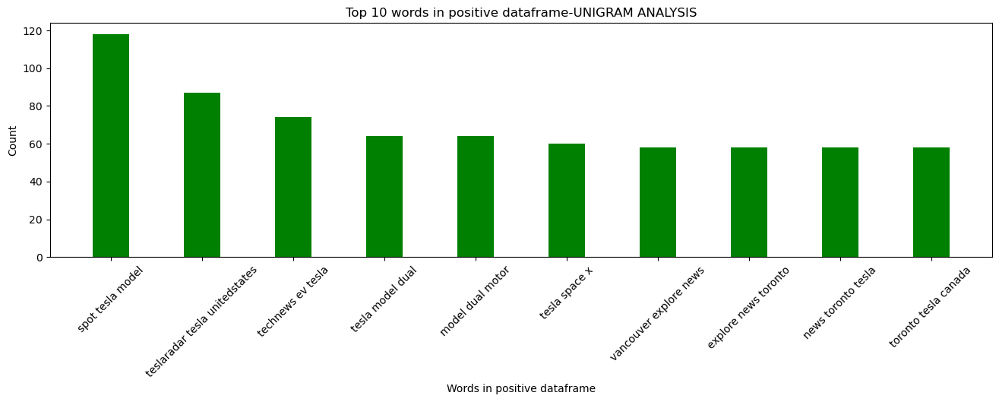

In [68]:
plt.figure(1,figsize=(16,4))
plt.bar(pd1,pd2, color ='green',
        width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.xticks(rotation = 45)
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-UNIGRAM ANALYSIS")
plt.savefig("positive-unigram.png")
plt.show()

In [69]:
ned1=df_negative[0][:10]
ned2=df_negative[1][:10]

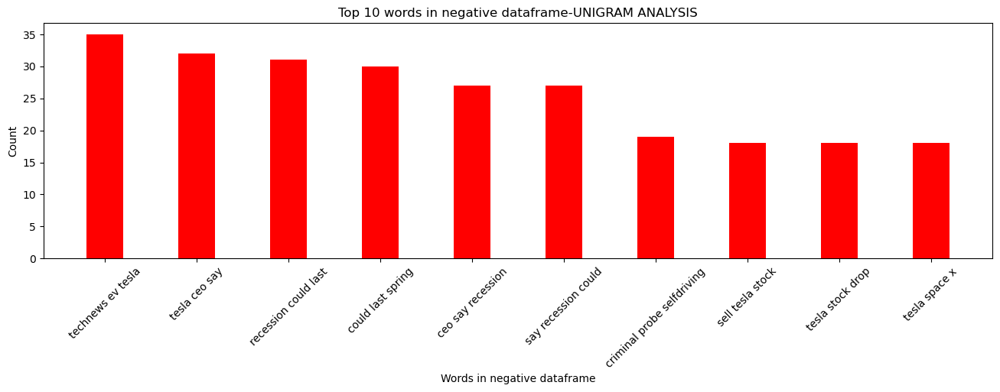

In [70]:
plt.figure(1,figsize=(16,4))
plt.bar(ned1,ned2, color ='red',
        width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.xticks(rotation = 45)
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-UNIGRAM ANALYSIS")
plt.savefig("negative-unigram.png")
plt.show()

In [71]:
nud1=df_neutral[0][:10]
nud2=df_neutral[1][:10]

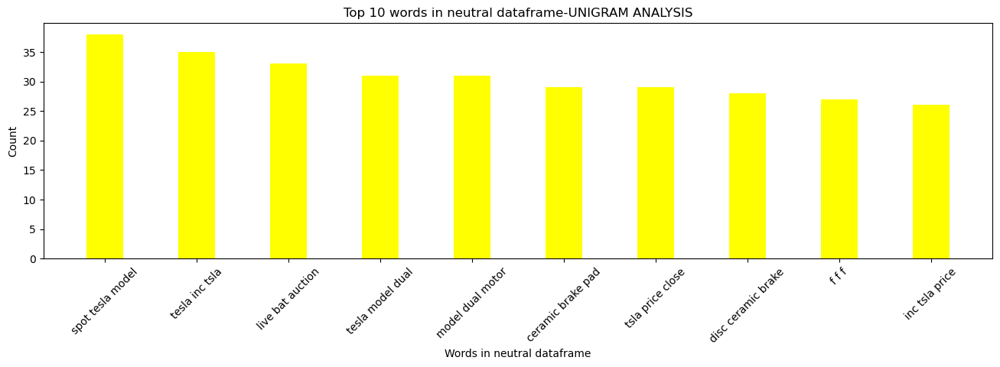

In [72]:
plt.figure(1,figsize=(16,4))
plt.bar(nud1,nud2, color ='yellow',
        width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.xticks(rotation = 45)
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-UNIGRAM ANALYSIS")
plt.savefig("neutral-unigram.png")
plt.show()

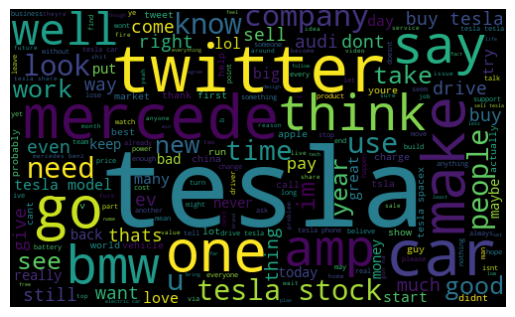

In [73]:
# Word cloud visualization.
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt

allWords = ' '.join([twts for twts in text_df['tweet']])
wordCloud = WordCloud(width=500, height=300, random_state=21, max_font_size=110).generate(allWords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [74]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [75]:
tf_vectorizer = CountVectorizer(max_df=0.9, min_df=25)
tf = tf_vectorizer.fit_transform(text_df['tweet'].values.astype('U'))
tf_feature_names = tf_vectorizer.get_feature_names()
doc_term_matrix = pd.DataFrame(tf.toarray(), columns=list(tf_feature_names))
doc_term_matrix

,aapl,ab,abandon,ability,able,absolute,absolutely,abuse,ac,accelerate,...,youll,young,youre,youtube,youve,yr,yup,zero,zone,zoom
0,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41737,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41738,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41739,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41740,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [76]:
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', random_state=0).fit(tf)
no_top_words = 10
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                          for i in topic.argsort()[:-no_top_words - 1:-1]]))
              
display_topics(lda_model, tf_feature_names, no_top_words)

Topic 0:
tesla stock year tsla ceo investor space via value say
Topic 1:
bmw ev mercedes lose driver last guy front amp own
Topic 2:
tesla go like would buy share much get many charge
Topic 3:
mercedes model thats apple ever right china mercedesbenz everyone always
Topic 4:
tesla drive want mercedes dont car im doesnt say bad
Topic 5:
tesla wait first stop news love turn state yeah spot
Topic 6:
twitter tesla get phone im work keep owner change spacex
Topic 7:
tesla money he new market start amp every get free
Topic 8:
tesla car audi sell vehicle electric price battery year best
Topic 9:
tesla one think make even still company need could get


In [77]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis.sklearn

C:\ProgramData\Anaconda3\lib\site-packages\past\builtins\misc.py:45: DeprecationWarning:

the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses



In [78]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, tf, tf_vectorizer, mds='mmds')
panel

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.041493  0.033280       1        1  15.404552
2      0.028832 -0.279702       2        1  13.799455
7     -0.289821 -0.134448       3        1  12.913539
4     -0.160871  0.233175       4        1  11.428148
8      0.267916 -0.322429       5        1   9.879880
6      0.379223 -0.061714       6        1   9.243979
1      0.033383  0.504836       7        1   7.225974
0     -0.209724 -0.392504       8        1   7.212257
3     -0.459050  0.182762       9        1   6.965348
5      0.368619  0.236743      10        1   5.926869, topic_info=          Term          Freq         Total Category  logprob  loglift
2269   twitter   3689.000000   3689.000000  Default  30.0000  30.0000
2150     tesla  29921.000000  29921.000000  Default  29.0000  29.0000
252        bmw   3213.000000   3213.000000  Default  28.0000  28.0000
2056     stock   2764.000000   2764.000000  Default  27.0000  27.0000
1377  mercedes   3586.000000   3586.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
334       cant    283.513551    950.253352  Topic10  -4.4640   1.6162
1171      isnt    194.024974    542.063489  Topic10  -4.8433   1.7983
1343    market    188.024834   1069.507928  Topic10  -4.8747   1.0873
1434      much    186.567798   1126.942062  Topic10  -4.8825   1.0272
1780  remember    165.216086    266.588684  Topic10  -5.0040   2.3472

[484 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
6        10  0.994558  absolutely
17        2  0.994813     account
30        4  0.994869          ad
48        1  0.998152      afford
55        1  0.026305         ago
...     ...       ...         ...
2448      9  0.001902        year
2451      5  0.998634         yes
2453      8  0.997994         yet
2459      1  0.998798       youre
2460      8  0.995746     youtube

[566 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 3, 8, 5, 9, 7, 2, 1, 4, 6])